<a href="https://colab.research.google.com/github/faamiri23/Cells/blob/master/2D_poison_Parameters.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
"""First we will train a standard neural network to interpolate a small part of the solution, using some observed training points from the solution.

Next, we will train a PINN to extrapolate the full solution outside of these training points by penalising the underlying differential equation in its loss function.
We train the PINN using PyTorch, using the following environment set up:
Environment set up
"""
from PIL import Image

import numpy as np
from math import pi
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import matplotlib.cm as cm


In [ ]:
!pip install torch --upgrade --force-reinstall

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.1/779.1 MB 472.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 67.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 63.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.9/176.9 kB 21.8 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.w

In [ ]:
def save_gif_PIL(outfile, files, fps=5, loop=0):
    "Helper function for saving GIFs"
    imgs = [Image.open(file) for file in files]
    imgs[0].save(fp=outfile, format='GIF', append_images=imgs[1:], save_all=True, duration=int(1000/fps), loop=loop)

def Exact_solution(x):
    """Defines the analytical solution """
    a_exact = 2.0
    b_exact = 3.0
    c_exact = 3.0
    n= x.shape[0]
    print(n)
    u = torch.zeros(n,1)
    u=-(a_exact/((b_exact**2+c_exact**2)*(pi**2)))*torch.sin(b_exact*pi*x[:,0])*torch.sin(c_exact*pi*x[:,1])
    return u

#class FCN(nn.Module): This defines a new class called FCN that inherits from nn.Module, which is the base class for all neural network modules in PyTorch.
class FCN(nn.Module):
      """Defines a fully connected network

      Attributes:
        fcs:
        fch:
        fce:
      """
    #Defines a connected network"

      def __init__(self, N_INPUT, N_OUTPUT, N_HIDDEN, N_LAYERS, TMIN=0, TMAX=1):
        super().__init__() #Calls the initializer of the parent class nn.Module.
        activation = nn.Tanh
        self.scale = lambda T: (T - TMIN) / (TMAX - TMIN)  # scale to [0, 1]
        # First layer
        # nn.Sequential: A sequential container that processes a sequence of layers in order.
        #The * operator unpacks the list so that its elements are passed as separate arguments.
        #The unpacked elements of the list are passed as separate arguments to the nn.Sequential constructor.
        #This results in nn.Sequential receiving the linear layer and the activation function as separate modules to be applied sequentially.
        #nn.Sequential(nn.Linear(N_INPUT, N_HIDDEN), activation())
        # If you didn't use the * operator, you would pass the list itself as a single argument to nn.Sequential, which is not what is intended. In this case, nn.Sequential would treat the list as a single module, which would raise an error because nn.Sequential expects its arguments to be modules, not a list of modules.
        #Why Use *? The use of * is particularly useful when you have a dynamically generated list of layers or modules and you want to pass them as separate arguments to a function or constructor. It makes the code more flexible and readable.
        self.fcs = nn.Sequential(*[
                        nn.Linear(N_INPUT, N_HIDDEN),
                        activation()])
        # Hidden layers
        #nn.Sequential is a module provided by PyTorch's torch.nn library, designed to facilitate the creation of neural networks. It allows you to create a container of modules (layers) that are added sequentially. This means the output of one module will be the input to the next.
        self.fch = nn.Sequential(*[
                        nn.Sequential(*[
                            nn.Linear(N_HIDDEN, N_HIDDEN),
                            activation()]) for _ in range(N_LAYERS-1)])
        # Output layer
        self.fce = nn.Linear(N_HIDDEN, N_OUTPUT)
        # initial estimate for unkown parameters
        self.a = nn.Parameter(torch.tensor(0.3))
        self.b = nn.Parameter(torch.tensor(1.0))
        self.c = nn.Parameter(torch.tensor(1.0))

      def forward(self, x):
        x = self.scale(x)
        x = self.fcs(x)
        x = self.fch(x)
        x = self.fce(x)
        return x


10000
torch.Size([800]) torch.Size([800]) torch.Size([800, 1])
torch.Size([800]) torch.Size([800]) torch.Size([800, 2])


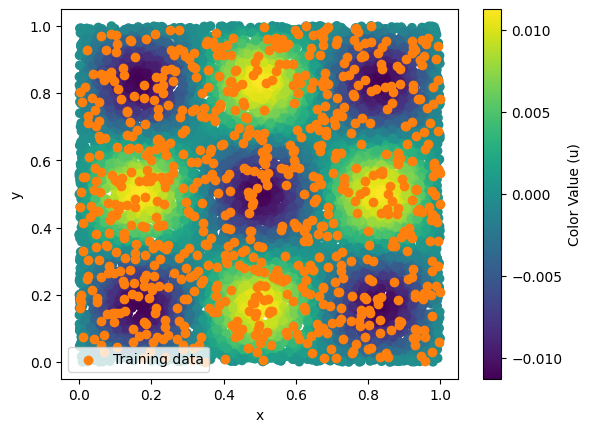

In [ ]:
# get the analytical solution over the full domain
N=10000
X = torch.rand(N,2) # nx2, x=x[;,0], y=x[:,1]

#x[:,1]=1


u = Exact_solution(X).view(-1,1)
x = X[:,0]
y = X[:,1]

# slice out a small number of points from the LHS of the domain
x_data = x[0:800:1]
y_data = y[0:800:1]
u_data = u[0:800:1]
print(x_data.shape, y_data.shape, u_data.shape)
X_data = torch.stack((x_data, y_data), dim=1) # stack: Concatenates a sequence of tensors along a new dimension.
#u_data = u[0:600:10]
#print(y_data)
print(x_data.shape, y_data.shape, X_data.shape )
weights = torch.ones_like(x) * (1.0 / (N**2))

plt.figure()
#plt.plot(x[:,0], x[:,1], label="Exact solution")
#fig, ax = plt.subplots()
#im = ax.imshow(u, interpolation='bilinear', cmap=cm.RdYlGn,
#               origin='lower', extent=[0, 1, 0, 1],
#               vmax=abs(u).max(), vmin=-abs(u).max())
plt.scatter(X[:, 0], X[:, 1], c=u, cmap='viridis')
plt.colorbar(label='Color Value (u)')

plt.scatter(x_data, y_data, color="tab:orange", label="Training data")
plt.legend()
plt.xlabel("x")
plt.ylabel("y")
plt.show()

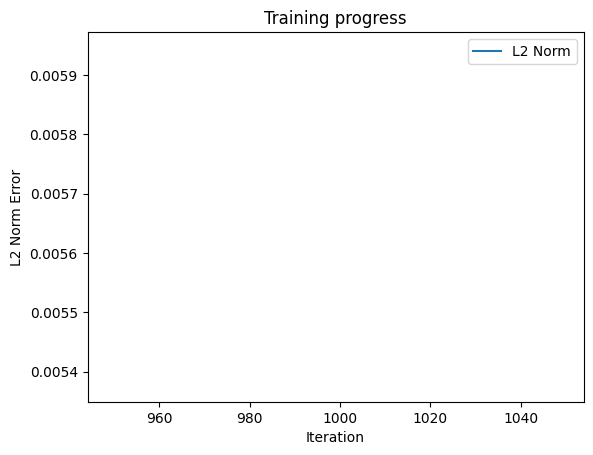

Predicted a: 0.2899349629878998
Predicted b: 1.0102781057357788
Predicted c: 1.0098358392715454


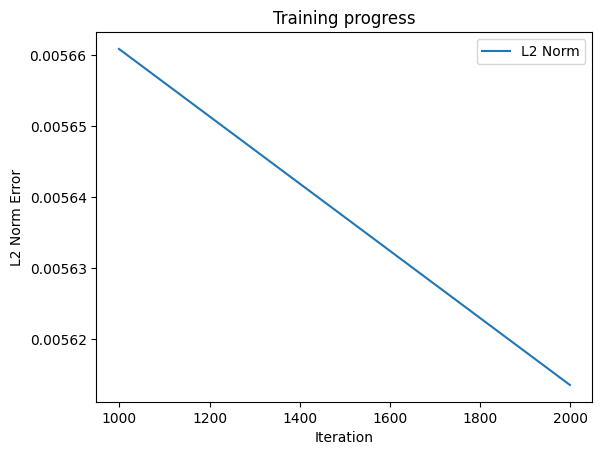

Predicted a: 0.2801602780818939
Predicted b: 1.02005136013031
Predicted c: 1.019352912902832


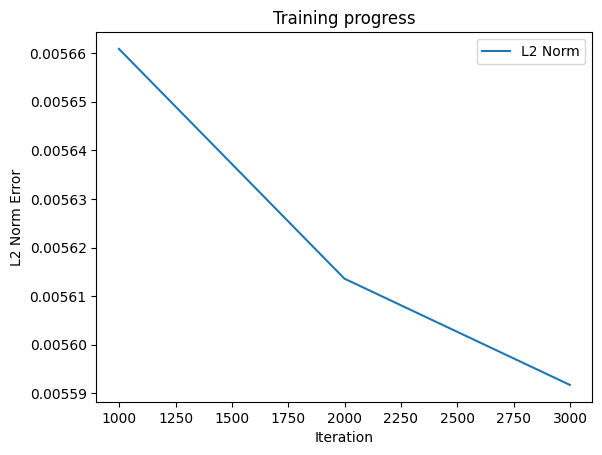

Predicted a: 0.27052950859069824
Predicted b: 1.0294880867004395
Predicted c: 1.0287214517593384


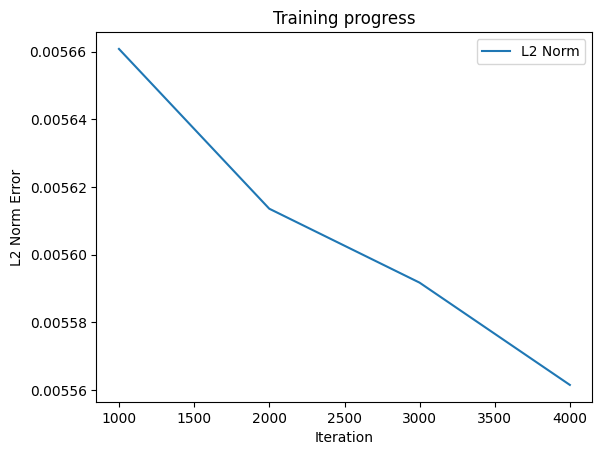

Predicted a: 0.2609825134277344
Predicted b: 1.0387345552444458
Predicted c: 1.037956953048706


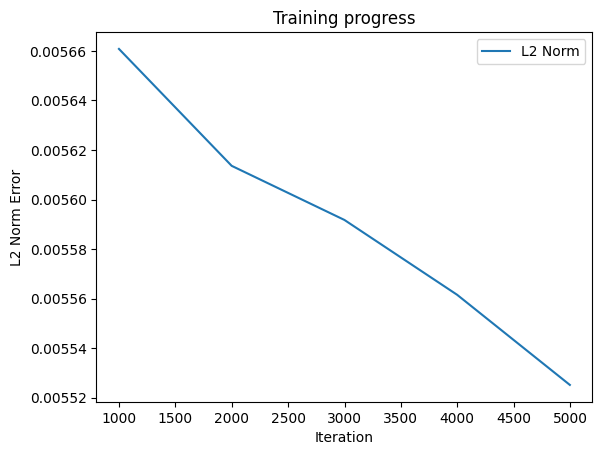

Predicted a: 0.25148820877075195
Predicted b: 1.047860860824585
Predicted c: 1.0470730066299438


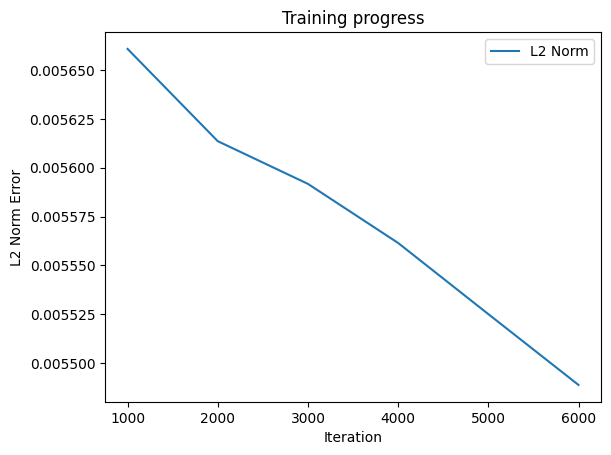

Predicted a: 0.24202901124954224
Predicted b: 1.0569026470184326
Predicted c: 1.05607271194458


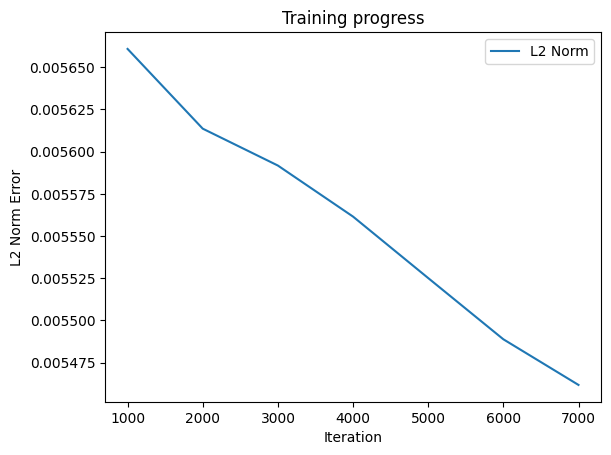

Predicted a: 0.23260053992271423
Predicted b: 1.0658433437347412
Predicted c: 1.0649529695510864


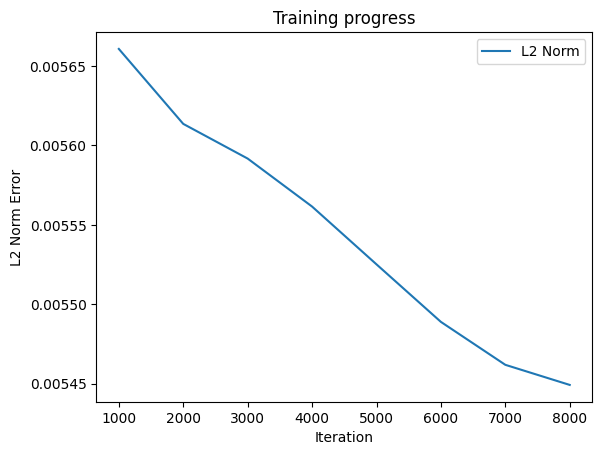

Predicted a: 0.22320014238357544
Predicted b: 1.0747243165969849
Predicted c: 1.0737130641937256


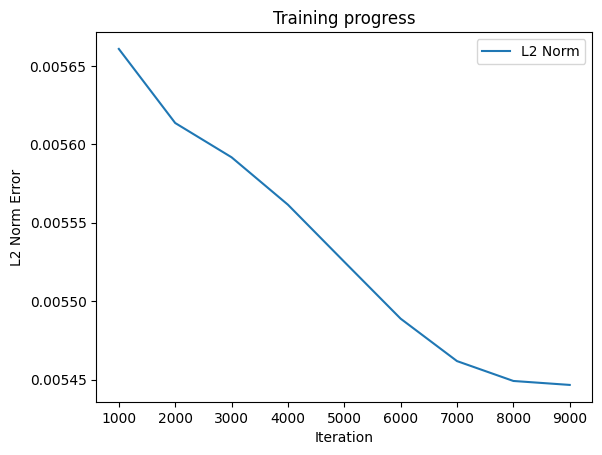

Predicted a: 0.21382561326026917
Predicted b: 1.0835458040237427
Predicted c: 1.0823646783828735


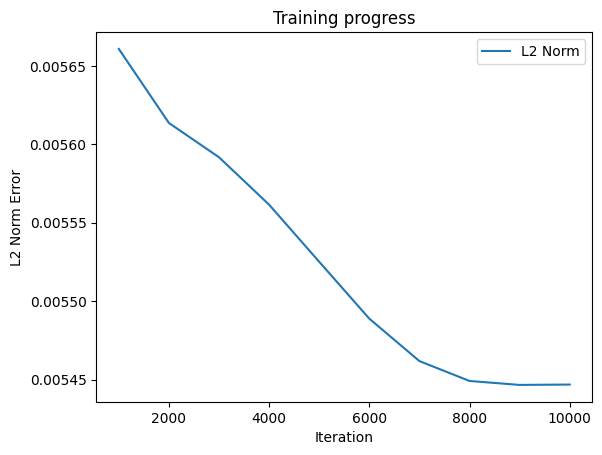

Predicted a: 0.20446768403053284
Predicted b: 1.0923672914505005
Predicted c: 1.0909477472305298


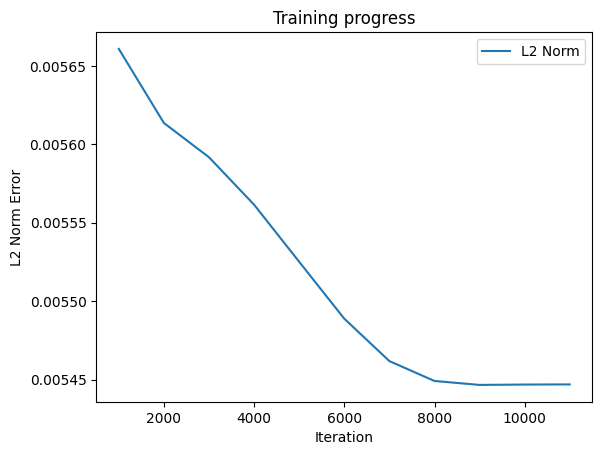

Predicted a: 0.19510424137115479
Predicted b: 1.1011887788772583
Predicted c: 1.099530816078186


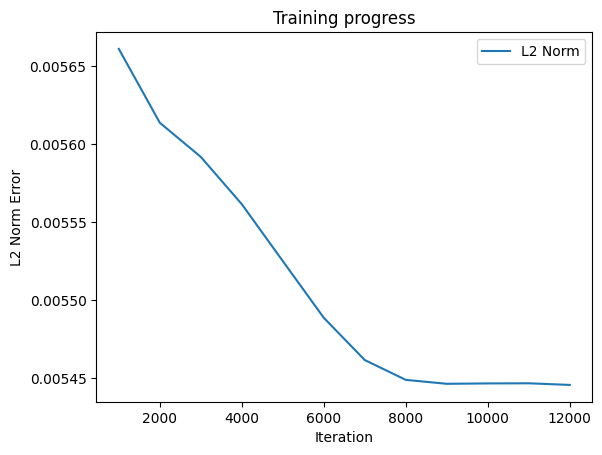

Predicted a: 0.18570426106452942
Predicted b: 1.1100102663040161
Predicted c: 1.1081138849258423


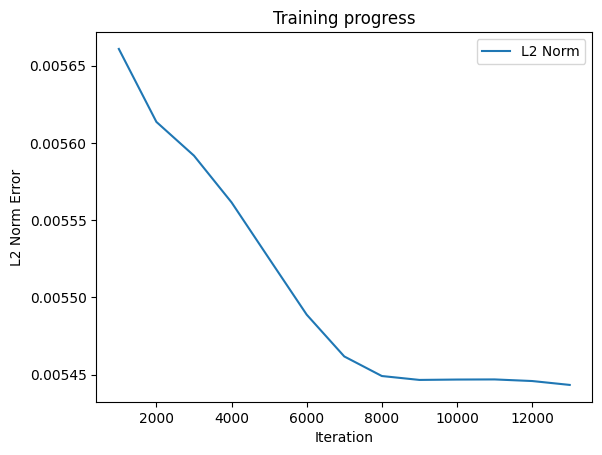

Predicted a: 0.1762603223323822
Predicted b: 1.118831753730774
Predicted c: 1.1166969537734985


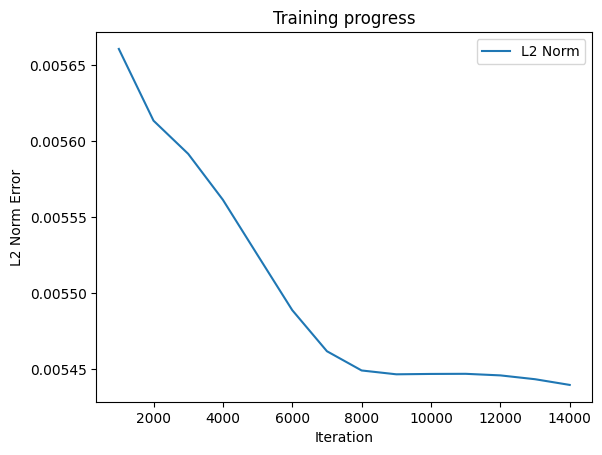

Predicted a: 0.16679632663726807
Predicted b: 1.1276441812515259
Predicted c: 1.1252800226211548


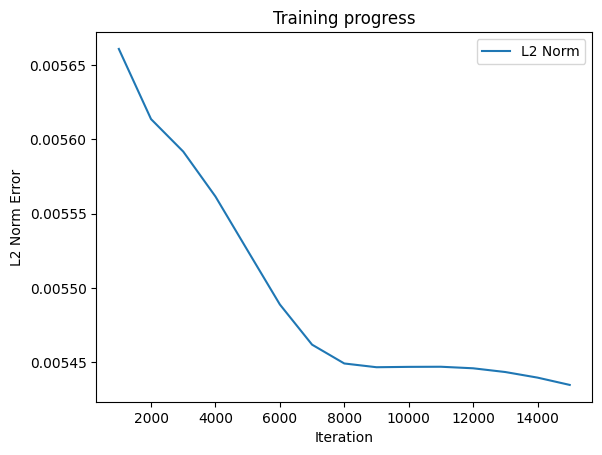

Predicted a: 0.15732558071613312
Predicted b: 1.136346459388733
Predicted c: 1.133863091468811


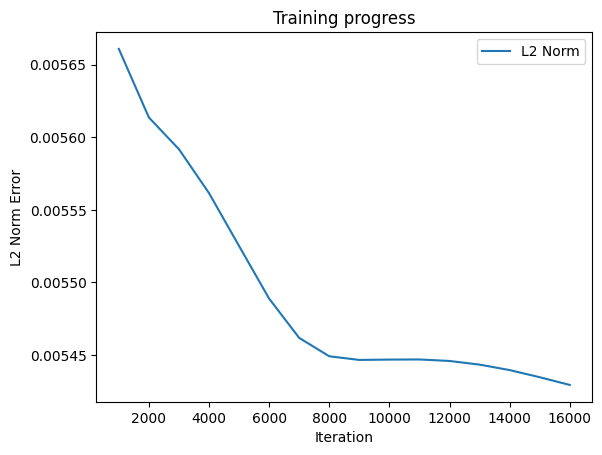

Predicted a: 0.14786599576473236
Predicted b: 1.1449345350265503
Predicted c: 1.1424461603164673


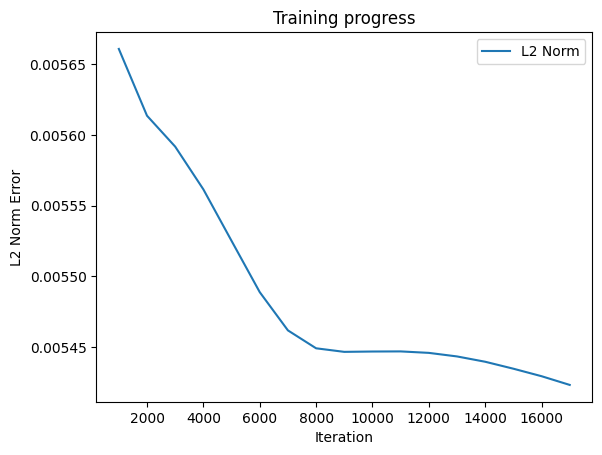

Predicted a: 0.13842344284057617
Predicted b: 1.153450846672058
Predicted c: 1.1509170532226562


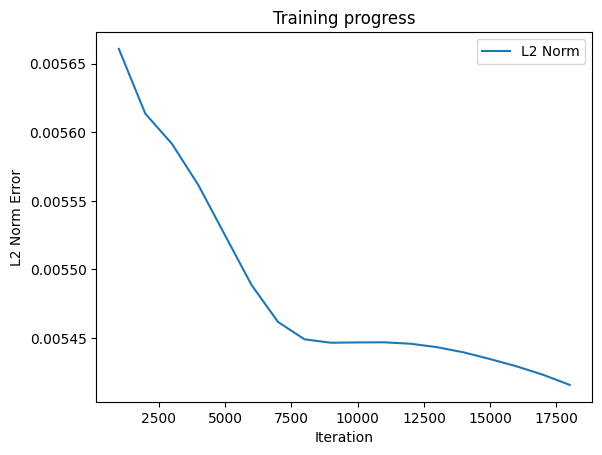

Predicted a: 0.12900033593177795
Predicted b: 1.1618815660476685
Predicted c: 1.159455418586731


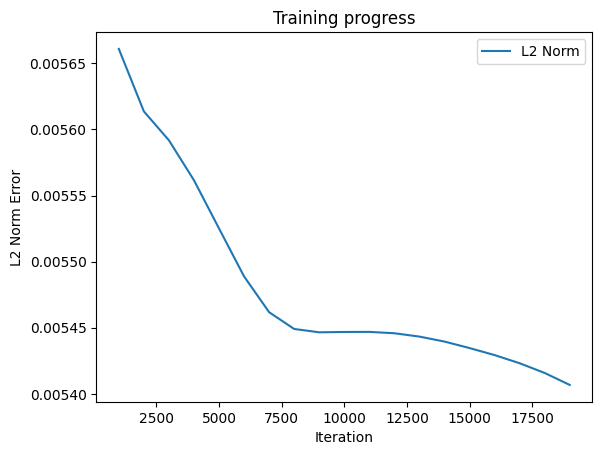

Predicted a: 0.11960625648498535
Predicted b: 1.1701997518539429
Predicted c: 1.1680384874343872


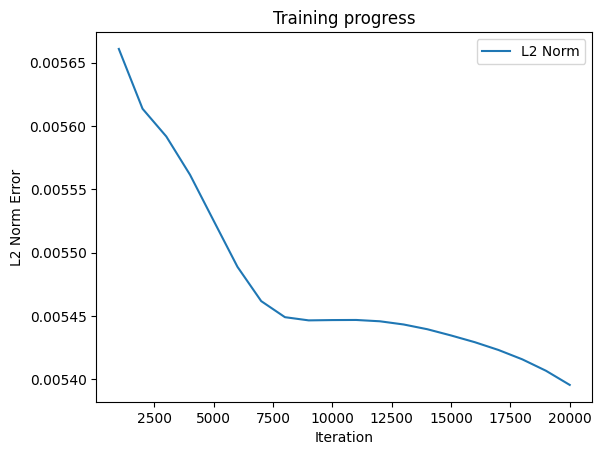

Predicted a: 0.1102479100227356
Predicted b: 1.1783920526504517
Predicted c: 1.176655888557434


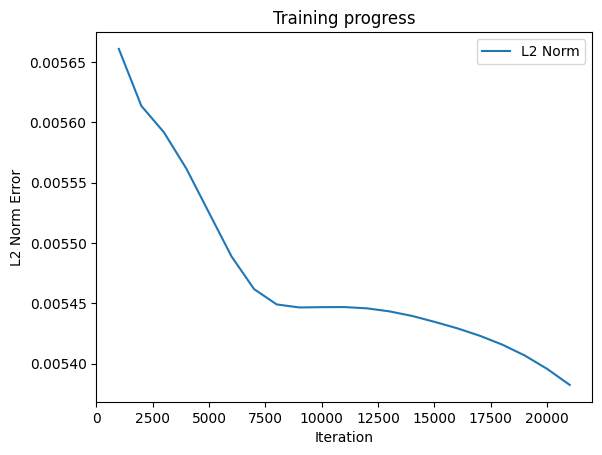

Predicted a: 0.10093487799167633
Predicted b: 1.1864559650421143
Predicted c: 1.1853581666946411


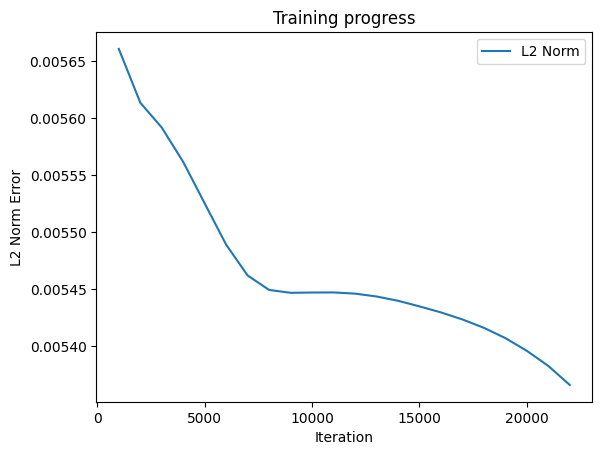

Predicted a: 0.09167774021625519
Predicted b: 1.1944113969802856
Predicted c: 1.1940604448318481


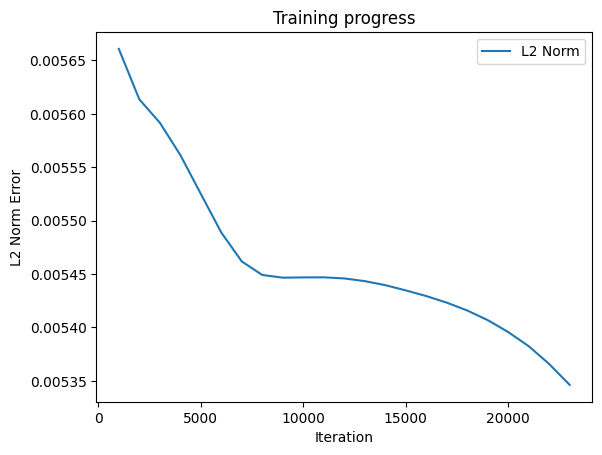

Predicted a: 0.08249083906412125
Predicted b: 1.2022792100906372
Predicted c: 1.2027627229690552


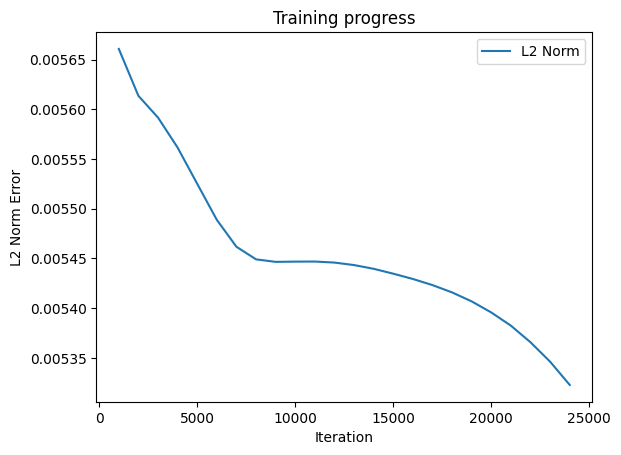

Predicted a: 0.07339813560247421
Predicted b: 1.2100695371627808
Predicted c: 1.2113975286483765


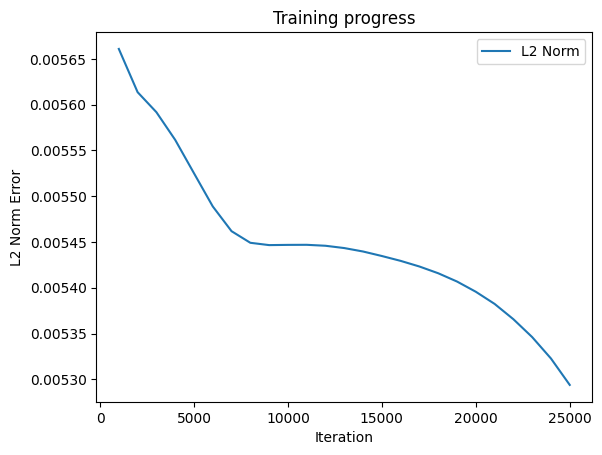

Predicted a: 0.06443961709737778
Predicted b: 1.2178181409835815
Predicted c: 1.2199805974960327


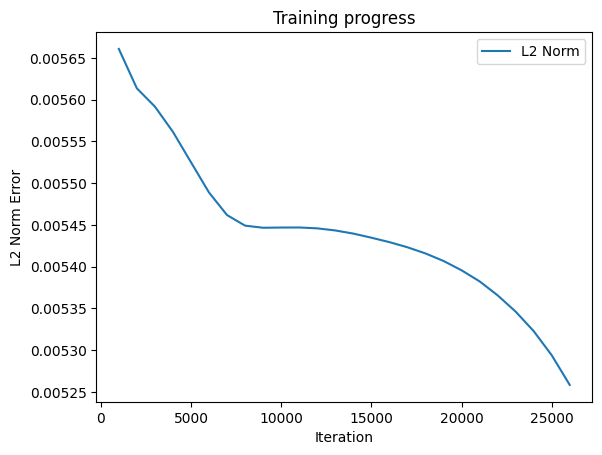

Predicted a: 0.05568446218967438
Predicted b: 1.2255667448043823
Predicted c: 1.2284849882125854


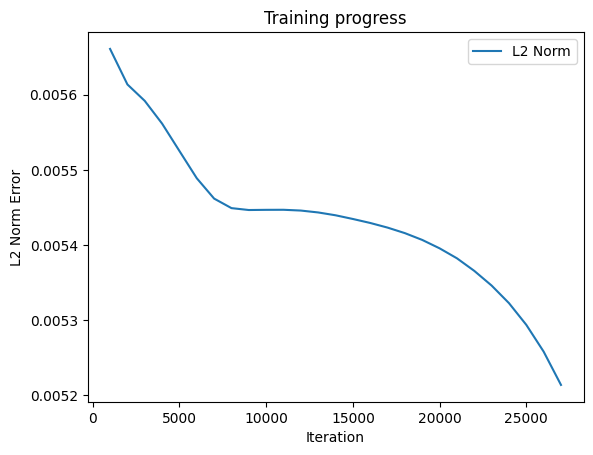

Predicted a: 0.04724251851439476
Predicted b: 1.2333604097366333
Predicted c: 1.236948847770691


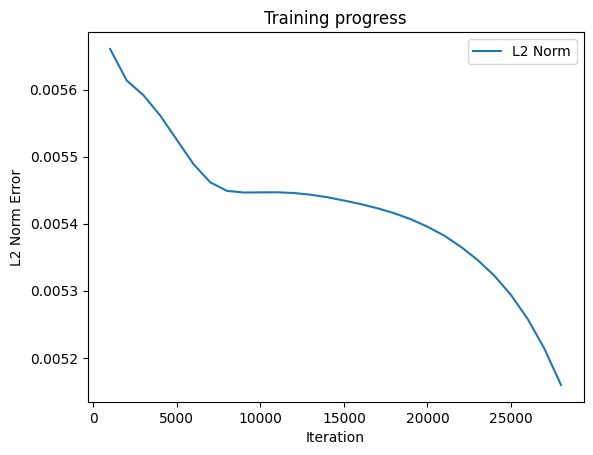

Predicted a: 0.03932138532400131
Predicted b: 1.24135422706604
Predicted c: 1.2454127073287964


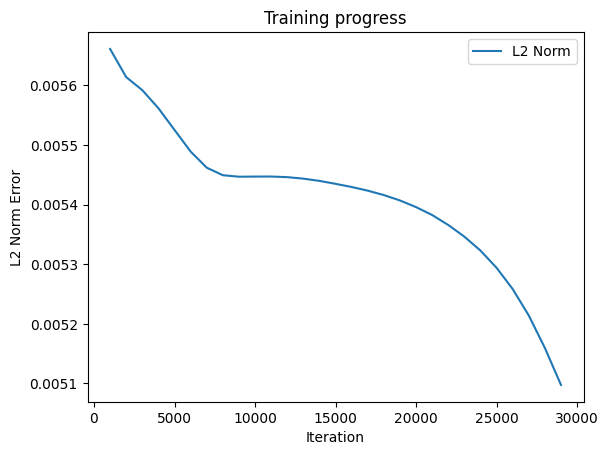

Predicted a: 0.03231649845838547
Predicted b: 1.2496570348739624
Predicted c: 1.2538765668869019


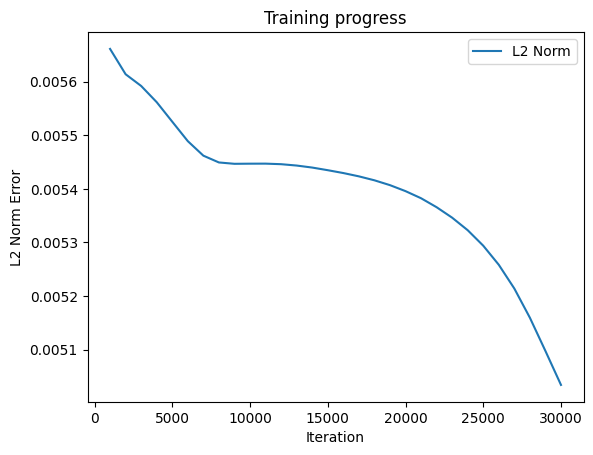

Predicted a: 0.026985689997673035
Predicted b: 1.258298635482788
Predicted c: 1.2623971700668335


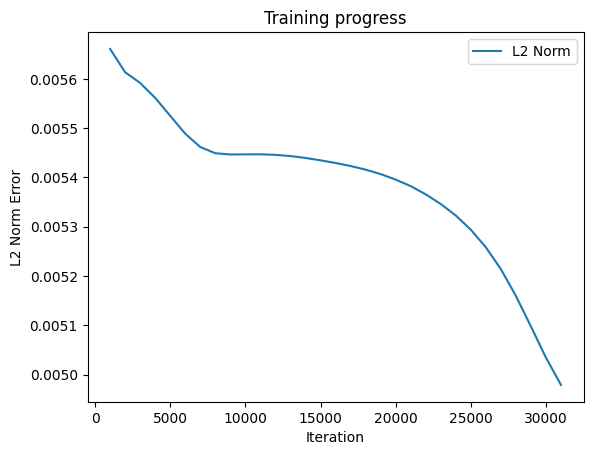

Predicted a: 0.02485308237373829
Predicted b: 1.267395257949829
Predicted c: 1.2711917161941528


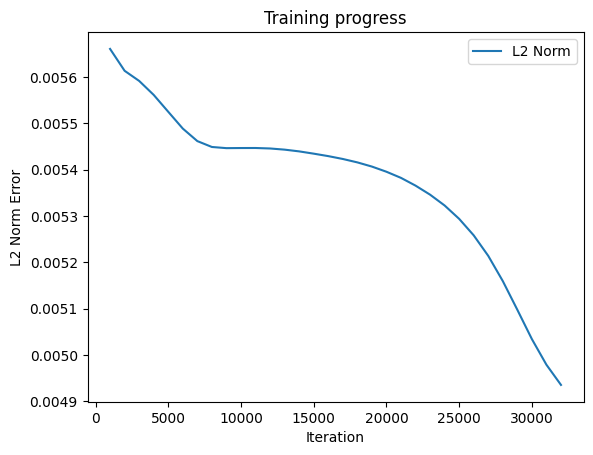

Predicted a: 0.02822836861014366
Predicted b: 1.277457594871521
Predicted c: 1.280910611152649


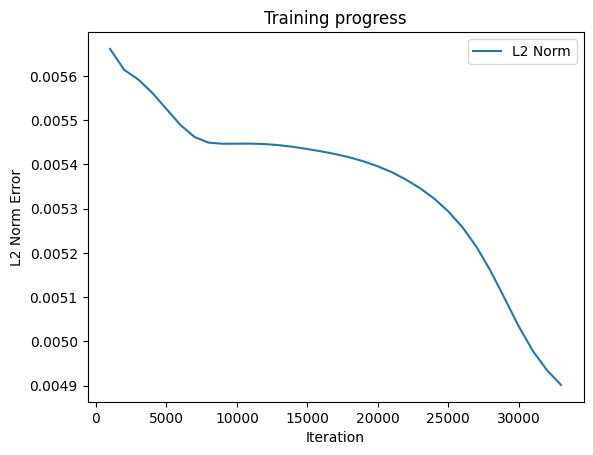

Predicted a: 0.036482810974121094
Predicted b: 1.288708209991455
Predicted c: 1.2919154167175293


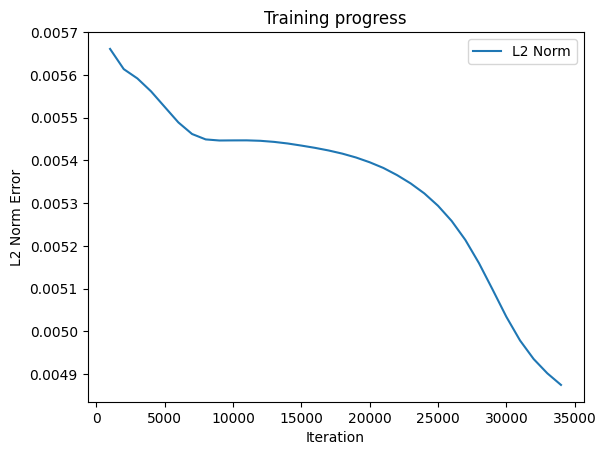

Predicted a: 0.04568183422088623
Predicted b: 1.300239086151123
Predicted c: 1.3033398389816284


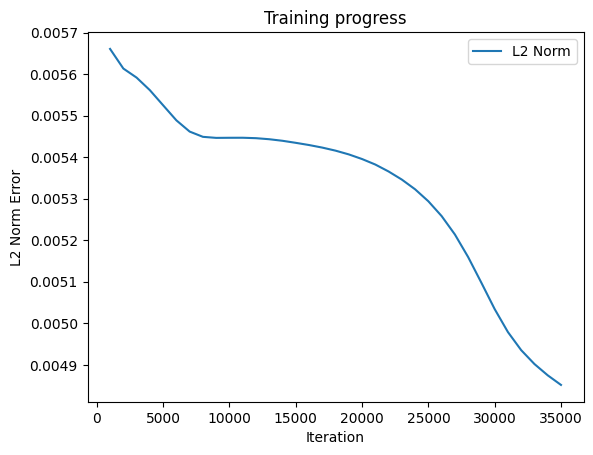

Predicted a: 0.054104942828416824
Predicted b: 1.3114652633666992
Predicted c: 1.3144887685775757


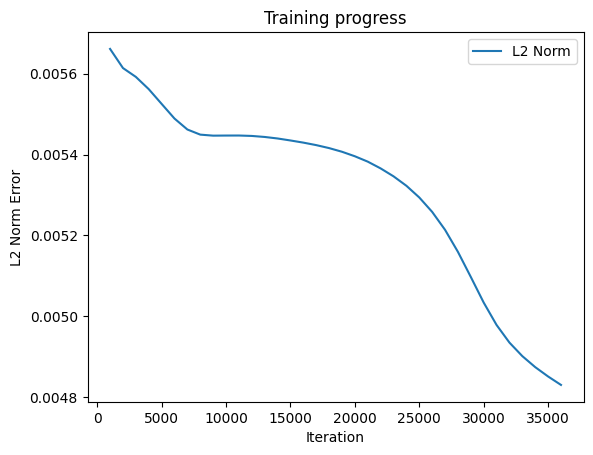

Predicted a: 0.06145124509930611
Predicted b: 1.3223210573196411
Predicted c: 1.3252569437026978


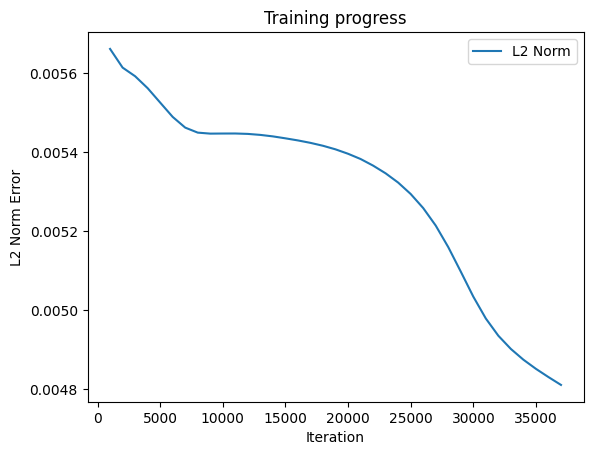

Predicted a: 0.06768731772899628
Predicted b: 1.3329018354415894
Predicted c: 1.3357139825820923


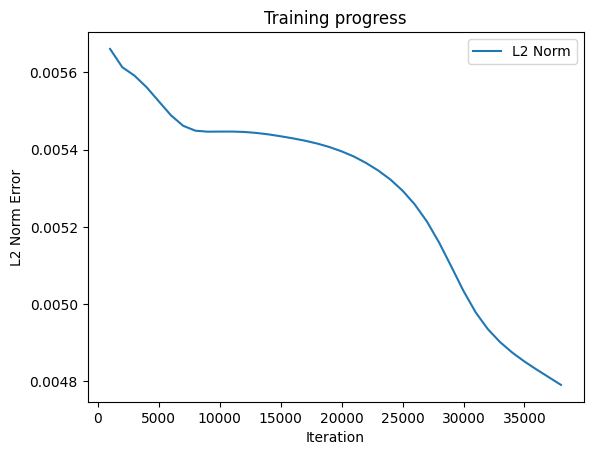

Predicted a: 0.07288184762001038
Predicted b: 1.3432995080947876
Predicted c: 1.3459234237670898


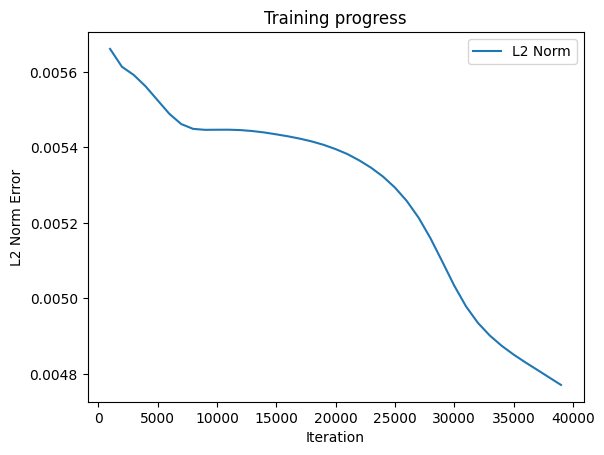

Predicted a: 0.07723869383335114
Predicted b: 1.3535622358322144
Predicted c: 1.3559730052947998


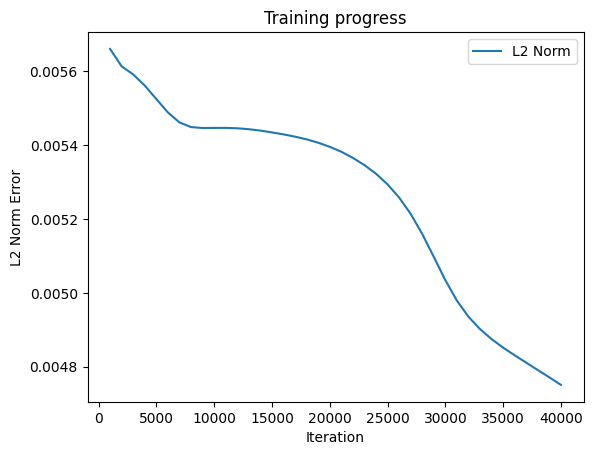

Predicted a: 0.08091320097446442
Predicted b: 1.3637620210647583
Predicted c: 1.3658910989761353


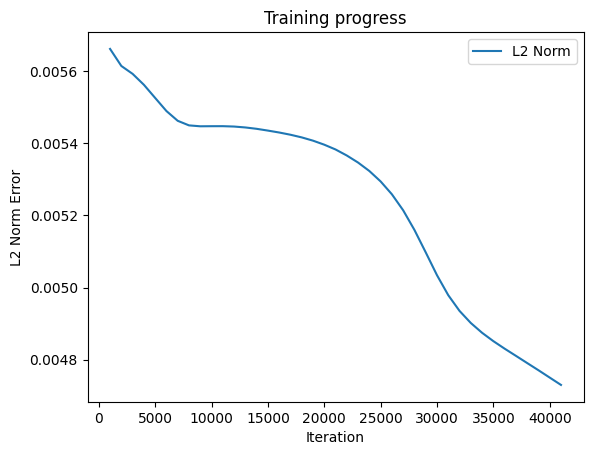

Predicted a: 0.08382807672023773
Predicted b: 1.373894214630127
Predicted c: 1.3756868839263916


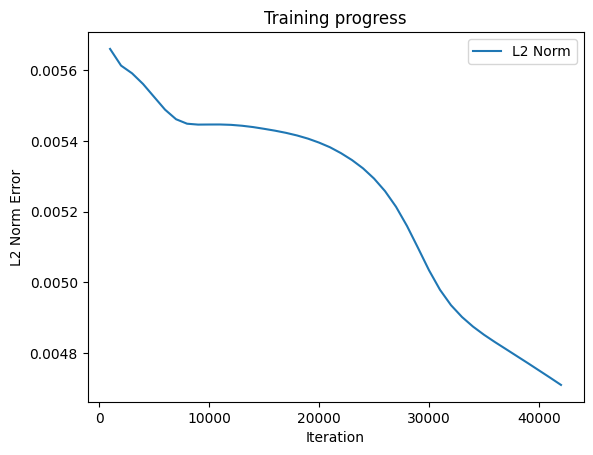

Predicted a: 0.08582323044538498
Predicted b: 1.3839010000228882
Predicted c: 1.38534414768219


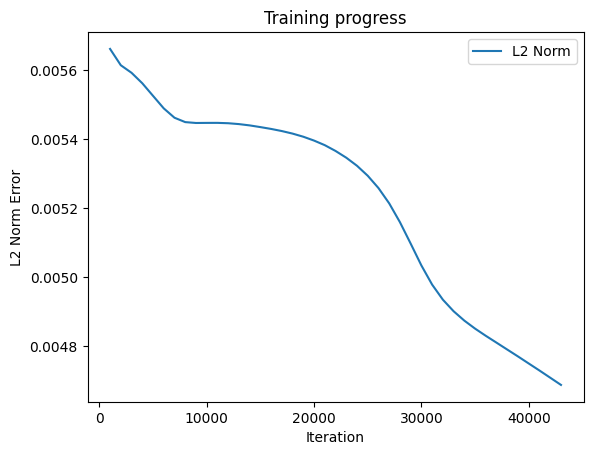

Predicted a: 0.0871569812297821
Predicted b: 1.393795371055603
Predicted c: 1.3948553800582886


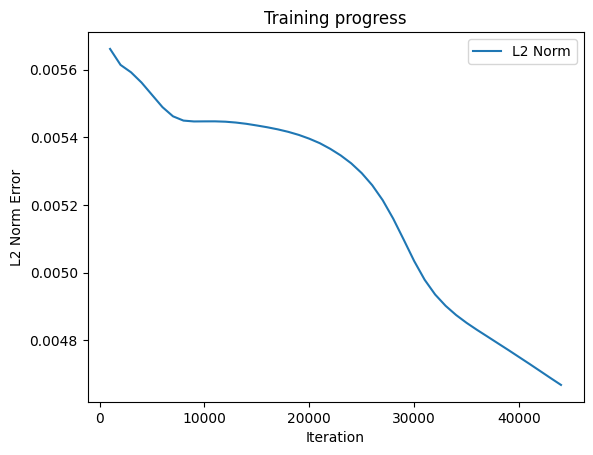

Predicted a: 0.08808394521474838
Predicted b: 1.4035738706588745
Predicted c: 1.4042729139328003


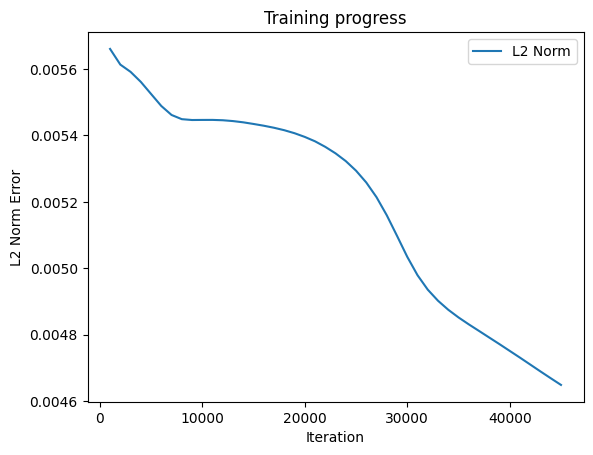

Predicted a: 0.08871466666460037
Predicted b: 1.4133003950119019
Predicted c: 1.413571834564209


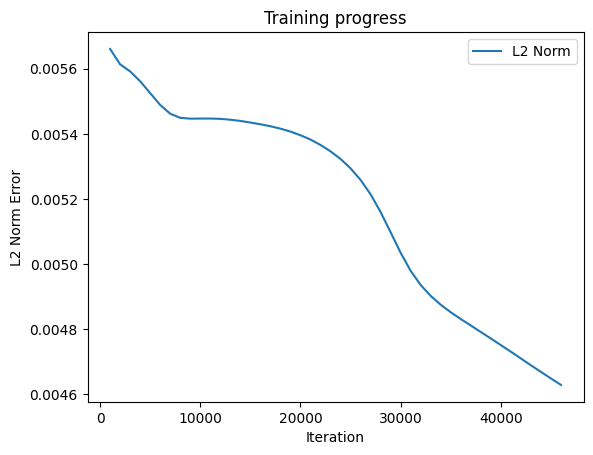

Predicted a: 0.08909890800714493
Predicted b: 1.4229563474655151
Predicted c: 1.4227839708328247


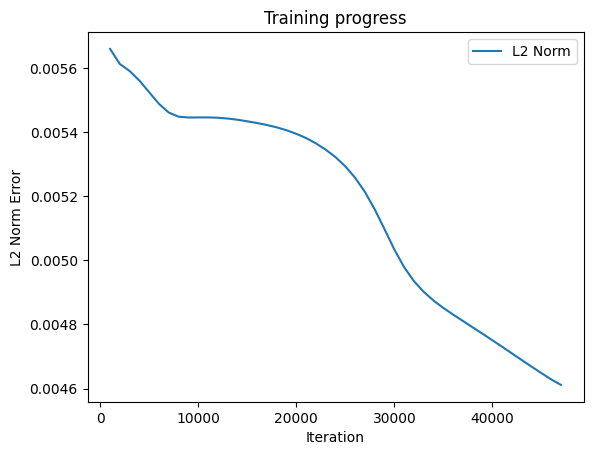

Predicted a: 0.08934979140758514
Predicted b: 1.4326122999191284
Predicted c: 1.4319287538528442


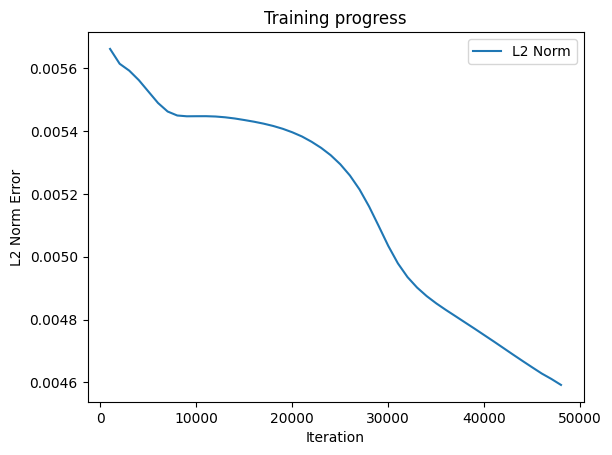

Predicted a: 0.08950681239366531
Predicted b: 1.442178726196289
Predicted c: 1.4409886598587036


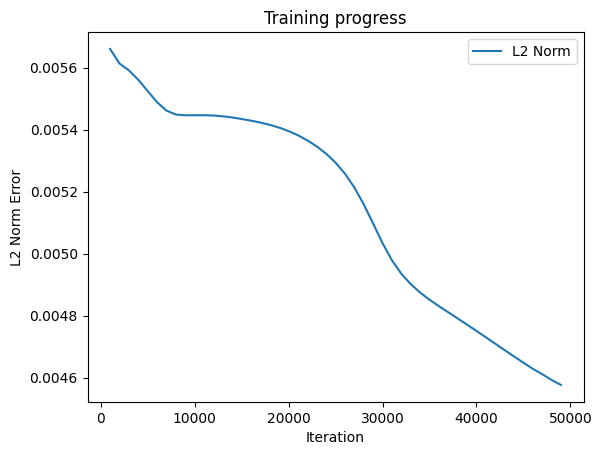

Predicted a: 0.08958511054515839
Predicted b: 1.4517154693603516
Predicted c: 1.4499554634094238


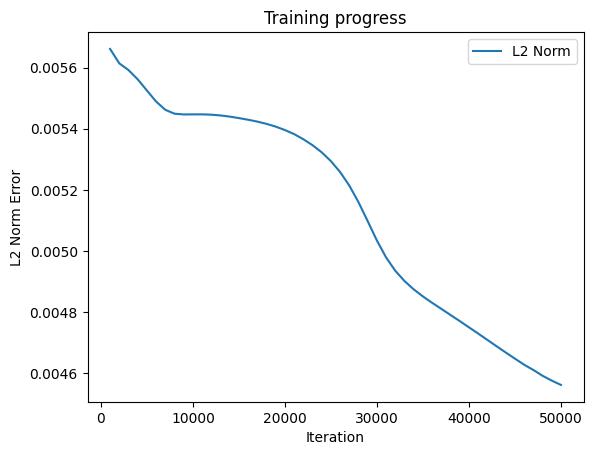

Predicted a: 0.08963983505964279
Predicted b: 1.461252212524414
Predicted c: 1.4588688611984253


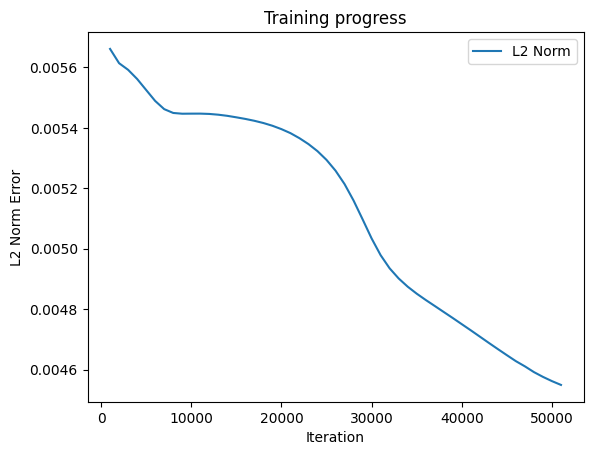

Predicted a: 0.08966806530952454
Predicted b: 1.4707889556884766
Predicted c: 1.467690348625183


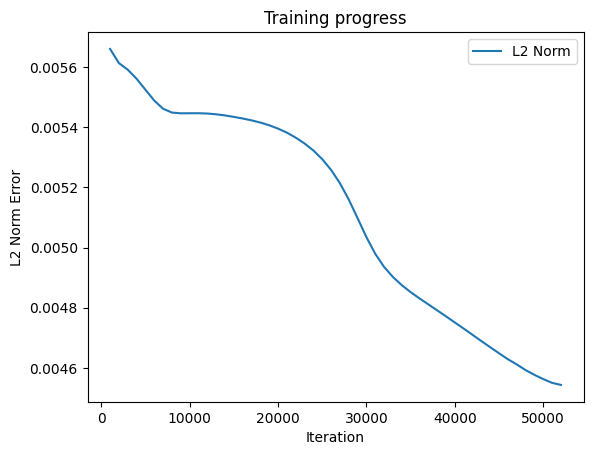

Predicted a: 0.08965995162725449
Predicted b: 1.4802714586257935
Predicted c: 1.4764068126678467


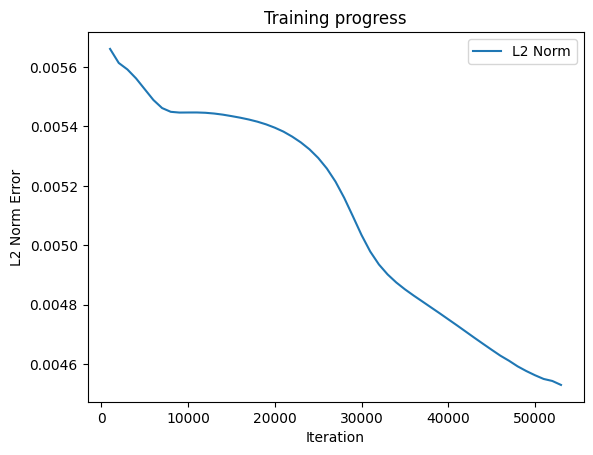

Predicted a: 0.08960305899381638
Predicted b: 1.4896889925003052
Predicted c: 1.4850380420684814


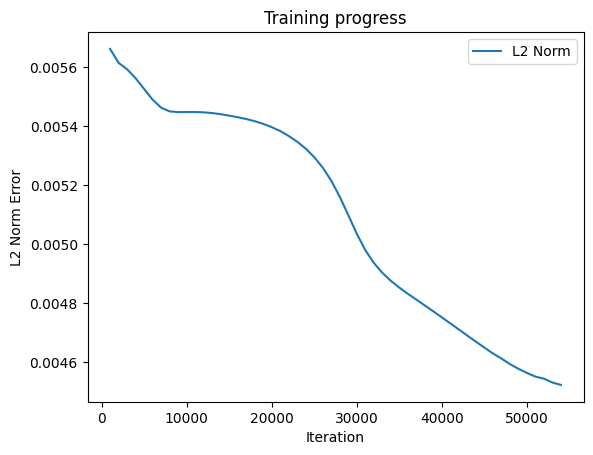

Predicted a: 0.08944305032491684
Predicted b: 1.499106526374817
Predicted c: 1.4935556650161743


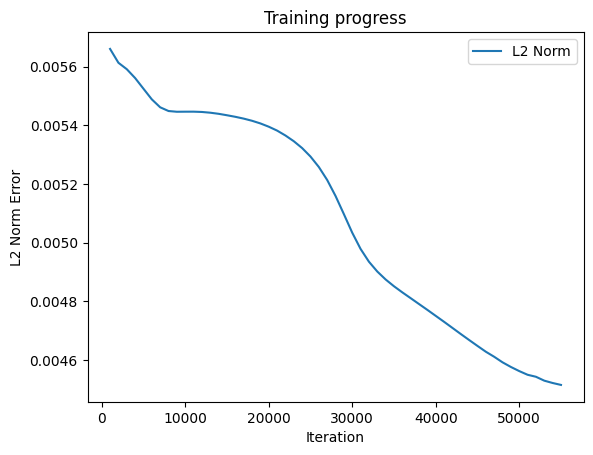

Predicted a: 0.08919984847307205
Predicted b: 1.5085240602493286
Predicted c: 1.501944661140442


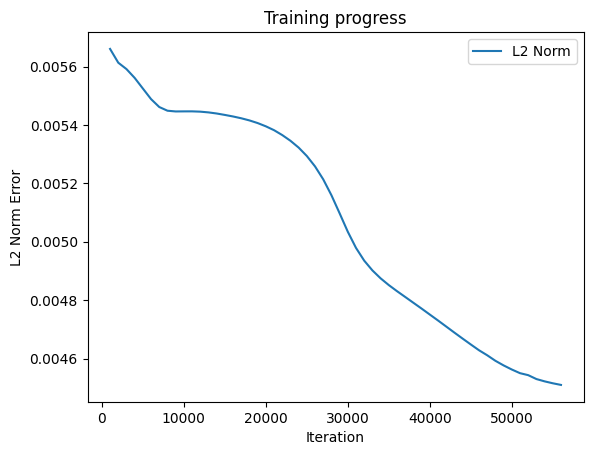

Predicted a: 0.08884076029062271
Predicted b: 1.5179415941238403
Predicted c: 1.510198712348938


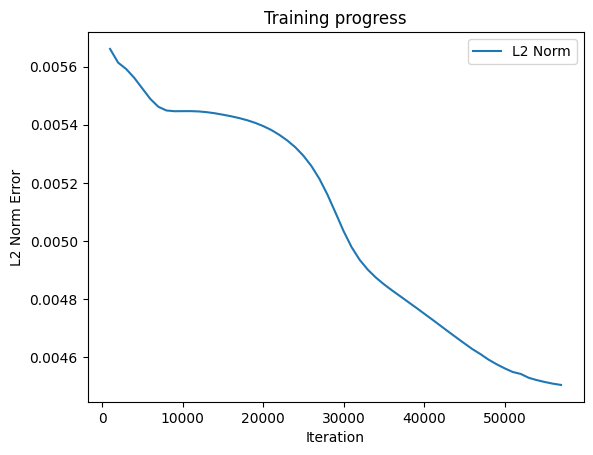

Predicted a: 0.0883680060505867
Predicted b: 1.527359127998352
Predicted c: 1.5182737112045288


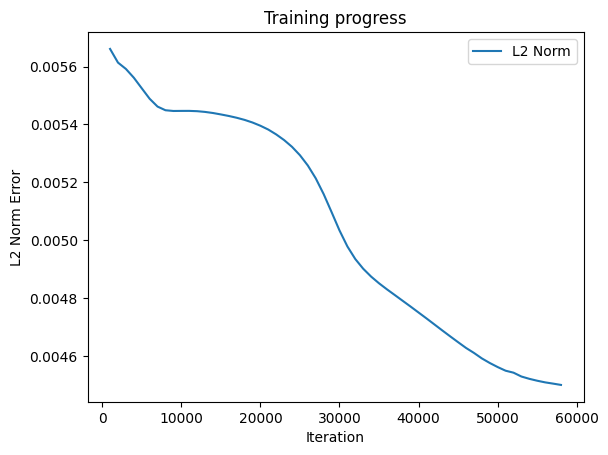

Predicted a: 0.08779836446046829
Predicted b: 1.5367766618728638
Predicted c: 1.5261921882629395


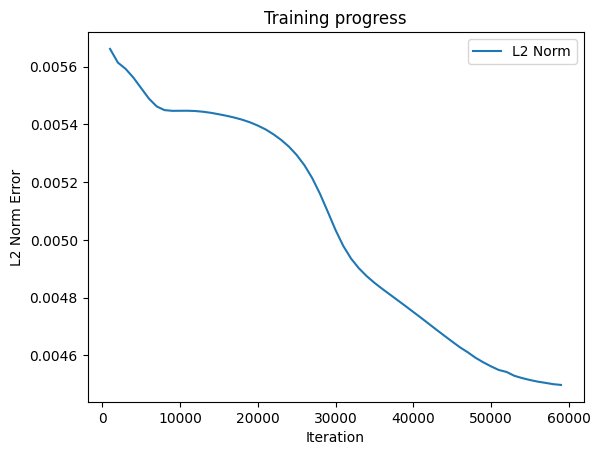

Predicted a: 0.08711789548397064
Predicted b: 1.5461764335632324
Predicted c: 1.5339223146438599


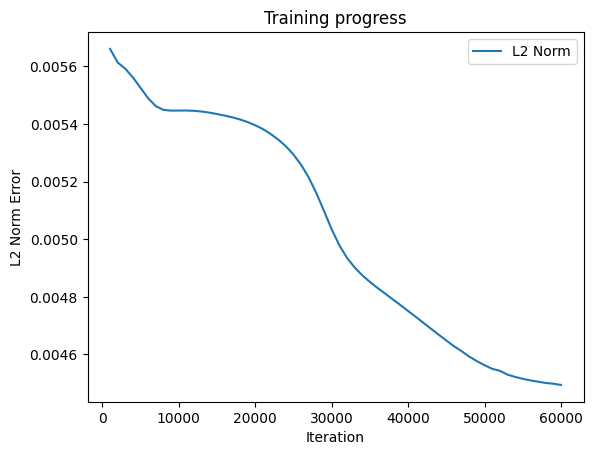

Predicted a: 0.08634313195943832
Predicted b: 1.555474877357483
Predicted c: 1.5414676666259766


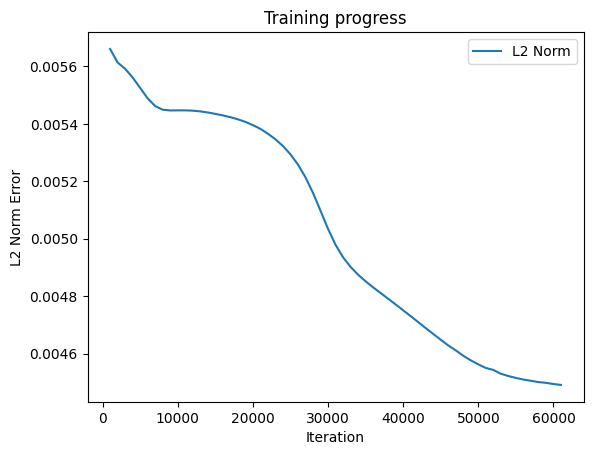

Predicted a: 0.0854727029800415
Predicted b: 1.5647732019424438
Predicted c: 1.5488011837005615


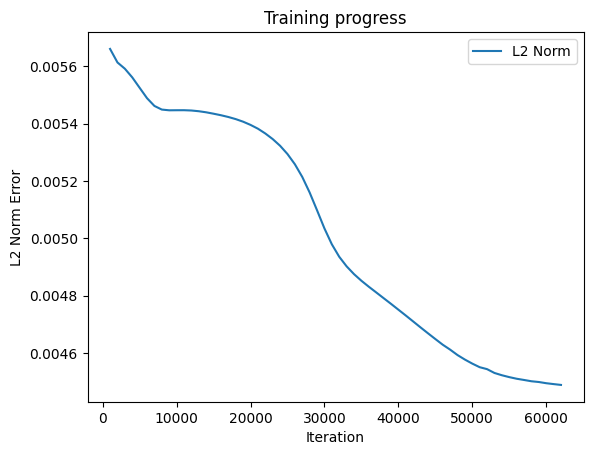

Predicted a: 0.08456316590309143
Predicted b: 1.5740715265274048
Predicted c: 1.555920958518982


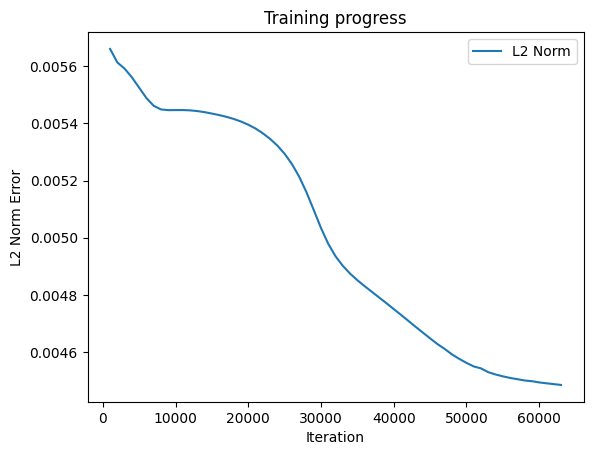

Predicted a: 0.08363384008407593
Predicted b: 1.5834256410598755
Predicted c: 1.5628430843353271


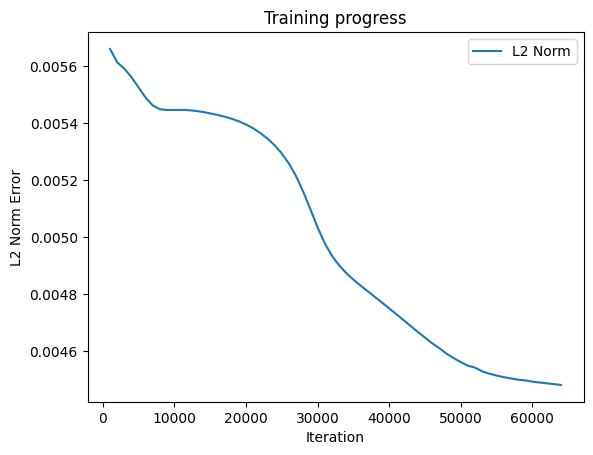

Predicted a: 0.08268282562494278
Predicted b: 1.5928431749343872
Predicted c: 1.5695708990097046


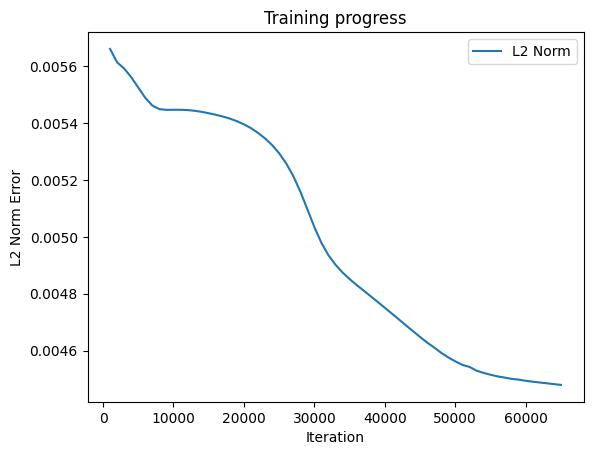

Predicted a: 0.08172912150621414
Predicted b: 1.602260708808899
Predicted c: 1.5761165618896484


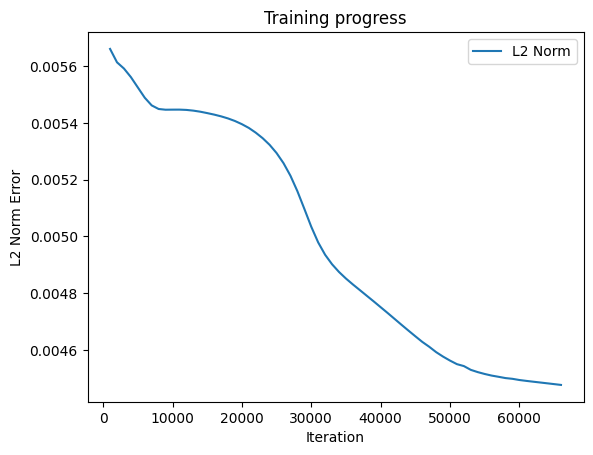

Predicted a: 0.0808093473315239
Predicted b: 1.6116782426834106
Predicted c: 1.5825210809707642


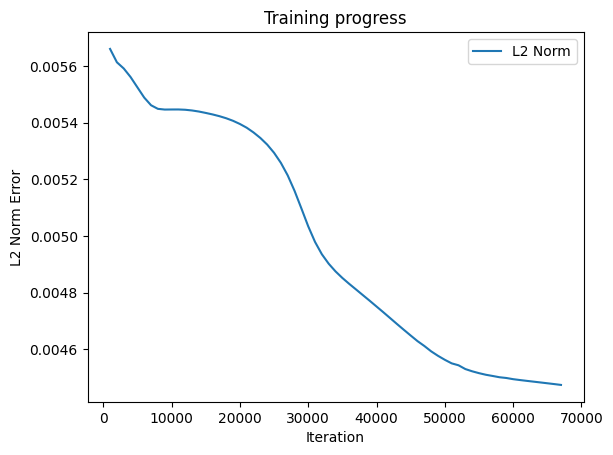

Predicted a: 0.07991262525320053
Predicted b: 1.6210957765579224
Predicted c: 1.5888391733169556


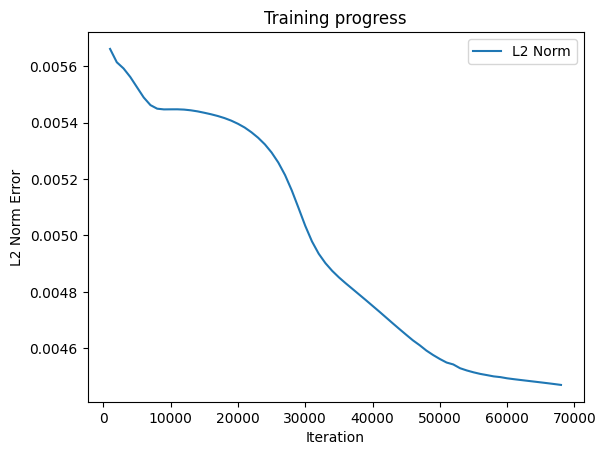

Predicted a: 0.07904139161109924
Predicted b: 1.630513310432434
Predicted c: 1.595157265663147


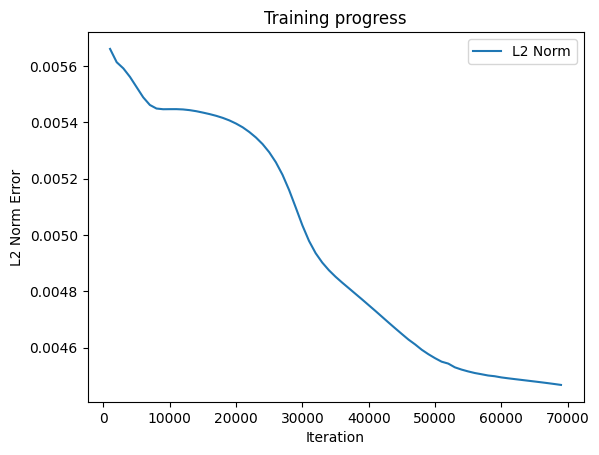

Predicted a: 0.07822013646364212
Predicted b: 1.6399308443069458
Predicted c: 1.6014753580093384


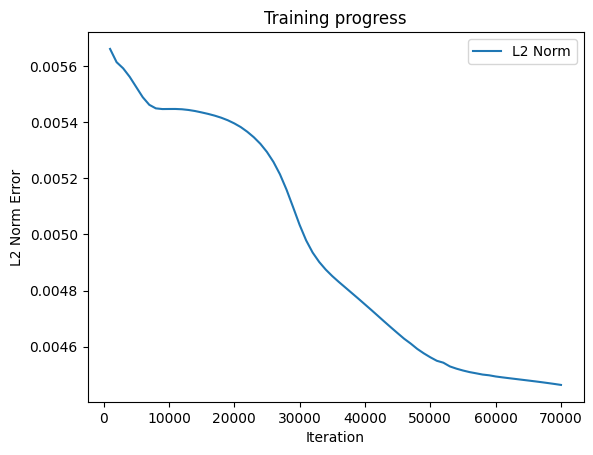

Predicted a: 0.07743500918149948
Predicted b: 1.6493483781814575
Predicted c: 1.6078649759292603


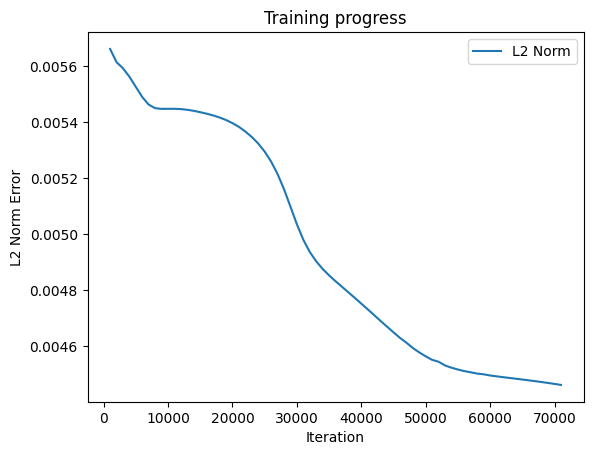

Predicted a: 0.07670934498310089
Predicted b: 1.6587659120559692
Predicted c: 1.6144071817398071


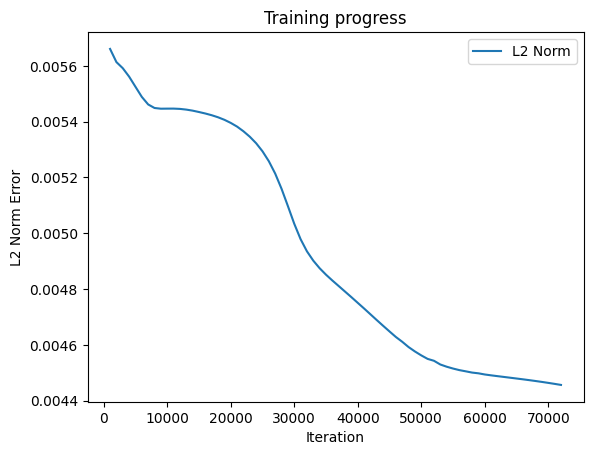

Predicted a: 0.07605420798063278
Predicted b: 1.668183445930481
Predicted c: 1.6211436986923218


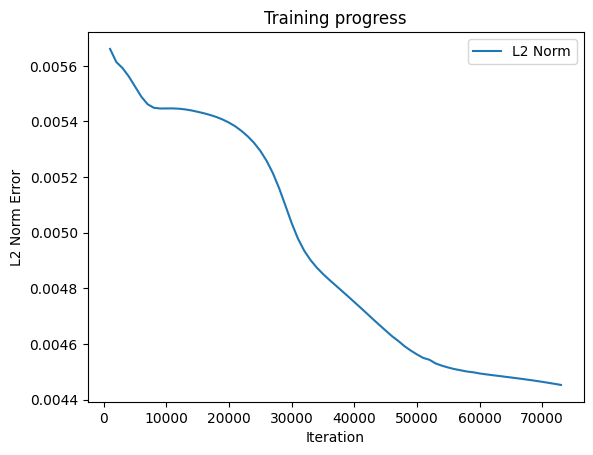

Predicted a: 0.0754723846912384
Predicted b: 1.6776633262634277
Predicted c: 1.6281037330627441


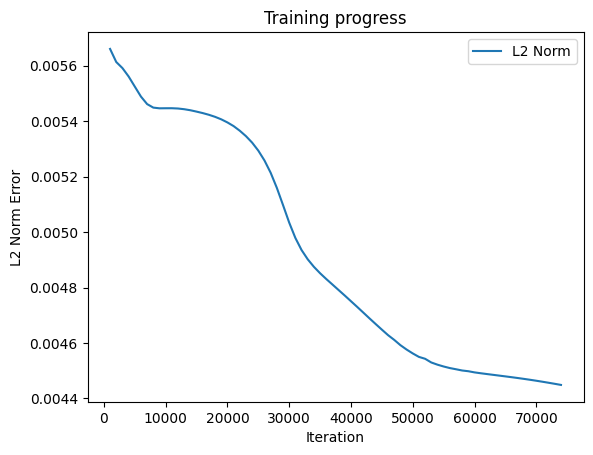

Predicted a: 0.07496123760938644
Predicted b: 1.6872000694274902
Predicted c: 1.6353048086166382


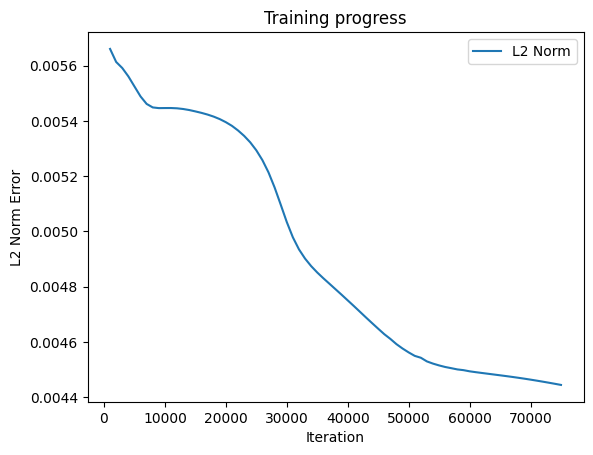

Predicted a: 0.07451499253511429
Predicted b: 1.6967368125915527
Predicted c: 1.6427510976791382


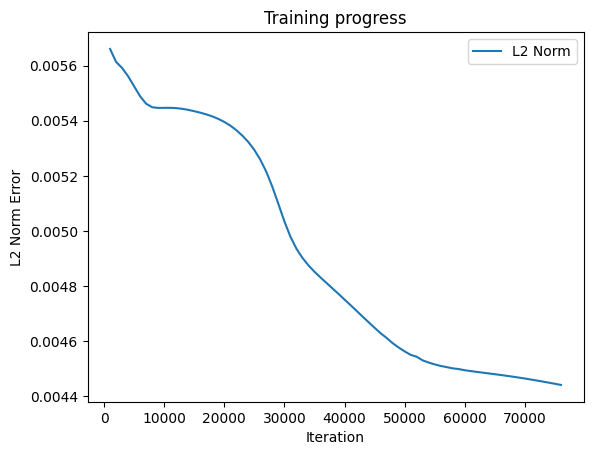

Predicted a: 0.07415031641721725
Predicted b: 1.7062735557556152
Predicted c: 1.650434970855713


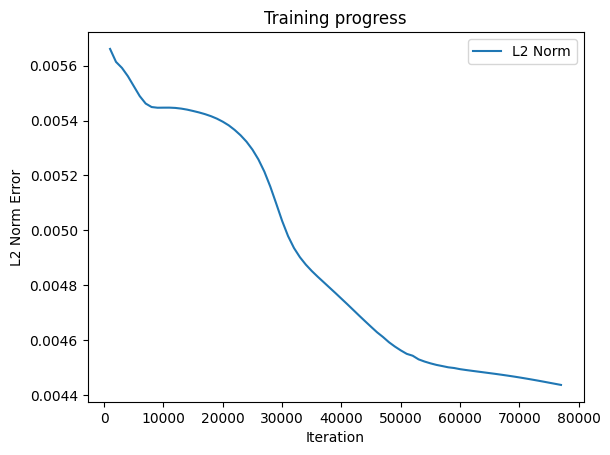

Predicted a: 0.07386210560798645
Predicted b: 1.7158102989196777
Predicted c: 1.658336877822876


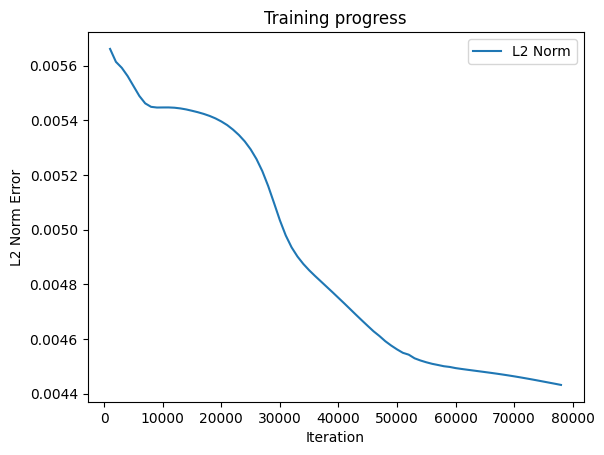

Predicted a: 0.07361222803592682
Predicted b: 1.7253470420837402
Predicted c: 1.666453242301941


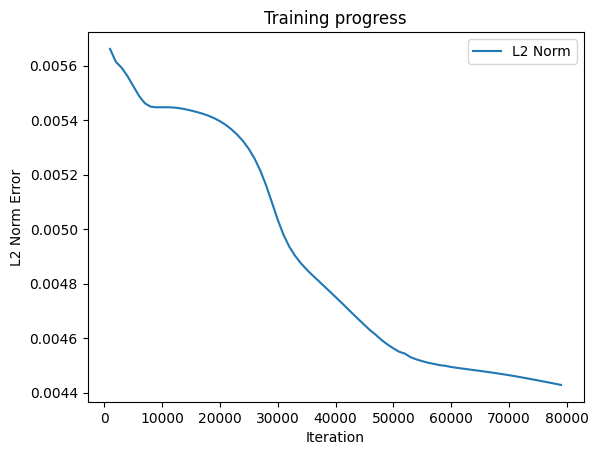

Predicted a: 0.07338818162679672
Predicted b: 1.7348837852478027
Predicted c: 1.6747790575027466


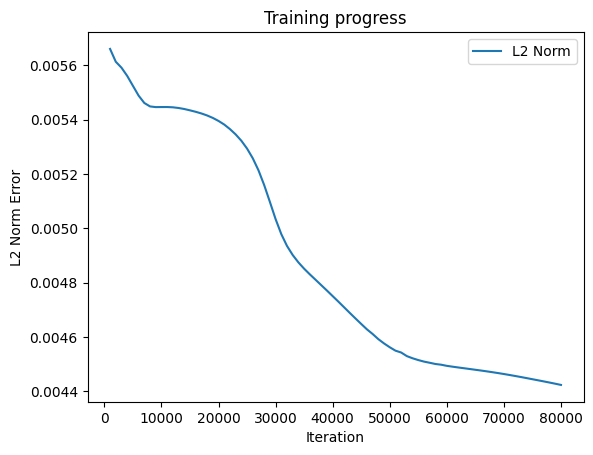

Predicted a: 0.07320088893175125
Predicted b: 1.7444205284118652
Predicted c: 1.683306336402893


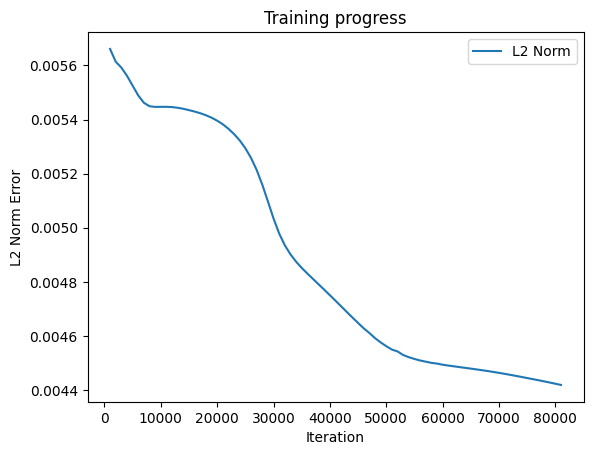

Predicted a: 0.07306501269340515
Predicted b: 1.7539572715759277
Predicted c: 1.692017674446106


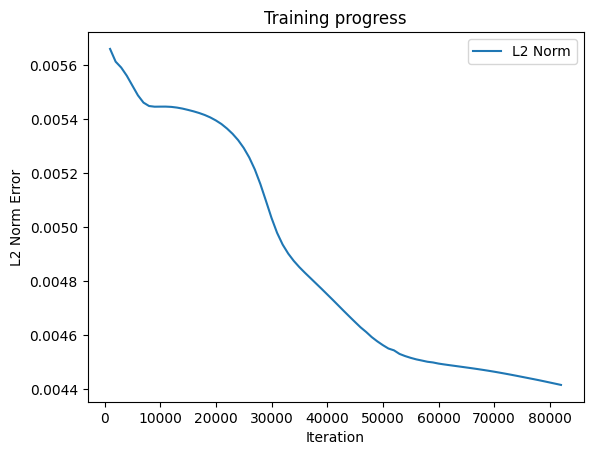

Predicted a: 0.07297103106975555
Predicted b: 1.7634940147399902
Predicted c: 1.7008863687515259


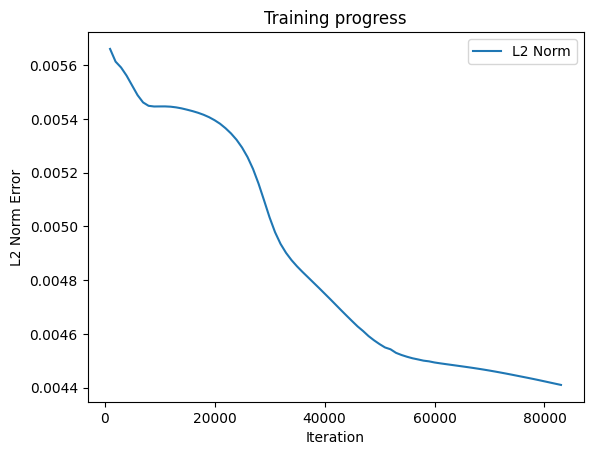

Predicted a: 0.07294808328151703
Predicted b: 1.7730307579040527
Predicted c: 1.7098886966705322


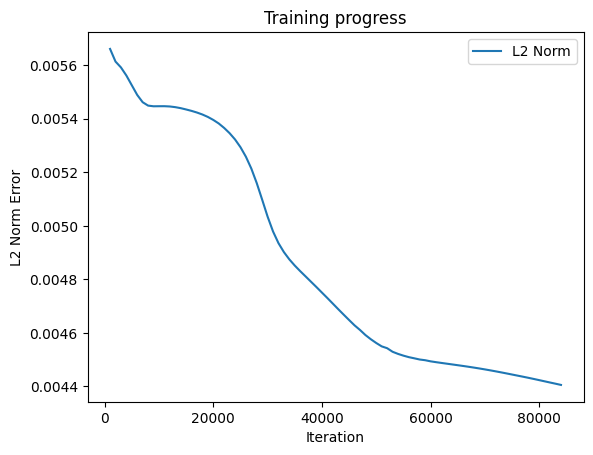

Predicted a: 0.07290112972259521
Predicted b: 1.7825675010681152
Predicted c: 1.7190101146697998


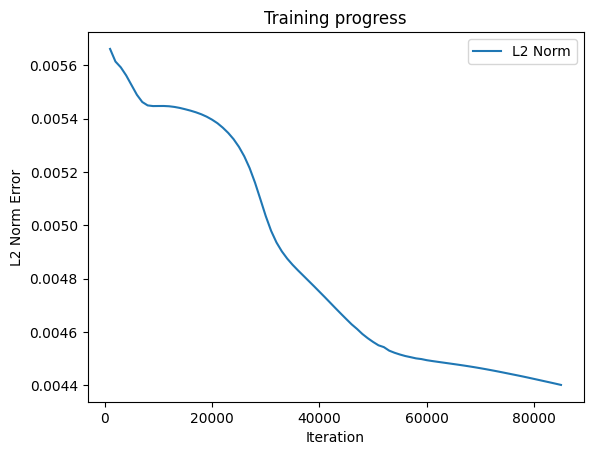

Predicted a: 0.07286228239536285
Predicted b: 1.7921042442321777
Predicted c: 1.7282416820526123


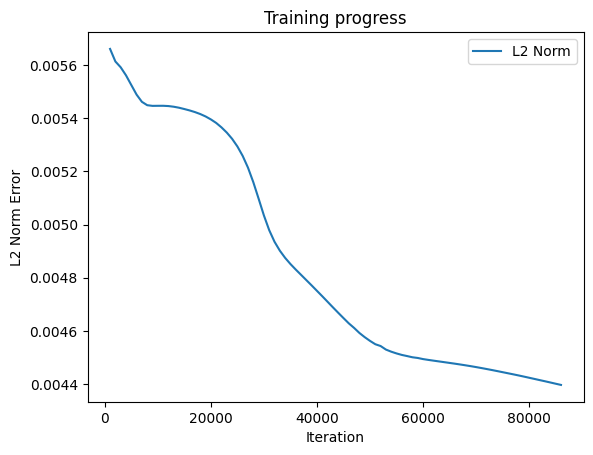

Predicted a: 0.07285822927951813
Predicted b: 1.8016409873962402
Predicted c: 1.7375482320785522


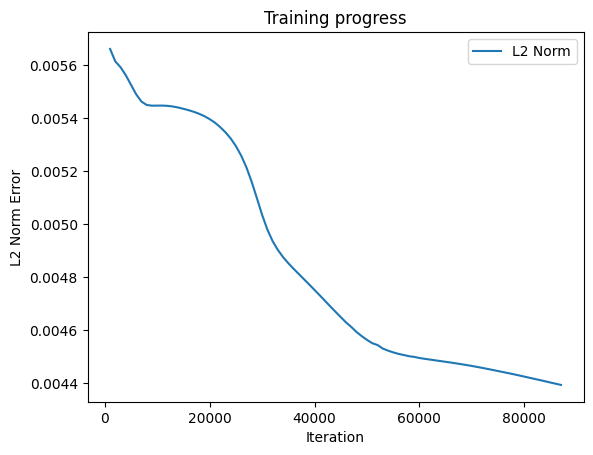

Predicted a: 0.07288949936628342
Predicted b: 1.8111777305603027
Predicted c: 1.746965765953064


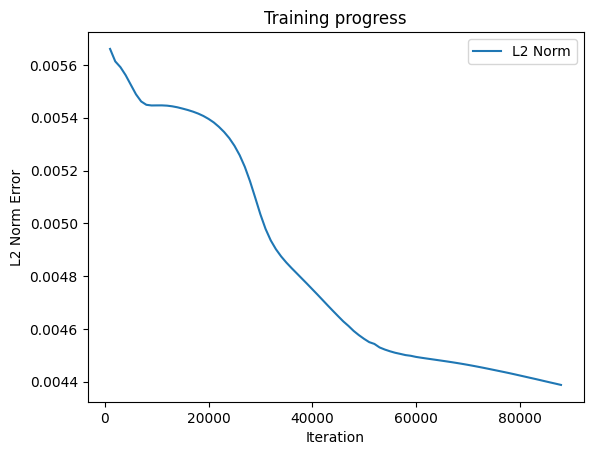

Predicted a: 0.07290490716695786
Predicted b: 1.8207144737243652
Predicted c: 1.7564549446105957


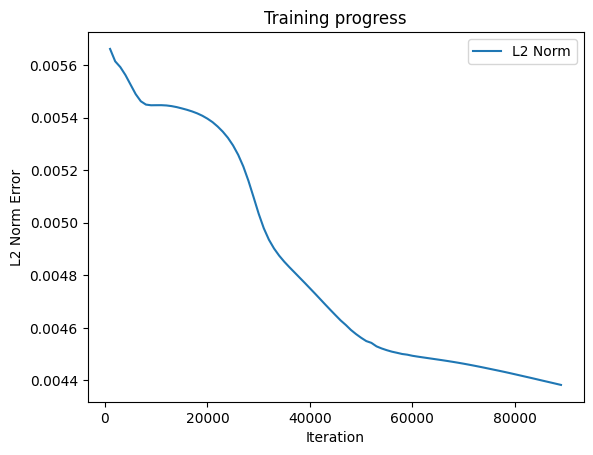

Predicted a: 0.07291796803474426
Predicted b: 1.8302512168884277
Predicted c: 1.7659916877746582


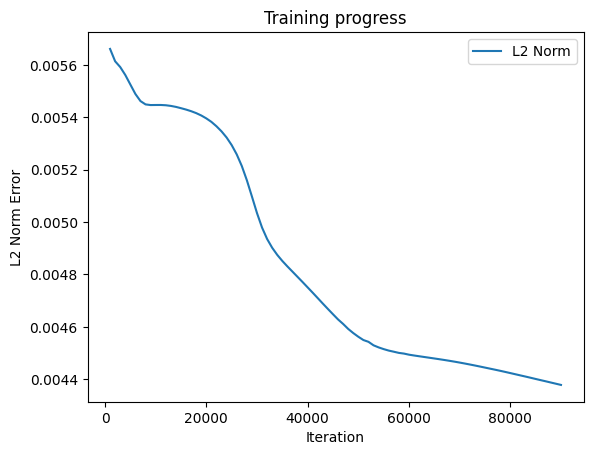

Predicted a: 0.07294440269470215
Predicted b: 1.8398041725158691
Predicted c: 1.7756390571594238


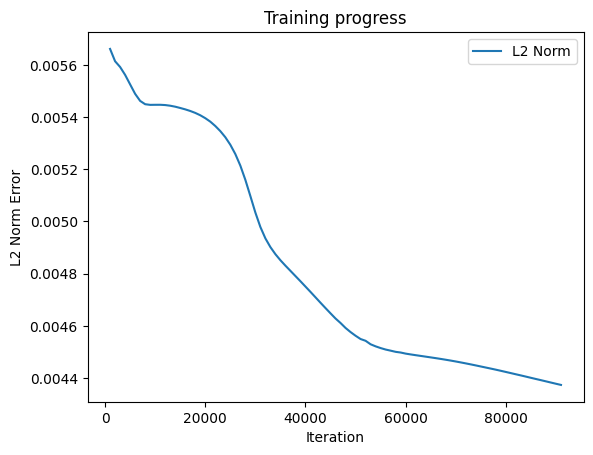

Predicted a: 0.07299685478210449
Predicted b: 1.8494577407836914
Predicted c: 1.7852972745895386


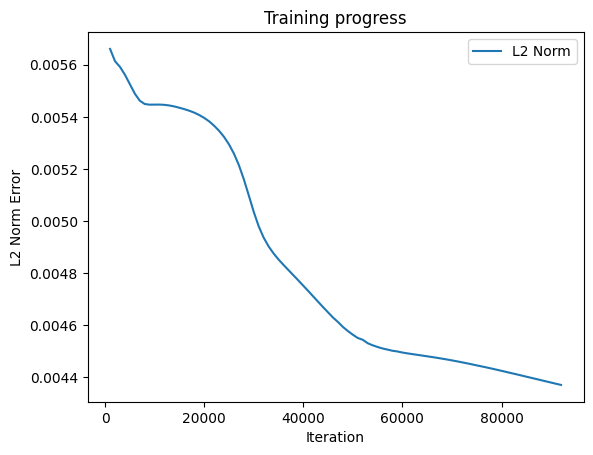

Predicted a: 0.07302786409854889
Predicted b: 1.8591136932373047
Predicted c: 1.7950724363327026


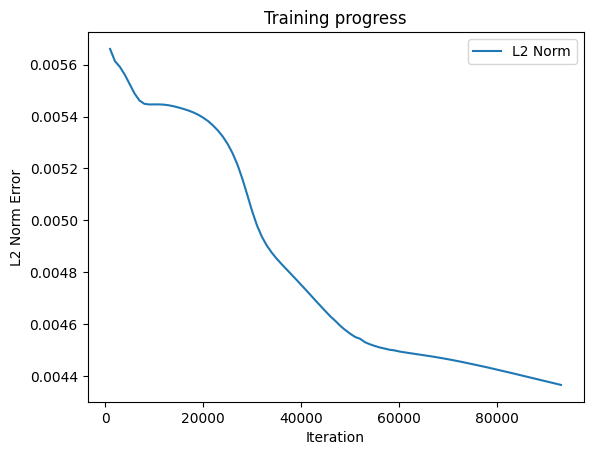

Predicted a: 0.07301181554794312
Predicted b: 1.868769645690918
Predicted c: 1.8048475980758667


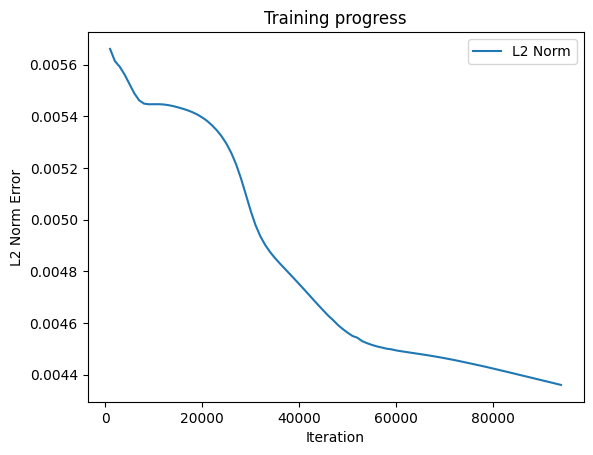

Predicted a: 0.07296506315469742
Predicted b: 1.8784255981445312
Predicted c: 1.8147152662277222


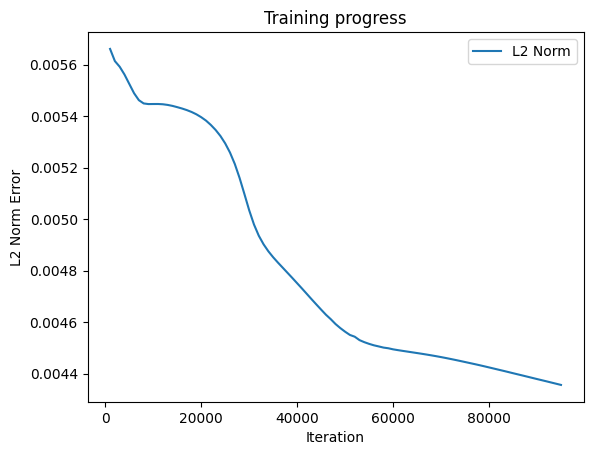

Predicted a: 0.07287050783634186
Predicted b: 1.8880815505981445
Predicted c: 1.824609637260437


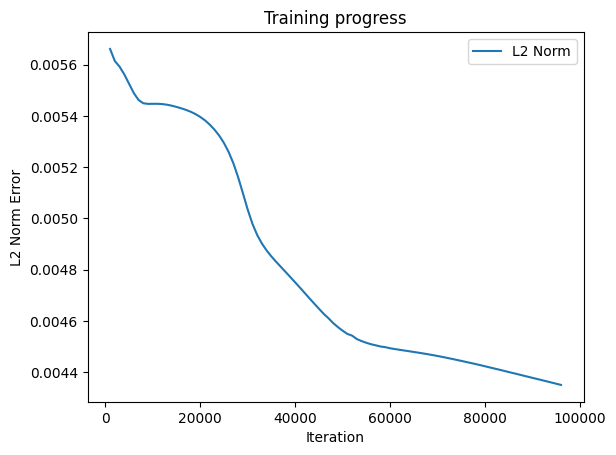

Predicted a: 0.07270990312099457
Predicted b: 1.8977375030517578
Predicted c: 1.8345040082931519


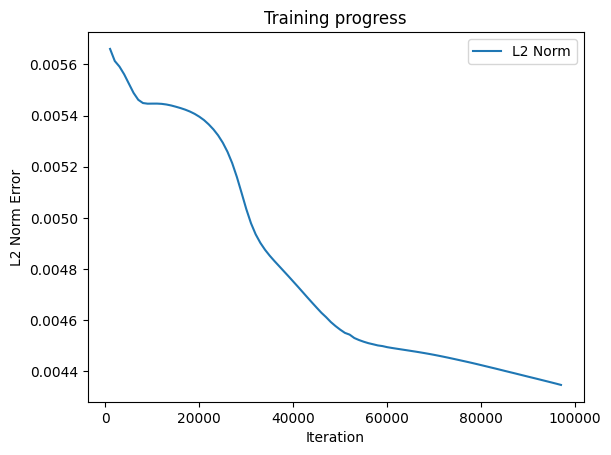

Predicted a: 0.07246175408363342
Predicted b: 1.907418966293335
Predicted c: 1.8444911241531372


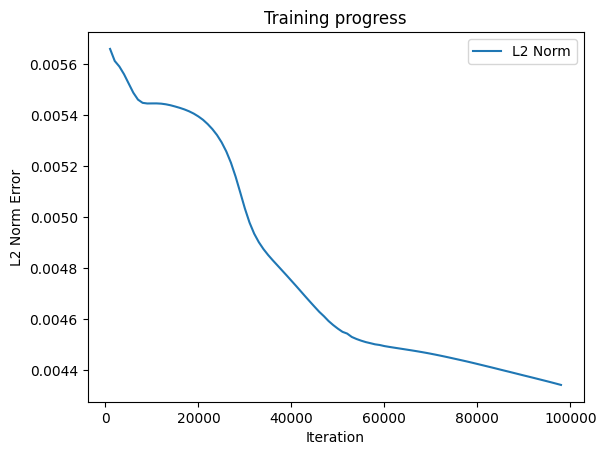

Predicted a: 0.07219869643449783
Predicted b: 1.917194128036499
Predicted c: 1.8545047044754028


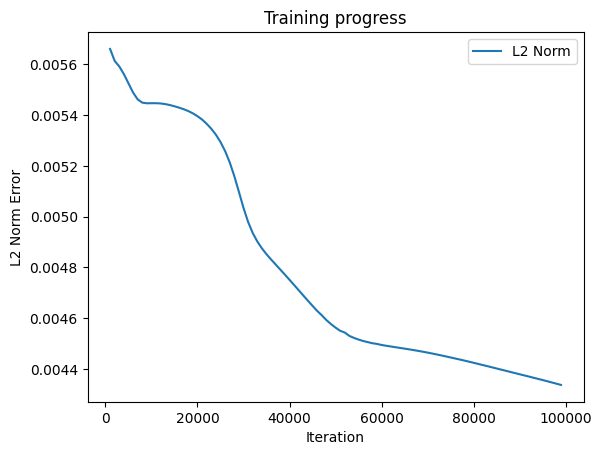

Predicted a: 0.07189206033945084
Predicted b: 1.926969289779663
Predicted c: 1.8645182847976685


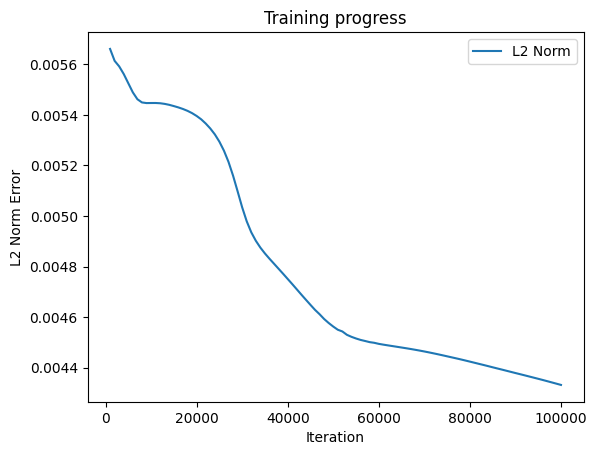

Predicted a: 0.0715840756893158
Predicted b: 1.9367444515228271
Predicted c: 1.874531865119934


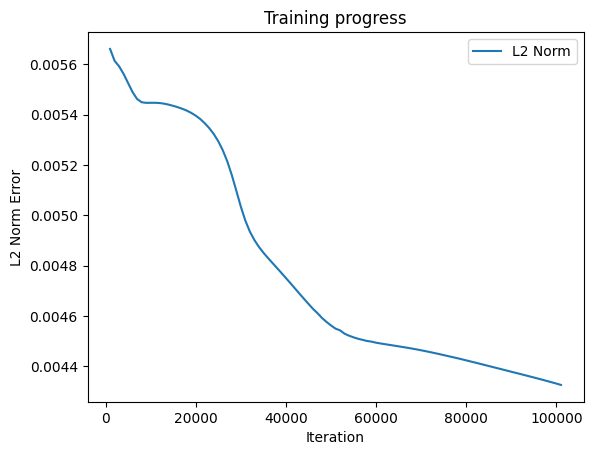

Predicted a: 0.07113969326019287
Predicted b: 1.946604609489441
Predicted c: 1.8846582174301147


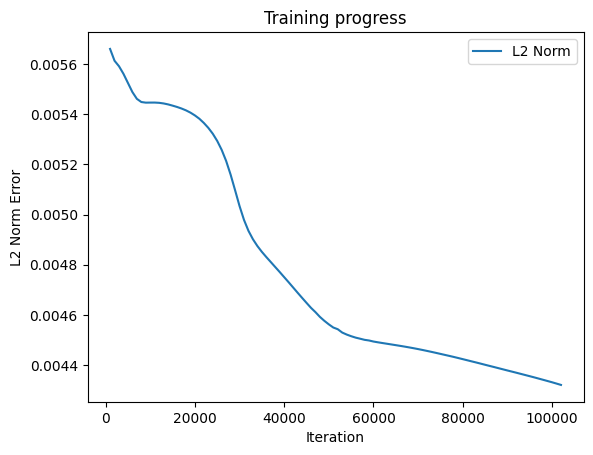

Predicted a: 0.07066825032234192
Predicted b: 1.9564989805221558
Predicted c: 1.8947910070419312


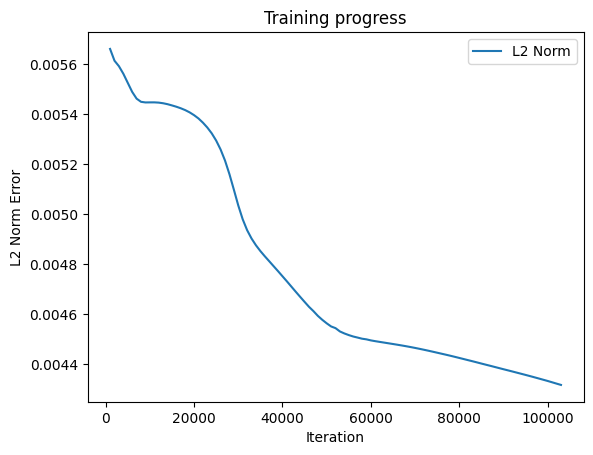

Predicted a: 0.07030096650123596
Predicted b: 1.9663933515548706
Predicted c: 1.9049237966537476


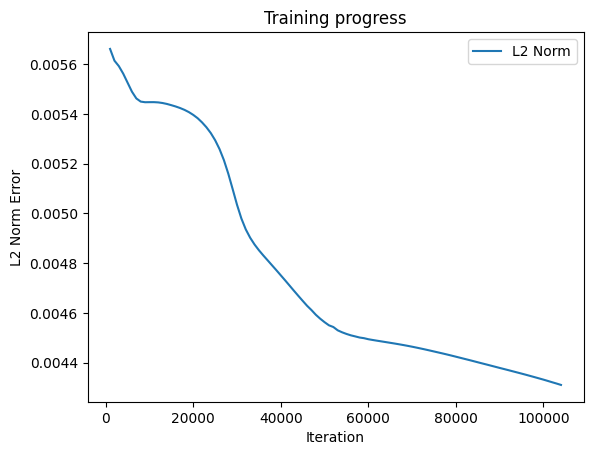

Predicted a: 0.06987988203763962
Predicted b: 1.9763044118881226
Predicted c: 1.915056586265564


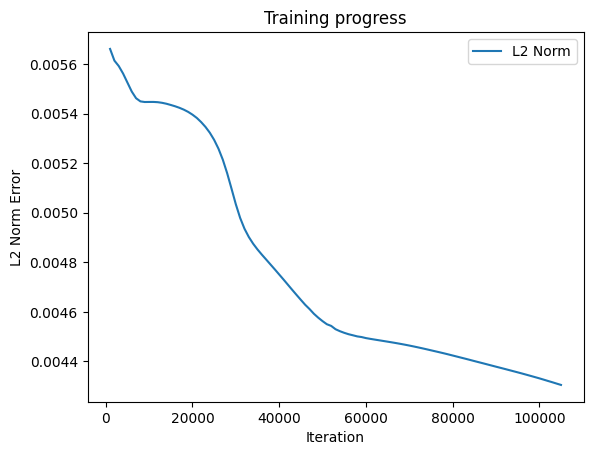

Predicted a: 0.06960896402597427
Predicted b: 1.9863179922103882
Predicted c: 1.9252588748931885


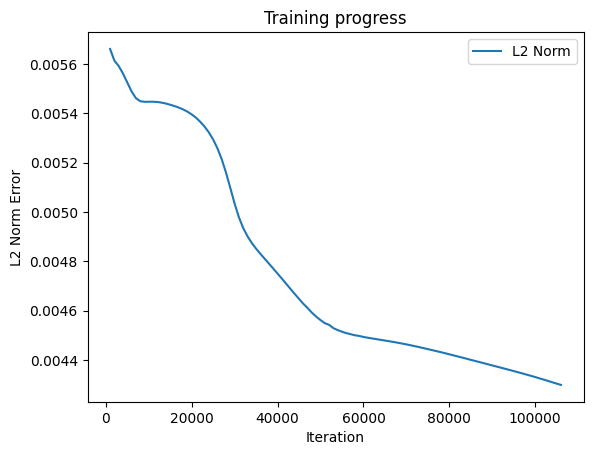

Predicted a: 0.069477379322052
Predicted b: 1.9963315725326538
Predicted c: 1.9355108737945557


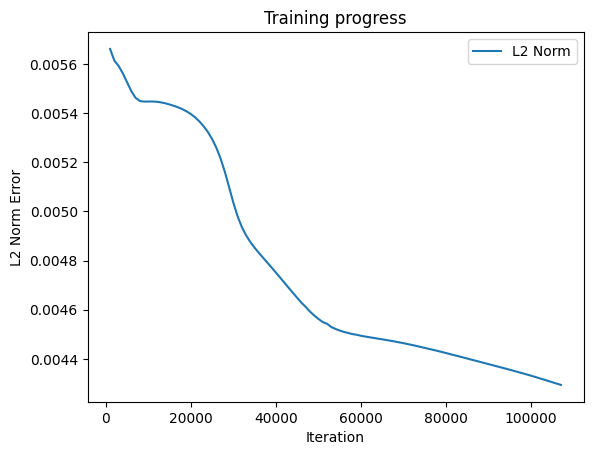

Predicted a: 0.0694507509469986
Predicted b: 2.006345272064209
Predicted c: 1.9457628726959229


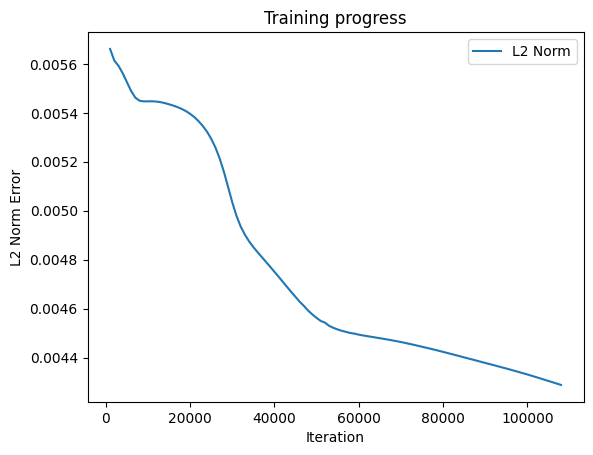

Predicted a: 0.06971219927072525
Predicted b: 2.0163588523864746
Predicted c: 1.9560636281967163


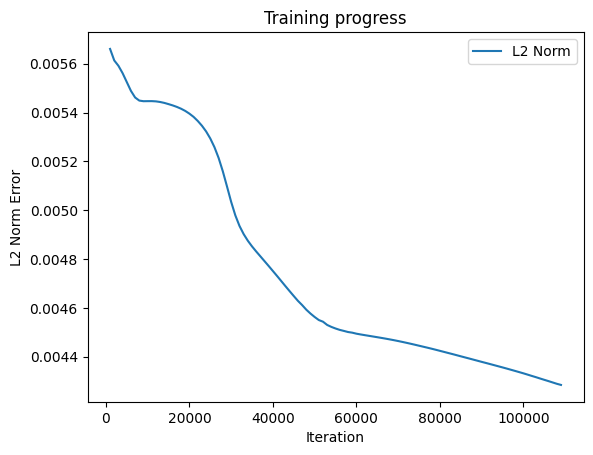

Predicted a: 0.07026180624961853
Predicted b: 2.0265731811523438
Predicted c: 1.9664348363876343


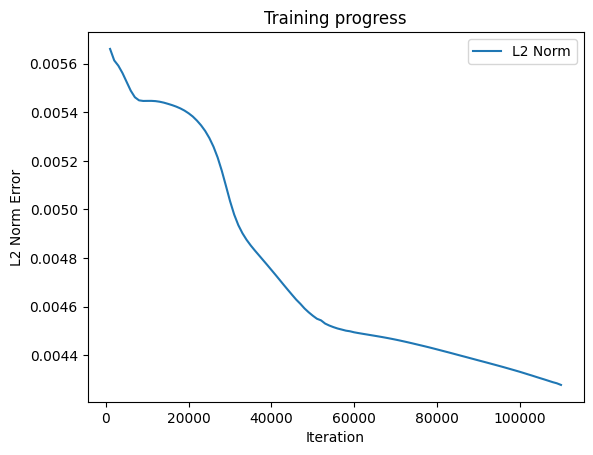

Predicted a: 0.07117888331413269
Predicted b: 2.036825180053711
Predicted c: 1.9768060445785522


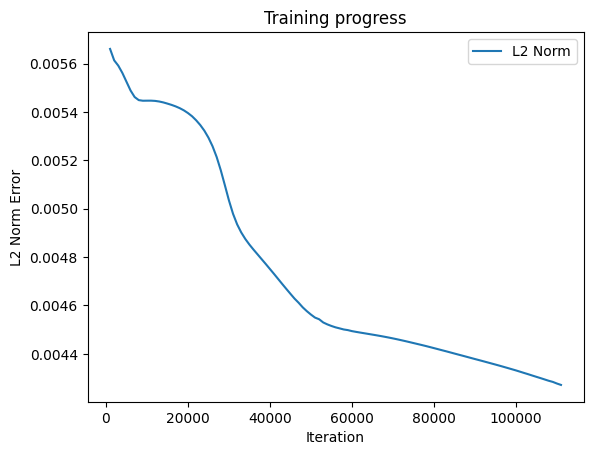

Predicted a: 0.07250277698040009
Predicted b: 2.047077178955078
Predicted c: 1.9872485399246216


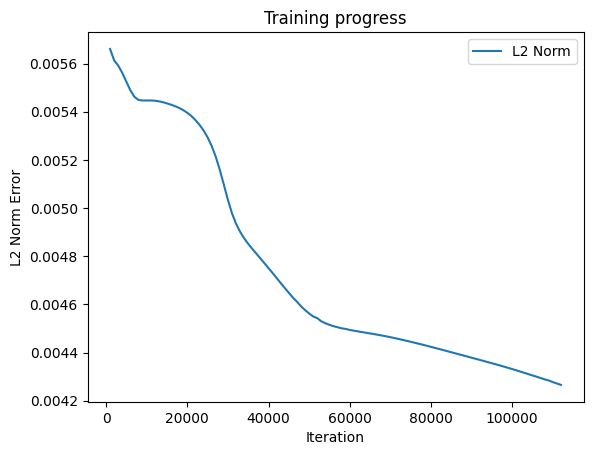

Predicted a: 0.07429217547178268
Predicted b: 2.0573291778564453
Predicted c: 1.9977389574050903


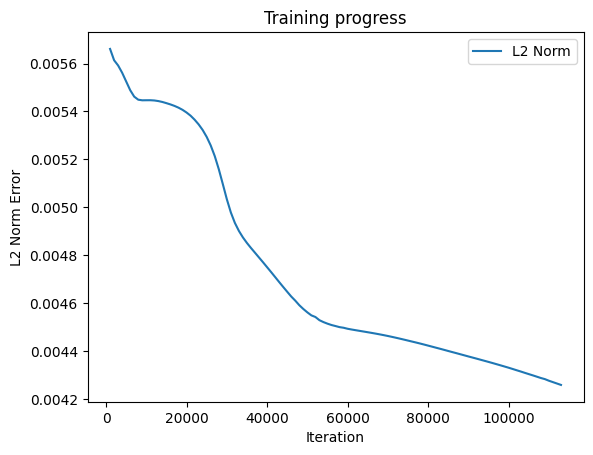

Predicted a: 0.07654301077127457
Predicted b: 2.0676684379577637
Predicted c: 2.0082294940948486


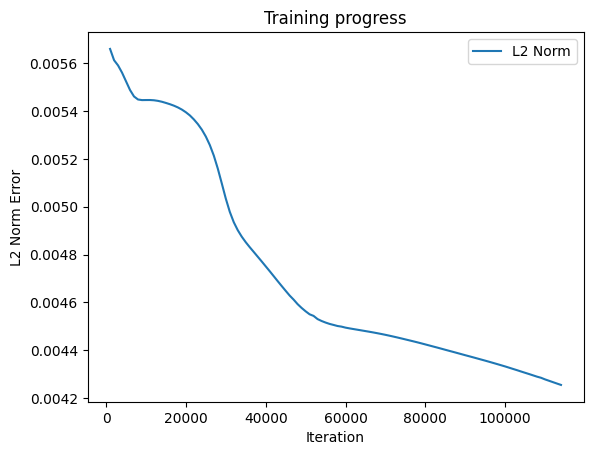

Predicted a: 0.07927963882684708
Predicted b: 2.0781588554382324
Predicted c: 2.0187199115753174


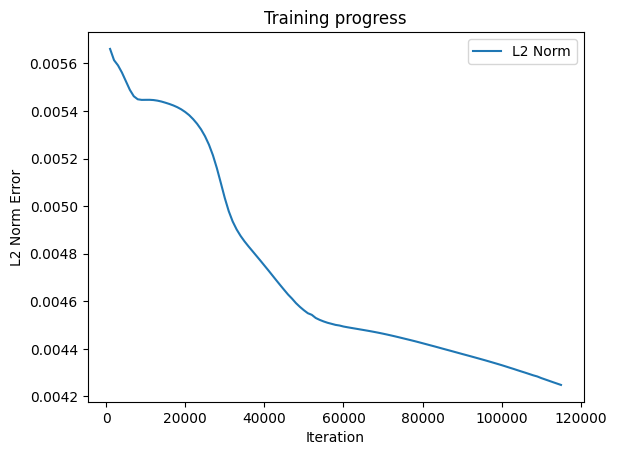

Predicted a: 0.08244743198156357
Predicted b: 2.088649272918701
Predicted c: 2.029210329055786


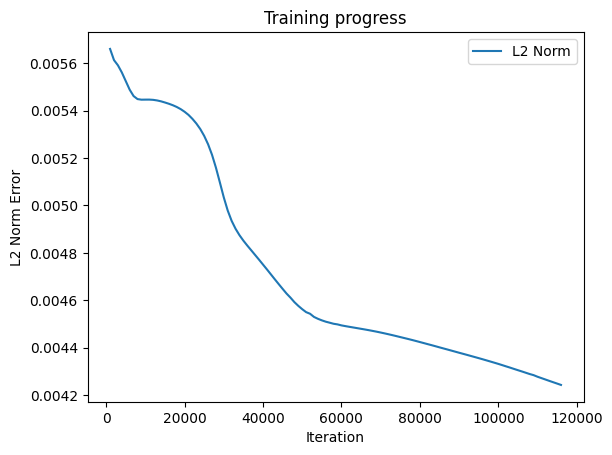

Predicted a: 0.08607947081327438
Predicted b: 2.09913969039917
Predicted c: 2.0399105548858643


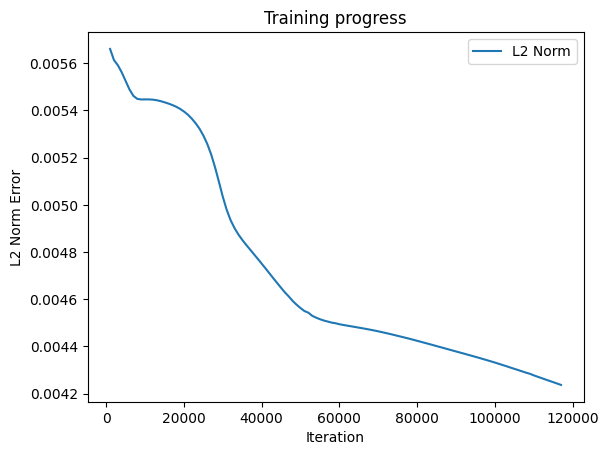

Predicted a: 0.09009581804275513
Predicted b: 2.1096301078796387
Predicted c: 2.0506393909454346


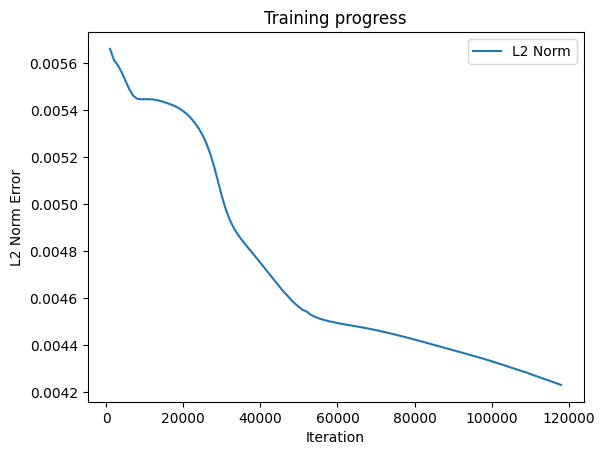

Predicted a: 0.09445692598819733
Predicted b: 2.1201205253601074
Predicted c: 2.061368227005005


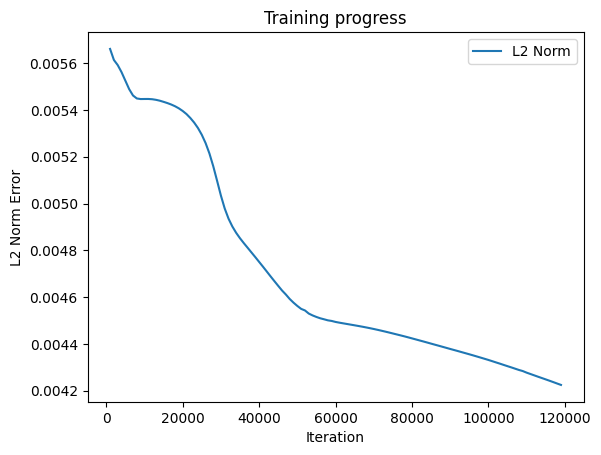

Predicted a: 0.09916049242019653
Predicted b: 2.130610942840576
Predicted c: 2.072097063064575


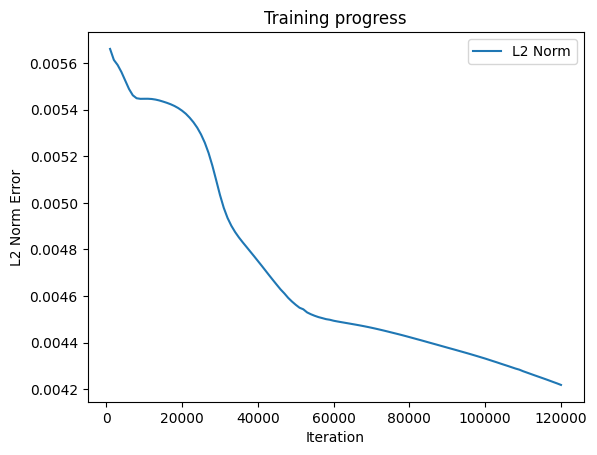

Predicted a: 0.10415013879537582
Predicted b: 2.141101360321045
Predicted c: 2.0828258991241455


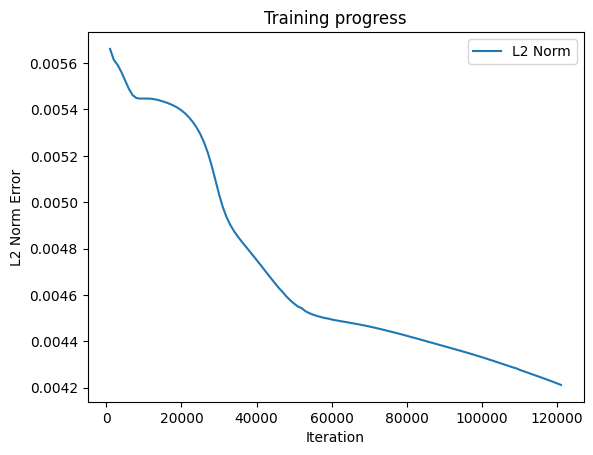

Predicted a: 0.10942590236663818
Predicted b: 2.1515917778015137
Predicted c: 2.093554735183716


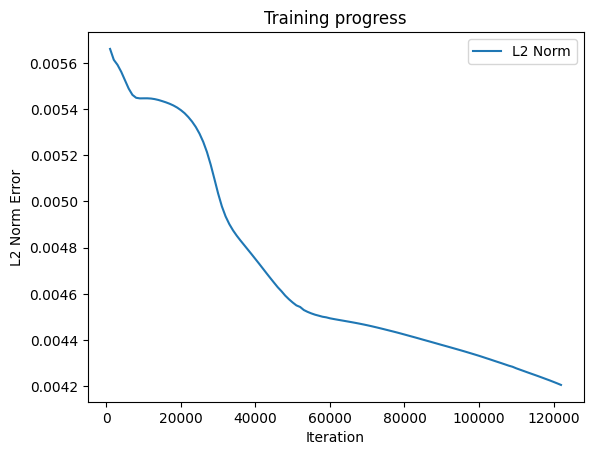

Predicted a: 0.11494304239749908
Predicted b: 2.1620821952819824
Predicted c: 2.104283571243286


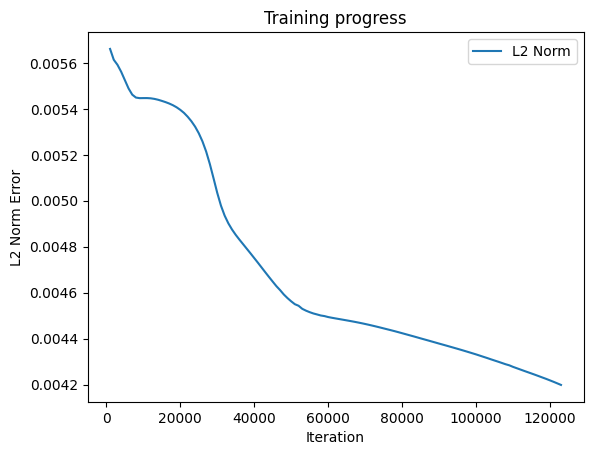

Predicted a: 0.12065864354372025
Predicted b: 2.172572612762451
Predicted c: 2.1150124073028564


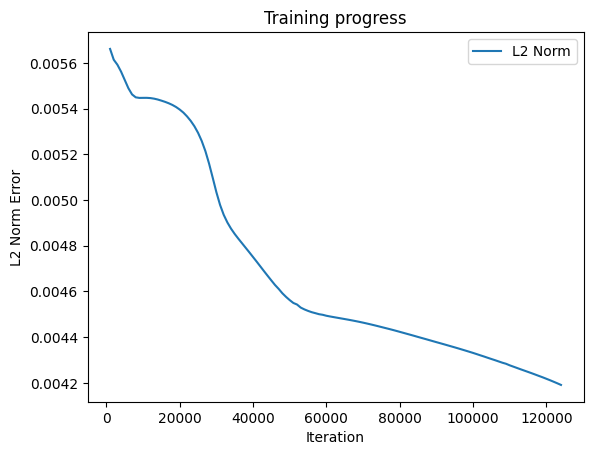

Predicted a: 0.1265942007303238
Predicted b: 2.18306303024292
Predicted c: 2.1257412433624268


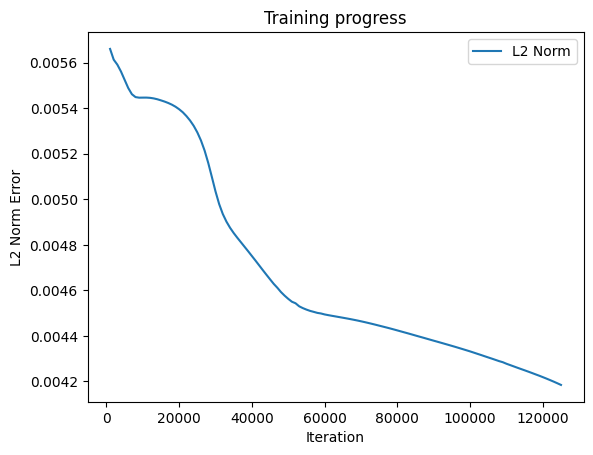

Predicted a: 0.13268665969371796
Predicted b: 2.1935534477233887
Predicted c: 2.1363778114318848


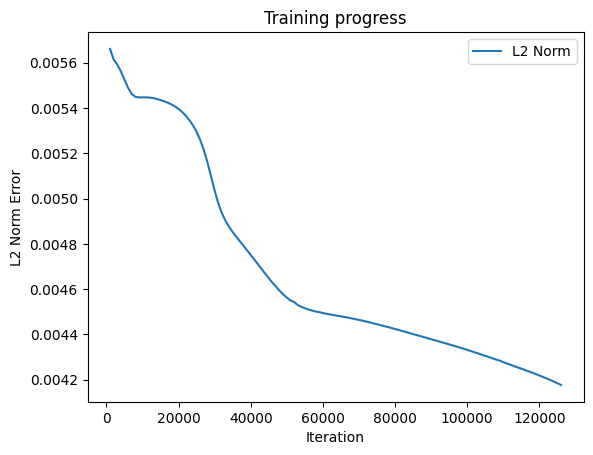

Predicted a: 0.13888385891914368
Predicted b: 2.2040438652038574
Predicted c: 2.1468682289123535


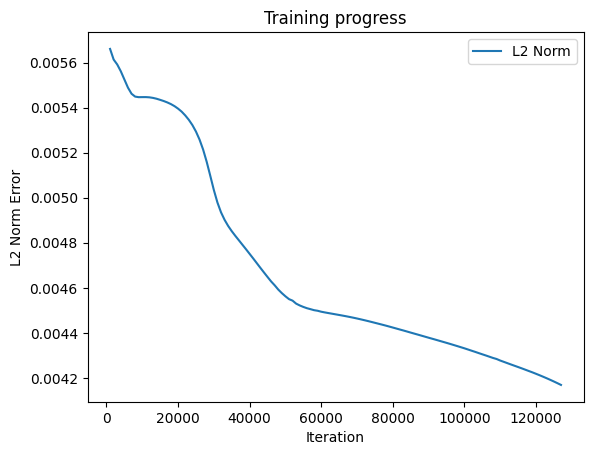

Predicted a: 0.14522360265254974
Predicted b: 2.214534282684326
Predicted c: 2.1573586463928223


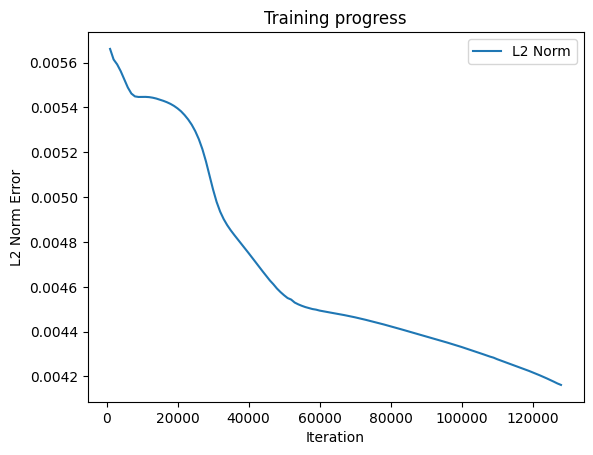

Predicted a: 0.1517089307308197
Predicted b: 2.225024700164795
Predicted c: 2.167849063873291


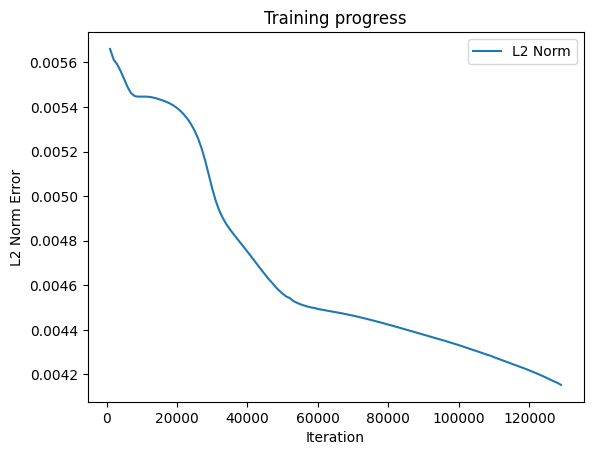

Predicted a: 0.15831826627254486
Predicted b: 2.2355151176452637
Predicted c: 2.1783394813537598


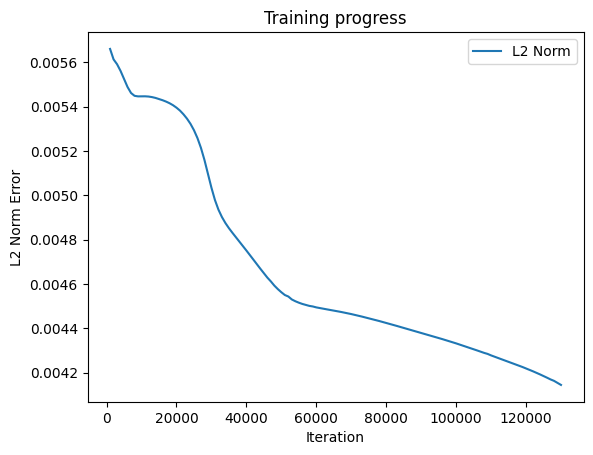

Predicted a: 0.1650325357913971
Predicted b: 2.2460055351257324
Predicted c: 2.1888298988342285


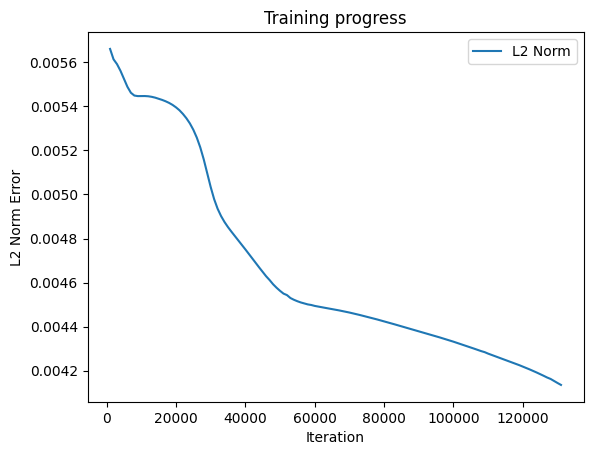

Predicted a: 0.17187164723873138
Predicted b: 2.256495952606201
Predicted c: 2.1993203163146973


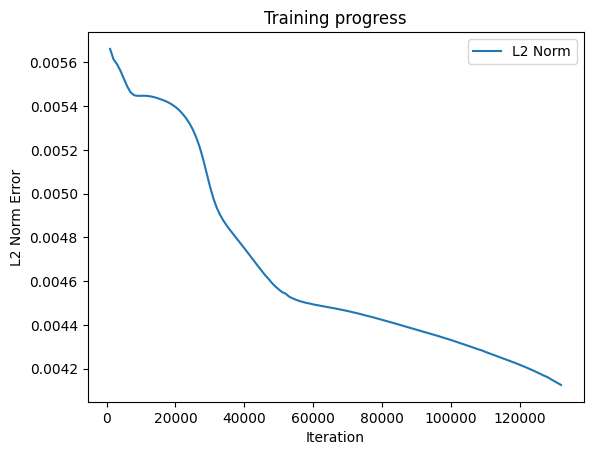

Predicted a: 0.1787952482700348
Predicted b: 2.26698637008667
Predicted c: 2.209810733795166


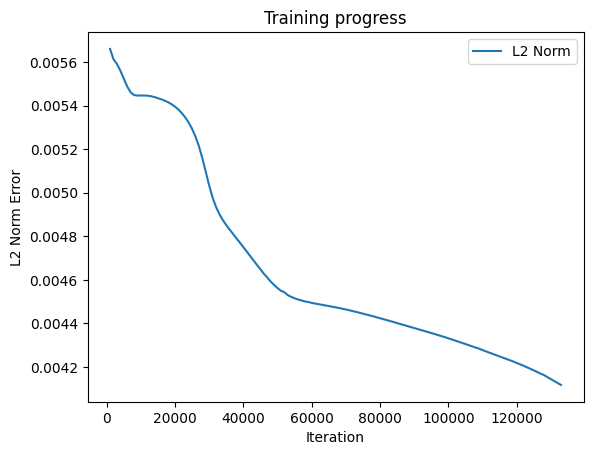

Predicted a: 0.185828298330307
Predicted b: 2.2774767875671387
Predicted c: 2.2203011512756348


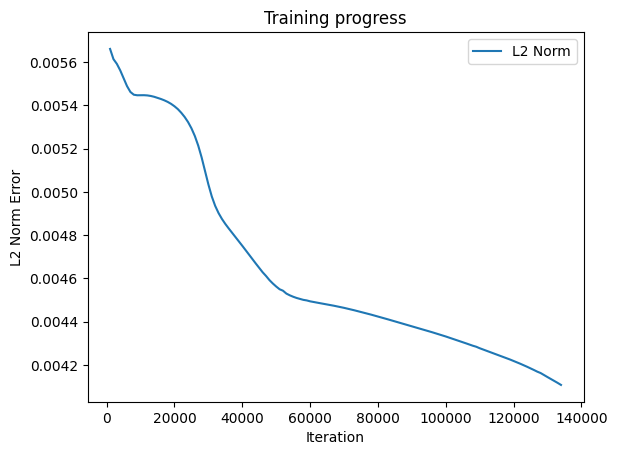

Predicted a: 0.19297832250595093
Predicted b: 2.2879672050476074
Predicted c: 2.2307915687561035


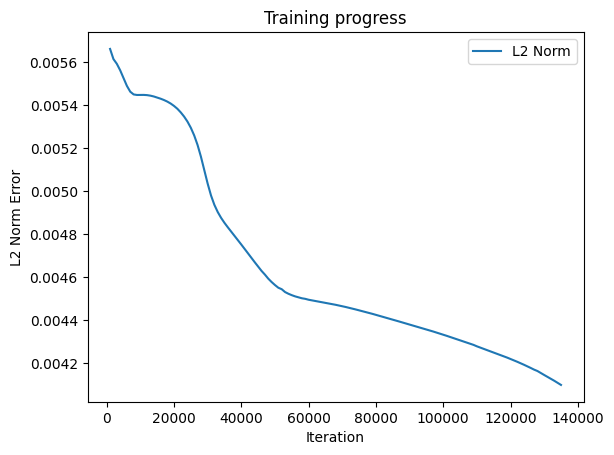

Predicted a: 0.20023444294929504
Predicted b: 2.298457622528076
Predicted c: 2.2412819862365723


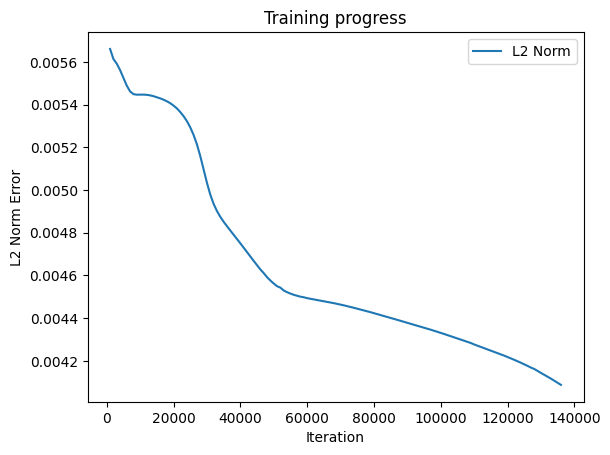

Predicted a: 0.20759299397468567
Predicted b: 2.308948040008545
Predicted c: 2.251772403717041


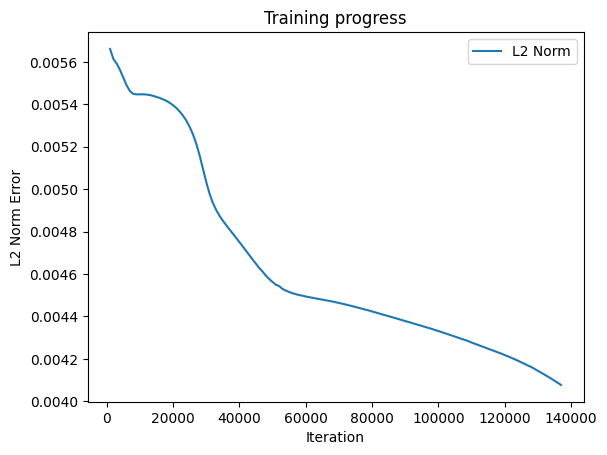

Predicted a: 0.21507057547569275
Predicted b: 2.3194384574890137
Predicted c: 2.2622628211975098


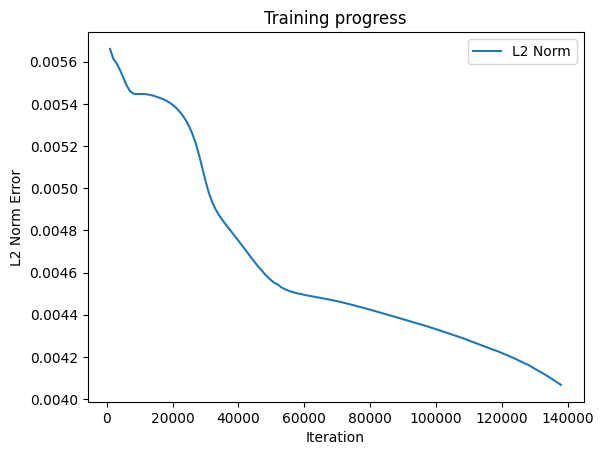

Predicted a: 0.22267325222492218
Predicted b: 2.3299288749694824
Predicted c: 2.2727532386779785


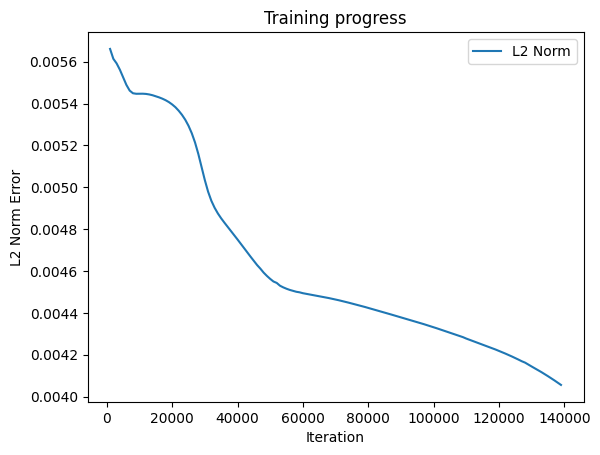

Predicted a: 0.2304157018661499
Predicted b: 2.340419292449951
Predicted c: 2.2832436561584473


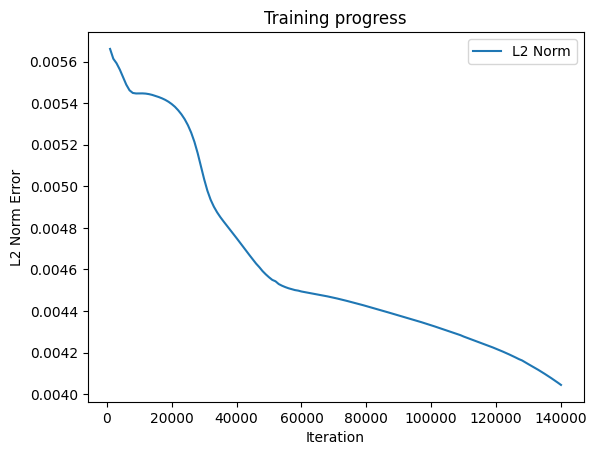

Predicted a: 0.23831187188625336
Predicted b: 2.35090970993042
Predicted c: 2.293734073638916


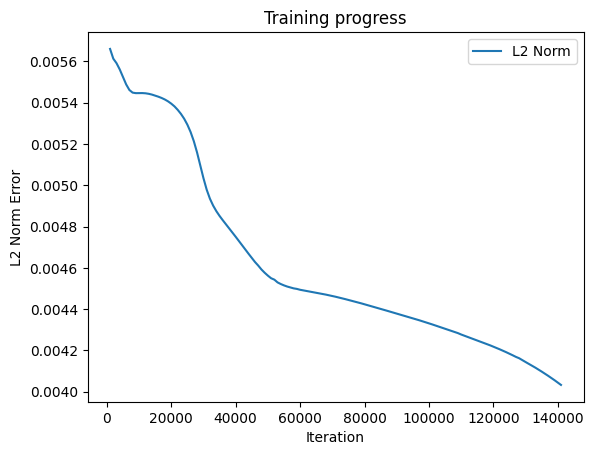

Predicted a: 0.24637053906917572
Predicted b: 2.3614001274108887
Predicted c: 2.3042244911193848


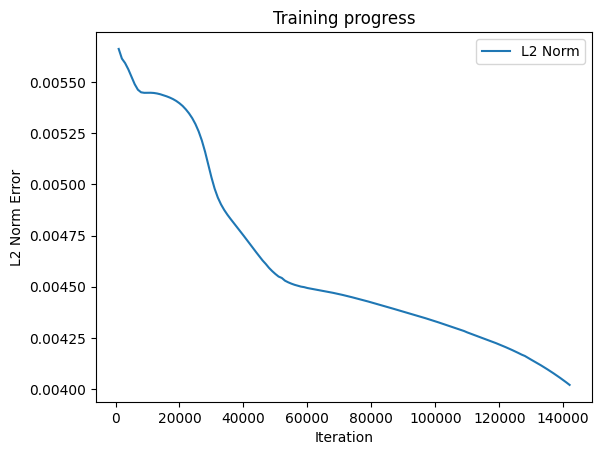

Predicted a: 0.2545977532863617
Predicted b: 2.3718905448913574
Predicted c: 2.3147106170654297


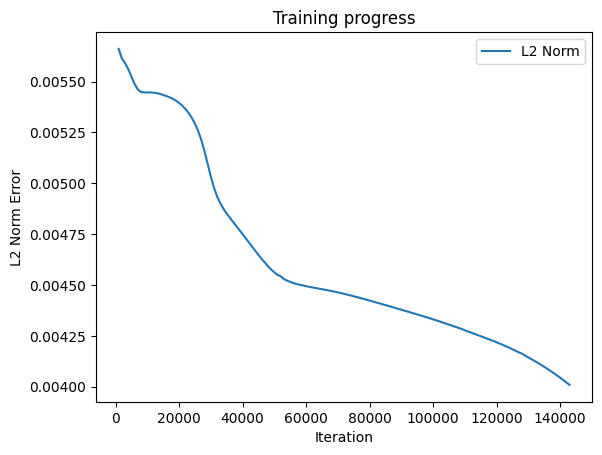

Predicted a: 0.2629525363445282
Predicted b: 2.382380962371826
Predicted c: 2.324967622756958


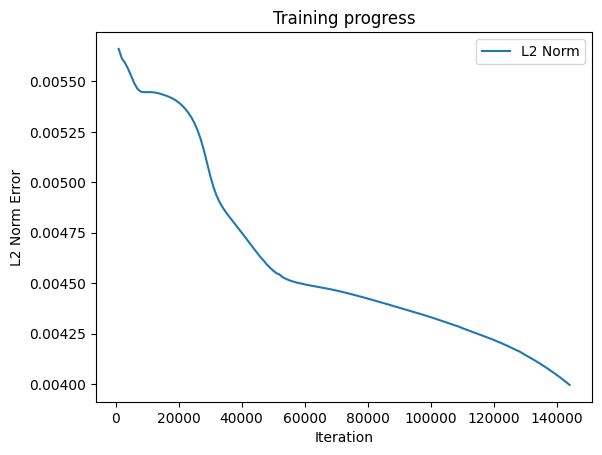

Predicted a: 0.2714768946170807
Predicted b: 2.392871379852295
Predicted c: 2.335219621658325


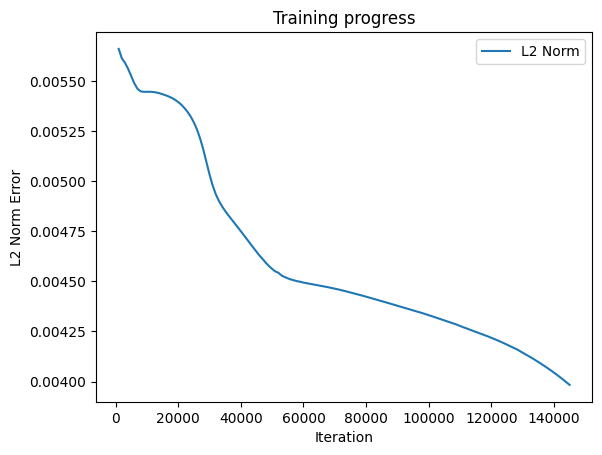

Predicted a: 0.28016728162765503
Predicted b: 2.4033617973327637
Predicted c: 2.3454716205596924


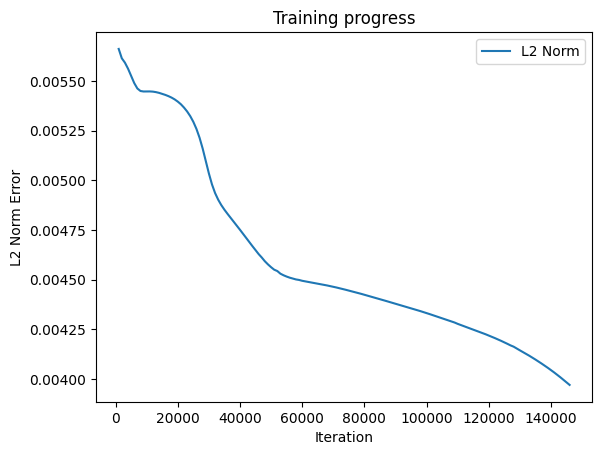

Predicted a: 0.28899723291397095
Predicted b: 2.4138522148132324
Predicted c: 2.3557236194610596


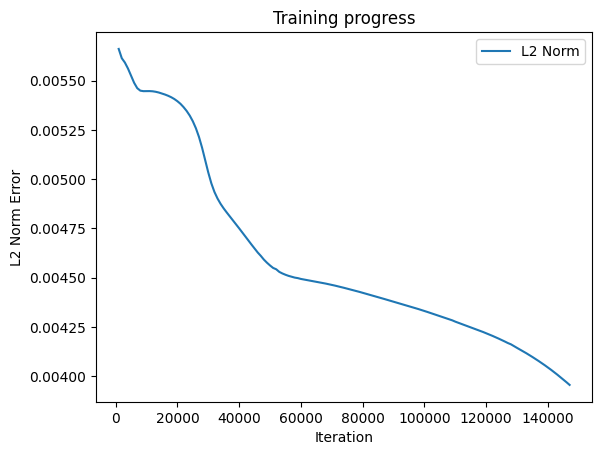

Predicted a: 0.2980688214302063
Predicted b: 2.424342632293701
Predicted c: 2.3659756183624268


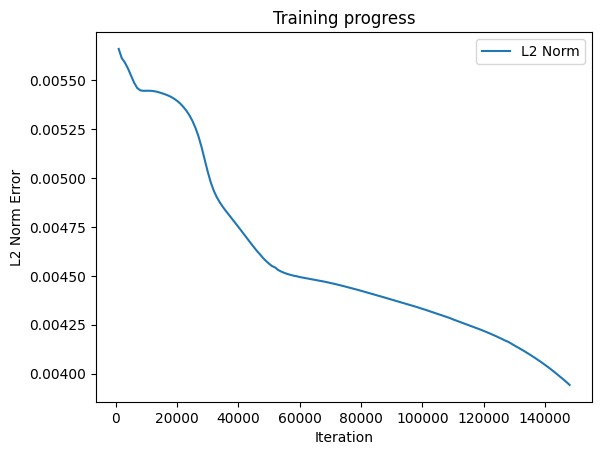

Predicted a: 0.3074246644973755
Predicted b: 2.43483304977417
Predicted c: 2.376227617263794


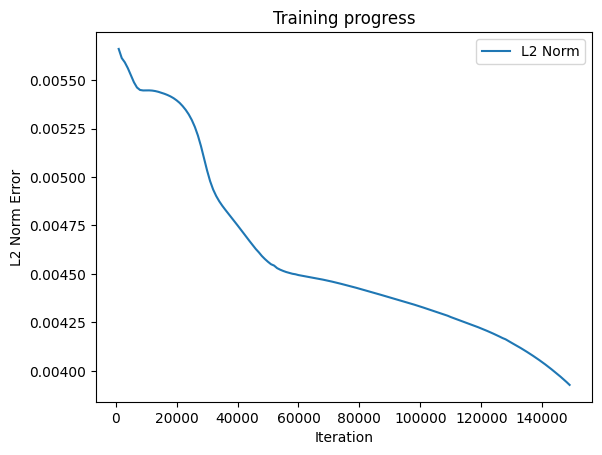

Predicted a: 0.3170188069343567
Predicted b: 2.4453234672546387
Predicted c: 2.386479616165161


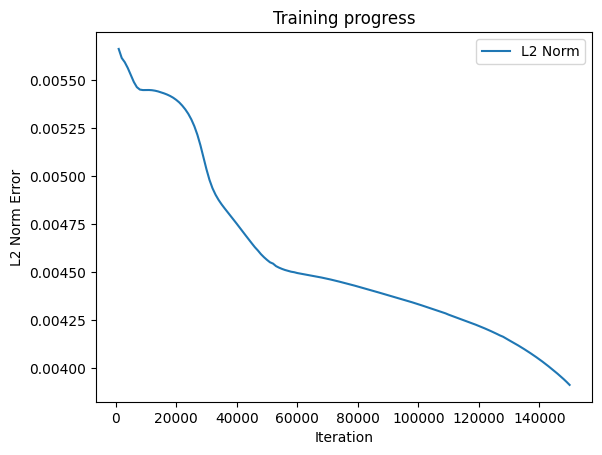

Predicted a: 0.3269496560096741
Predicted b: 2.4558138847351074
Predicted c: 2.3967316150665283


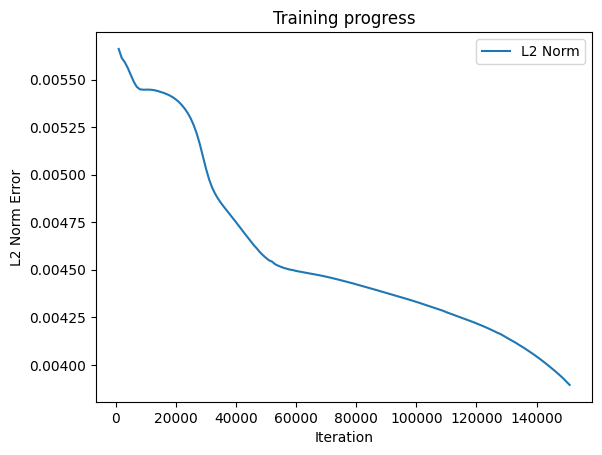

Predicted a: 0.337111234664917
Predicted b: 2.466304302215576
Predicted c: 2.4069836139678955


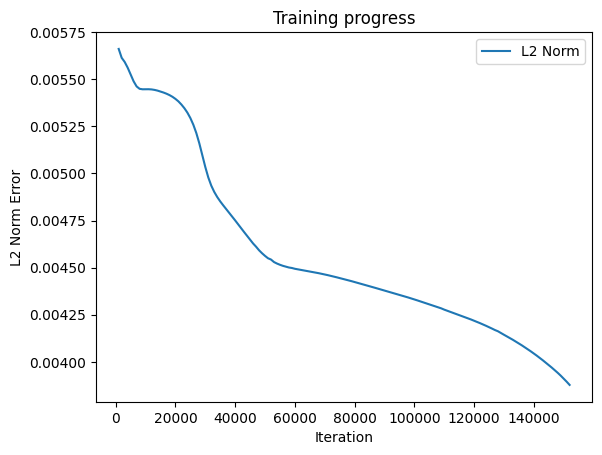

Predicted a: 0.34750911593437195
Predicted b: 2.476794719696045
Predicted c: 2.4172356128692627


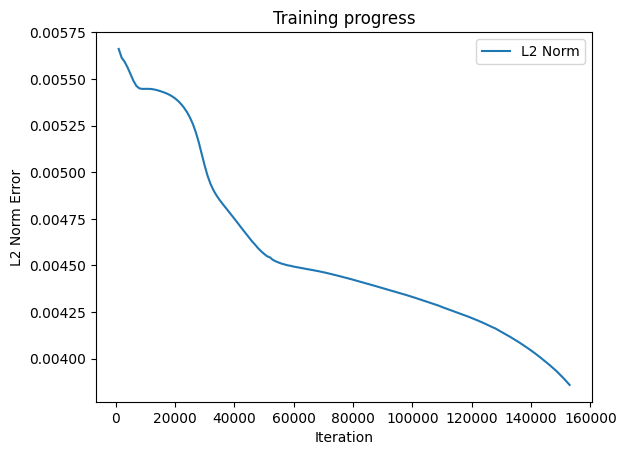

Predicted a: 0.3580944538116455
Predicted b: 2.4872851371765137
Predicted c: 2.42748761177063


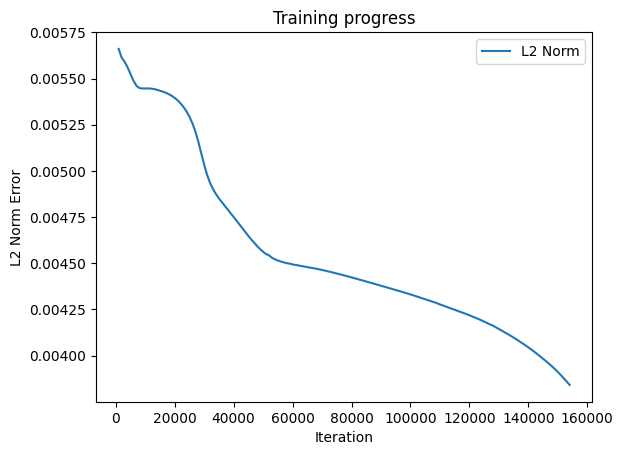

Predicted a: 0.3687613308429718
Predicted b: 2.497628927230835
Predicted c: 2.437739610671997


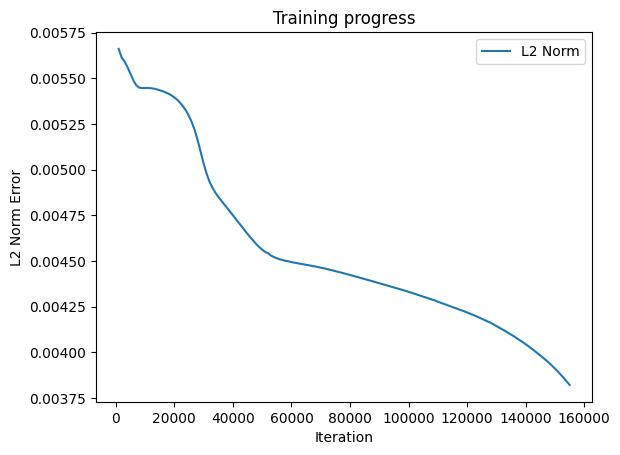

Predicted a: 0.37970179319381714
Predicted b: 2.507880926132202
Predicted c: 2.4479916095733643


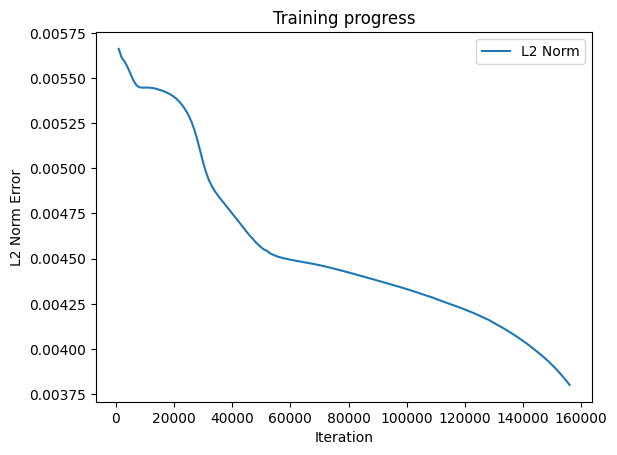

Predicted a: 0.39081963896751404
Predicted b: 2.5181329250335693
Predicted c: 2.4582436084747314


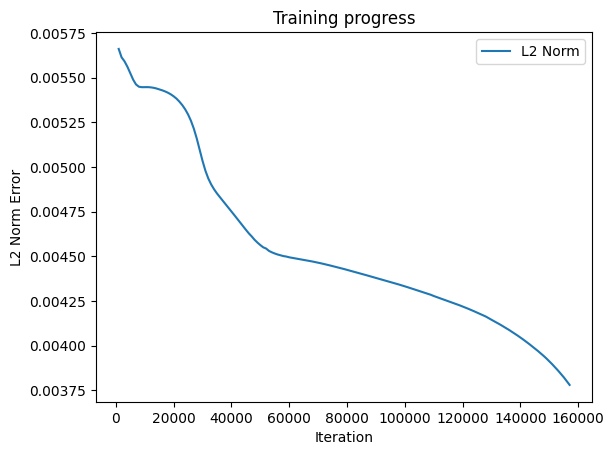

Predicted a: 0.40204721689224243
Predicted b: 2.5283849239349365
Predicted c: 2.4684956073760986


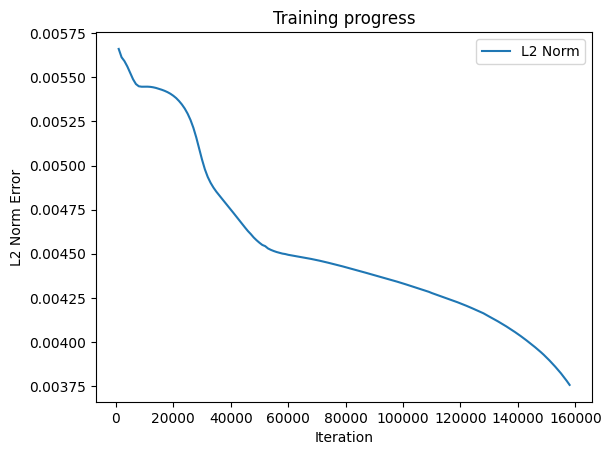

Predicted a: 0.41338464617729187
Predicted b: 2.5386369228363037
Predicted c: 2.478747606277466


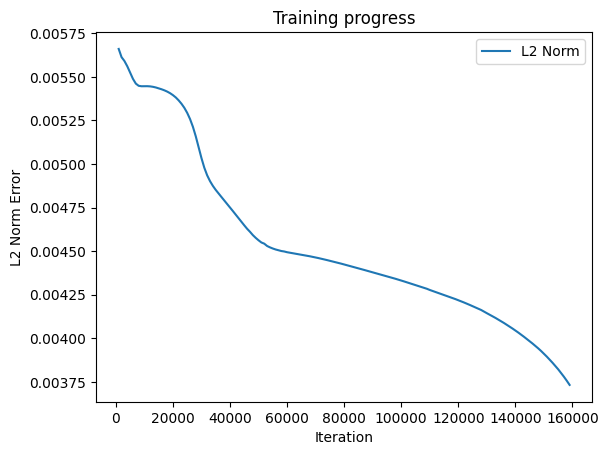

Predicted a: 0.4248172342777252
Predicted b: 2.548888921737671
Predicted c: 2.488999605178833


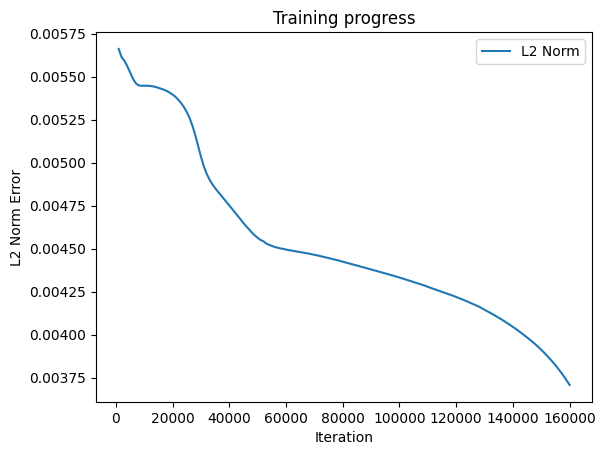

Predicted a: 0.4362761080265045
Predicted b: 2.559140920639038
Predicted c: 2.4992516040802


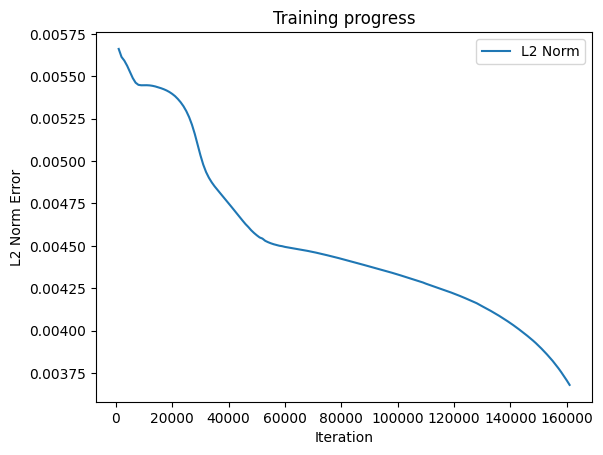

Predicted a: 0.44768986105918884
Predicted b: 2.5693929195404053
Predicted c: 2.5095036029815674


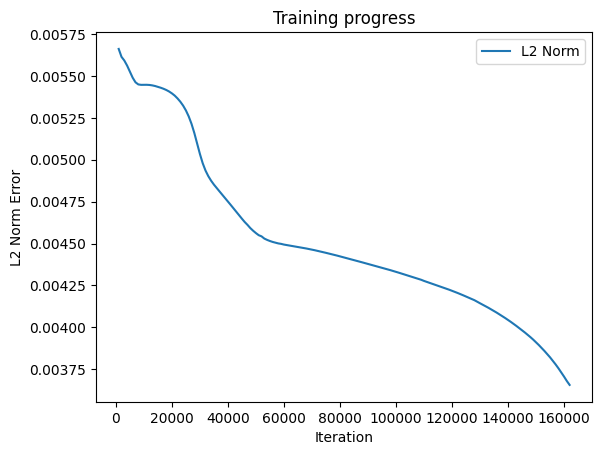

Predicted a: 0.45900651812553406
Predicted b: 2.5796449184417725
Predicted c: 2.5197556018829346


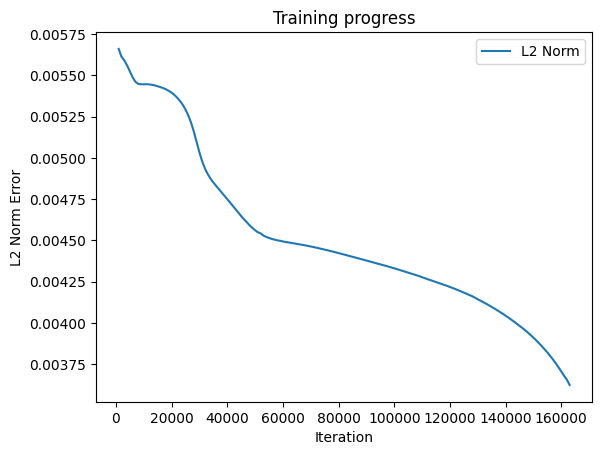

Predicted a: 0.47029823064804077
Predicted b: 2.5898969173431396
Predicted c: 2.5300076007843018


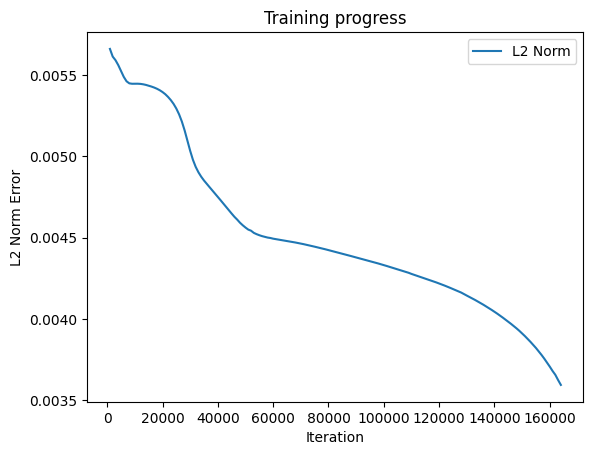

Predicted a: 0.4815467298030853
Predicted b: 2.600148916244507
Predicted c: 2.540259599685669


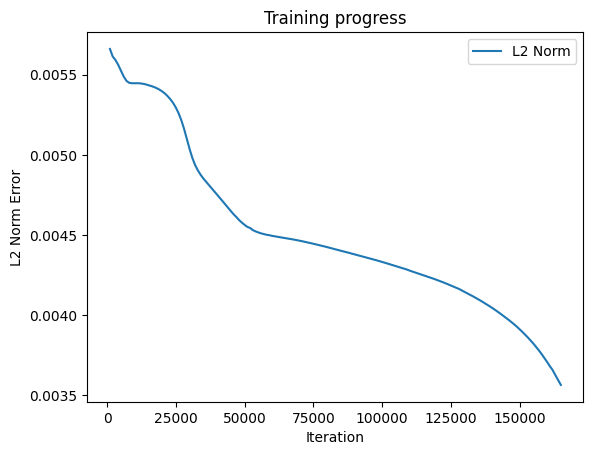

Predicted a: 0.49270567297935486
Predicted b: 2.610400915145874
Predicted c: 2.550511598587036


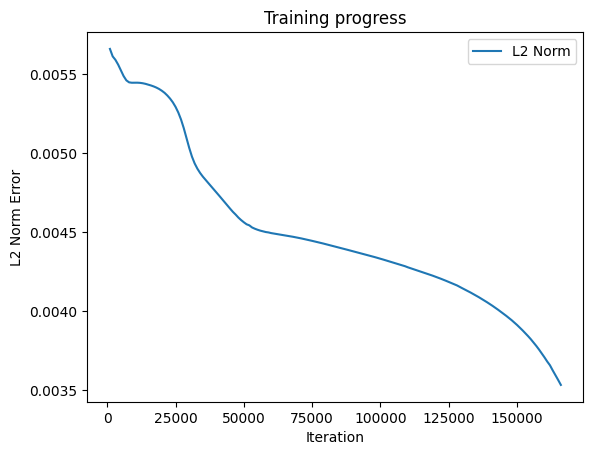

Predicted a: 0.5037622451782227
Predicted b: 2.620652914047241
Predicted c: 2.5607635974884033


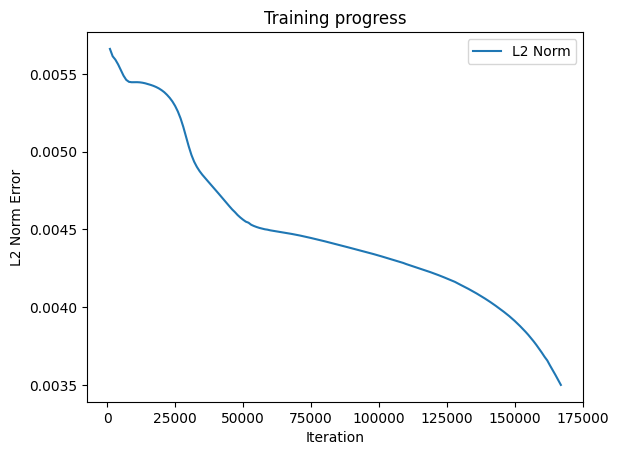

Predicted a: 0.5147411823272705
Predicted b: 2.6309049129486084
Predicted c: 2.5710155963897705


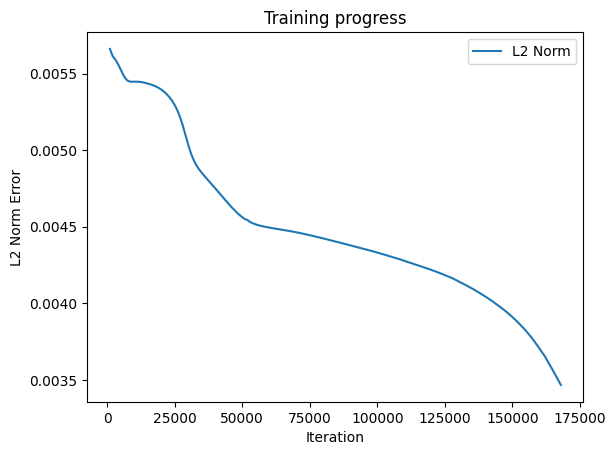

Predicted a: 0.5256264209747314
Predicted b: 2.6411569118499756
Predicted c: 2.5812675952911377


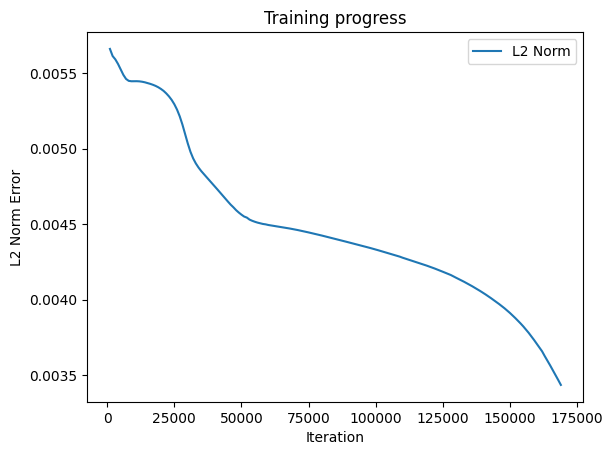

Predicted a: 0.536423921585083
Predicted b: 2.6514089107513428
Predicted c: 2.5914130210876465


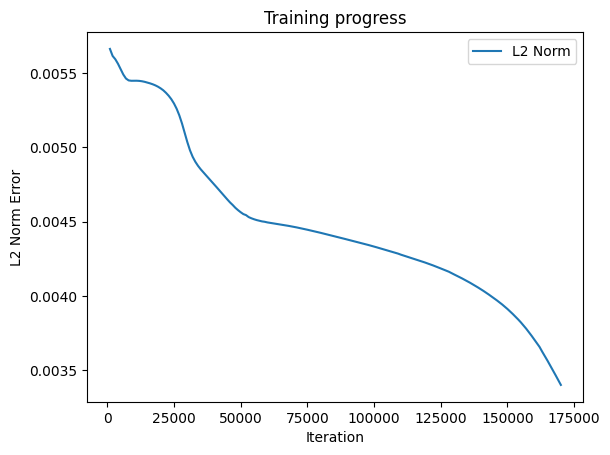

Predicted a: 0.5471651554107666
Predicted b: 2.66166090965271
Predicted c: 2.601426601409912


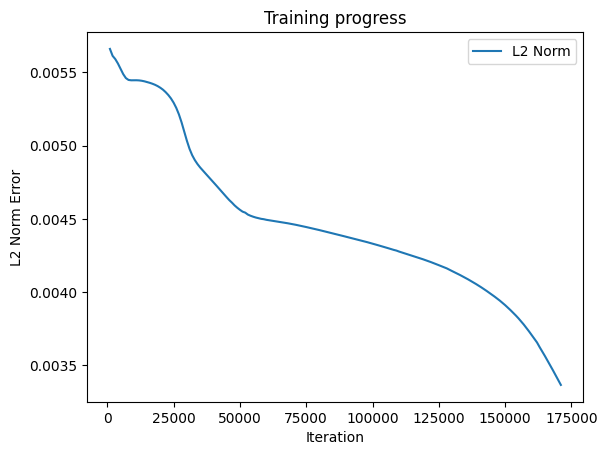

Predicted a: 0.5578343868255615
Predicted b: 2.6716909408569336
Predicted c: 2.6114401817321777


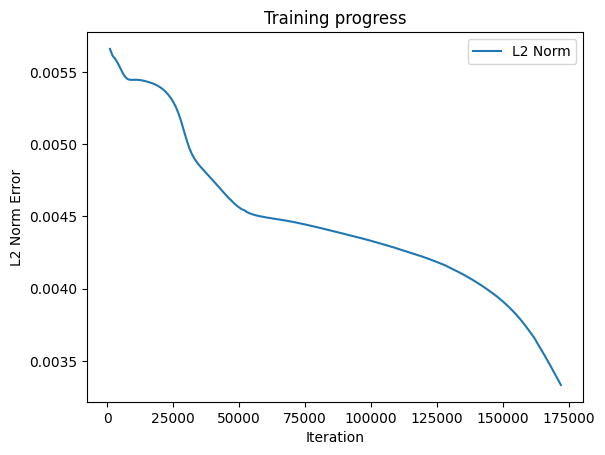

Predicted a: 0.568476676940918
Predicted b: 2.681704521179199
Predicted c: 2.6214537620544434


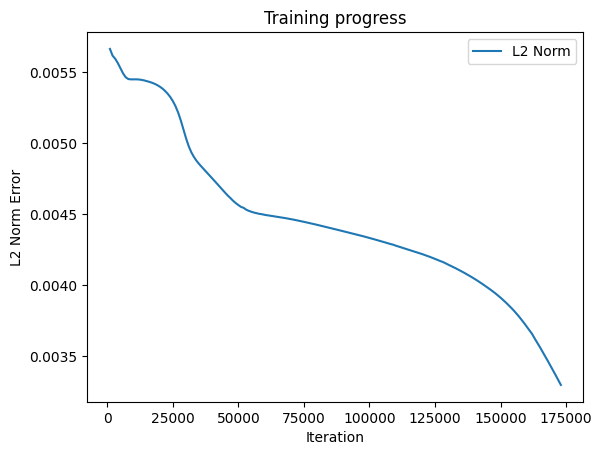

Predicted a: 0.5790846943855286
Predicted b: 2.691718101501465
Predicted c: 2.631467342376709


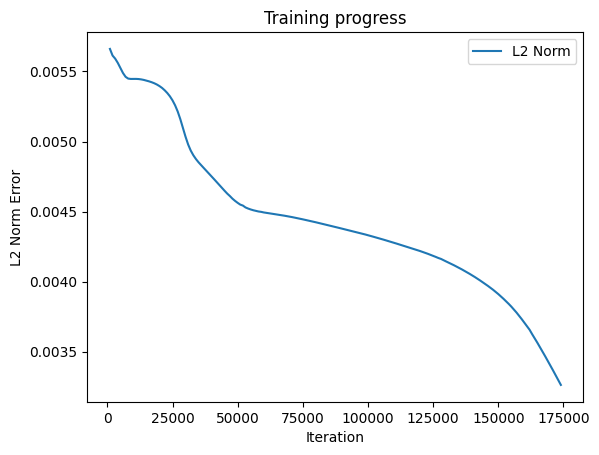

Predicted a: 0.5896347165107727
Predicted b: 2.7017316818237305
Predicted c: 2.6414809226989746


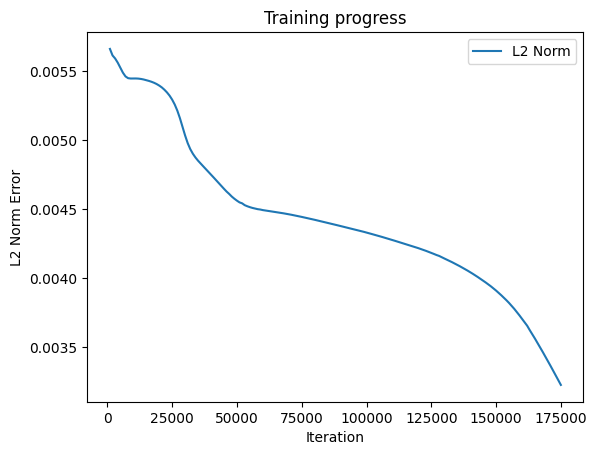

Predicted a: 0.6001707315444946
Predicted b: 2.711745262145996
Predicted c: 2.6514945030212402


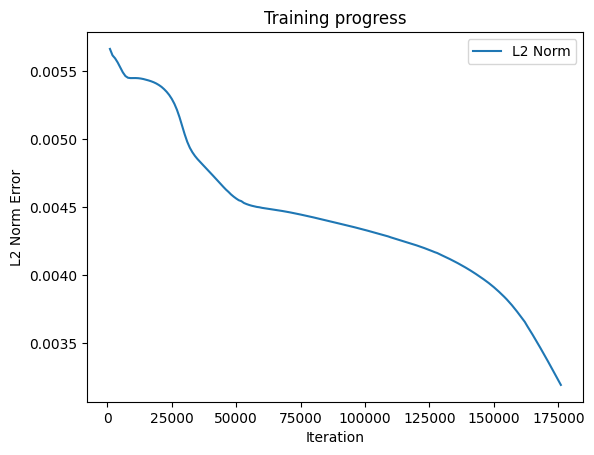

Predicted a: 0.6106611490249634
Predicted b: 2.7217588424682617
Predicted c: 2.661508083343506


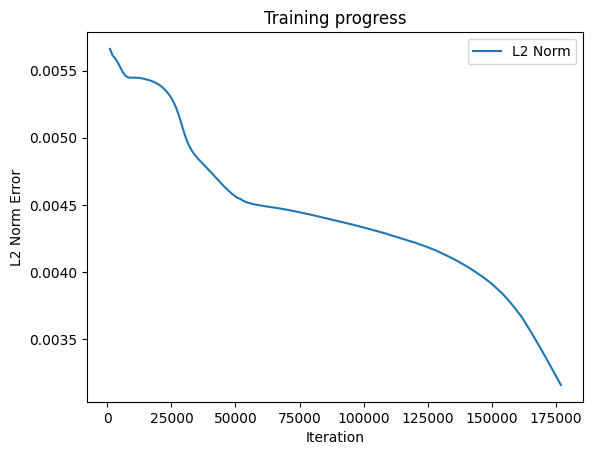

Predicted a: 0.6211419701576233
Predicted b: 2.7317724227905273
Predicted c: 2.6715216636657715


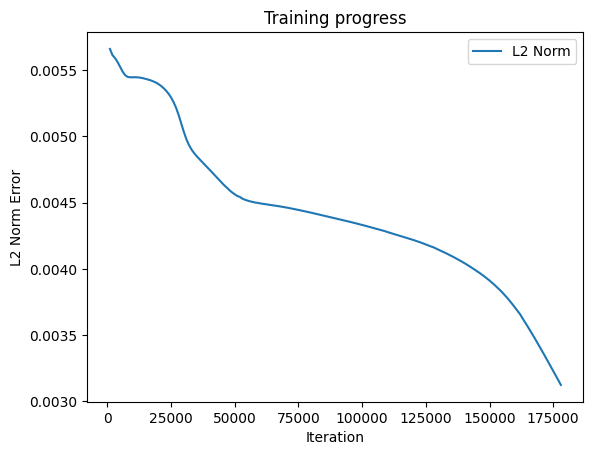

Predicted a: 0.6315727829933167
Predicted b: 2.741786003112793
Predicted c: 2.681535243988037


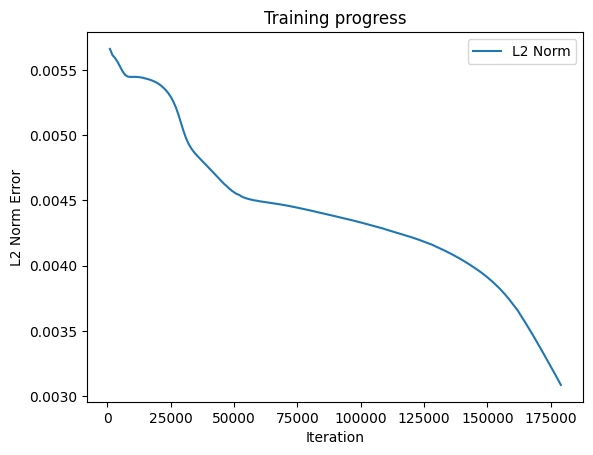

Predicted a: 0.64200359582901
Predicted b: 2.7516374588012695
Predicted c: 2.6915488243103027


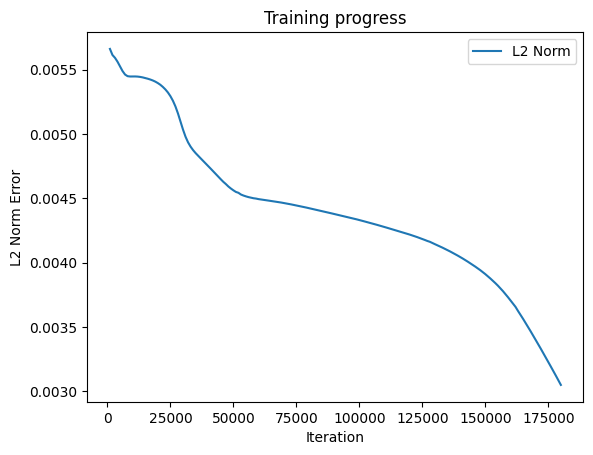

Predicted a: 0.6524344086647034
Predicted b: 2.7614126205444336
Predicted c: 2.7015624046325684


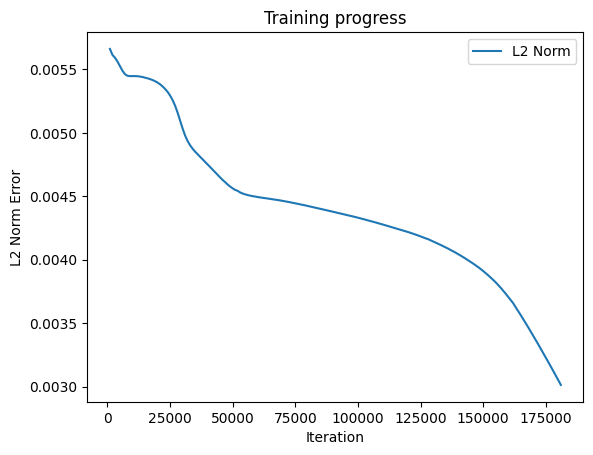

Predicted a: 0.6628652215003967
Predicted b: 2.7711877822875977
Predicted c: 2.711575984954834


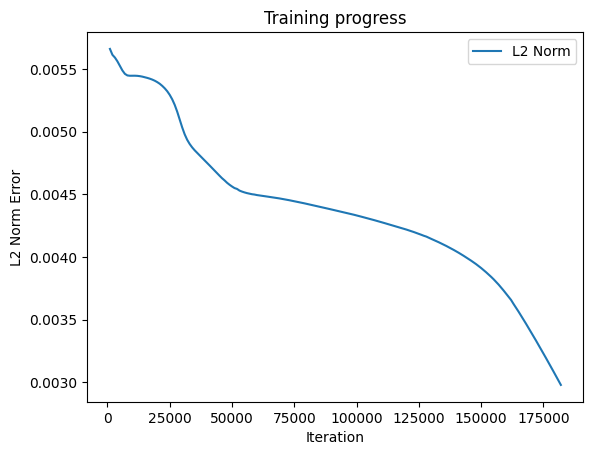

Predicted a: 0.6732960343360901
Predicted b: 2.7809629440307617
Predicted c: 2.7215895652770996


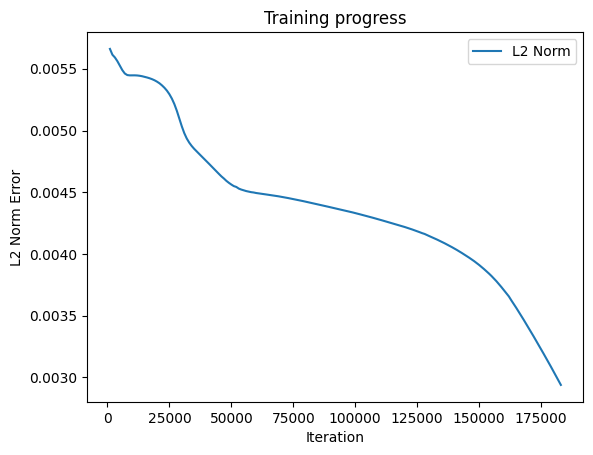

Predicted a: 0.6837268471717834
Predicted b: 2.790738105773926
Predicted c: 2.7314207553863525


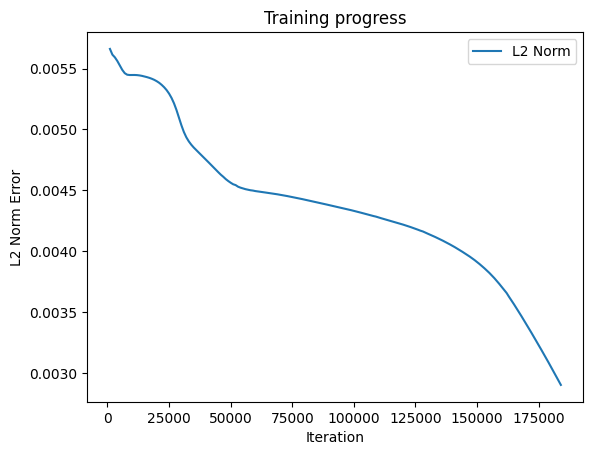

Predicted a: 0.694133996963501
Predicted b: 2.8003721237182617
Predicted c: 2.7411959171295166


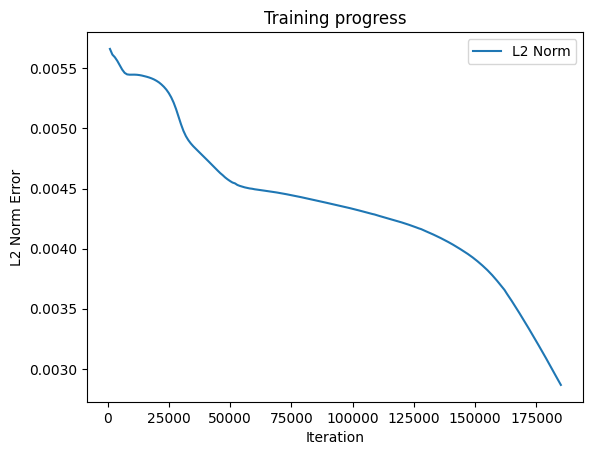

Predicted a: 0.704505205154419
Predicted b: 2.809908866882324
Predicted c: 2.7509710788726807


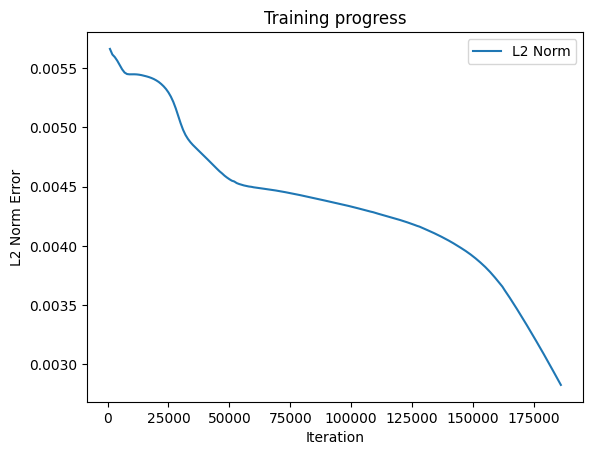

Predicted a: 0.7148764133453369
Predicted b: 2.8194456100463867
Predicted c: 2.7607462406158447


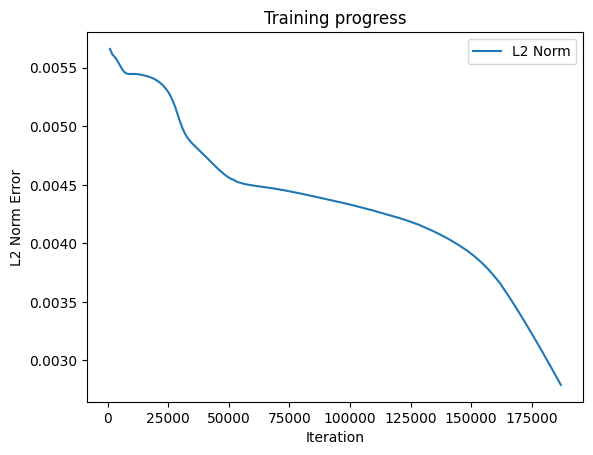

Predicted a: 0.7252476215362549
Predicted b: 2.8288307189941406
Predicted c: 2.770521402359009


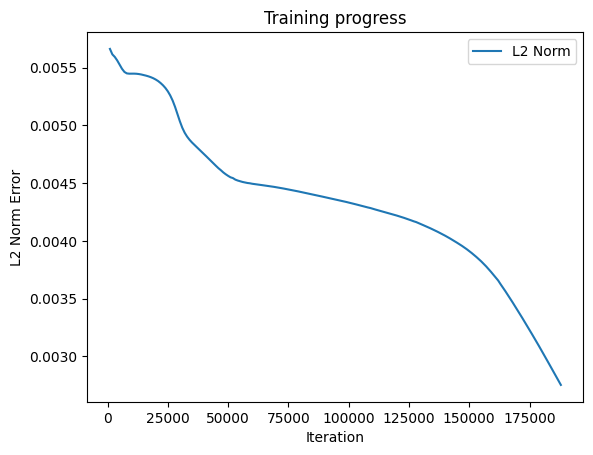

Predicted a: 0.7356188297271729
Predicted b: 2.8381290435791016
Predicted c: 2.780296564102173


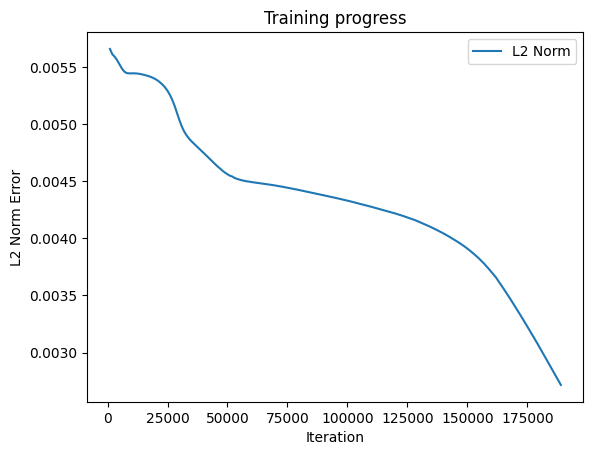

Predicted a: 0.7459681630134583
Predicted b: 2.8472723960876465
Predicted c: 2.789933443069458


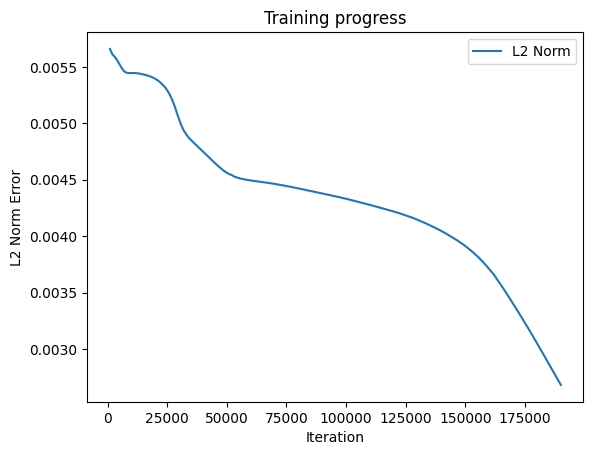

Predicted a: 0.7562797665596008
Predicted b: 2.856276750564575
Predicted c: 2.7994701862335205


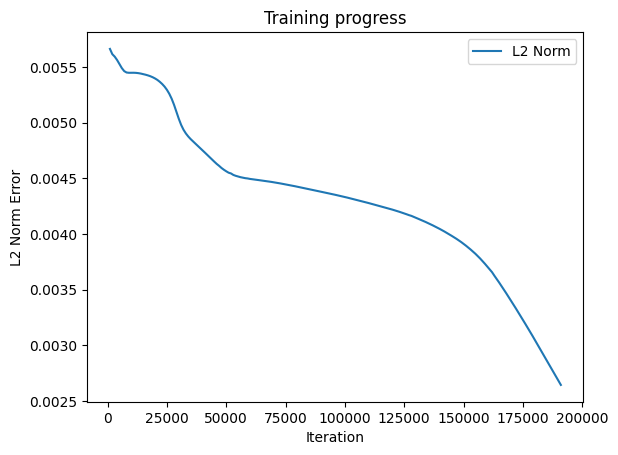

Predicted a: 0.7665913701057434
Predicted b: 2.8650624752044678
Predicted c: 2.809006929397583


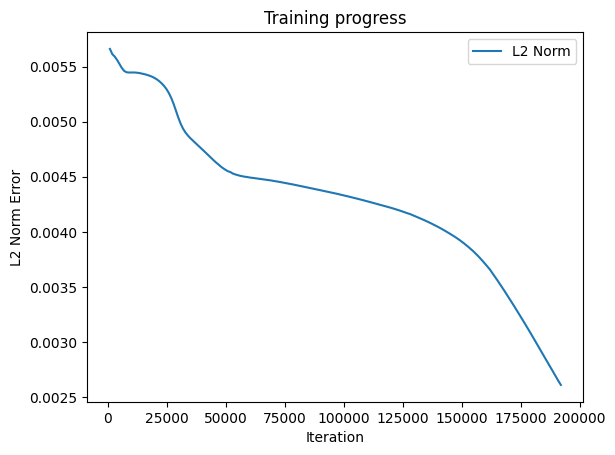

Predicted a: 0.7768636345863342
Predicted b: 2.873574733734131
Predicted c: 2.818471908569336


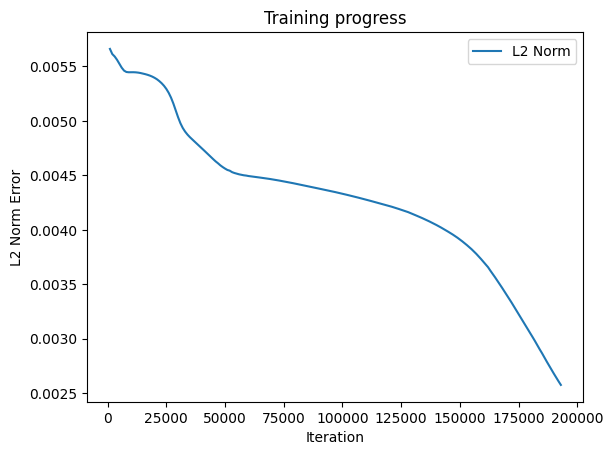

Predicted a: 0.7871156334877014
Predicted b: 2.881767511367798
Predicted c: 2.827770233154297


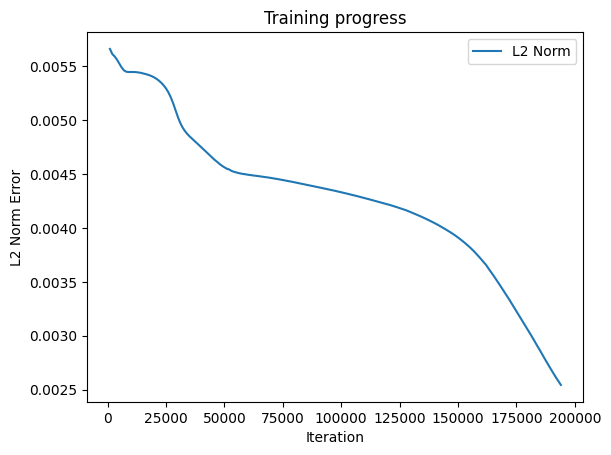

Predicted a: 0.797327995300293
Predicted b: 2.8894739151000977
Predicted c: 2.8370554447174072


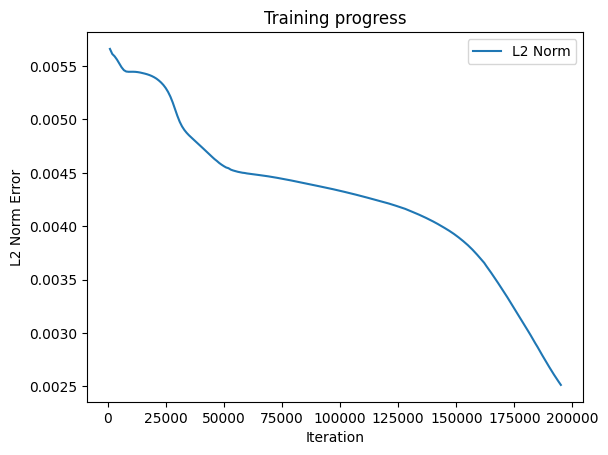

Predicted a: 0.8075203895568848
Predicted b: 2.8965413570404053
Predicted c: 2.8461153507232666


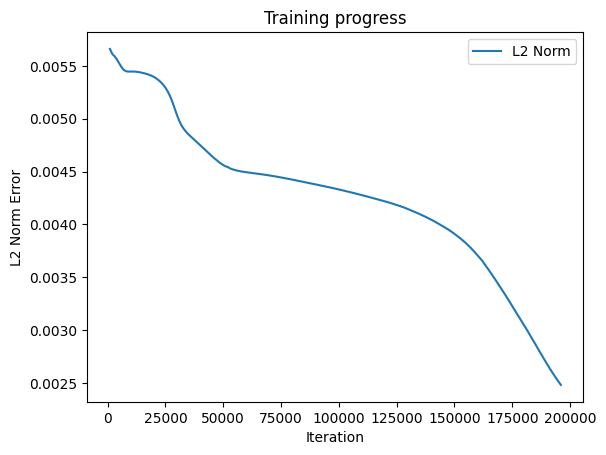

Predicted a: 0.8176595568656921
Predicted b: 2.902649164199829
Predicted c: 2.855076313018799


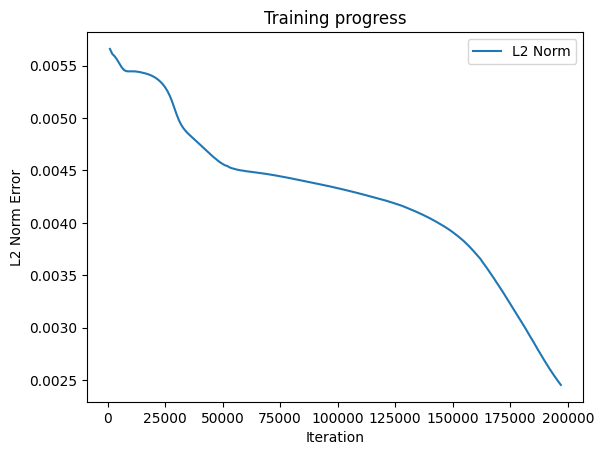

Predicted a: 0.827785074710846
Predicted b: 2.9073266983032227
Predicted c: 2.8638648986816406


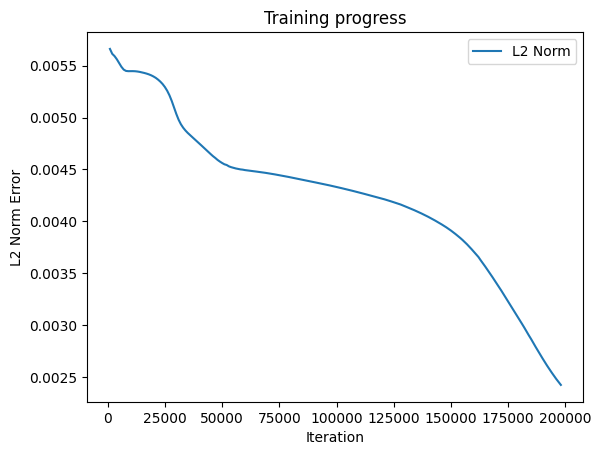

Predicted a: 0.837858259677887
Predicted b: 2.910031795501709
Predicted c: 2.8724210262298584


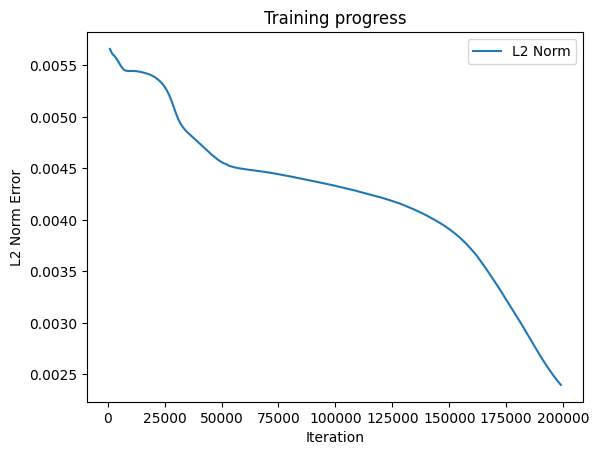

Predicted a: 0.8478835821151733
Predicted b: 2.9106621742248535
Predicted c: 2.8807032108306885


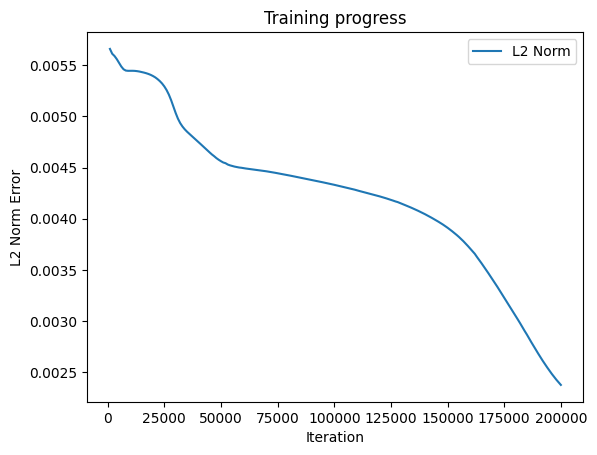

Predicted a: 0.8578754663467407
Predicted b: 2.9100968837738037
Predicted c: 2.8886780738830566


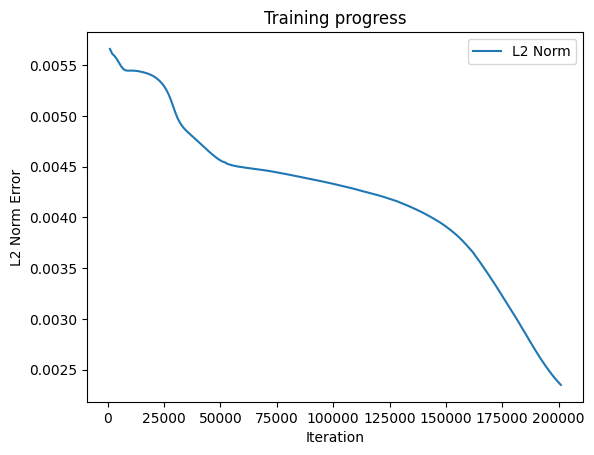

Predicted a: 0.867829442024231
Predicted b: 2.90927791595459
Predicted c: 2.896197557449341


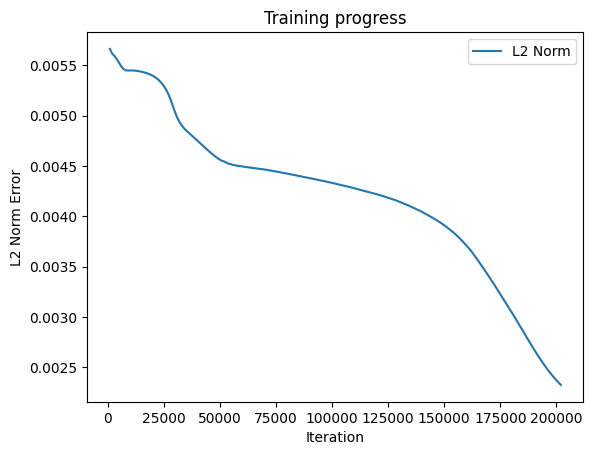

Predicted a: 0.8777834177017212
Predicted b: 2.908482313156128
Predicted c: 2.9031033515930176


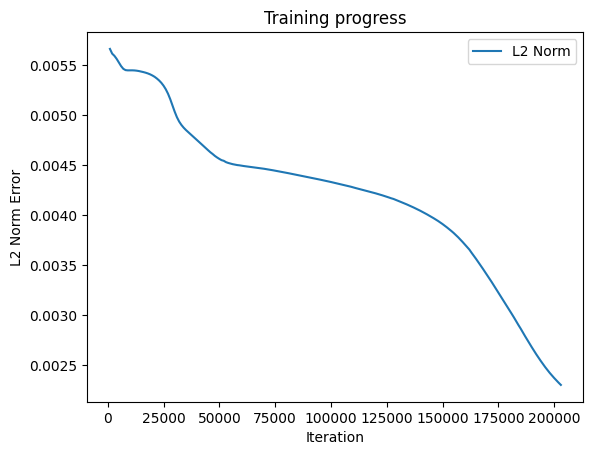

Predicted a: 0.8876805901527405
Predicted b: 2.9078187942504883
Predicted c: 2.9091267585754395


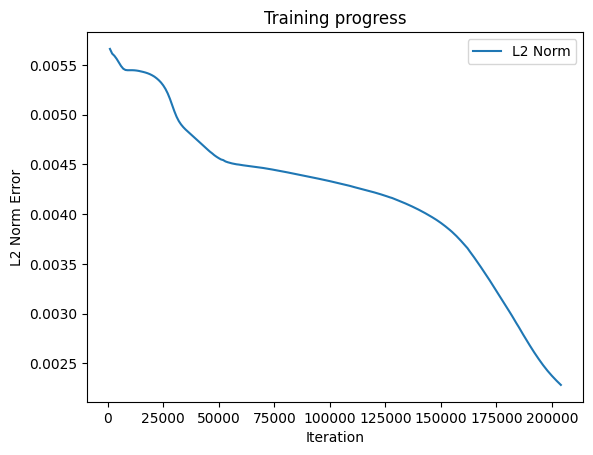

Predicted a: 0.8975749611854553
Predicted b: 2.907193422317505
Predicted c: 2.9139974117279053


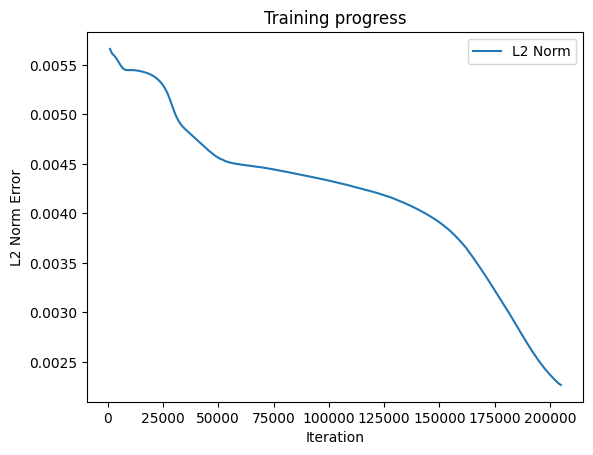

Predicted a: 0.9074332118034363
Predicted b: 2.906731367111206
Predicted c: 2.917396068572998


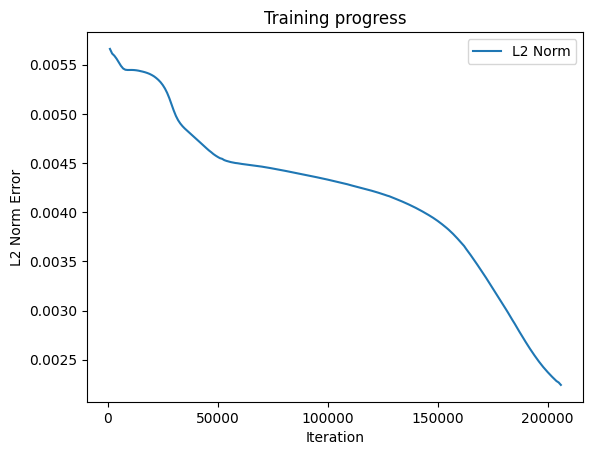

Predicted a: 0.9172679781913757
Predicted b: 2.906341552734375
Predicted c: 2.9194750785827637


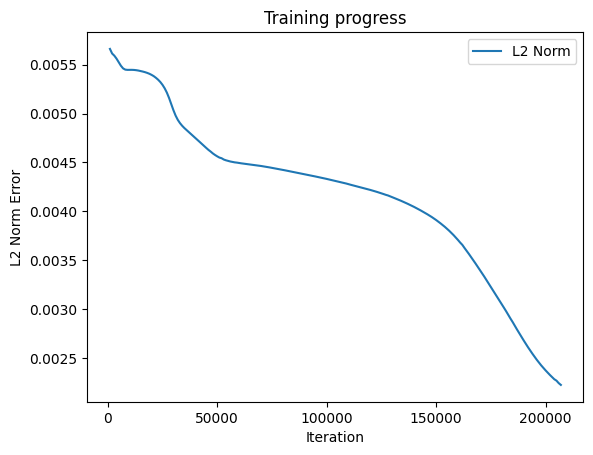

Predicted a: 0.9271027445793152
Predicted b: 2.90602445602417
Predicted c: 2.9206857681274414


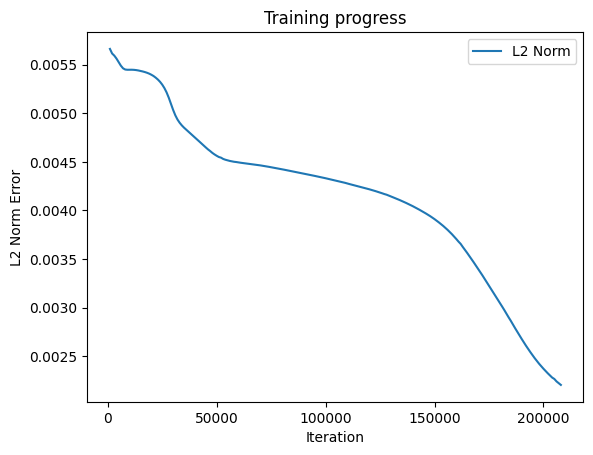

Predicted a: 0.9368806481361389
Predicted b: 2.9057693481445312
Predicted c: 2.921542167663574


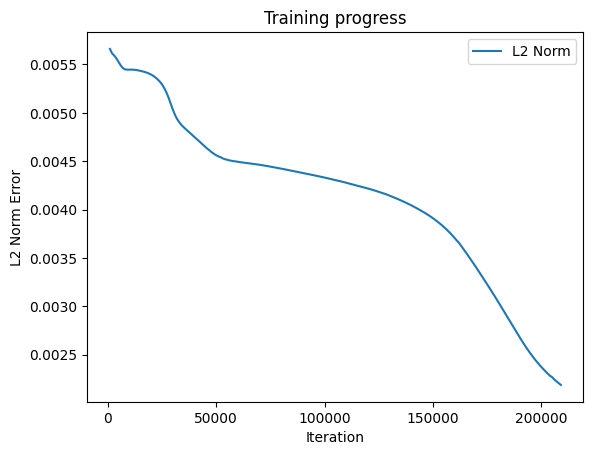

Predicted a: 0.946655809879303
Predicted b: 2.9055545330047607
Predicted c: 2.9222629070281982


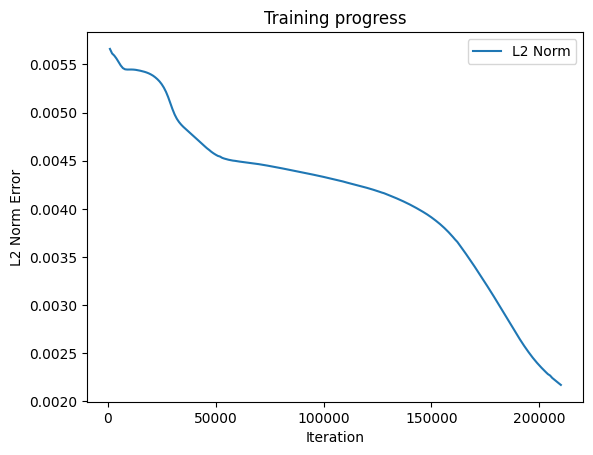

Predicted a: 0.956430971622467
Predicted b: 2.905371904373169
Predicted c: 2.922910213470459


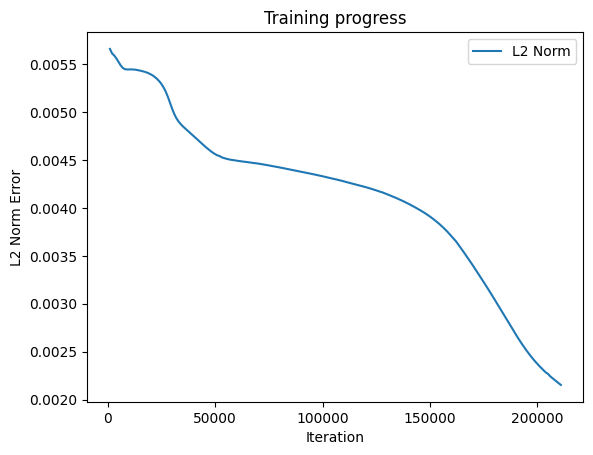

Predicted a: 0.9662061333656311
Predicted b: 2.905214309692383
Predicted c: 2.9235270023345947


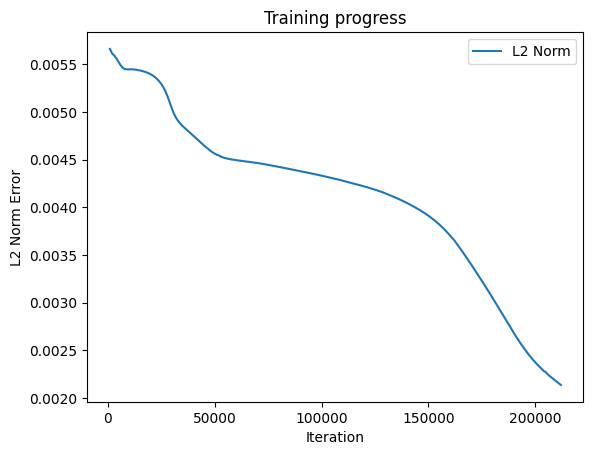

Predicted a: 0.9759812951087952
Predicted b: 2.905081033706665
Predicted c: 2.9241385459899902


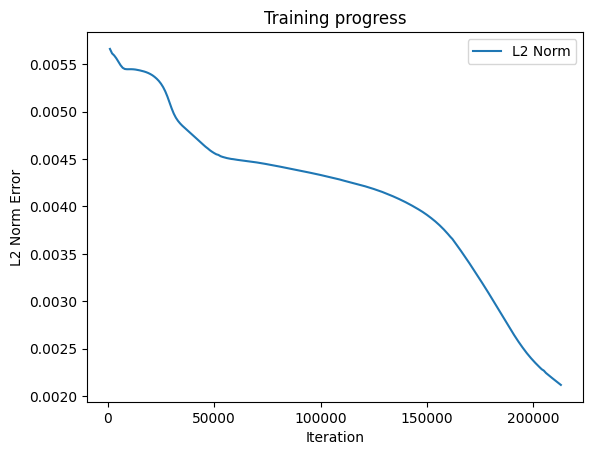

Predicted a: 0.9857564568519592
Predicted b: 2.9049620628356934
Predicted c: 2.924746036529541


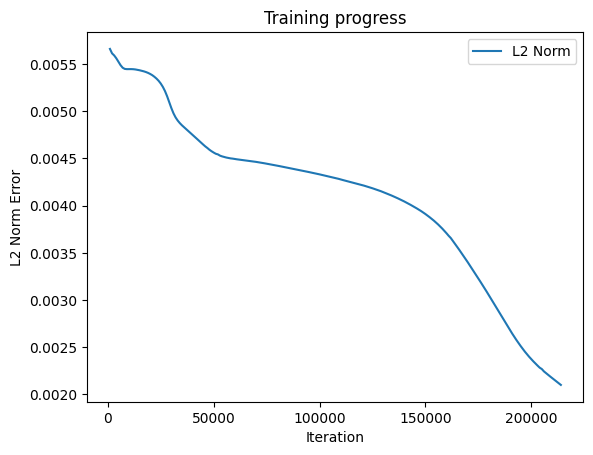

Predicted a: 0.9955316185951233
Predicted b: 2.9048638343811035
Predicted c: 2.9253501892089844


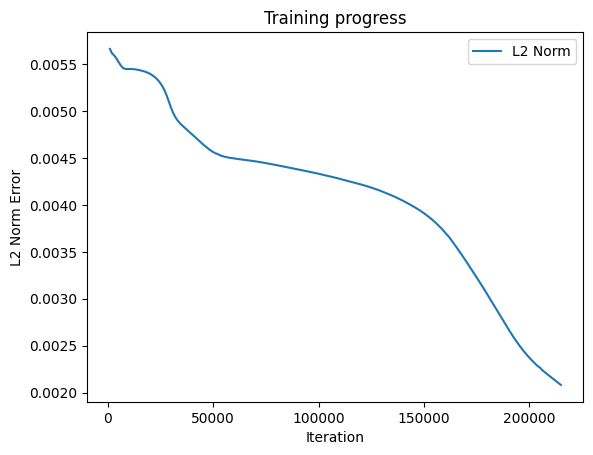

Predicted a: 1.0053067207336426
Predicted b: 2.9047834873199463
Predicted c: 2.9259588718414307


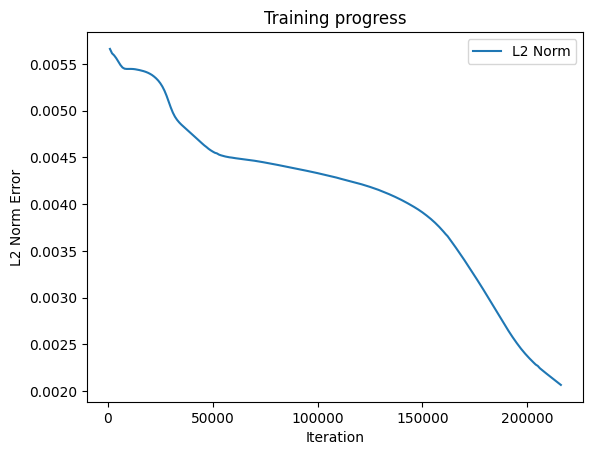

Predicted a: 1.0150818824768066
Predicted b: 2.90472674369812
Predicted c: 2.9265758991241455


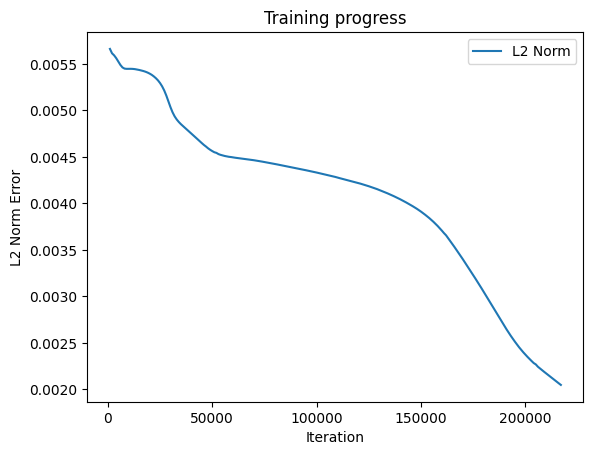

Predicted a: 1.0248570442199707
Predicted b: 2.9047000408172607
Predicted c: 2.927201271057129


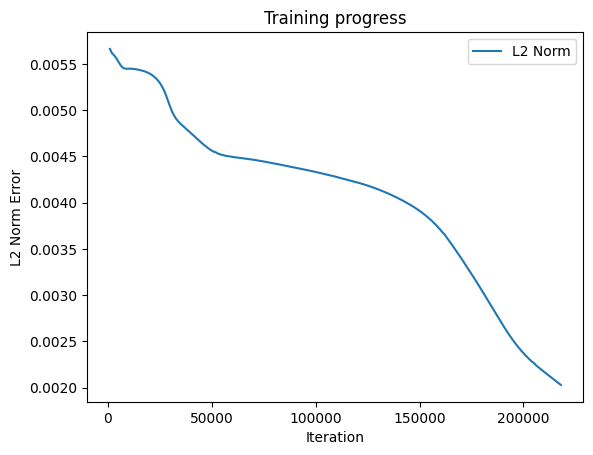

Predicted a: 1.0346322059631348
Predicted b: 2.904684543609619
Predicted c: 2.9278311729431152


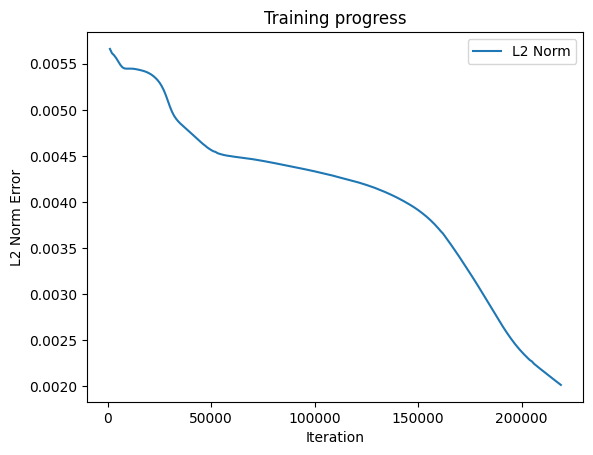

Predicted a: 1.0444073677062988
Predicted b: 2.904684543609619
Predicted c: 2.928466320037842


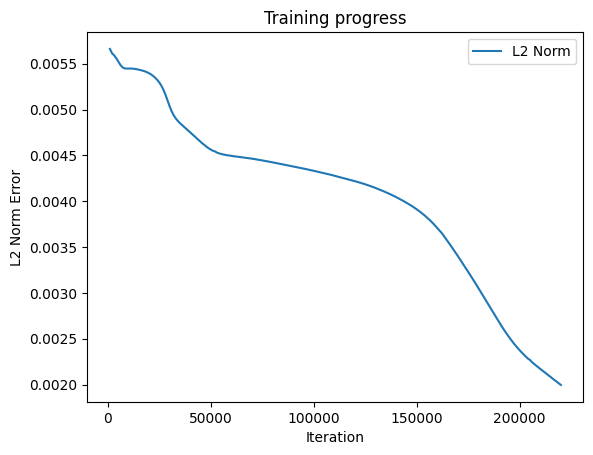

Predicted a: 1.0541584491729736
Predicted b: 2.904700756072998
Predicted c: 2.92910099029541


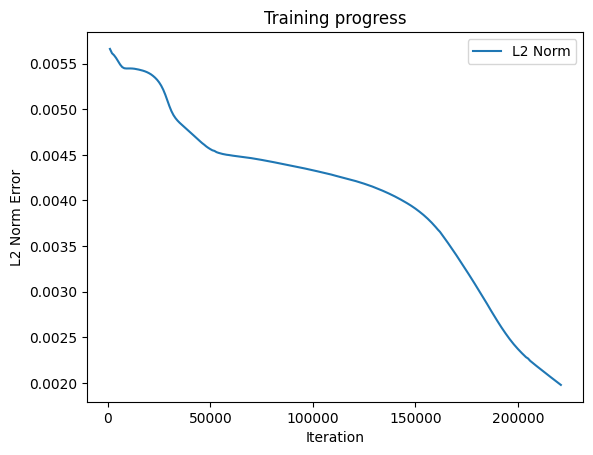

Predicted a: 1.0638172626495361
Predicted b: 2.9047305583953857
Predicted c: 2.9297311305999756


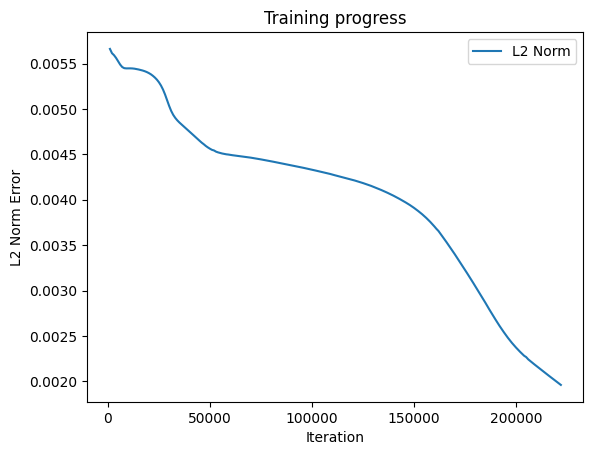

Predicted a: 1.0734732151031494
Predicted b: 2.9047794342041016
Predicted c: 2.930368423461914


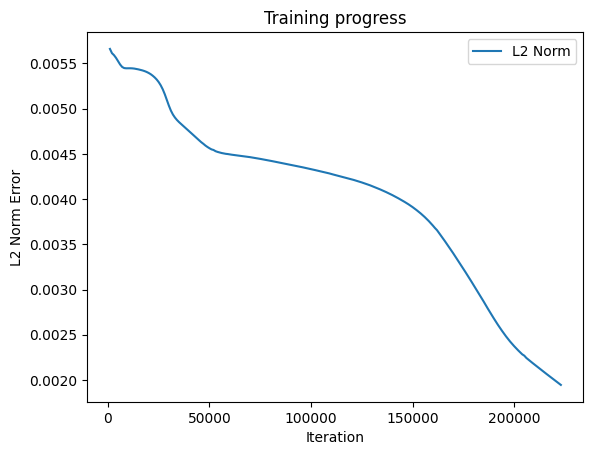

Predicted a: 1.0831291675567627
Predicted b: 2.90484619140625
Predicted c: 2.931008815765381


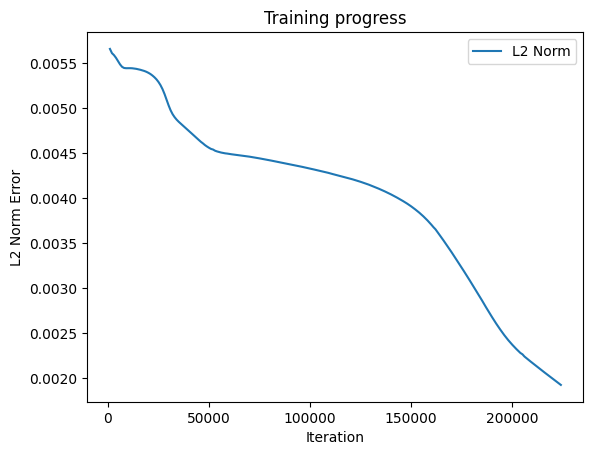

Predicted a: 1.092785120010376
Predicted b: 2.904935121536255
Predicted c: 2.9316582679748535


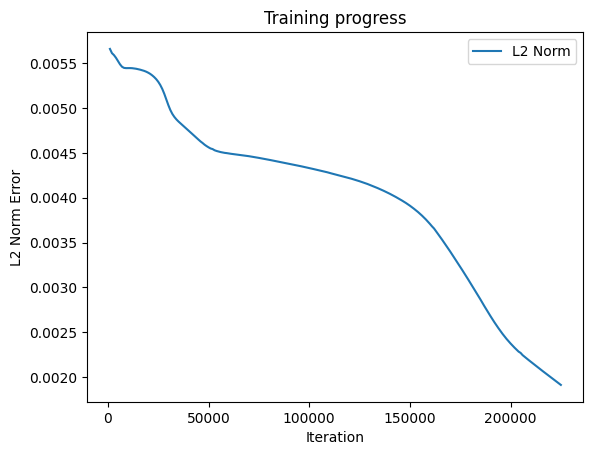

Predicted a: 1.1024410724639893
Predicted b: 2.905039072036743
Predicted c: 2.932316780090332


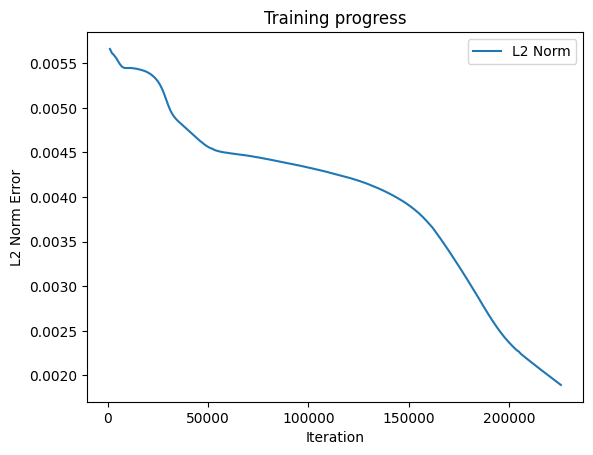

Predicted a: 1.1120970249176025
Predicted b: 2.905162811279297
Predicted c: 2.932978868484497


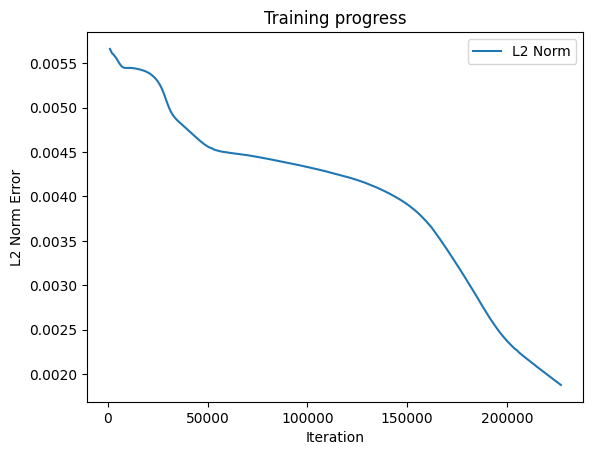

Predicted a: 1.1217529773712158
Predicted b: 2.9053218364715576
Predicted c: 2.9336564540863037


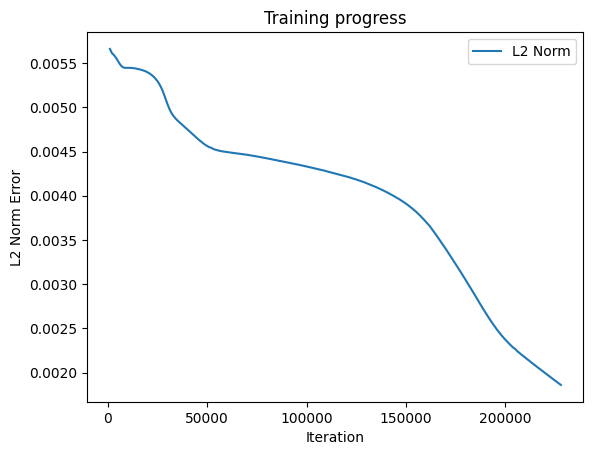

Predicted a: 1.131408929824829
Predicted b: 2.905487298965454
Predicted c: 2.9343440532684326


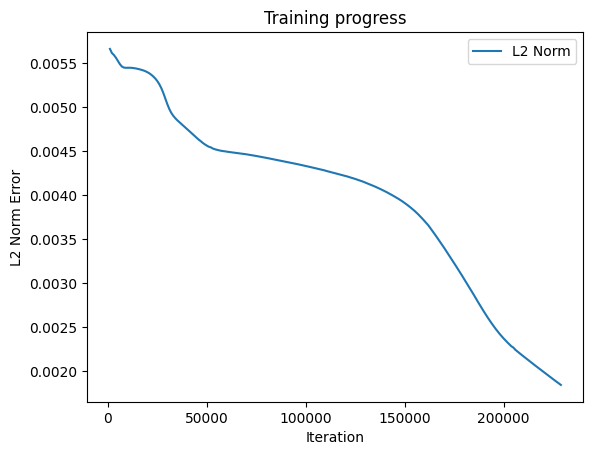

Predicted a: 1.1410648822784424
Predicted b: 2.905653953552246
Predicted c: 2.9350268840789795


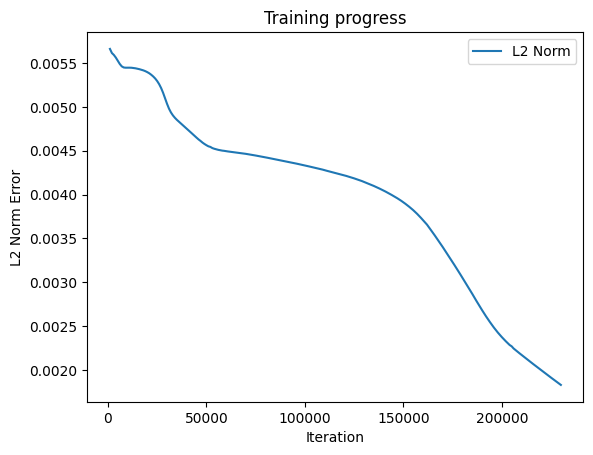

Predicted a: 1.1507208347320557
Predicted b: 2.9058492183685303
Predicted c: 2.9357197284698486


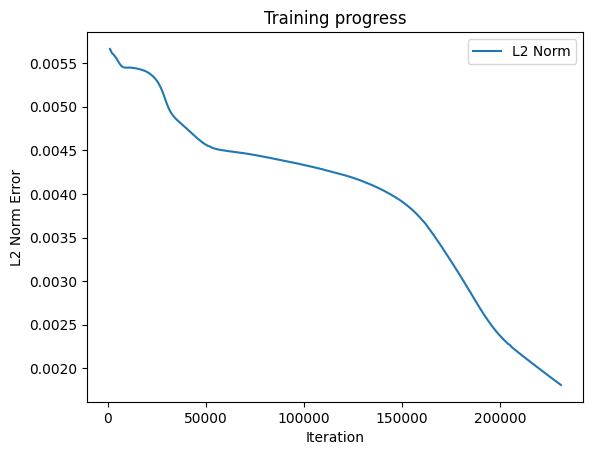

Predicted a: 1.160376787185669
Predicted b: 2.906052827835083
Predicted c: 2.9364142417907715


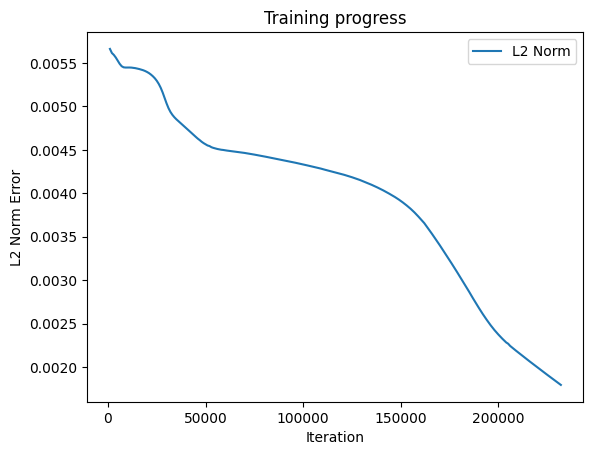

Predicted a: 1.1700327396392822
Predicted b: 2.906264305114746
Predicted c: 2.937108278274536


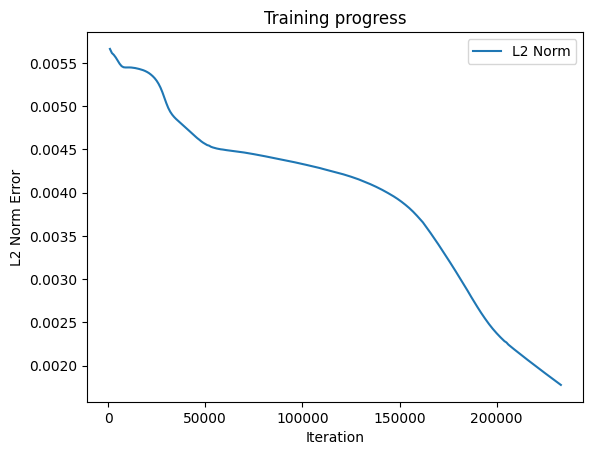

Predicted a: 1.1796754598617554
Predicted b: 2.9064853191375732
Predicted c: 2.9378063678741455


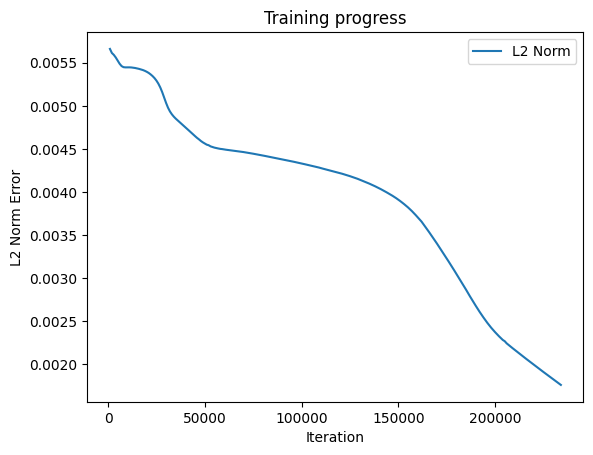

Predicted a: 1.1892226934432983
Predicted b: 2.906712055206299
Predicted c: 2.938498020172119


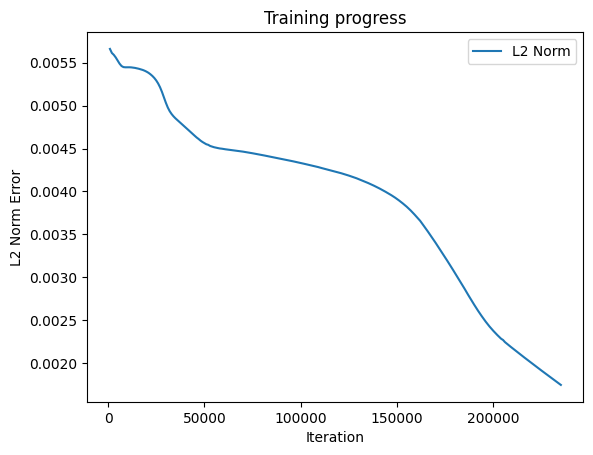

Predicted a: 1.1987594366073608
Predicted b: 2.9069466590881348
Predicted c: 2.9391913414001465


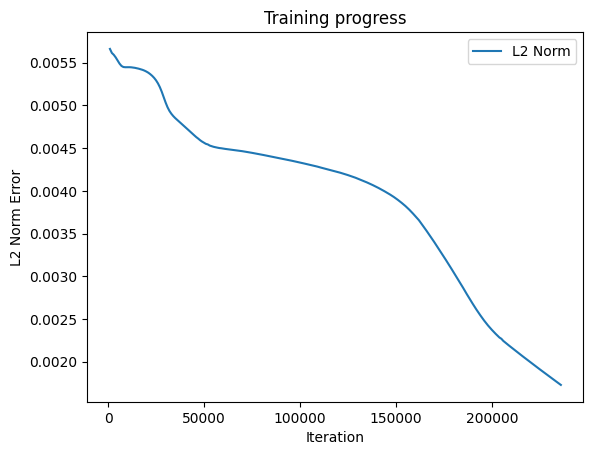

Predicted a: 1.2082961797714233
Predicted b: 2.9071950912475586
Predicted c: 2.939889669418335


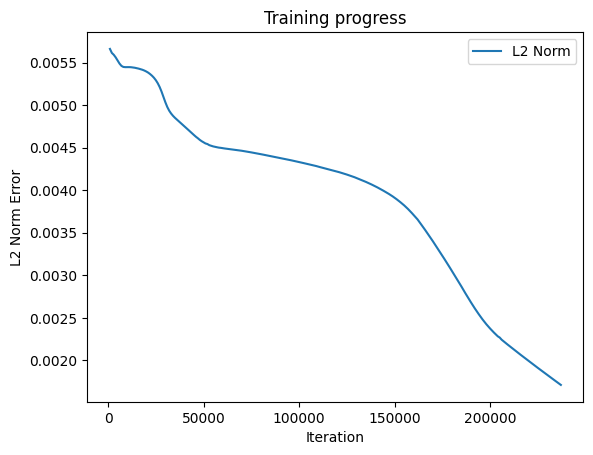

Predicted a: 1.2178329229354858
Predicted b: 2.907456398010254
Predicted c: 2.94058895111084


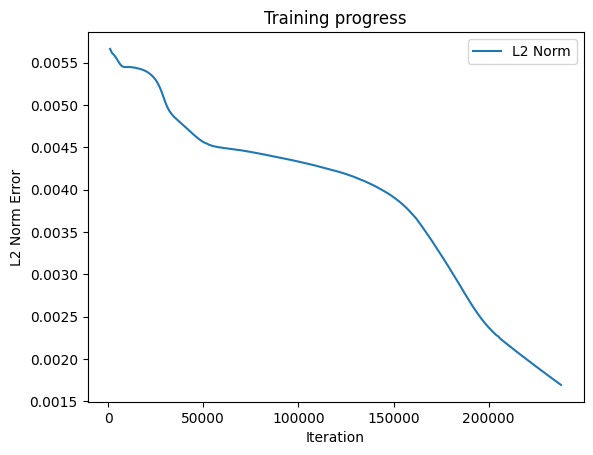

Predicted a: 1.2273696660995483
Predicted b: 2.907731533050537
Predicted c: 2.941291093826294


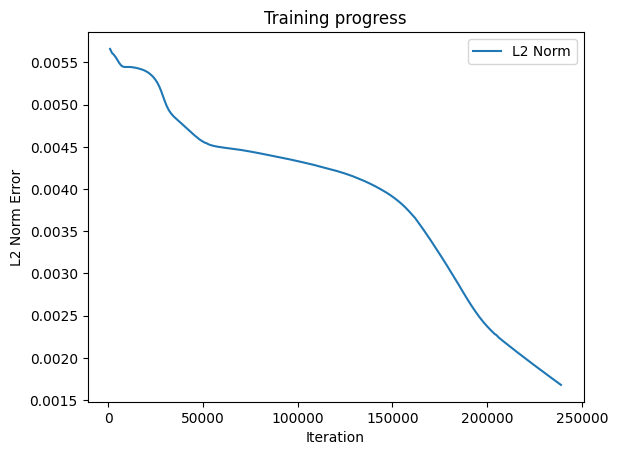

Predicted a: 1.2369064092636108
Predicted b: 2.908017635345459
Predicted c: 2.941993474960327


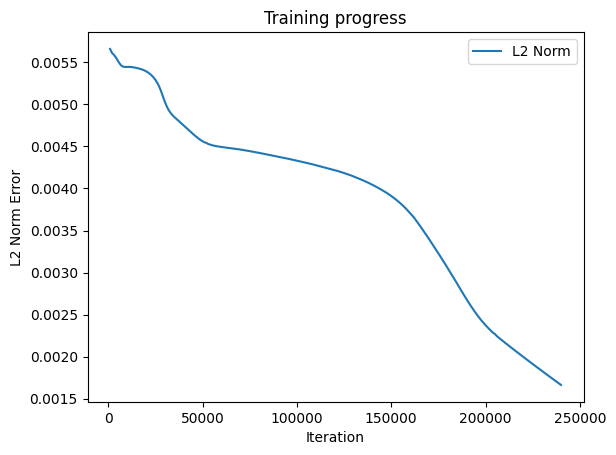

Predicted a: 1.2464431524276733
Predicted b: 2.9083144664764404
Predicted c: 2.9426965713500977


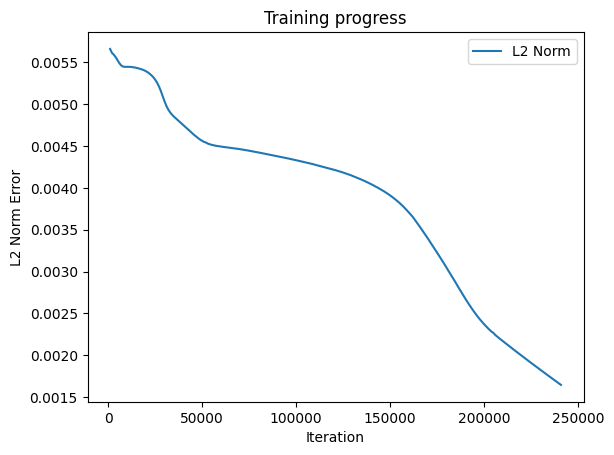

Predicted a: 1.2559798955917358
Predicted b: 2.9086217880249023
Predicted c: 2.9433975219726562


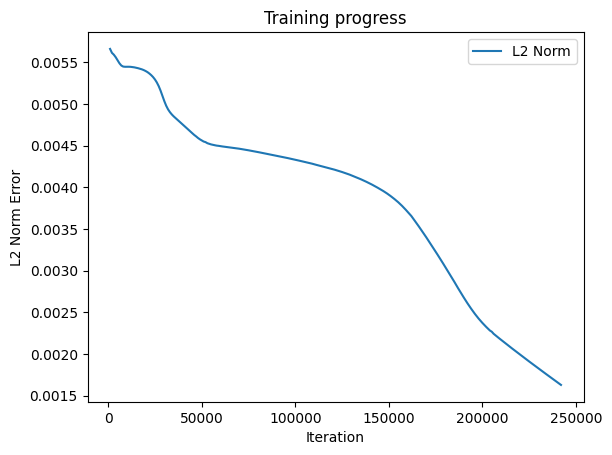

Predicted a: 1.2654792070388794
Predicted b: 2.908937692642212
Predicted c: 2.9440877437591553


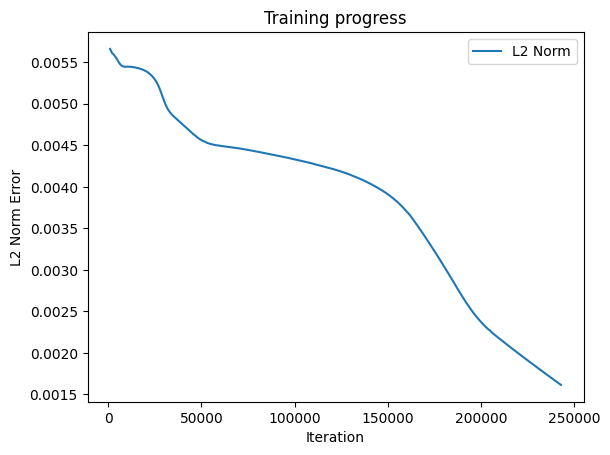

Predicted a: 1.2748967409133911
Predicted b: 2.909257173538208
Predicted c: 2.9447641372680664


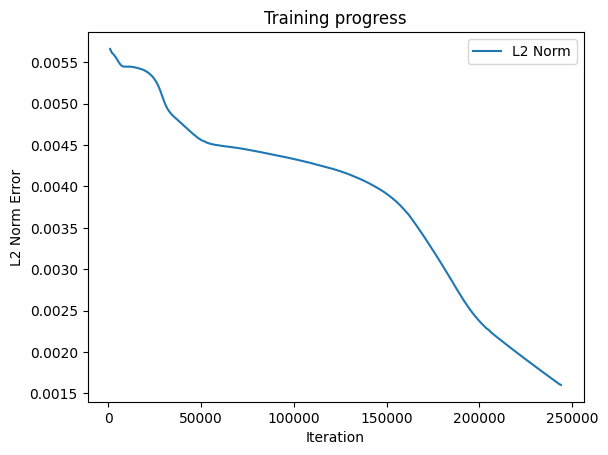

Predicted a: 1.2843142747879028
Predicted b: 2.9095871448516846
Predicted c: 2.9454314708709717


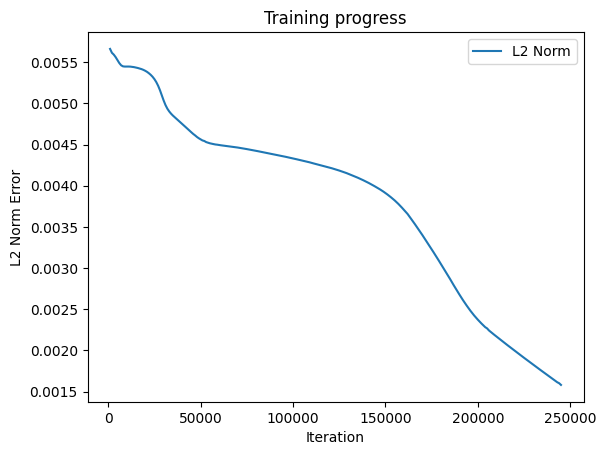

Predicted a: 1.2937318086624146
Predicted b: 2.909925699234009
Predicted c: 2.946091890335083


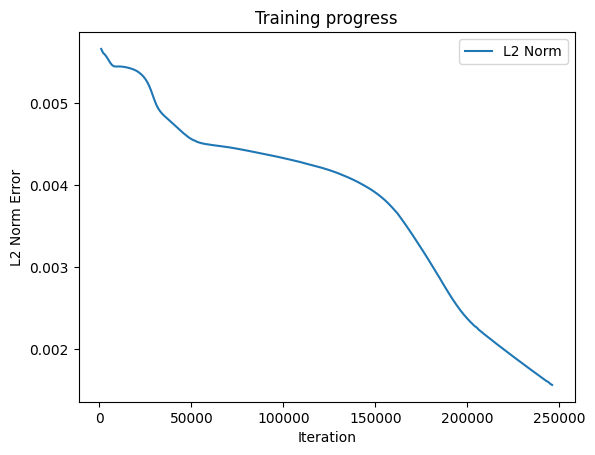

Predicted a: 1.3031493425369263
Predicted b: 2.910273790359497
Predicted c: 2.9467408657073975


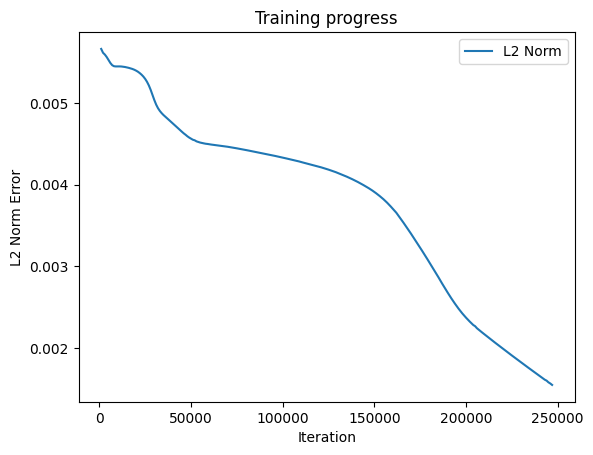

Predicted a: 1.312566876411438
Predicted b: 2.9106273651123047
Predicted c: 2.9473798274993896


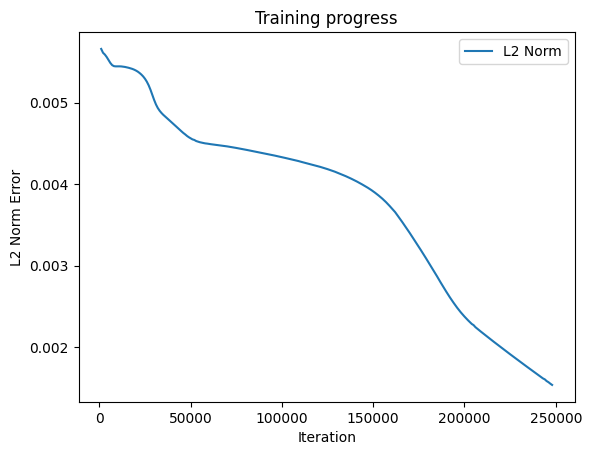

Predicted a: 1.3218693733215332
Predicted b: 2.910980224609375
Predicted c: 2.94800066947937


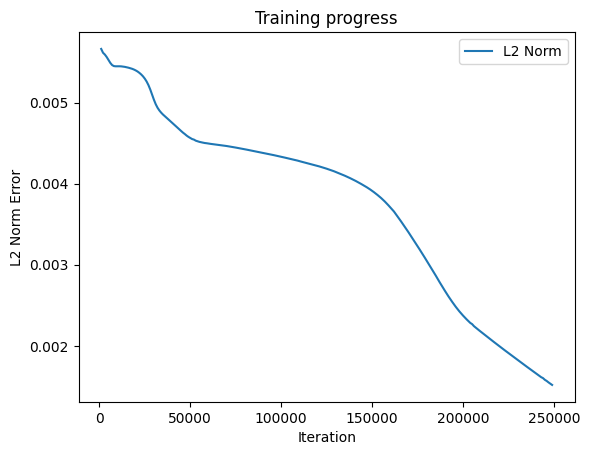

Predicted a: 1.3311676979064941
Predicted b: 2.911334276199341
Predicted c: 2.94860577583313


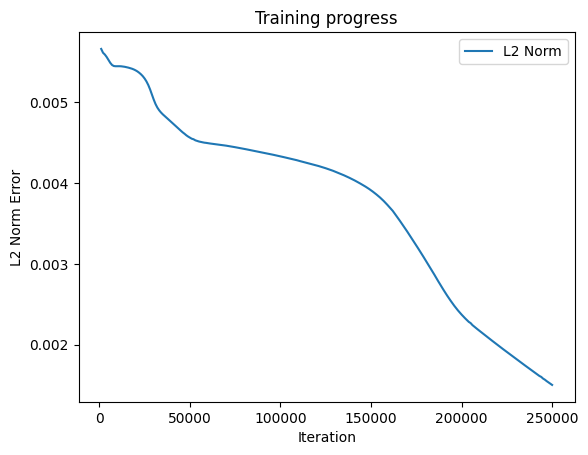

Predicted a: 1.340466022491455
Predicted b: 2.9116926193237305
Predicted c: 2.9492027759552


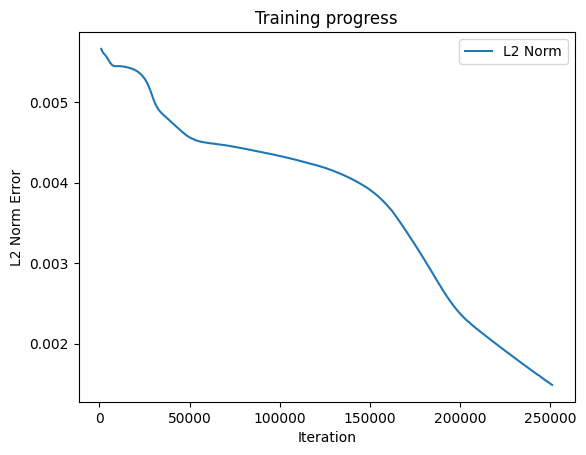

Predicted a: 1.3497308492660522
Predicted b: 2.9120495319366455
Predicted c: 2.9497811794281006


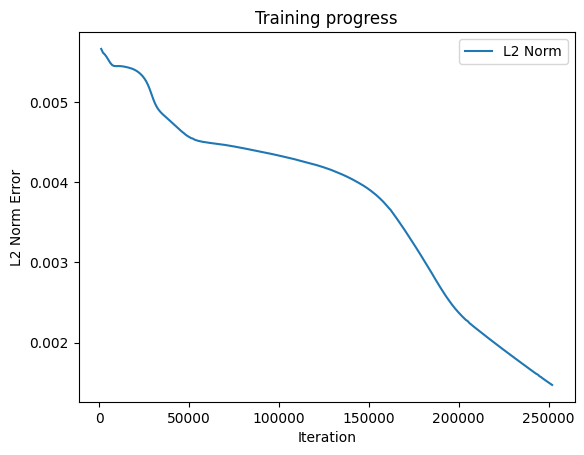

Predicted a: 1.3589099645614624
Predicted b: 2.9124016761779785
Predicted c: 2.950340986251831


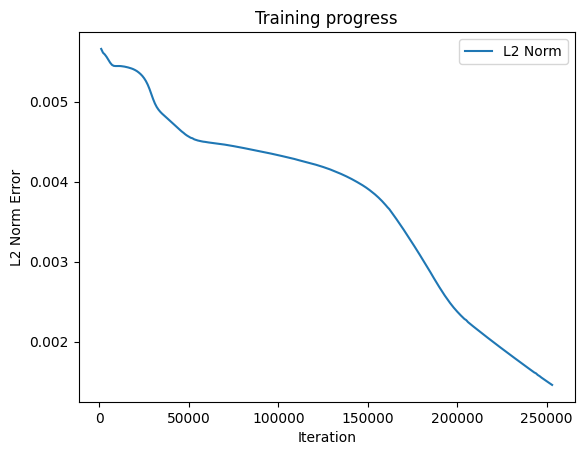

Predicted a: 1.3680890798568726
Predicted b: 2.9127564430236816
Predicted c: 2.9508843421936035


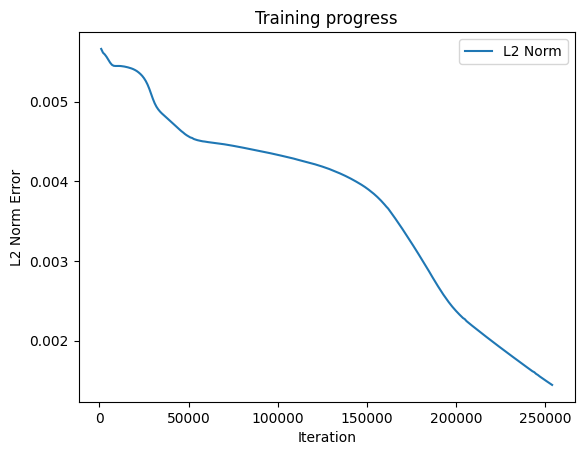

Predicted a: 1.377200961112976
Predicted b: 2.9131078720092773
Predicted c: 2.9514076709747314


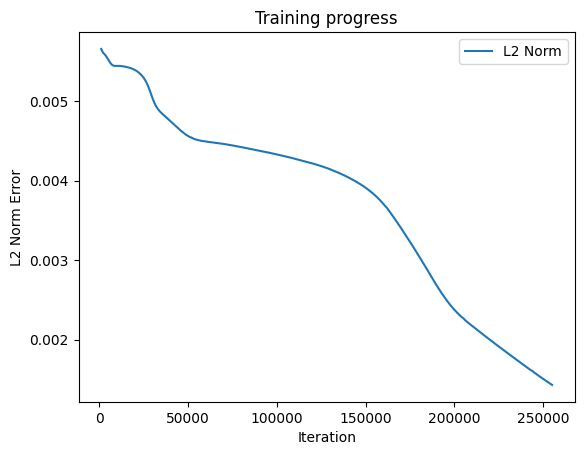

Predicted a: 1.3862608671188354
Predicted b: 2.9134554862976074
Predicted c: 2.951909065246582


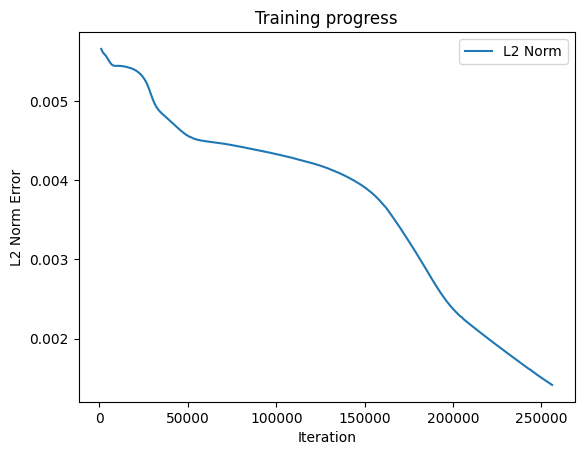

Predicted a: 1.3952674865722656
Predicted b: 2.9137988090515137
Predicted c: 2.9523942470550537


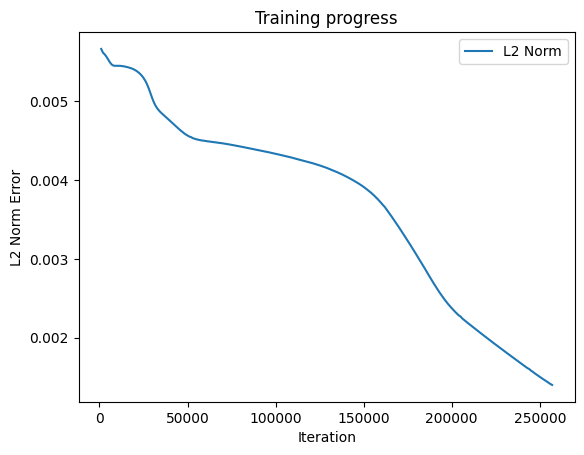

Predicted a: 1.4042081832885742
Predicted b: 2.9141414165496826
Predicted c: 2.952857732772827


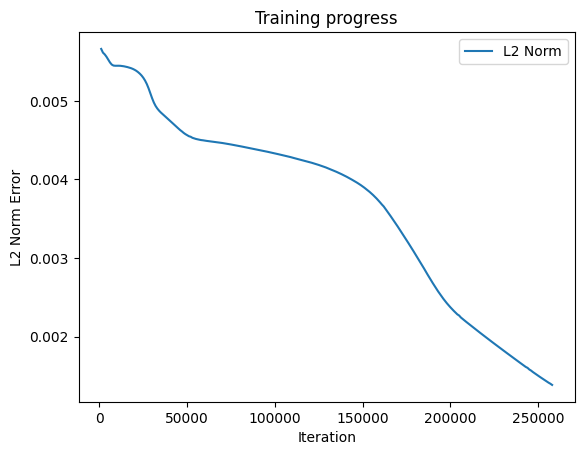

Predicted a: 1.4130609035491943
Predicted b: 2.9144792556762695
Predicted c: 2.9533090591430664


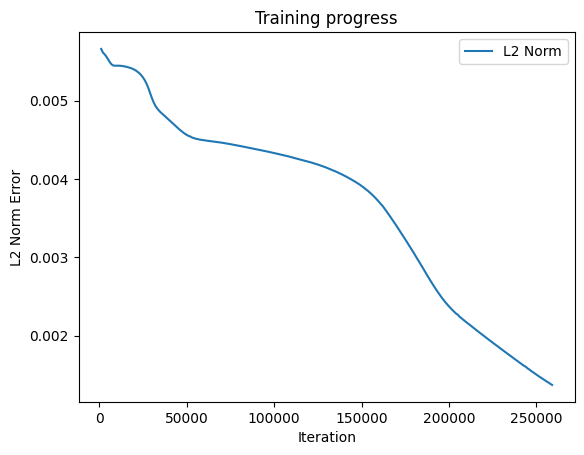

Predicted a: 1.4218401908874512
Predicted b: 2.914813280105591
Predicted c: 2.953744888305664


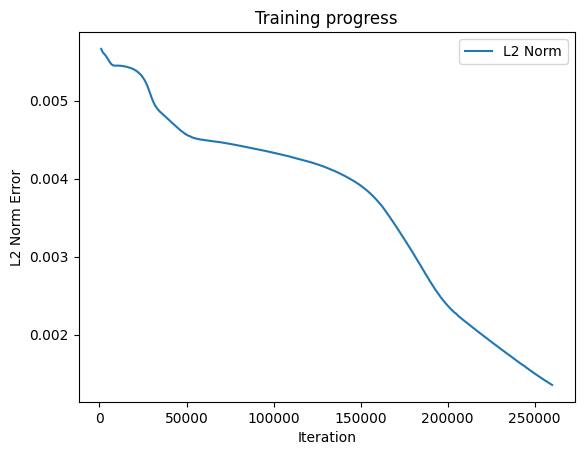

Predicted a: 1.4305099248886108
Predicted b: 2.9151389598846436
Predicted c: 2.9541726112365723


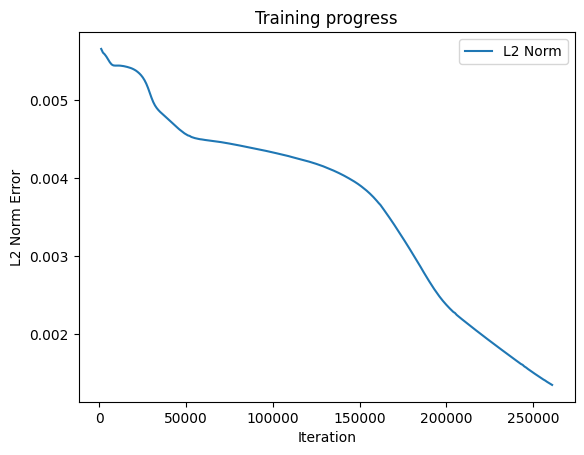

Predicted a: 1.4390480518341064
Predicted b: 2.915459156036377
Predicted c: 2.954590320587158


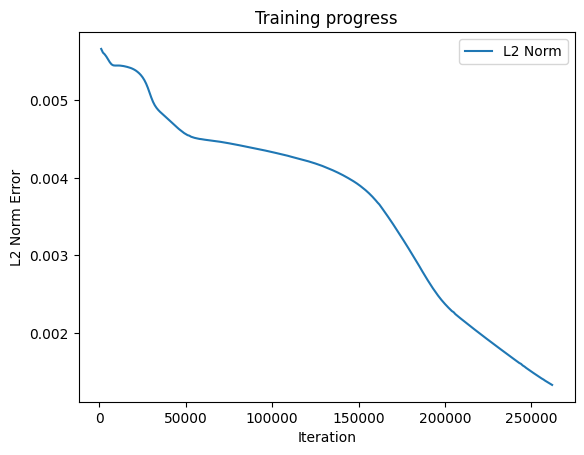

Predicted a: 1.4474316835403442
Predicted b: 2.9157729148864746
Predicted c: 2.954977512359619


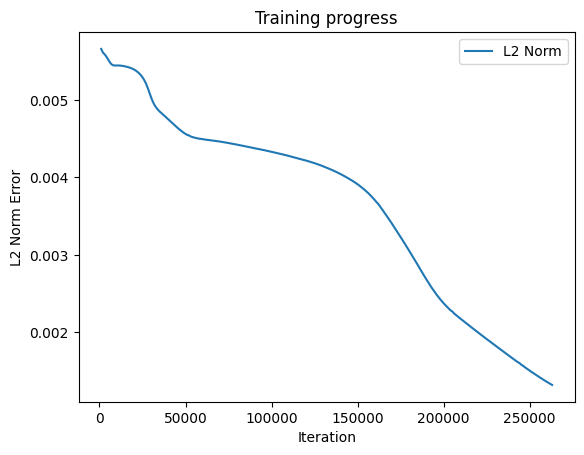

Predicted a: 1.4556238651275635
Predicted b: 2.9160821437835693
Predicted c: 2.9553372859954834


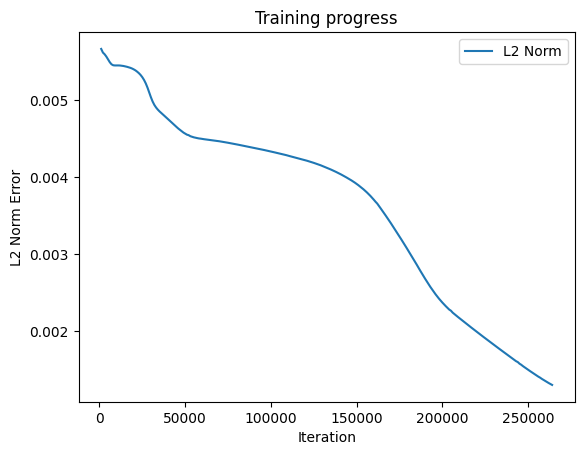

Predicted a: 1.463619351387024
Predicted b: 2.916378974914551
Predicted c: 2.9556634426116943


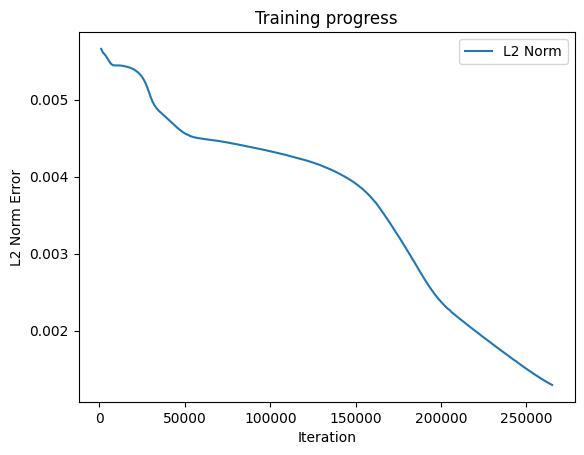

Predicted a: 1.4713788032531738
Predicted b: 2.9166653156280518
Predicted c: 2.9559574127197266


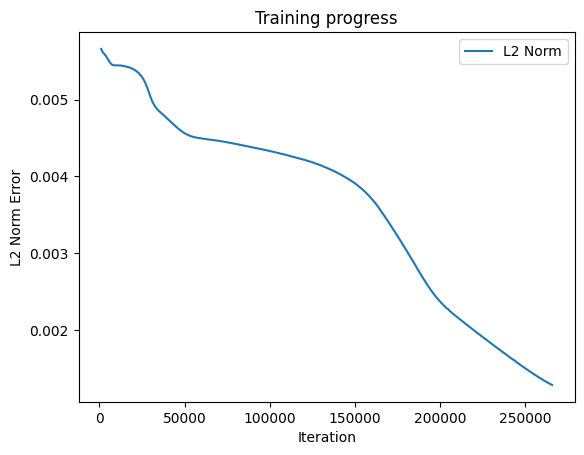

Predicted a: 1.478868842124939
Predicted b: 2.9169352054595947
Predicted c: 2.9562158584594727


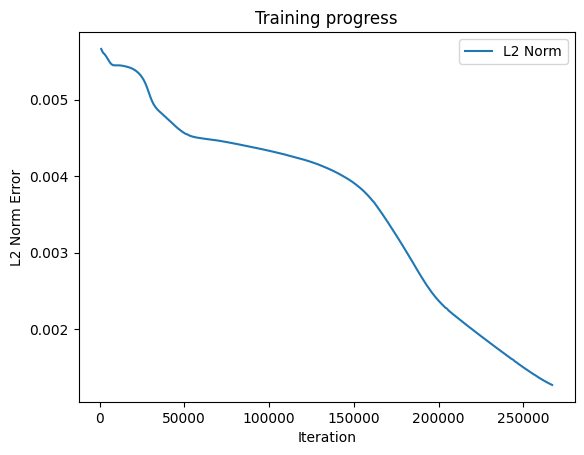

Predicted a: 1.486061692237854
Predicted b: 2.9171881675720215
Predicted c: 2.9564404487609863


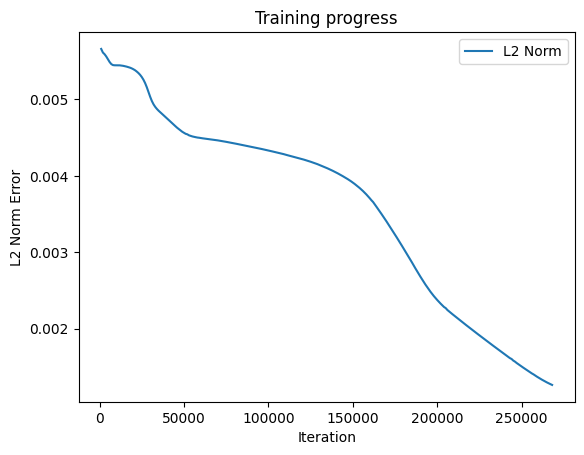

Predicted a: 1.492918610572815
Predicted b: 2.9174256324768066
Predicted c: 2.956631898880005


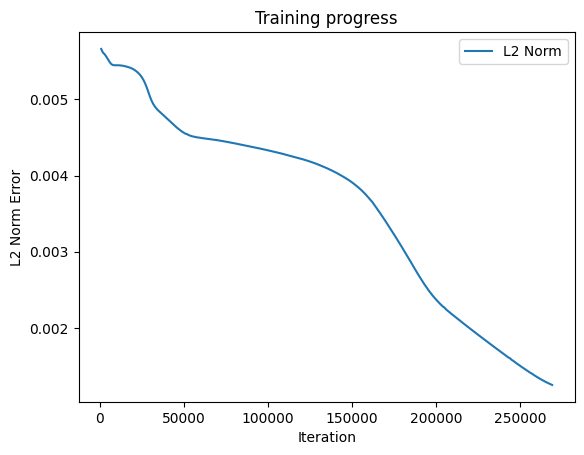

Predicted a: 1.4993661642074585
Predicted b: 2.9176480770111084
Predicted c: 2.956787347793579


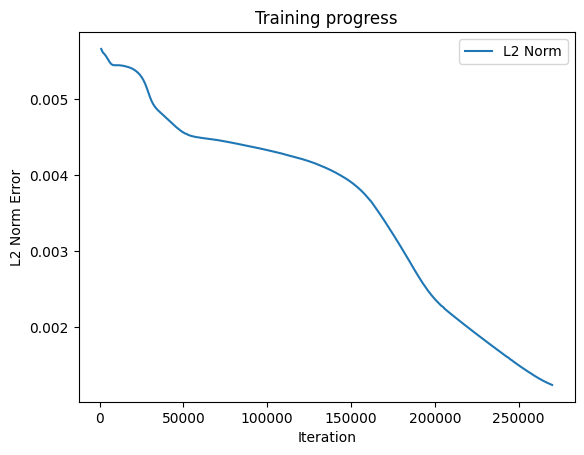

Predicted a: 1.5054748058319092
Predicted b: 2.9178507328033447
Predicted c: 2.9569125175476074


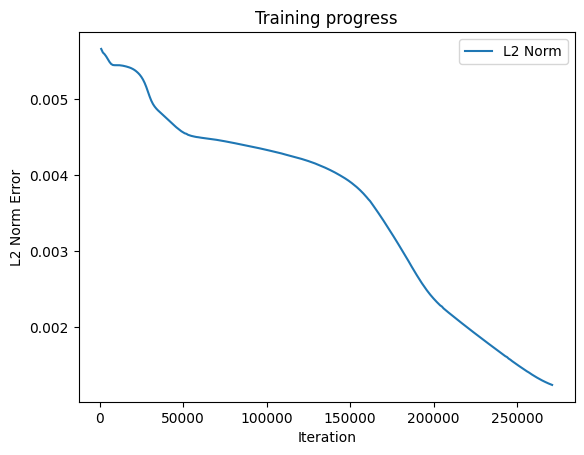

Predicted a: 1.5112766027450562
Predicted b: 2.918041706085205
Predicted c: 2.9570090770721436


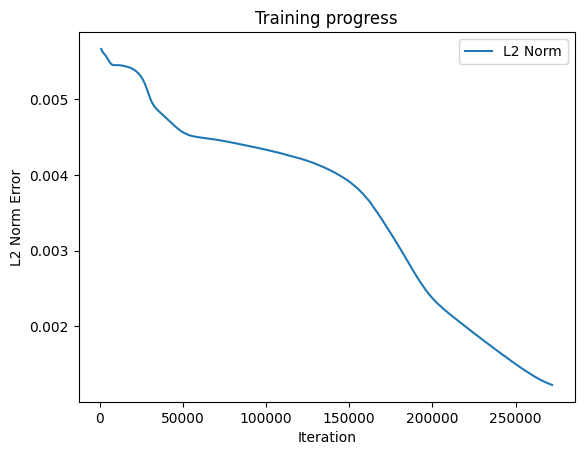

Predicted a: 1.5166856050491333
Predicted b: 2.9182233810424805
Predicted c: 2.957087278366089


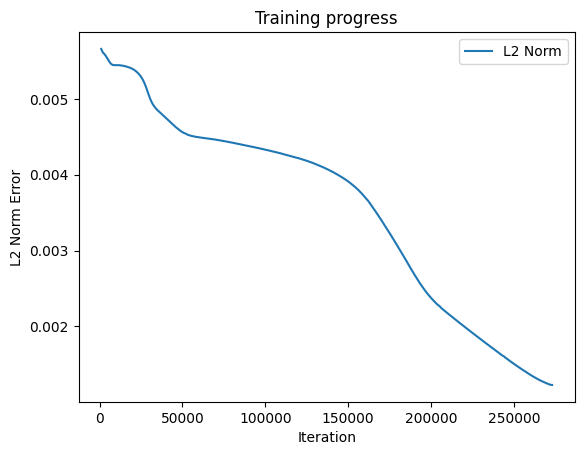

Predicted a: 1.521930456161499
Predicted b: 2.918397903442383
Predicted c: 2.9571497440338135


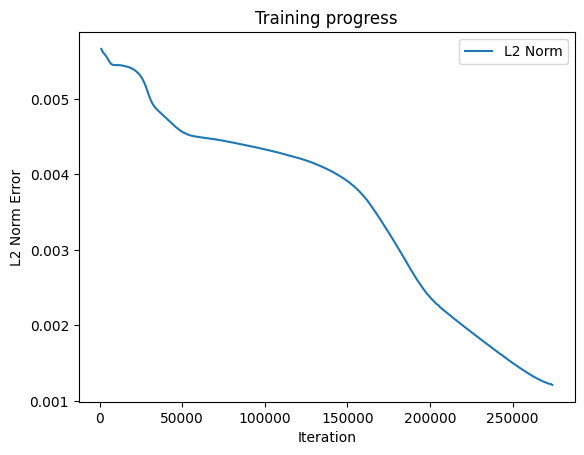

Predicted a: 1.5269875526428223
Predicted b: 2.9185733795166016
Predicted c: 2.9572038650512695


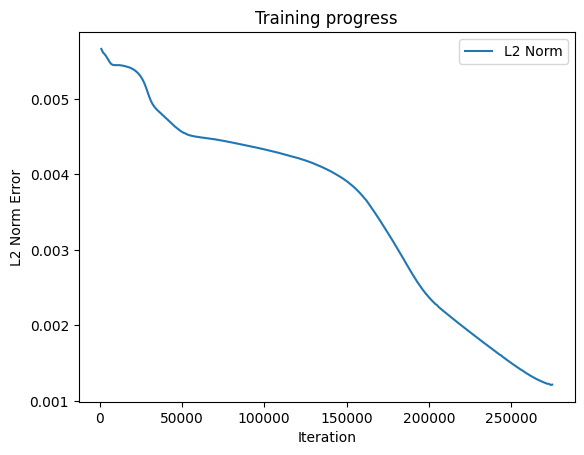

Predicted a: 1.5318726301193237
Predicted b: 2.9187541007995605
Predicted c: 2.9572529792785645


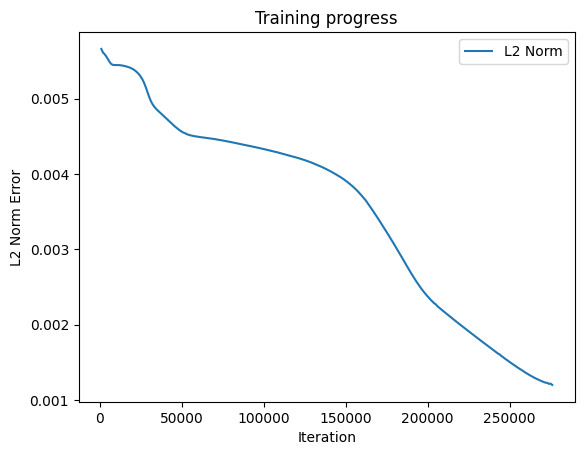

Predicted a: 1.536623239517212
Predicted b: 2.9189367294311523
Predicted c: 2.957305669784546


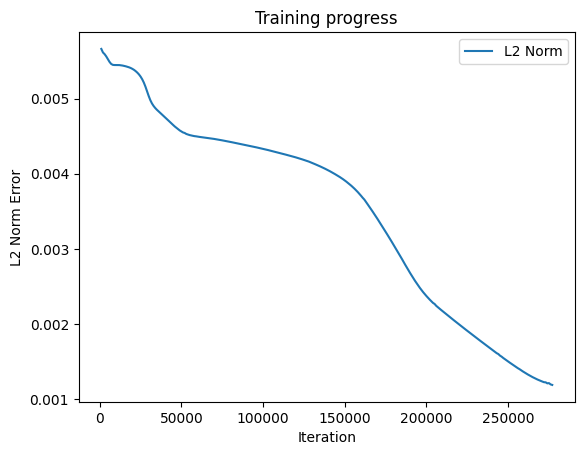

Predicted a: 1.5412606000900269
Predicted b: 2.91912579536438
Predicted c: 2.957361936569214


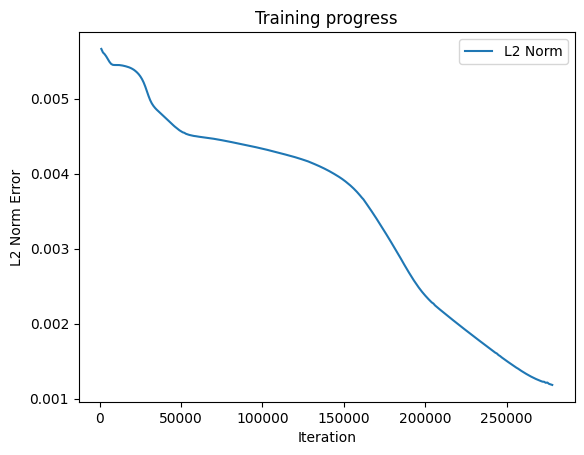

Predicted a: 1.5457953214645386
Predicted b: 2.9193170070648193
Predicted c: 2.957425355911255


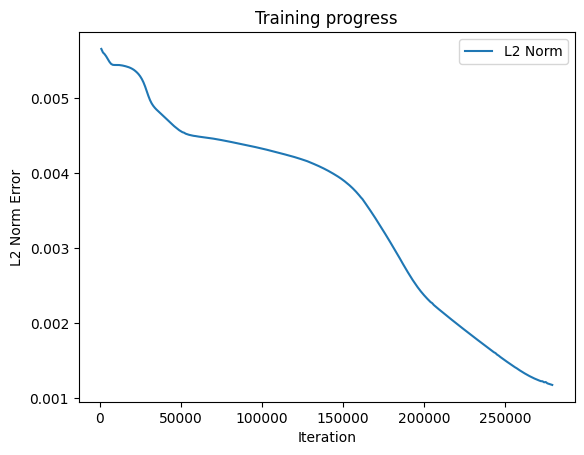

Predicted a: 1.5502156019210815
Predicted b: 2.919517993927002
Predicted c: 2.957502841949463


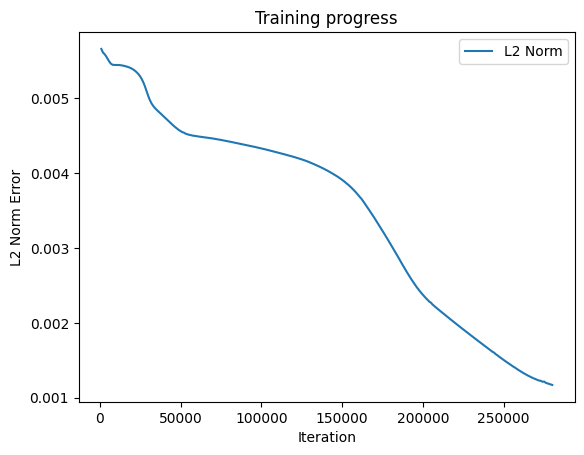

Predicted a: 1.554553508758545
Predicted b: 2.9197237491607666
Predicted c: 2.957594871520996


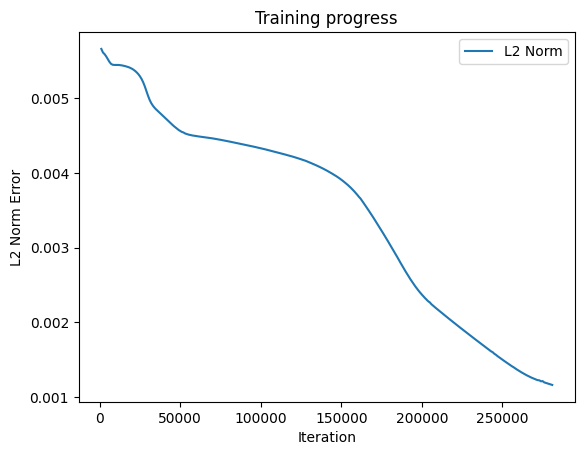

Predicted a: 1.558762788772583
Predicted b: 2.9199349880218506
Predicted c: 2.9577059745788574


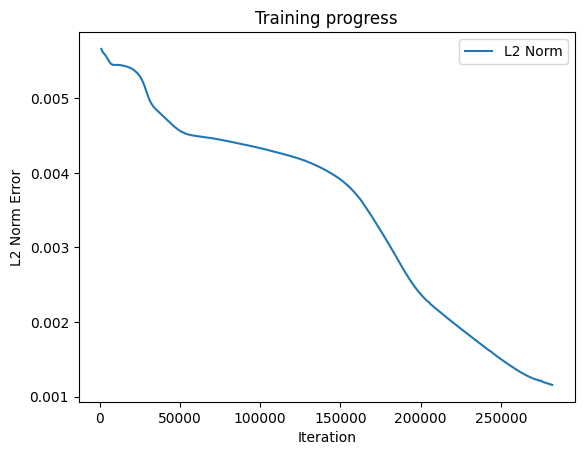

Predicted a: 1.5629665851593018
Predicted b: 2.9201605319976807
Predicted c: 2.957843065261841


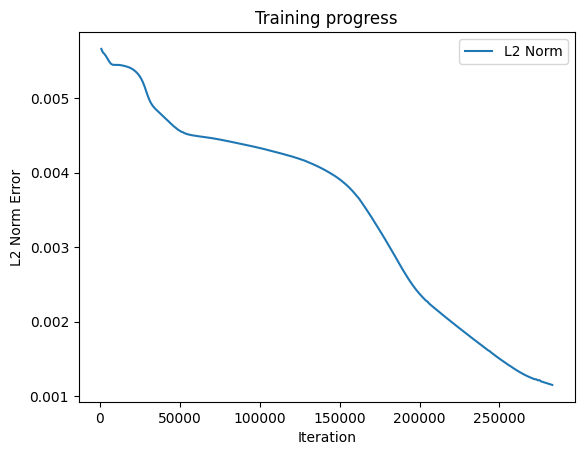

Predicted a: 1.5669504404067993
Predicted b: 2.9203877449035645
Predicted c: 2.9579949378967285


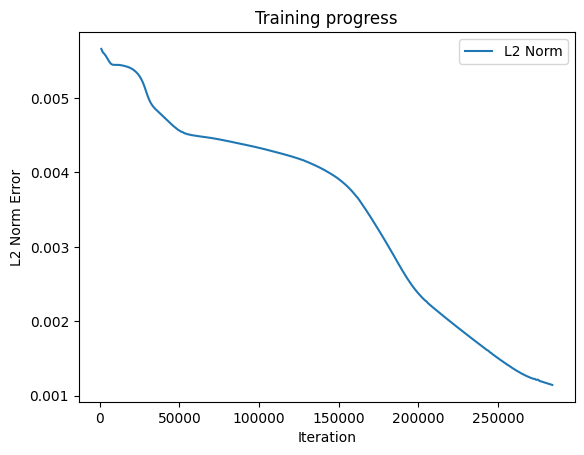

Predicted a: 1.570914387702942
Predicted b: 2.920628309249878
Predicted c: 2.9581756591796875


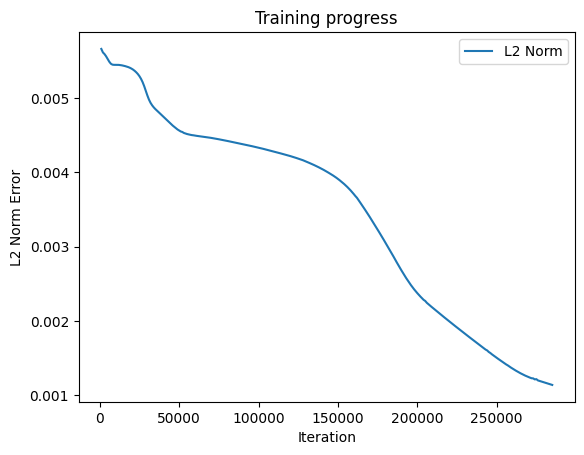

Predicted a: 1.5748329162597656
Predicted b: 2.920879602432251
Predicted c: 2.9583680629730225


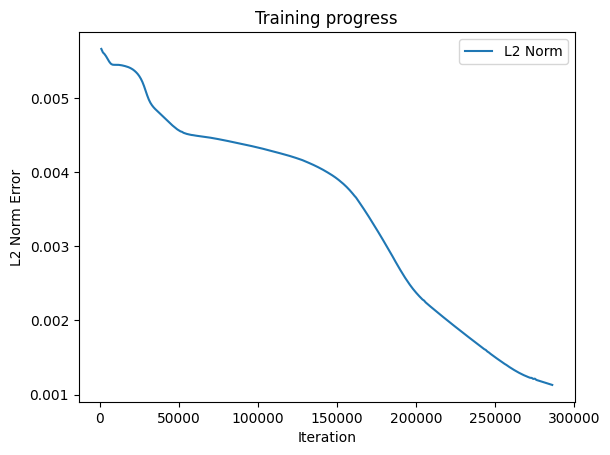

Predicted a: 1.5787534713745117
Predicted b: 2.9211480617523193
Predicted c: 2.958583116531372


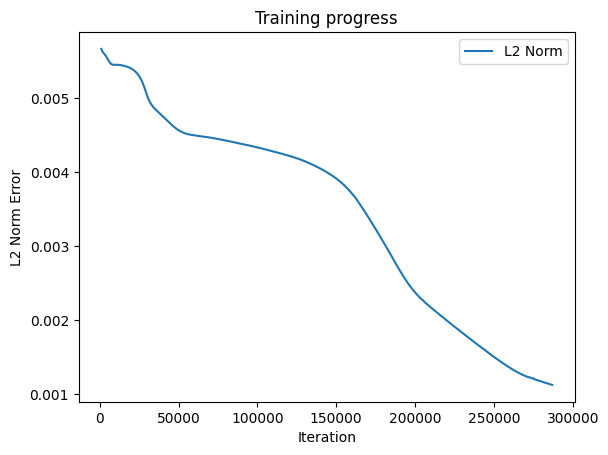

Predicted a: 1.5826514959335327
Predicted b: 2.921424388885498
Predicted c: 2.958817481994629


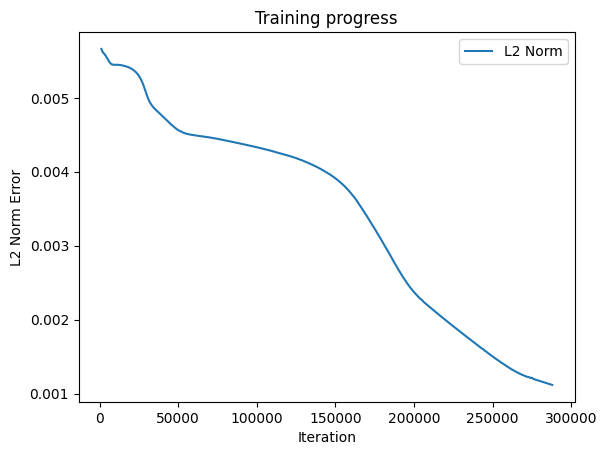

Predicted a: 1.5865061283111572
Predicted b: 2.921708822250366
Predicted c: 2.9590671062469482


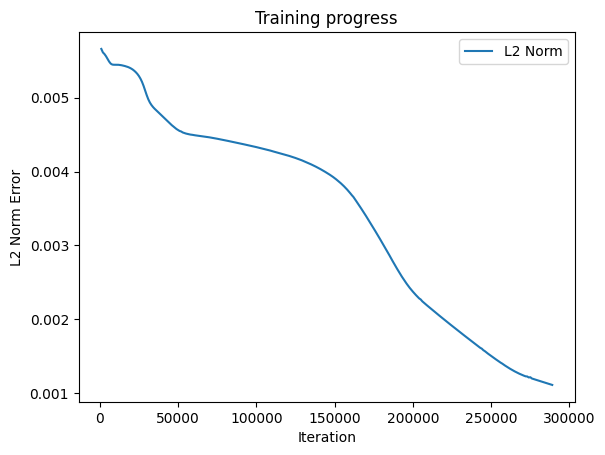

Predicted a: 1.5903104543685913
Predicted b: 2.922006607055664
Predicted c: 2.95932936668396


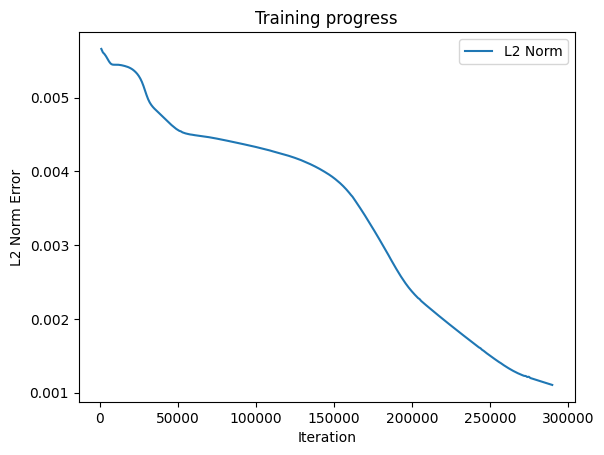

Predicted a: 1.5940104722976685
Predicted b: 2.922304391860962
Predicted c: 2.9596025943756104


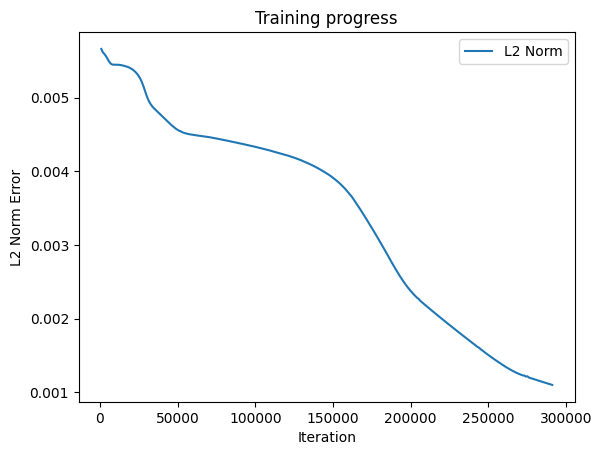

Predicted a: 1.597514033317566
Predicted b: 2.9226088523864746
Predicted c: 2.9598824977874756


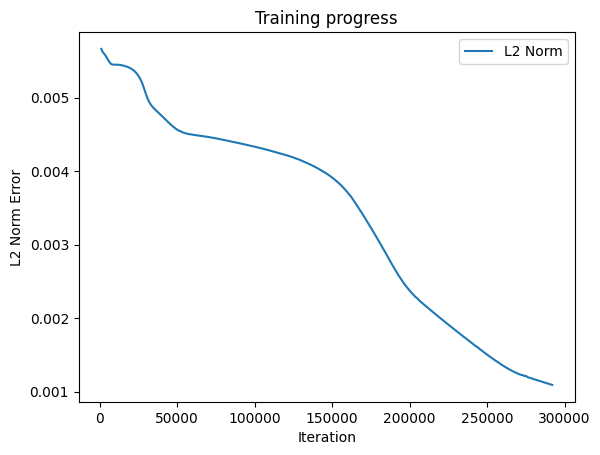

Predicted a: 1.60084068775177
Predicted b: 2.9229283332824707
Predicted c: 2.9601850509643555


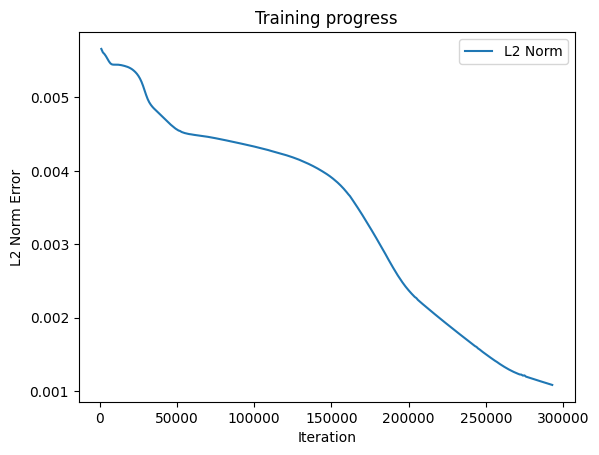

Predicted a: 1.6039888858795166
Predicted b: 2.923259735107422
Predicted c: 2.9604973793029785


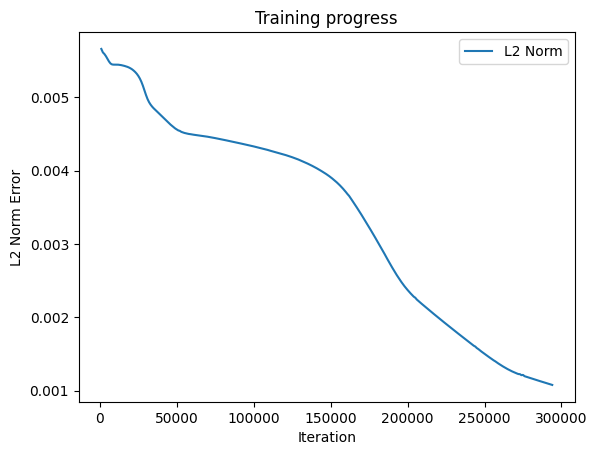

Predicted a: 1.6070125102996826
Predicted b: 2.923600912094116
Predicted c: 2.9608237743377686


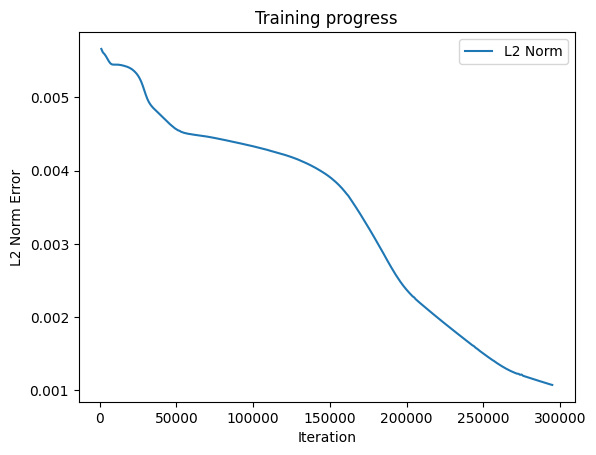

Predicted a: 1.6099709272384644
Predicted b: 2.923954963684082
Predicted c: 2.9611690044403076


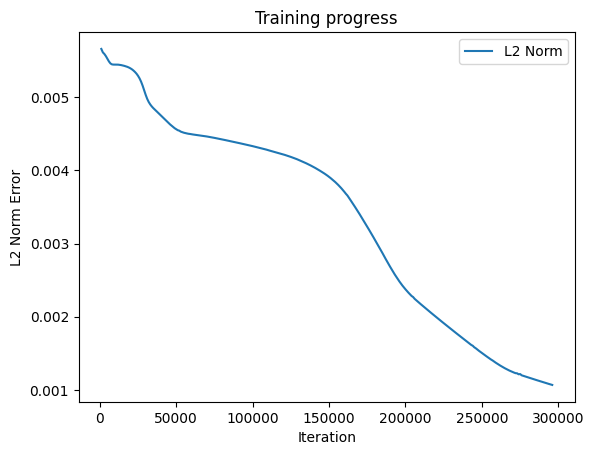

Predicted a: 1.612850308418274
Predicted b: 2.924316167831421
Predicted c: 2.96152663230896


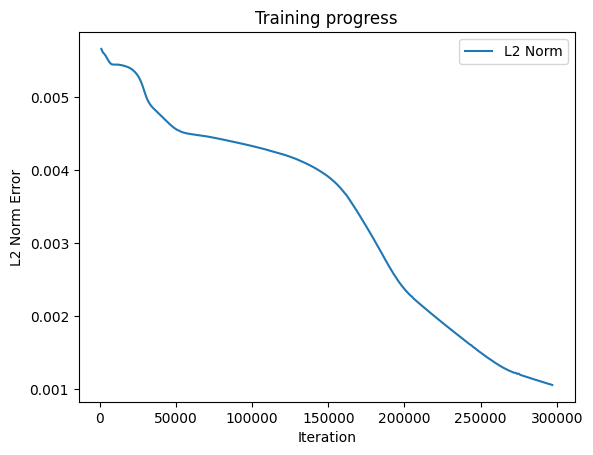

Predicted a: 1.6156857013702393
Predicted b: 2.924687623977661
Predicted c: 2.9618935585021973


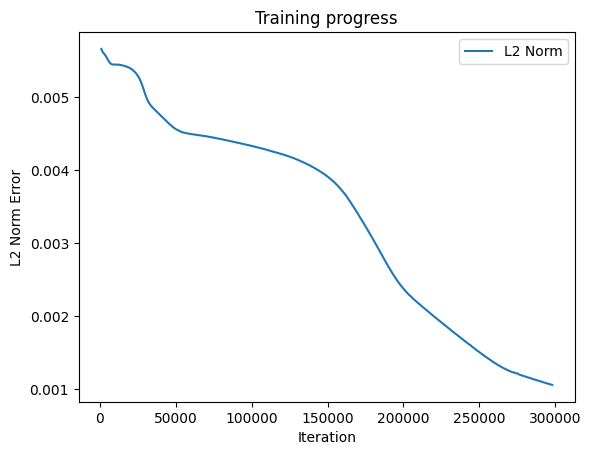

Predicted a: 1.6184321641921997
Predicted b: 2.925060272216797
Predicted c: 2.9622721672058105


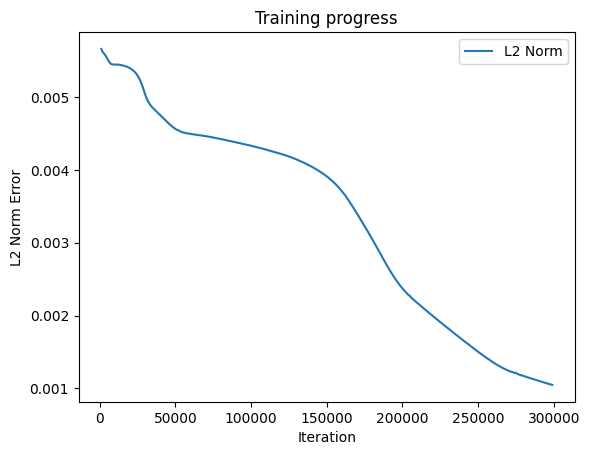

Predicted a: 1.6211340427398682
Predicted b: 2.925441026687622
Predicted c: 2.9626564979553223


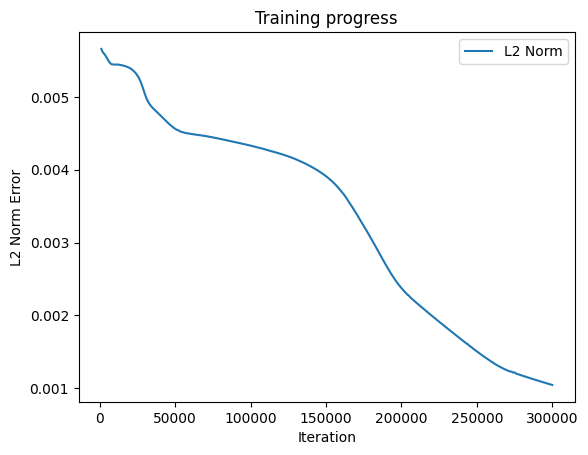

Predicted a: 1.6237934827804565
Predicted b: 2.92582631111145
Predicted c: 2.96305251121521


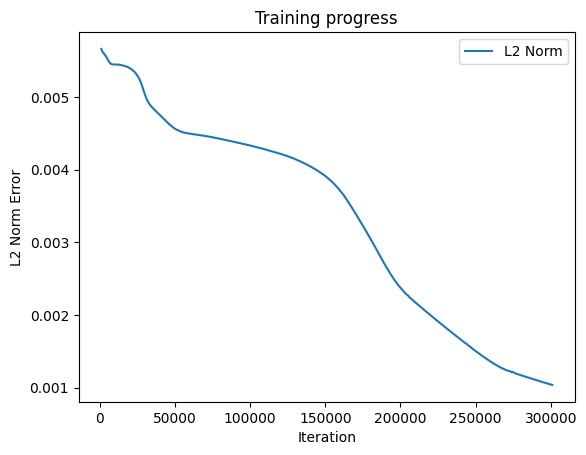

Predicted a: 1.626442551612854
Predicted b: 2.9262187480926514
Predicted c: 2.963437080383301


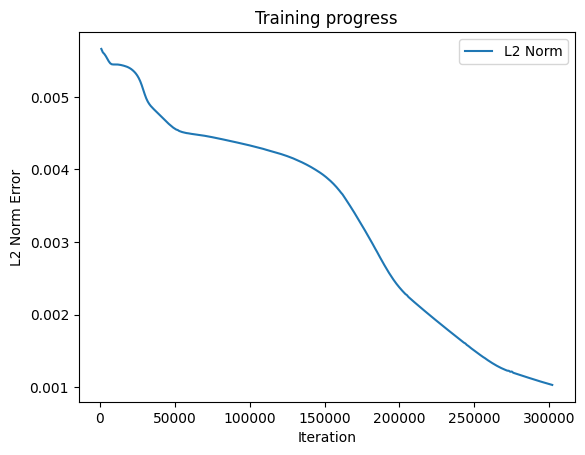

Predicted a: 1.6289730072021484
Predicted b: 2.926605224609375
Predicted c: 2.9638454914093018


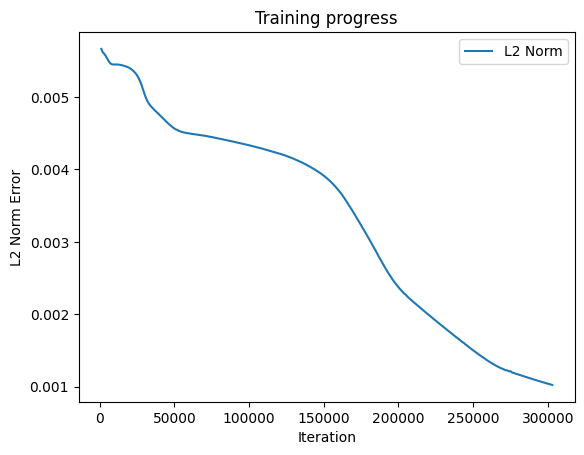

Predicted a: 1.6315358877182007
Predicted b: 2.927013635635376
Predicted c: 2.9642493724823


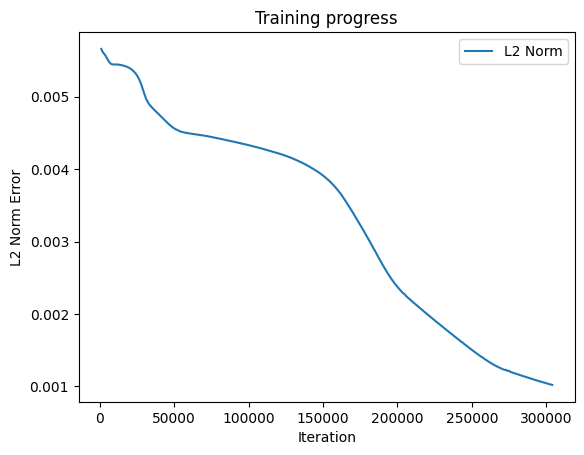

Predicted a: 1.6340599060058594
Predicted b: 2.9274208545684814
Predicted c: 2.9646663665771484


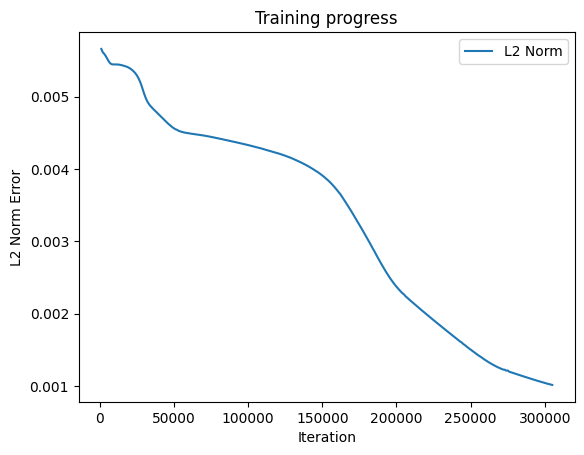

Predicted a: 1.6365950107574463
Predicted b: 2.927842378616333
Predicted c: 2.9650826454162598


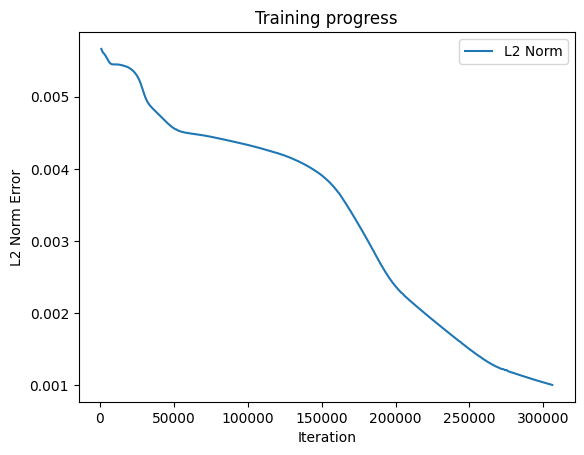

Predicted a: 1.6391292810440063
Predicted b: 2.928267002105713
Predicted c: 2.9655020236968994


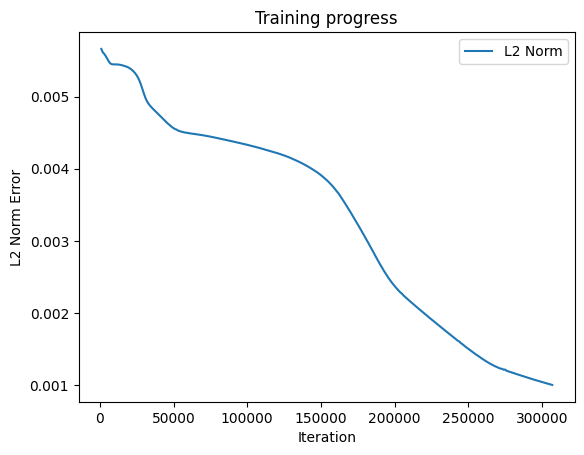

Predicted a: 1.6416224241256714
Predicted b: 2.9286980628967285
Predicted c: 2.965895652770996


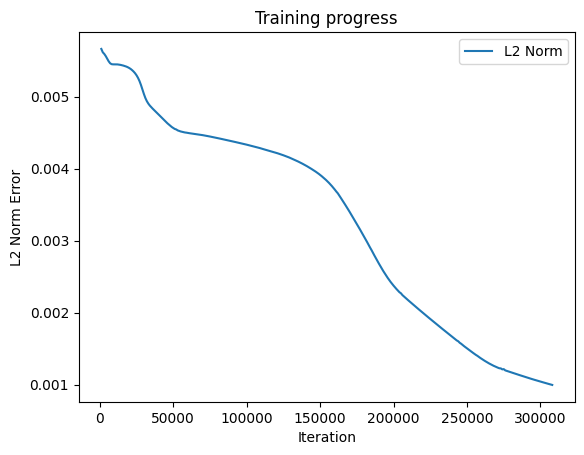

Predicted a: 1.644073247909546
Predicted b: 2.9291343688964844
Predicted c: 2.96628737449646


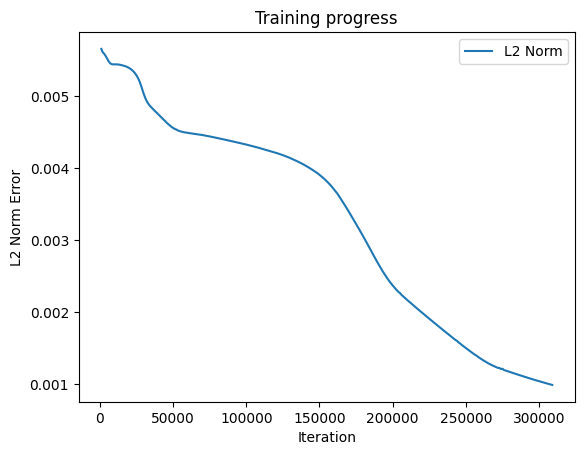

Predicted a: 1.6465656757354736
Predicted b: 2.9295613765716553
Predicted c: 2.966702938079834


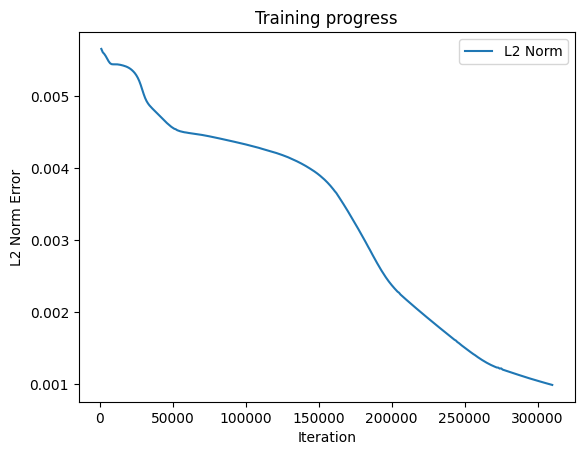

Predicted a: 1.6490963697433472
Predicted b: 2.9300363063812256
Predicted c: 2.967085838317871


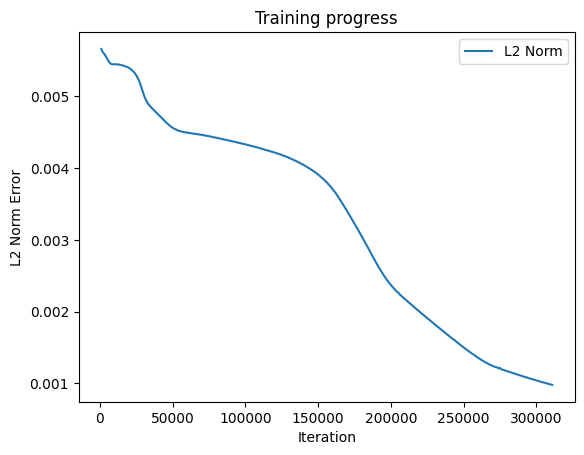

Predicted a: 1.6515973806381226
Predicted b: 2.930497884750366
Predicted c: 2.9675002098083496


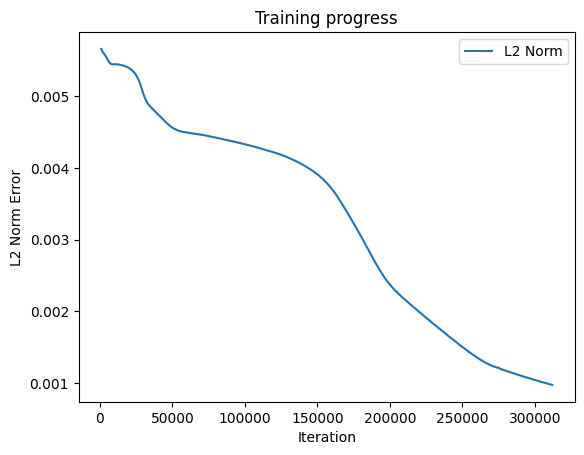

Predicted a: 1.6540027856826782
Predicted b: 2.930986166000366
Predicted c: 2.9679203033447266


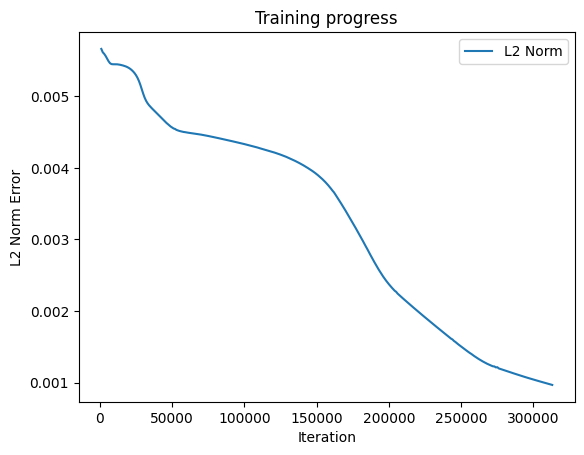

Predicted a: 1.6563650369644165
Predicted b: 2.9314961433410645
Predicted c: 2.9683327674865723


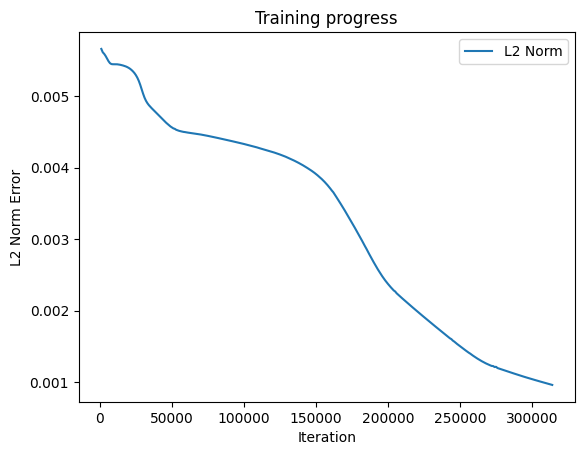

Predicted a: 1.6587402820587158
Predicted b: 2.932016134262085
Predicted c: 2.96872615814209


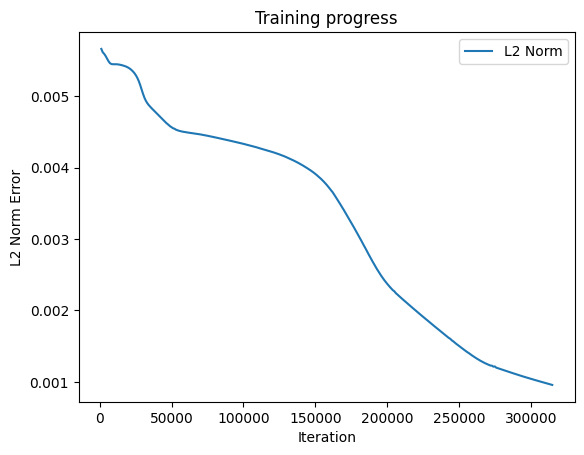

Predicted a: 1.661149501800537
Predicted b: 2.932547092437744
Predicted c: 2.969120979309082


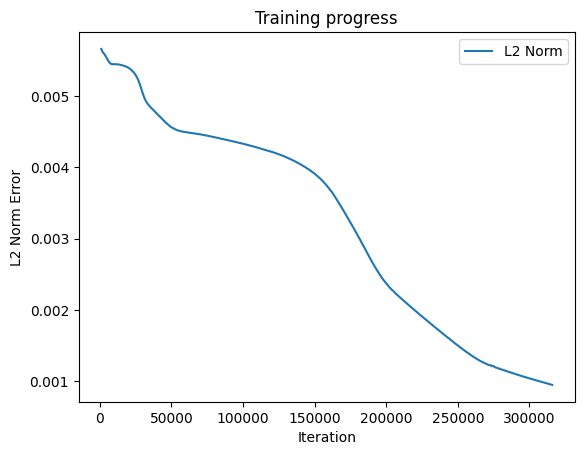

Predicted a: 1.6636426448822021
Predicted b: 2.933115005493164
Predicted c: 2.9695346355438232


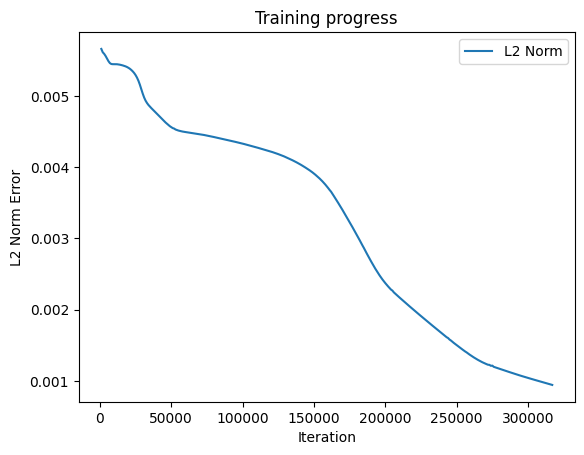

Predicted a: 1.6662750244140625
Predicted b: 2.933716297149658
Predicted c: 2.9699652194976807


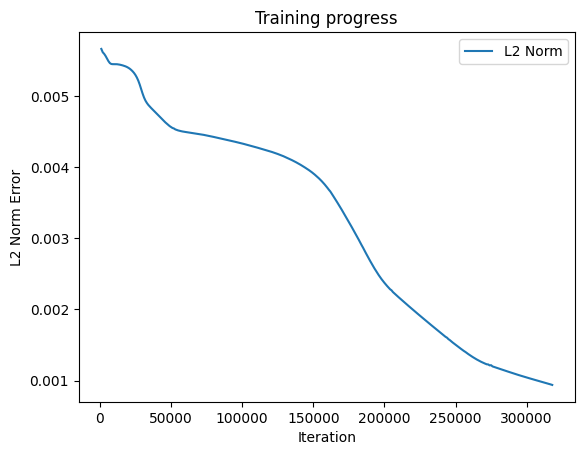

Predicted a: 1.6691101789474487
Predicted b: 2.9343669414520264
Predicted c: 2.9704318046569824


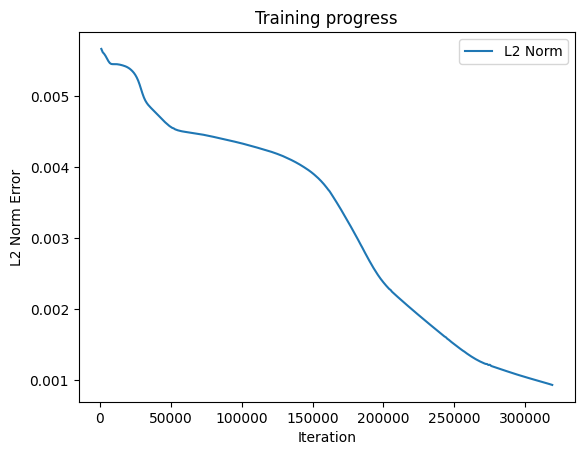

Predicted a: 1.6722958087921143
Predicted b: 2.935065746307373
Predicted c: 2.970917224884033


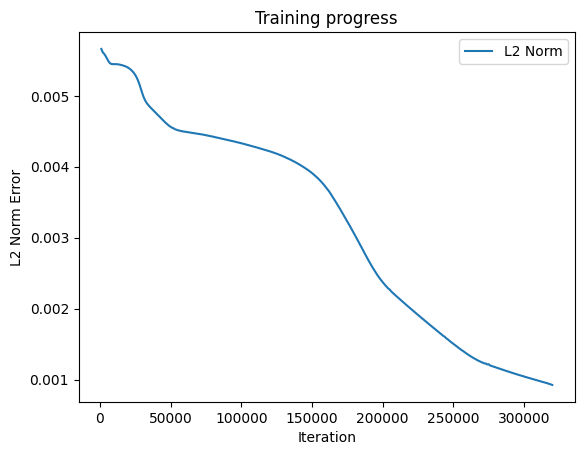

Predicted a: 1.6758205890655518
Predicted b: 2.935804605484009
Predicted c: 2.97141170501709


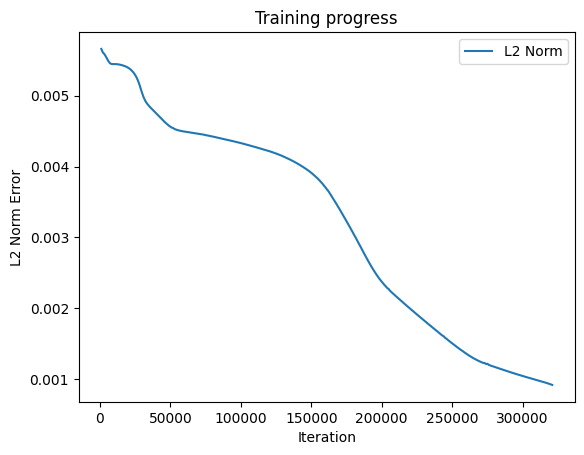

Predicted a: 1.6793649196624756
Predicted b: 2.9366455078125
Predicted c: 2.9718406200408936


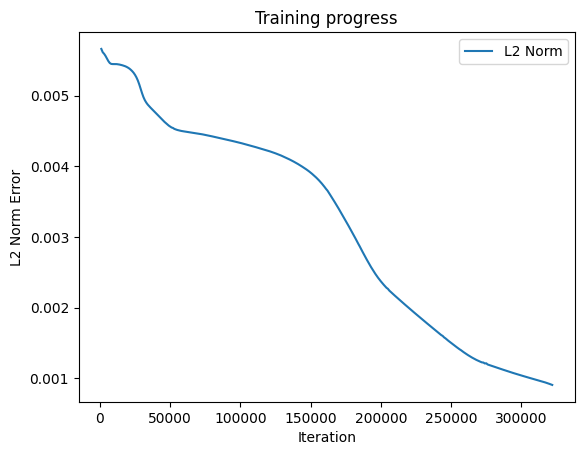

Predicted a: 1.6825411319732666
Predicted b: 2.9376232624053955
Predicted c: 2.97217059135437


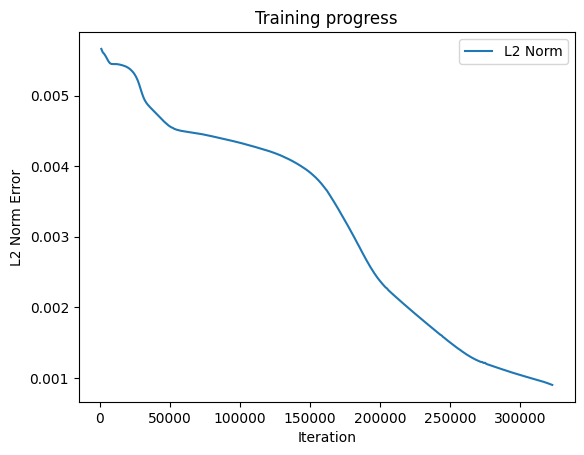

Predicted a: 1.685409426689148
Predicted b: 2.9386682510375977
Predicted c: 2.9724841117858887


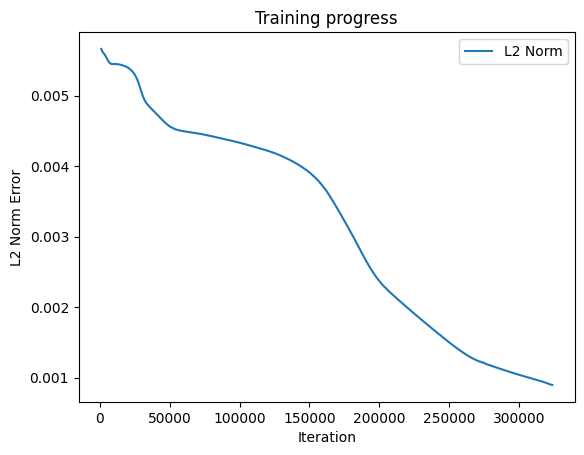

Predicted a: 1.688186764717102
Predicted b: 2.9397337436676025
Predicted c: 2.9728221893310547


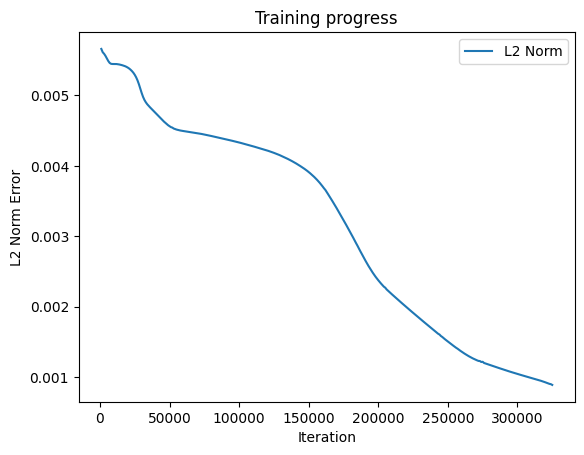

Predicted a: 1.6909656524658203
Predicted b: 2.940796375274658
Predicted c: 2.973172426223755


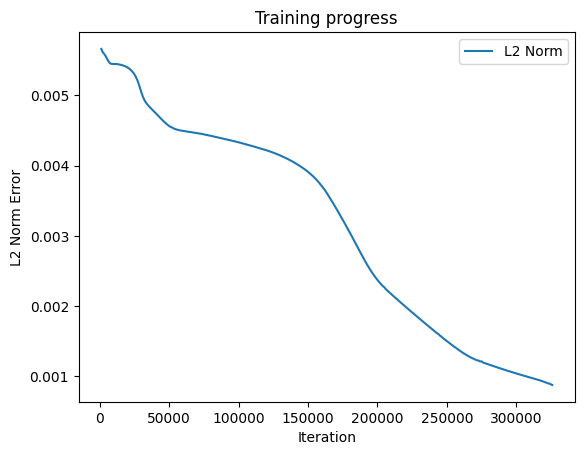

Predicted a: 1.693789005279541
Predicted b: 2.941880702972412
Predicted c: 2.973541259765625


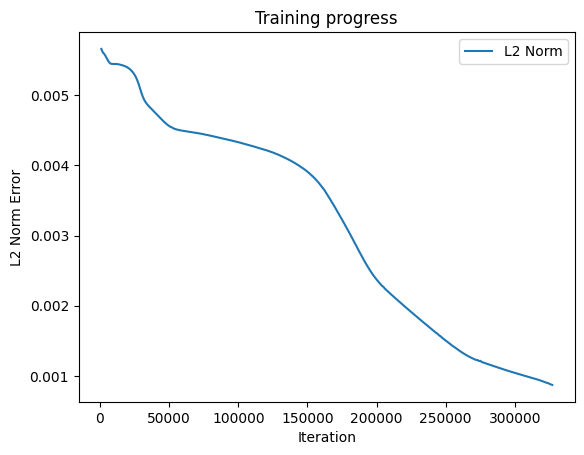

Predicted a: 1.6966893672943115
Predicted b: 2.9429867267608643
Predicted c: 2.973928451538086


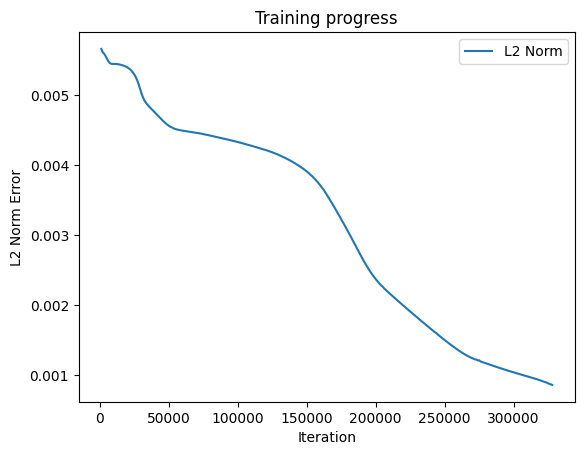

Predicted a: 1.6996827125549316
Predicted b: 2.944108724594116
Predicted c: 2.9743382930755615


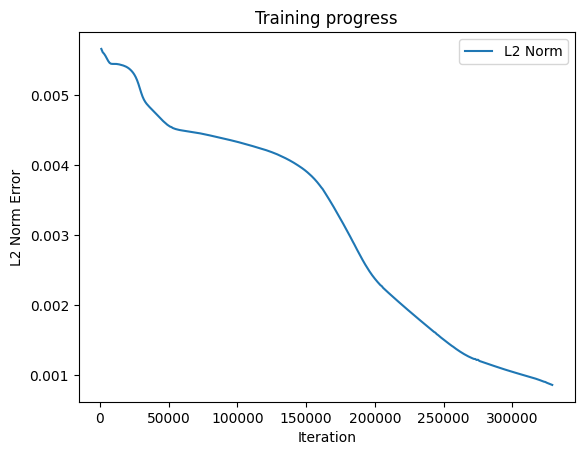

Predicted a: 1.7027785778045654
Predicted b: 2.9452521800994873
Predicted c: 2.974761962890625


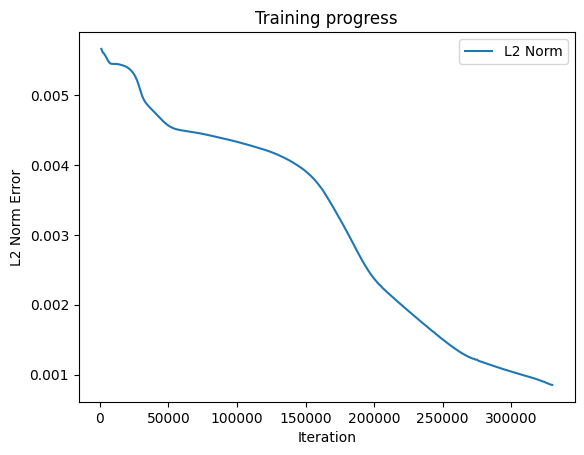

Predicted a: 1.705967664718628
Predicted b: 2.9464311599731445
Predicted c: 2.9751861095428467


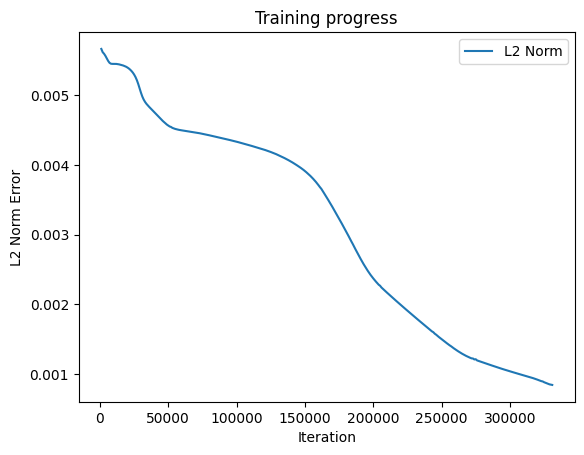

Predicted a: 1.709168791770935
Predicted b: 2.947666645050049
Predicted c: 2.9755961894989014


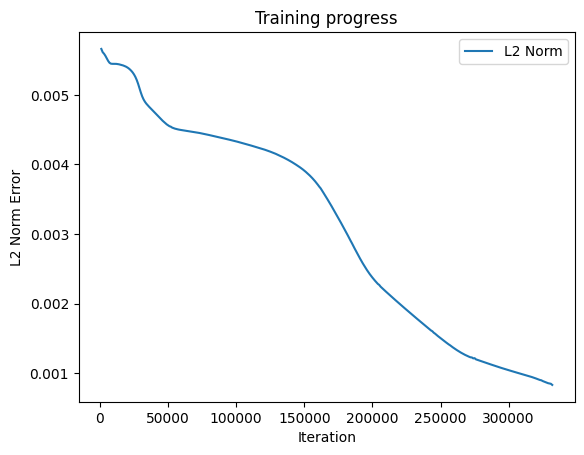

Predicted a: 1.7122058868408203
Predicted b: 2.948927402496338
Predicted c: 2.9760119915008545


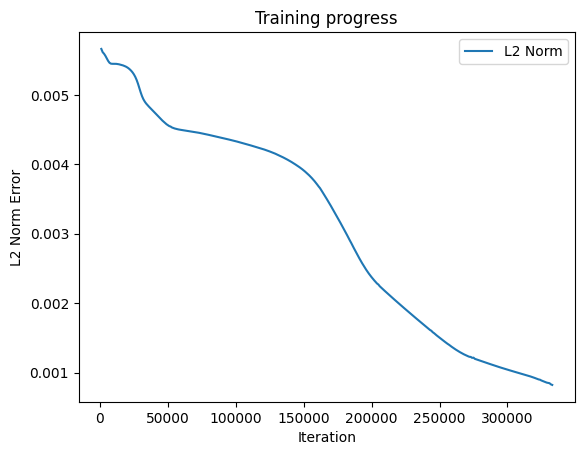

Predicted a: 1.7150932550430298
Predicted b: 2.9501895904541016
Predicted c: 2.976428985595703


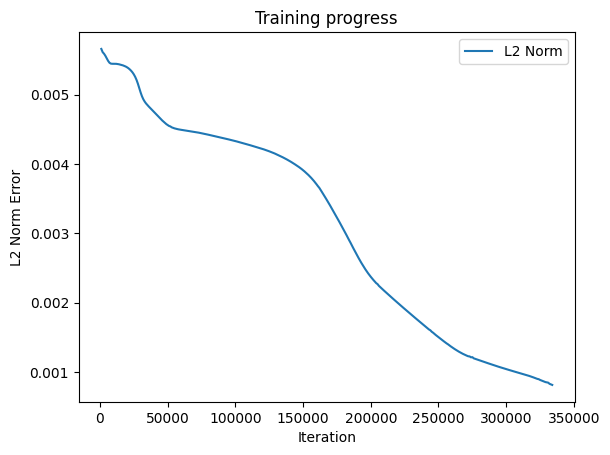

Predicted a: 1.7179148197174072
Predicted b: 2.9514317512512207
Predicted c: 2.976846933364868


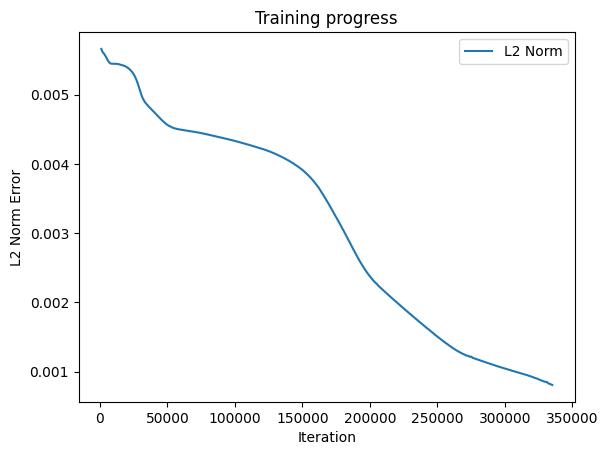

Predicted a: 1.7206767797470093
Predicted b: 2.952670097351074
Predicted c: 2.977266311645508


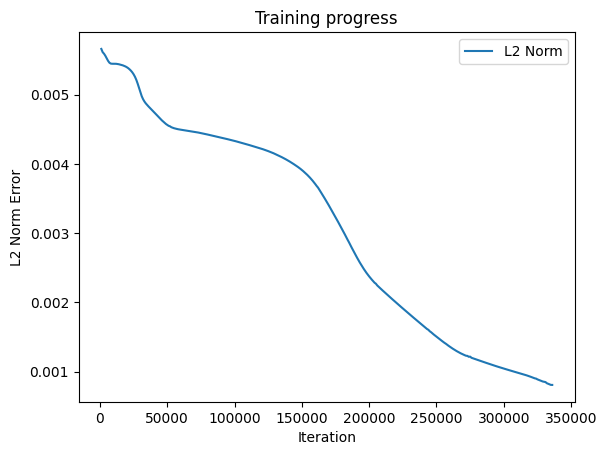

Predicted a: 1.7233999967575073
Predicted b: 2.9538981914520264
Predicted c: 2.9776926040649414


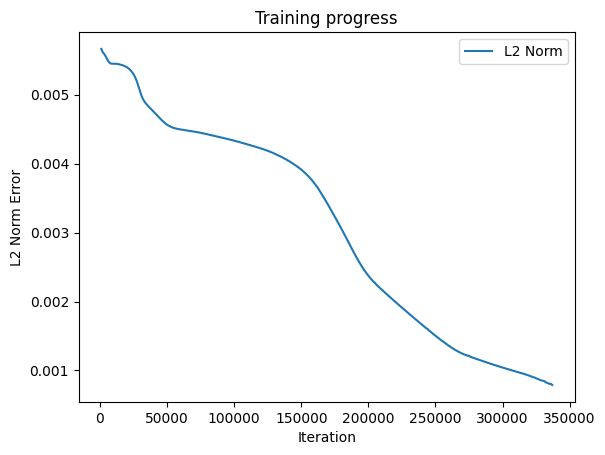

Predicted a: 1.726070523262024
Predicted b: 2.955127239227295
Predicted c: 2.978121757507324


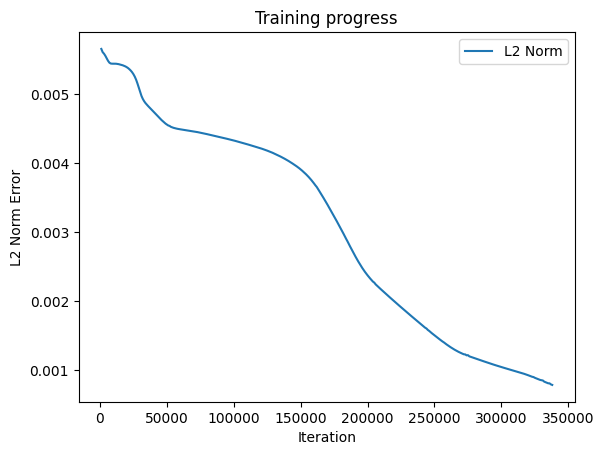

Predicted a: 1.7286913394927979
Predicted b: 2.956355571746826
Predicted c: 2.97855544090271


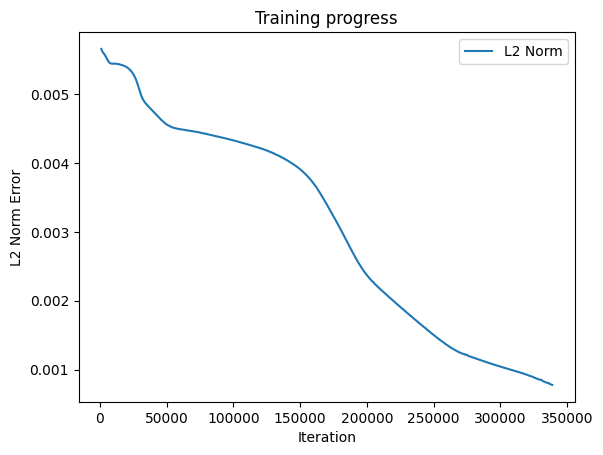

Predicted a: 1.7311986684799194
Predicted b: 2.957517147064209
Predicted c: 2.978968381881714


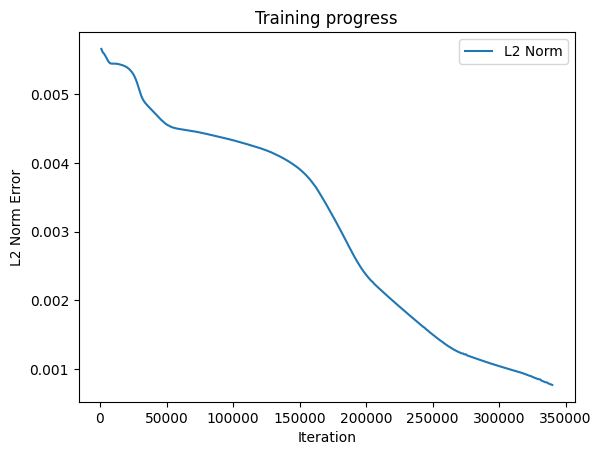

Predicted a: 1.7335984706878662
Predicted b: 2.9586479663848877
Predicted c: 2.9793691635131836


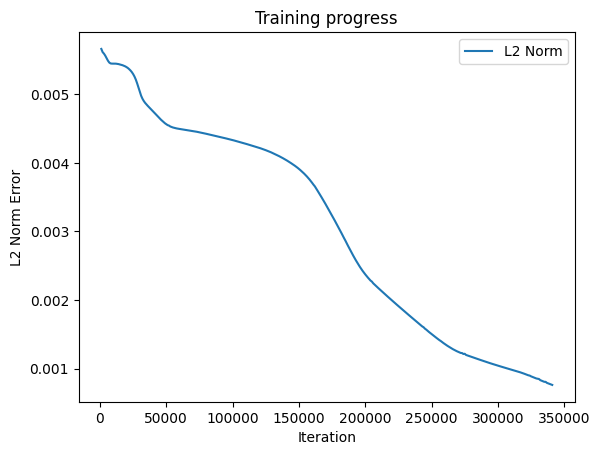

Predicted a: 1.7359764575958252
Predicted b: 2.9598259925842285
Predicted c: 2.9797794818878174


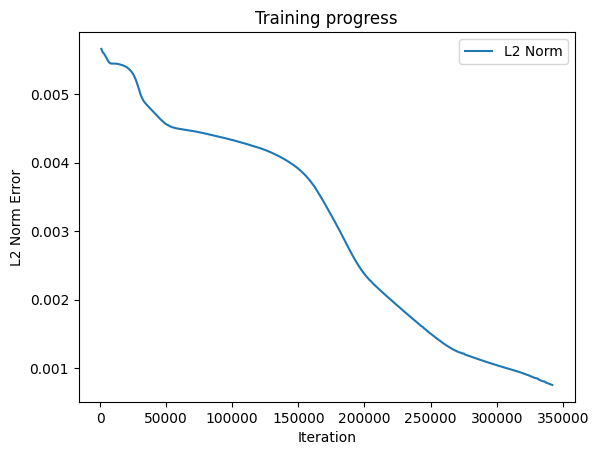

Predicted a: 1.7383155822753906
Predicted b: 2.961010217666626
Predicted c: 2.980187177658081


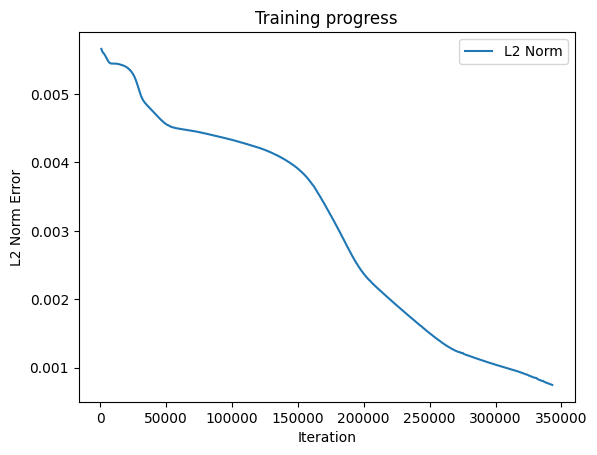

Predicted a: 1.7405987977981567
Predicted b: 2.96217679977417
Predicted c: 2.980581045150757


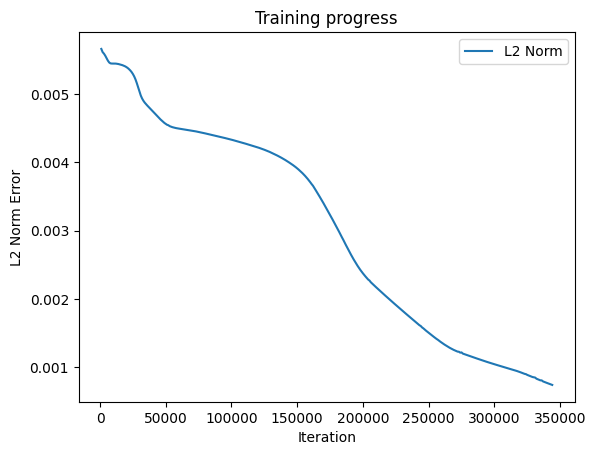

Predicted a: 1.7428330183029175
Predicted b: 2.963326930999756
Predicted c: 2.9809587001800537


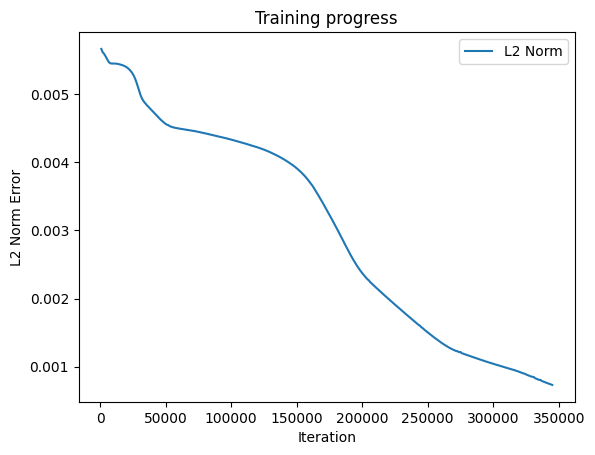

Predicted a: 1.7450045347213745
Predicted b: 2.96445369720459
Predicted c: 2.981316328048706


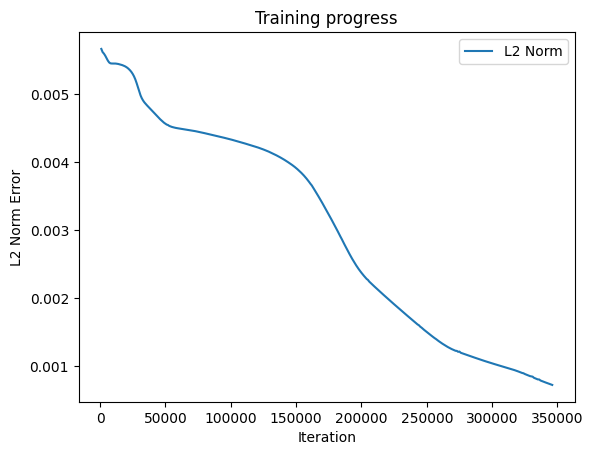

Predicted a: 1.747129201889038
Predicted b: 2.965564727783203
Predicted c: 2.981651782989502


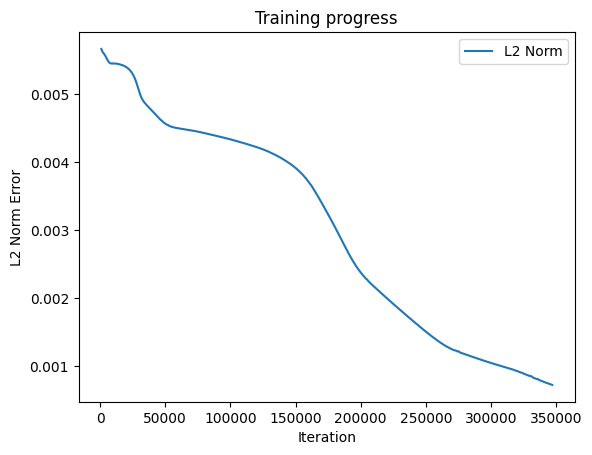

Predicted a: 1.7492096424102783
Predicted b: 2.9666550159454346
Predicted c: 2.9819672107696533


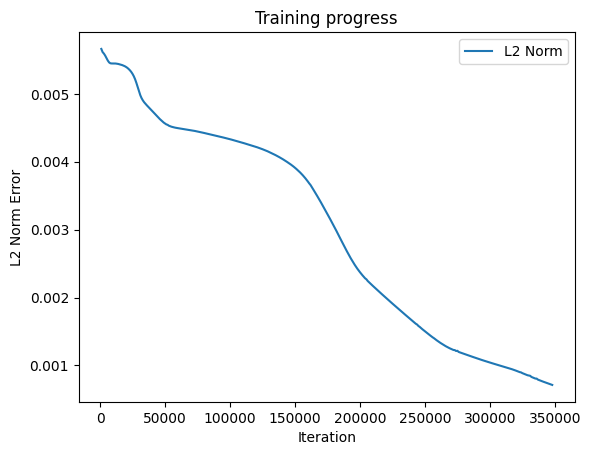

Predicted a: 1.7512462139129639
Predicted b: 2.967730760574341
Predicted c: 2.9822607040405273


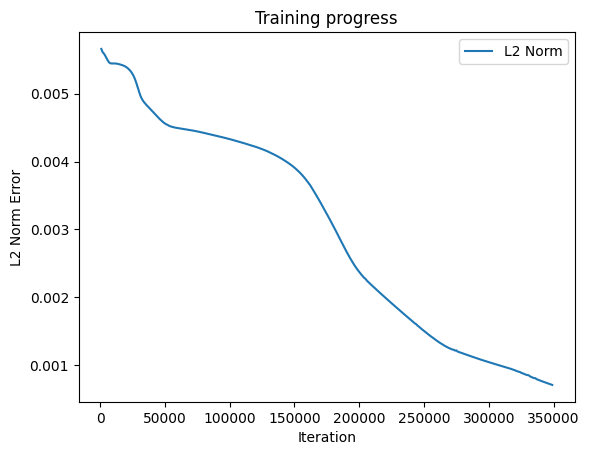

Predicted a: 1.7532130479812622
Predicted b: 2.968773603439331
Predicted c: 2.9825329780578613


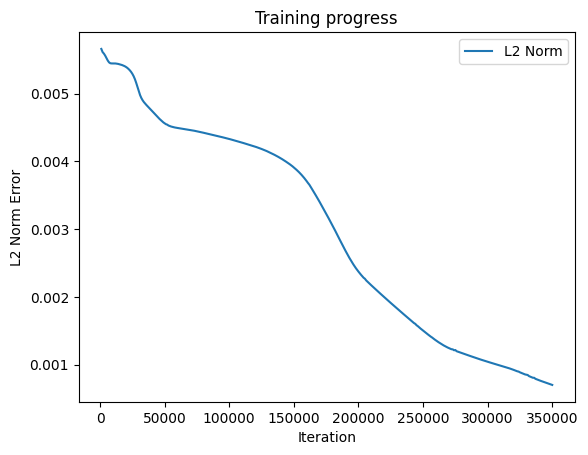

Predicted a: 1.755121111869812
Predicted b: 2.969787359237671
Predicted c: 2.982792377471924


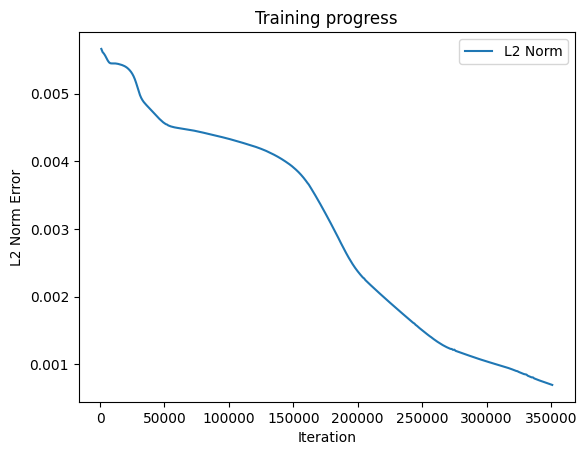

Predicted a: 1.756973147392273
Predicted b: 2.970789909362793
Predicted c: 2.9830446243286133


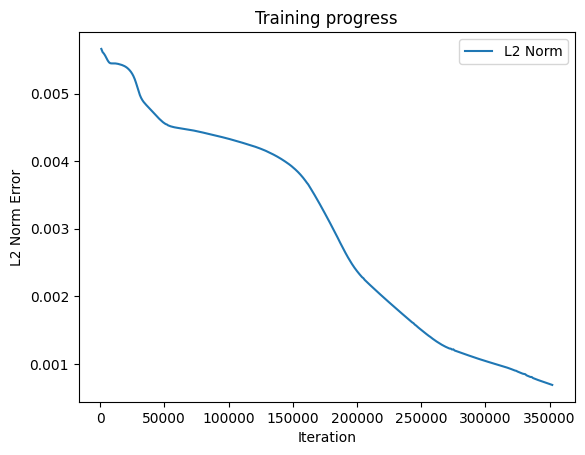

Predicted a: 1.758784532546997
Predicted b: 2.9717776775360107
Predicted c: 2.9832863807678223


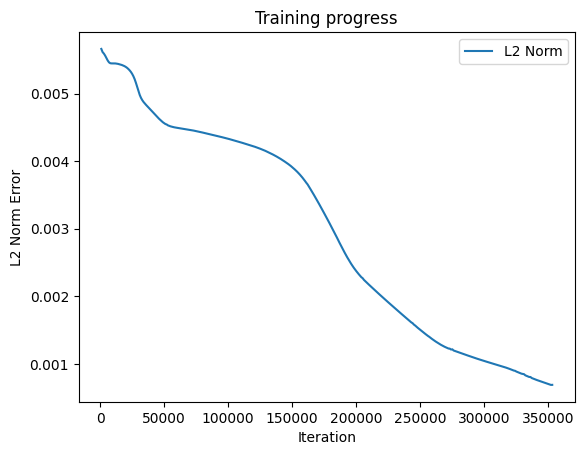

Predicted a: 1.7605390548706055
Predicted b: 2.972745180130005
Predicted c: 2.9835147857666016


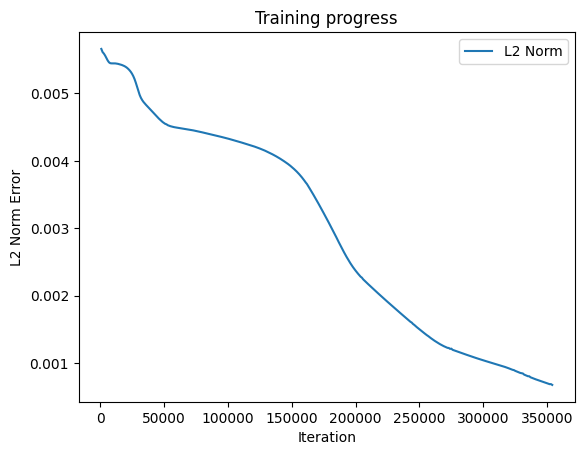

Predicted a: 1.7622509002685547
Predicted b: 2.9736945629119873
Predicted c: 2.9837307929992676


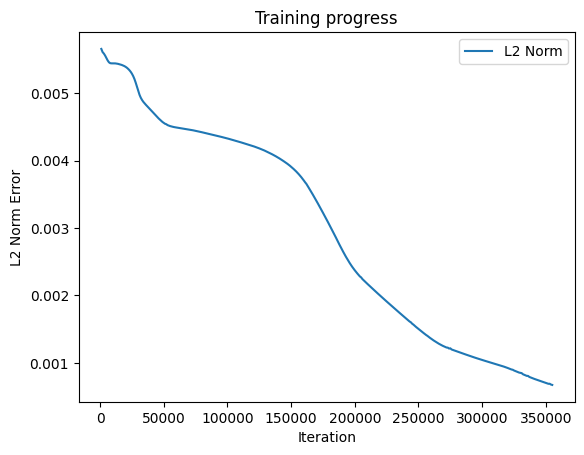

Predicted a: 1.7639409303665161
Predicted b: 2.974637269973755
Predicted c: 2.983935832977295


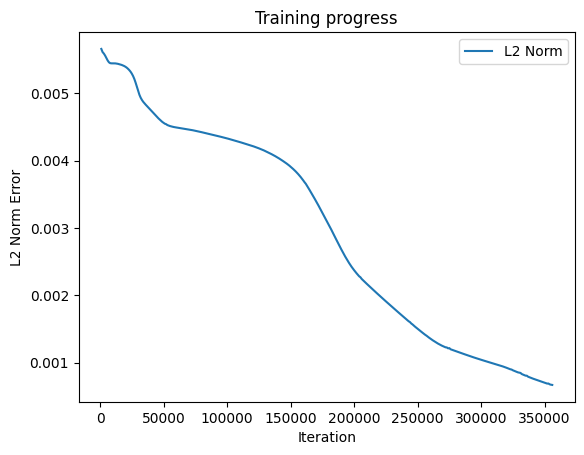

Predicted a: 1.7655845880508423
Predicted b: 2.9755492210388184
Predicted c: 2.984124183654785


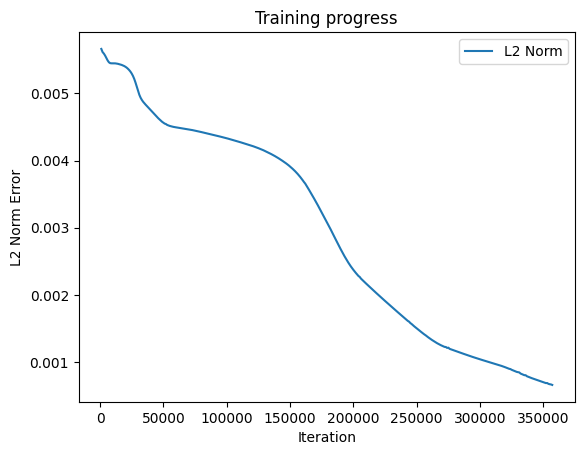

Predicted a: 1.7671759128570557
Predicted b: 2.976438283920288
Predicted c: 2.984297752380371


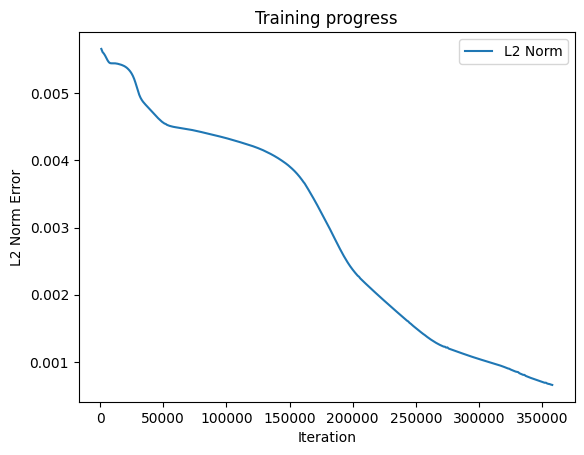

Predicted a: 1.7687468528747559
Predicted b: 2.9773082733154297
Predicted c: 2.984466791152954


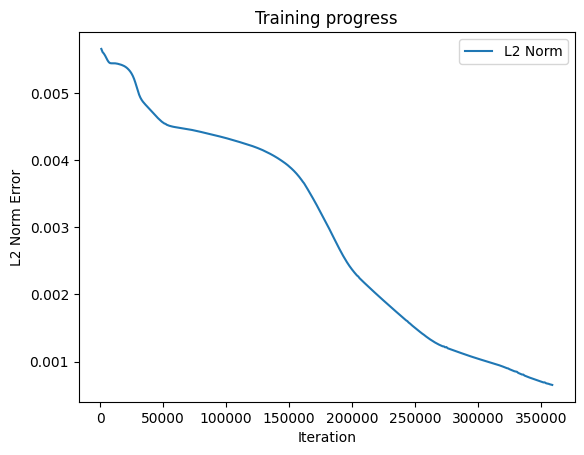

Predicted a: 1.7703198194503784
Predicted b: 2.9781711101531982
Predicted c: 2.984626054763794


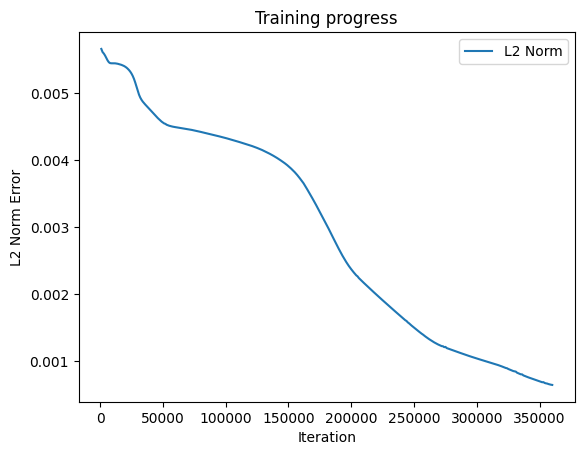

Predicted a: 1.7718563079833984
Predicted b: 2.9790008068084717
Predicted c: 2.9847726821899414


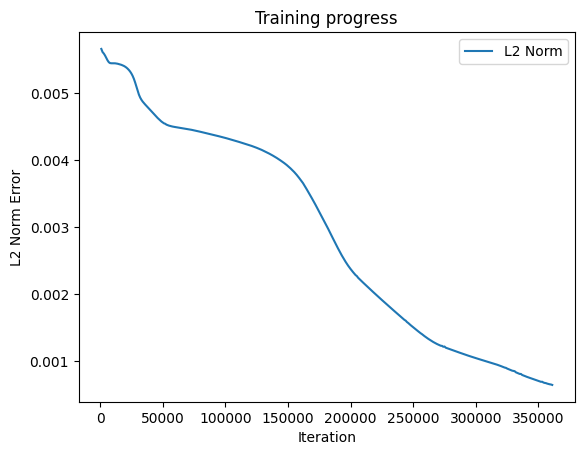

Predicted a: 1.7733558416366577
Predicted b: 2.979790449142456
Predicted c: 2.984910011291504


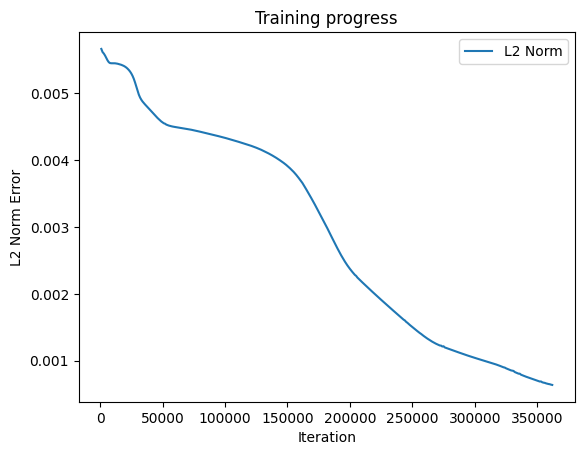

Predicted a: 1.774781346321106
Predicted b: 2.9805238246917725
Predicted c: 2.9850358963012695


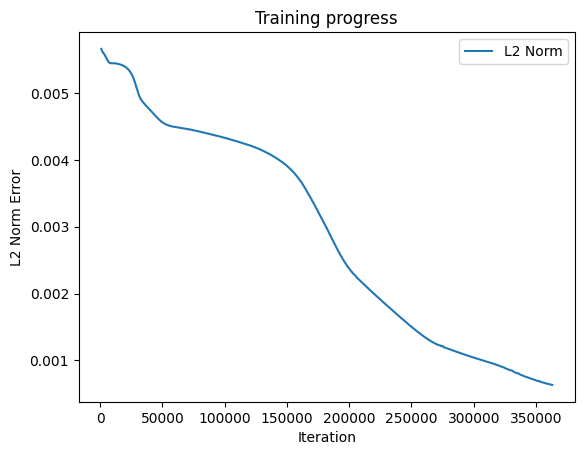

Predicted a: 1.7761716842651367
Predicted b: 2.9812378883361816
Predicted c: 2.985145330429077


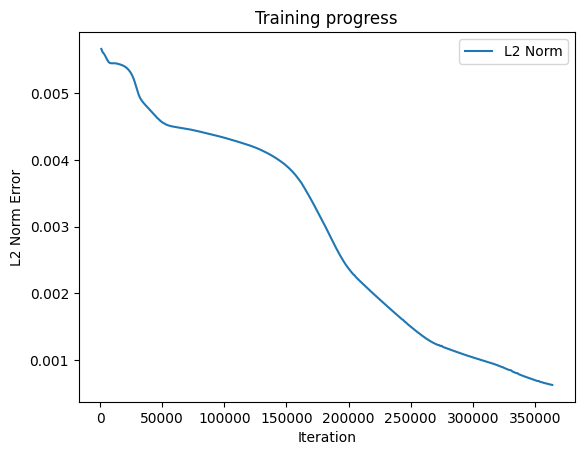

Predicted a: 1.7775665521621704
Predicted b: 2.9819302558898926
Predicted c: 2.9852471351623535


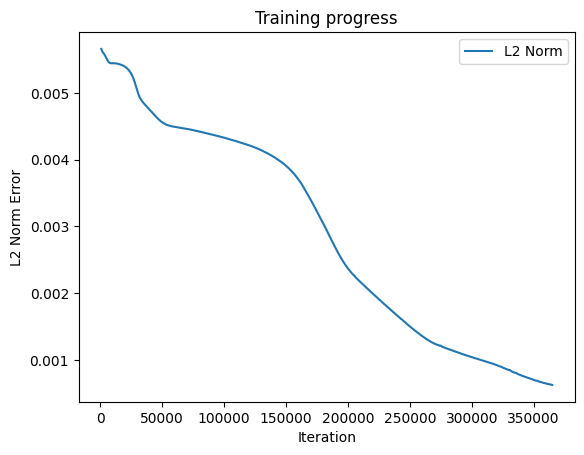

Predicted a: 1.7789584398269653
Predicted b: 2.9826042652130127
Predicted c: 2.985342502593994


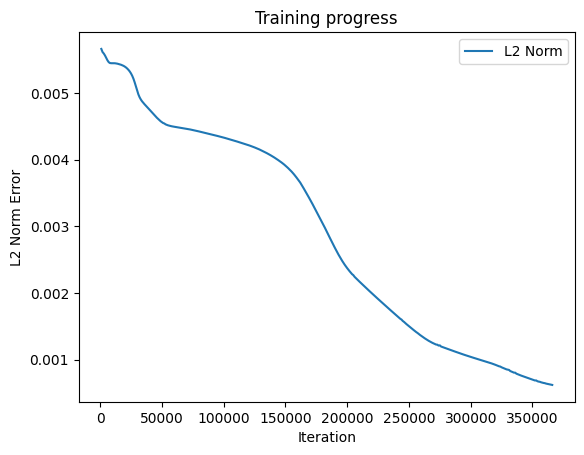

Predicted a: 1.7802660465240479
Predicted b: 2.9832358360290527
Predicted c: 2.9854300022125244


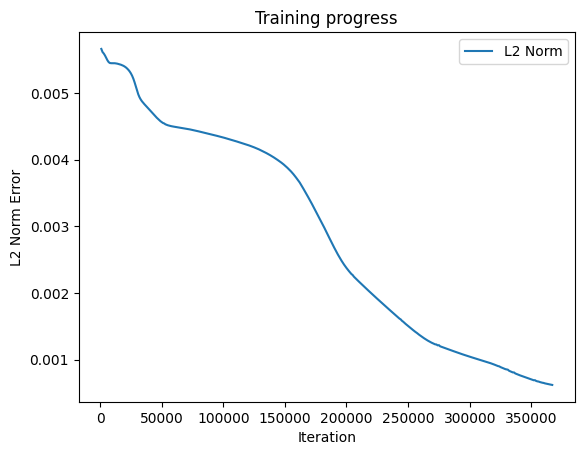

Predicted a: 1.781514048576355
Predicted b: 2.9838449954986572
Predicted c: 2.985509157180786


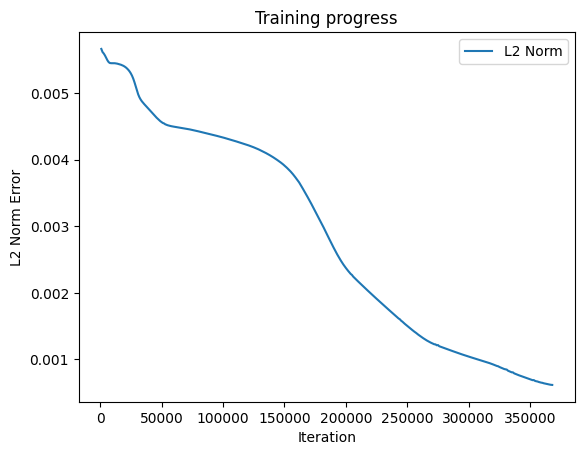

Predicted a: 1.7827414274215698
Predicted b: 2.984437942504883
Predicted c: 2.985588788986206


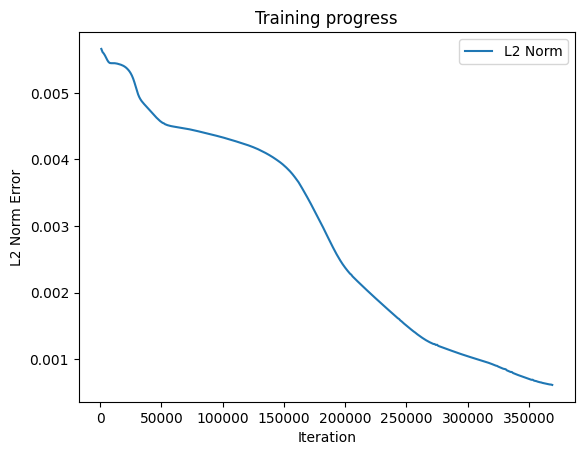

Predicted a: 1.78394615650177
Predicted b: 2.9850146770477295
Predicted c: 2.9856679439544678


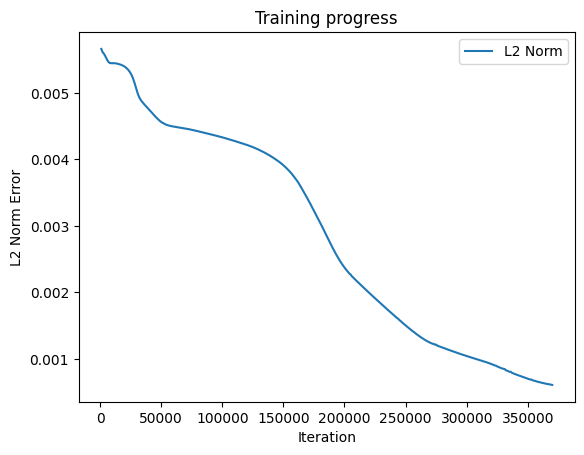

Predicted a: 1.7851439714431763
Predicted b: 2.9855785369873047
Predicted c: 2.9857490062713623


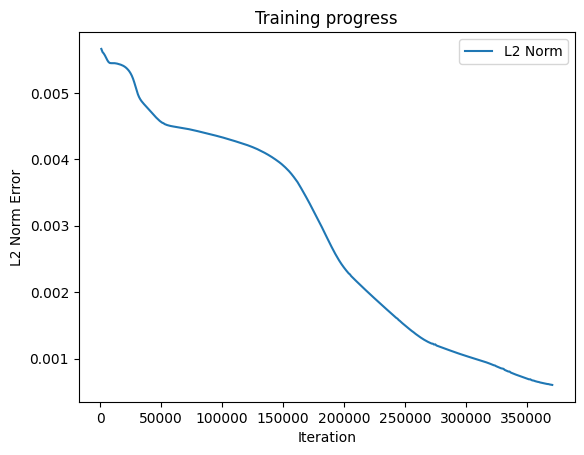

Predicted a: 1.7863115072250366
Predicted b: 2.986117362976074
Predicted c: 2.9858243465423584


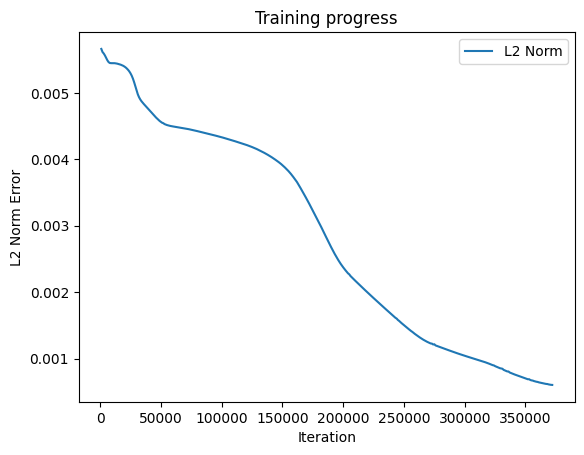

Predicted a: 1.7874517440795898
Predicted b: 2.9866340160369873
Predicted c: 2.9858951568603516


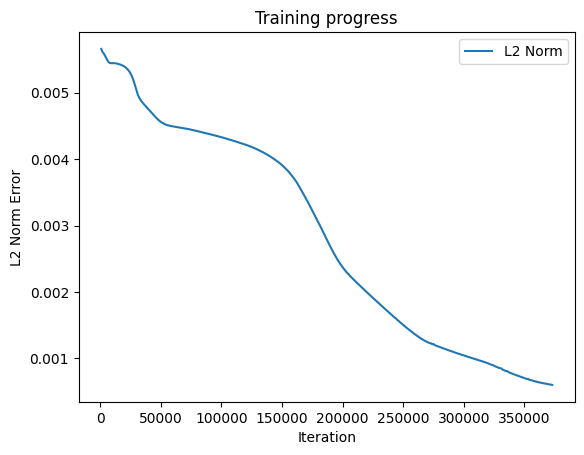

Predicted a: 1.7885583639144897
Predicted b: 2.987123489379883
Predicted c: 2.9859619140625


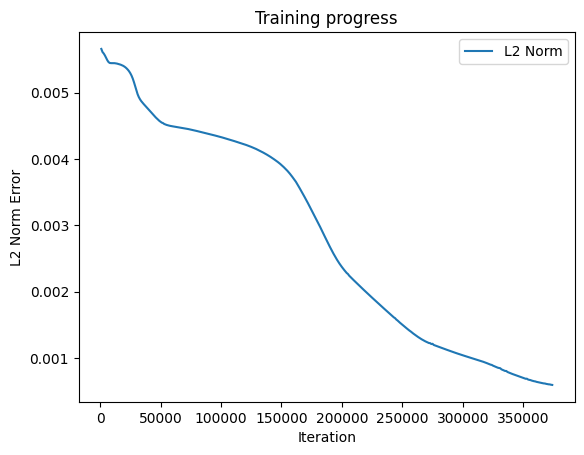

Predicted a: 1.7896369695663452
Predicted b: 2.987588882446289
Predicted c: 2.9860308170318604


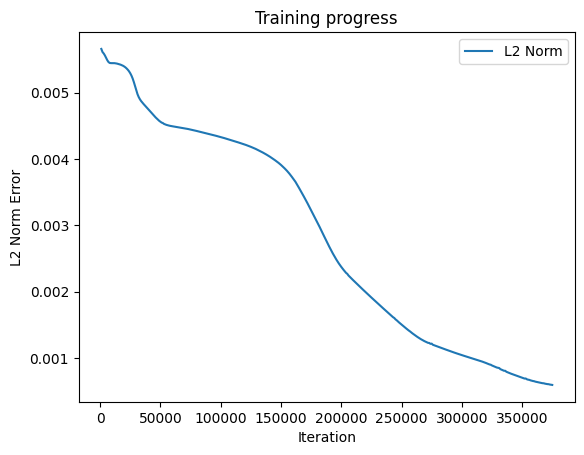

Predicted a: 1.7906938791275024
Predicted b: 2.9880361557006836
Predicted c: 2.986095428466797


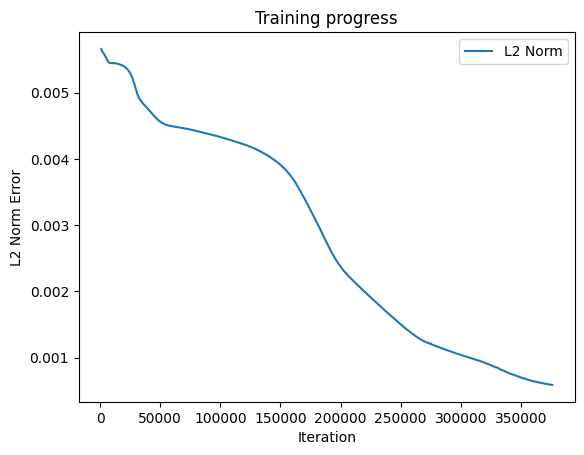

Predicted a: 1.7917237281799316
Predicted b: 2.9884607791900635
Predicted c: 2.986151933670044


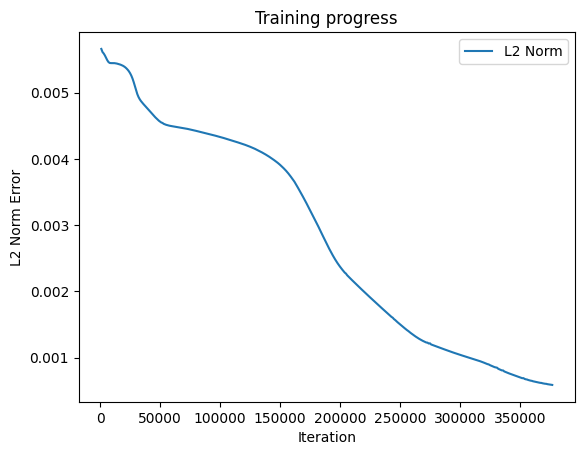

Predicted a: 1.7927336692810059
Predicted b: 2.988863706588745
Predicted c: 2.9862101078033447


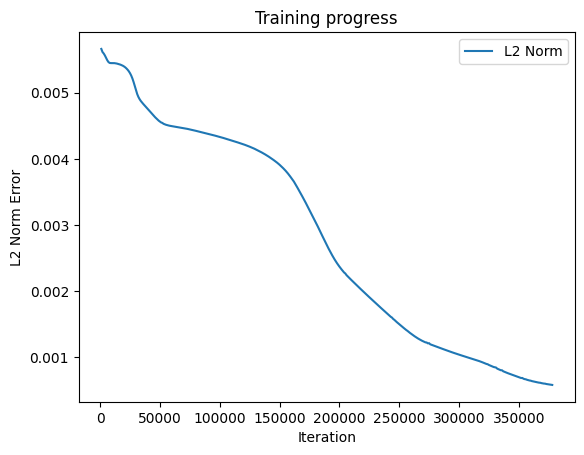

Predicted a: 1.7937239408493042
Predicted b: 2.9892466068267822
Predicted c: 2.98626446723938


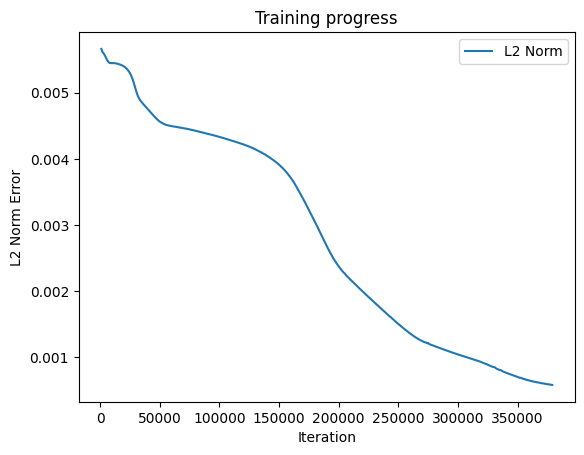

Predicted a: 1.794686198234558
Predicted b: 2.9896140098571777
Predicted c: 2.986315965652466


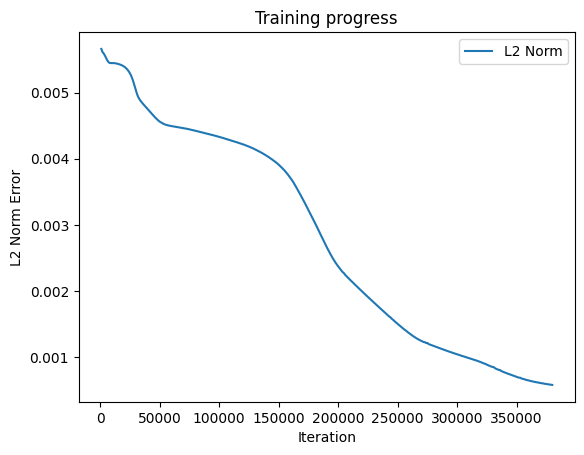

Predicted a: 1.7956302165985107
Predicted b: 2.989962339401245
Predicted c: 2.9863626956939697


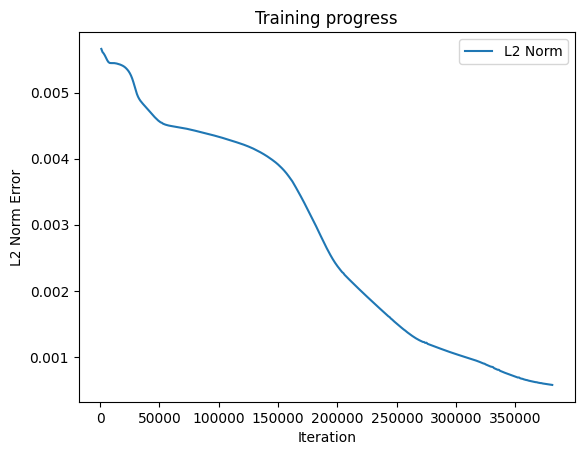

Predicted a: 1.7965503931045532
Predicted b: 2.990293502807617
Predicted c: 2.9864089488983154


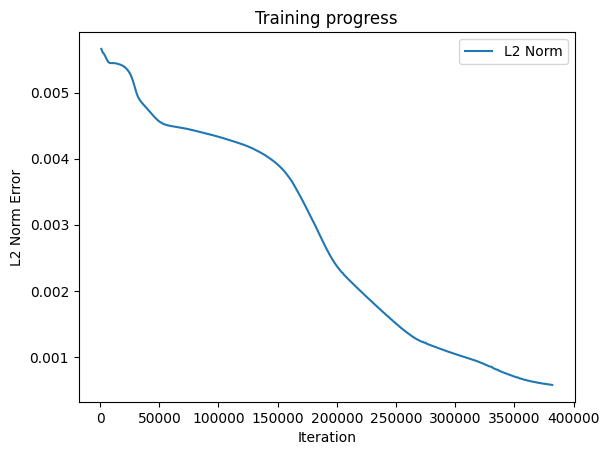

Predicted a: 1.7974523305892944
Predicted b: 2.9906067848205566
Predicted c: 2.9864540100097656


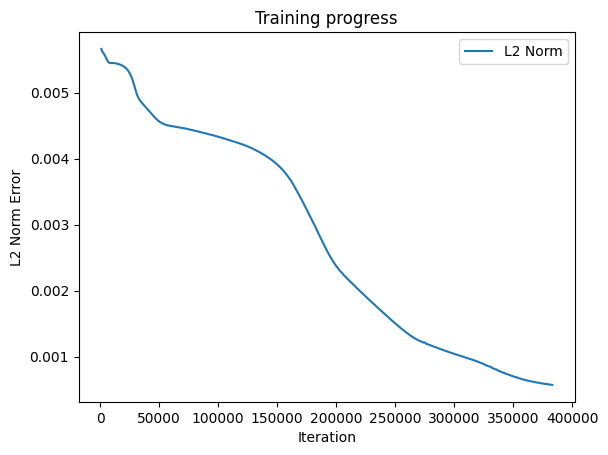

Predicted a: 1.798335313796997
Predicted b: 2.990903854370117
Predicted c: 2.986499547958374


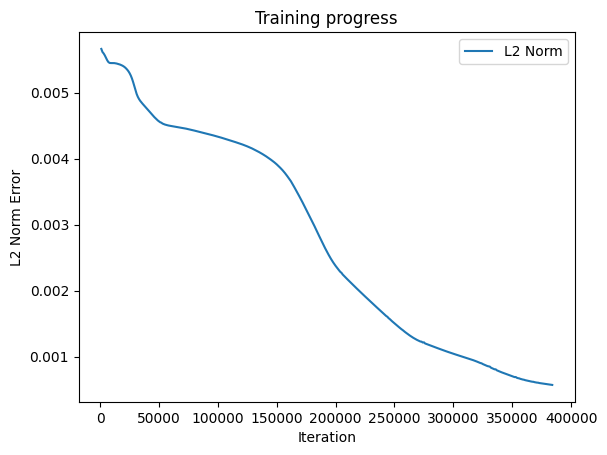

Predicted a: 1.7991981506347656
Predicted b: 2.991184711456299
Predicted c: 2.9865429401397705


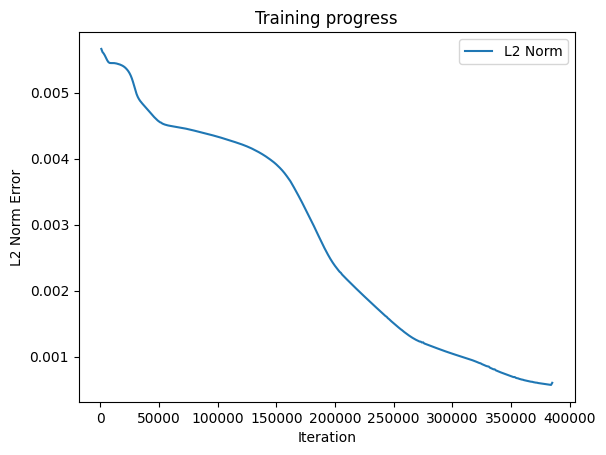

Predicted a: 1.8000433444976807
Predicted b: 2.991450786590576
Predicted c: 2.9865875244140625


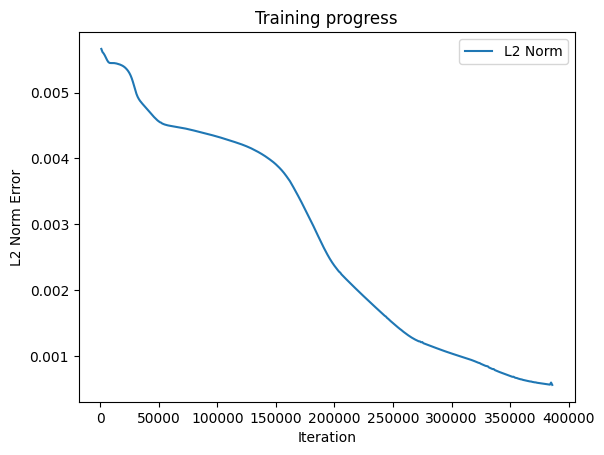

Predicted a: 1.800873875617981
Predicted b: 2.9917030334472656
Predicted c: 2.9866292476654053


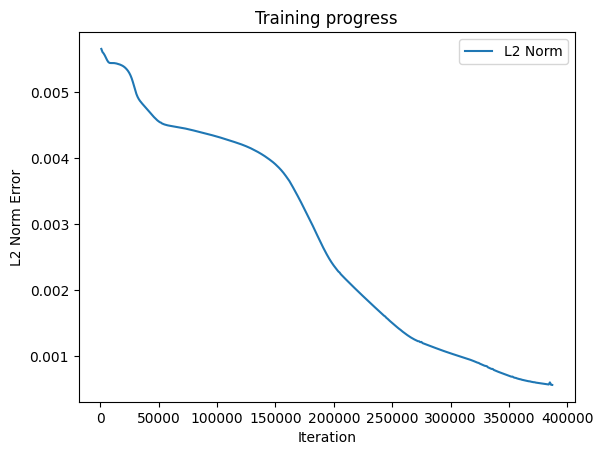

Predicted a: 1.8016889095306396
Predicted b: 2.991945743560791
Predicted c: 2.9866726398468018


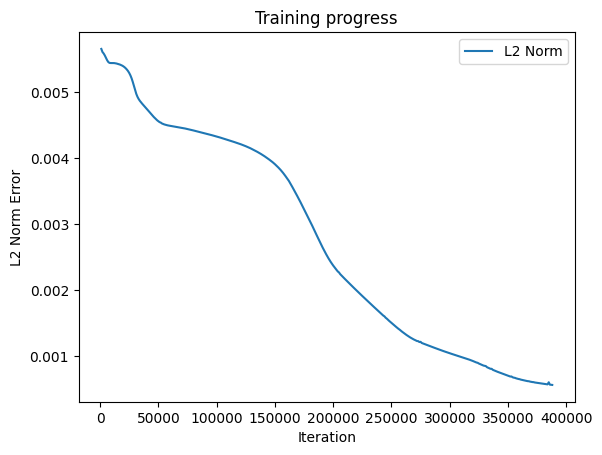

Predicted a: 1.8024895191192627
Predicted b: 2.992180347442627
Predicted c: 2.9867167472839355


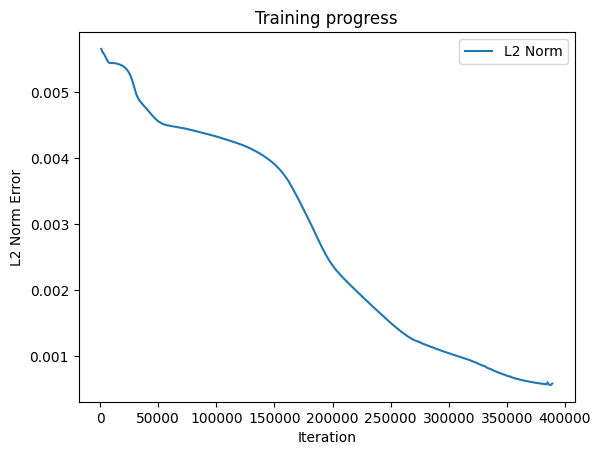

Predicted a: 1.8032764196395874
Predicted b: 2.9924051761627197
Predicted c: 2.9867610931396484


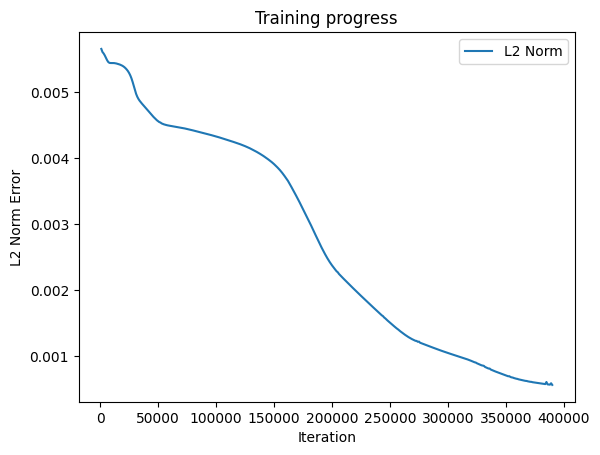

Predicted a: 1.8040575981140137
Predicted b: 2.9926199913024902
Predicted c: 2.986804246902466


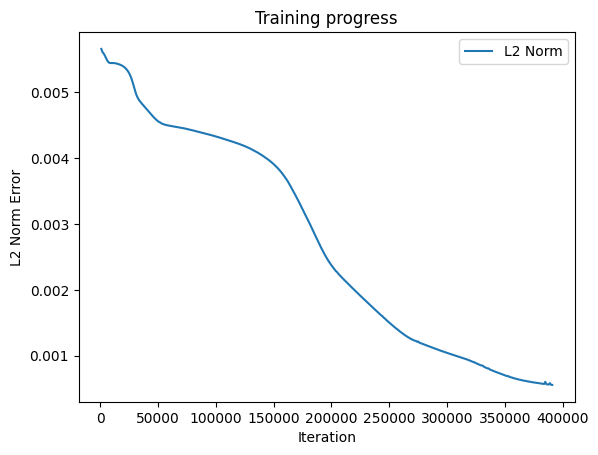

Predicted a: 1.8048315048217773
Predicted b: 2.9928290843963623
Predicted c: 2.9868478775024414


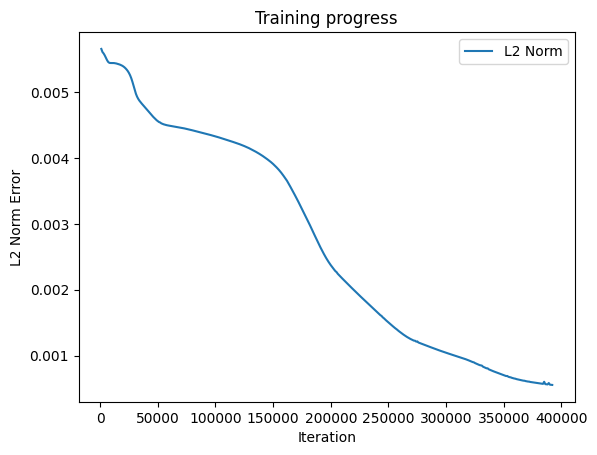

Predicted a: 1.8056010007858276
Predicted b: 2.9930286407470703
Predicted c: 2.986891508102417


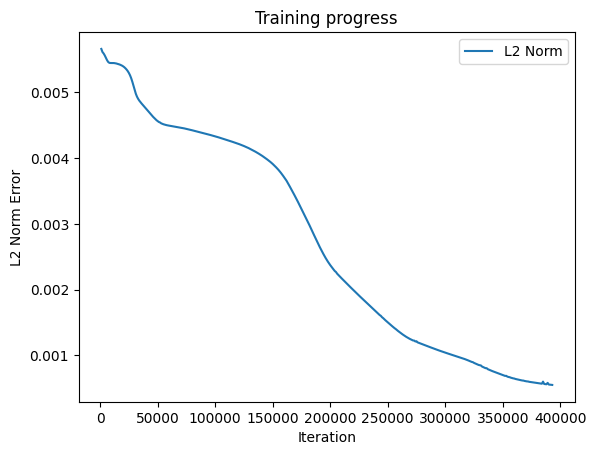

Predicted a: 1.806361436843872
Predicted b: 2.9932219982147217
Predicted c: 2.986934185028076


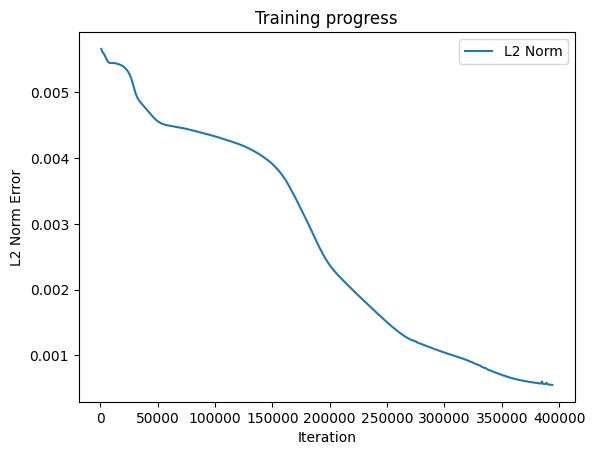

Predicted a: 1.807113766670227
Predicted b: 2.9934072494506836
Predicted c: 2.9869766235351562


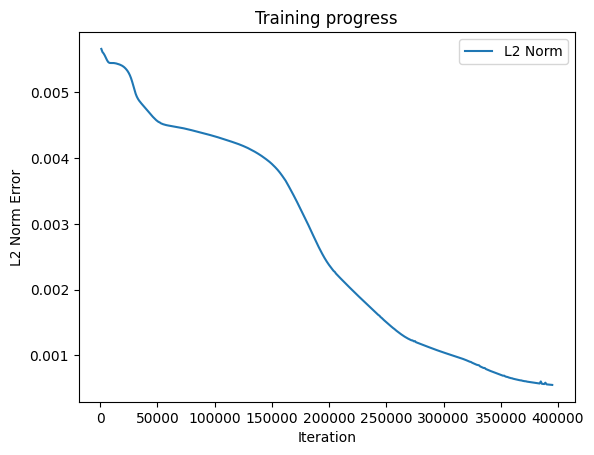

Predicted a: 1.8078601360321045
Predicted b: 2.993586301803589
Predicted c: 2.9870195388793945


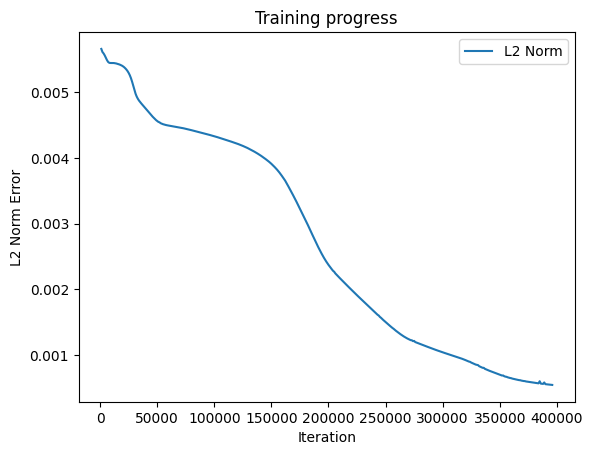

Predicted a: 1.8085951805114746
Predicted b: 2.993757724761963
Predicted c: 2.987062692642212


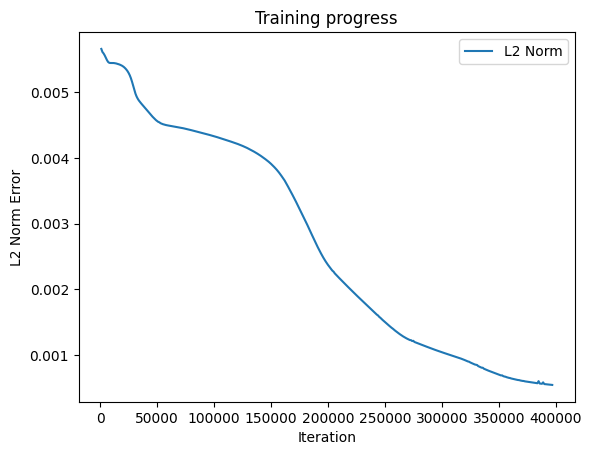

Predicted a: 1.809329867362976
Predicted b: 2.9939239025115967
Predicted c: 2.987105369567871


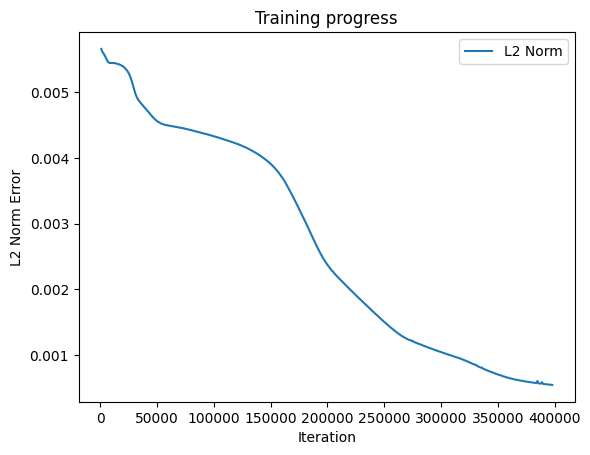

Predicted a: 1.8100600242614746
Predicted b: 2.9940860271453857
Predicted c: 2.987149477005005


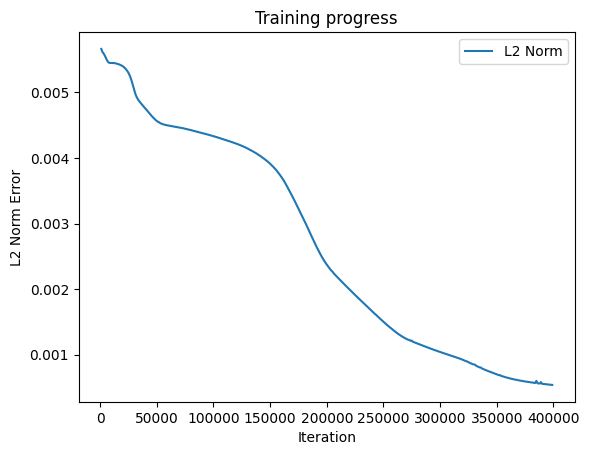

Predicted a: 1.8107837438583374
Predicted b: 2.9942402839660645
Predicted c: 2.987194299697876


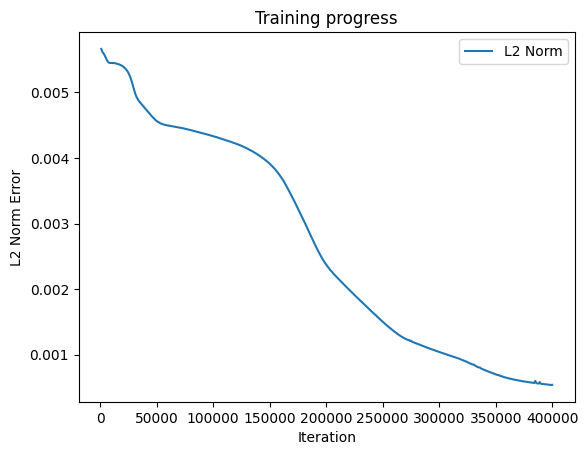

Predicted a: 1.8115038871765137
Predicted b: 2.9943902492523193
Predicted c: 2.987239360809326


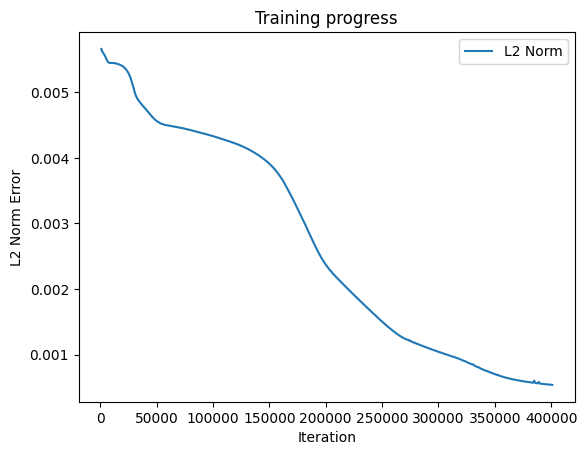

Predicted a: 1.8122178316116333
Predicted b: 2.9945359230041504
Predicted c: 2.9872827529907227


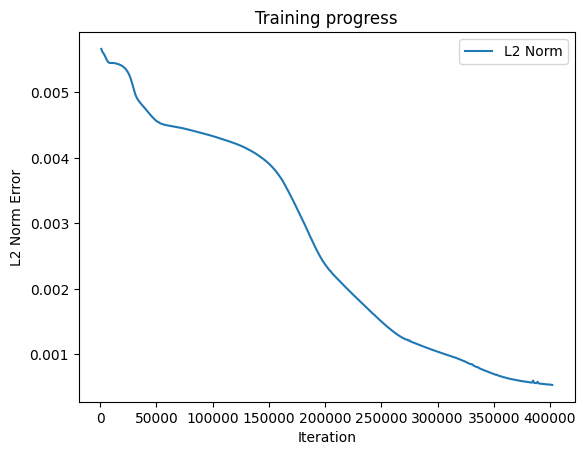

Predicted a: 1.8129256963729858
Predicted b: 2.9946765899658203
Predicted c: 2.987328052520752


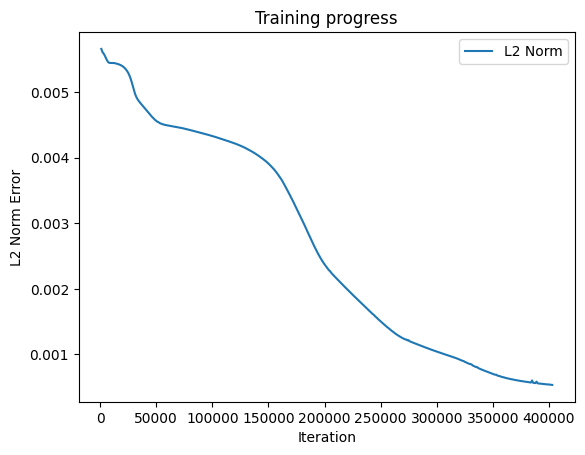

Predicted a: 1.81363046169281
Predicted b: 2.994812250137329
Predicted c: 2.9873743057250977


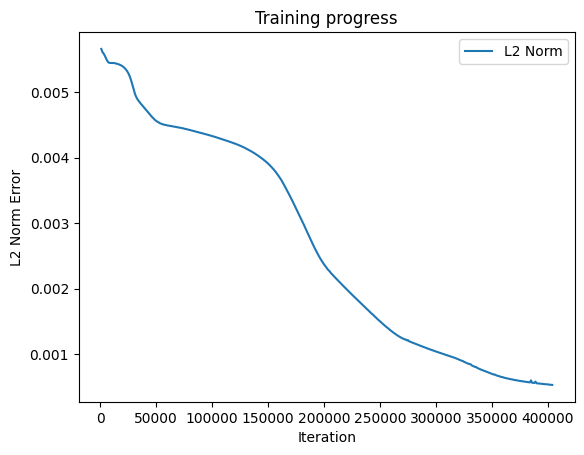

Predicted a: 1.8143274784088135
Predicted b: 2.9949424266815186
Predicted c: 2.9874167442321777


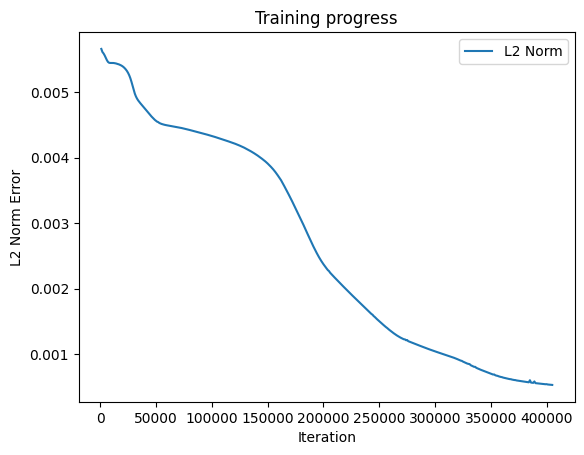

Predicted a: 1.8150221109390259
Predicted b: 2.995065450668335
Predicted c: 2.987462043762207


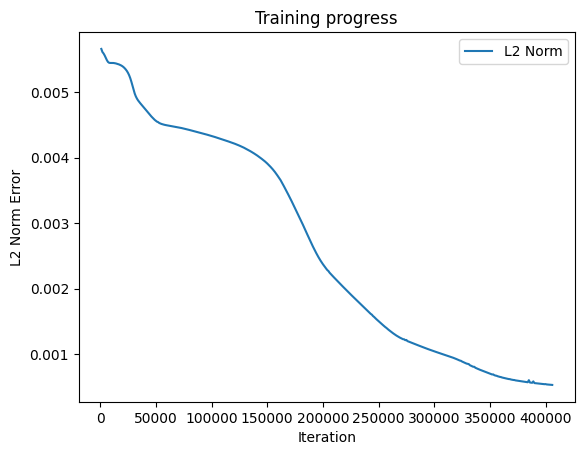

Predicted a: 1.8157012462615967
Predicted b: 2.995185136795044
Predicted c: 2.987504720687866


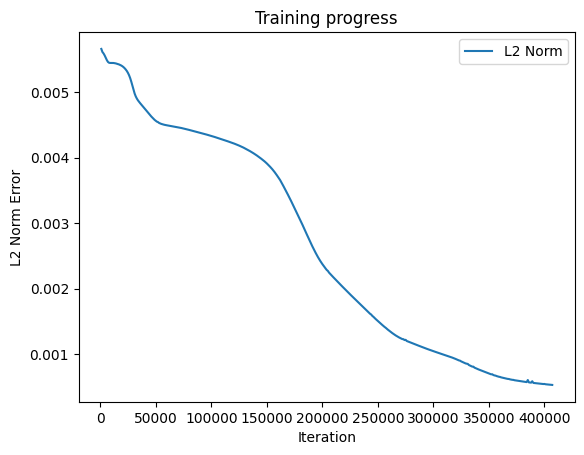

Predicted a: 1.8163704872131348
Predicted b: 2.9953012466430664
Predicted c: 2.9875473976135254


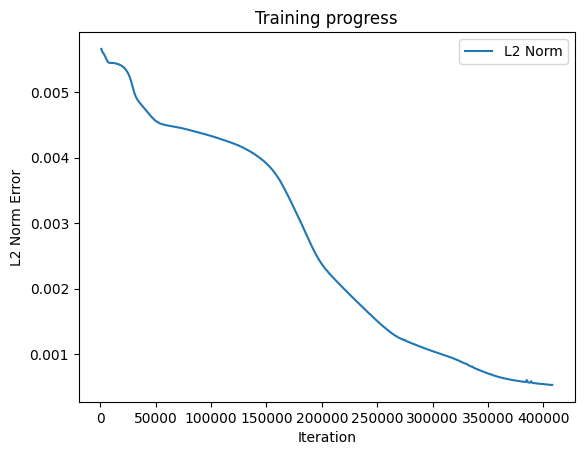

Predicted a: 1.8170281648635864
Predicted b: 2.9954142570495605
Predicted c: 2.9875881671905518


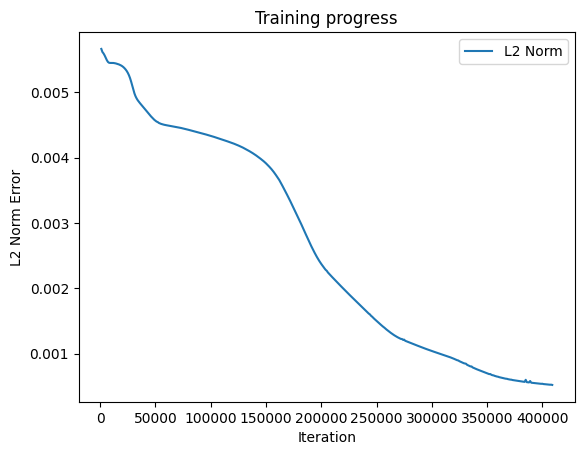

Predicted a: 1.8176772594451904
Predicted b: 2.995523452758789
Predicted c: 2.9876294136047363


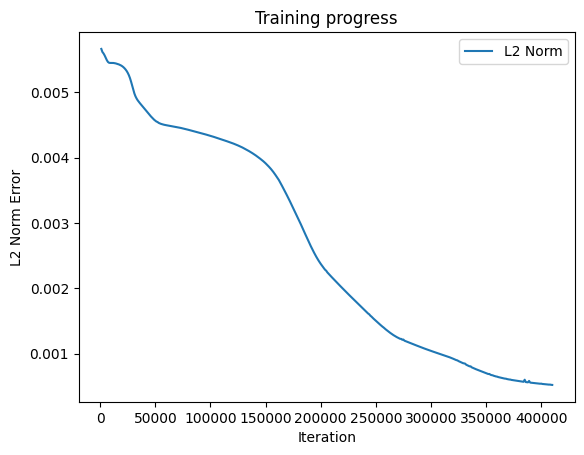

Predicted a: 1.8183226585388184
Predicted b: 2.99562931060791
Predicted c: 2.987671136856079


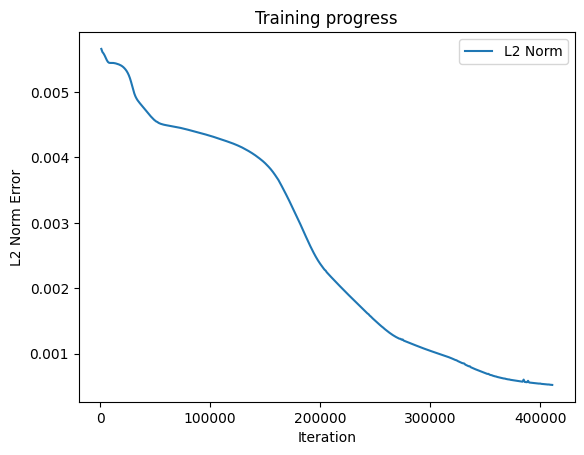

Predicted a: 1.8189451694488525
Predicted b: 2.9957287311553955
Predicted c: 2.987713575363159


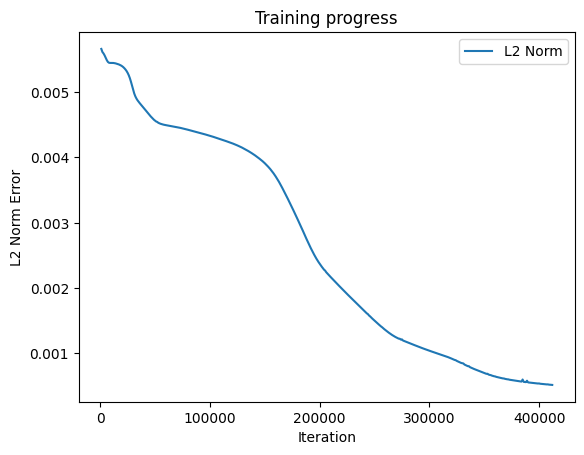

Predicted a: 1.8195714950561523
Predicted b: 2.995828151702881
Predicted c: 2.987757682800293


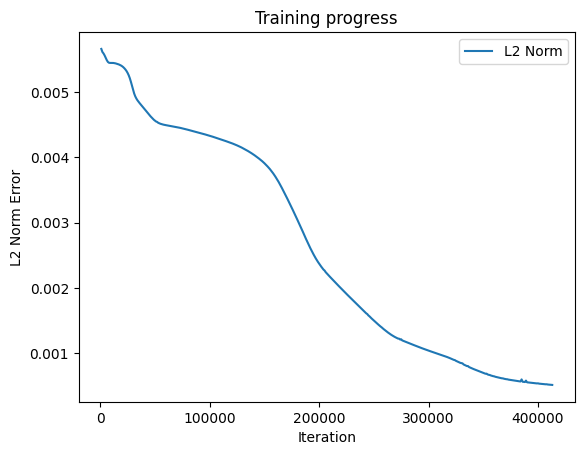

Predicted a: 1.820192813873291
Predicted b: 2.9959235191345215
Predicted c: 2.9878039360046387


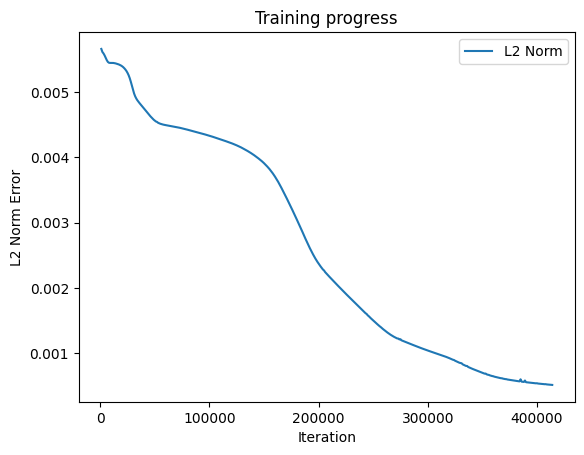

Predicted a: 1.8208085298538208
Predicted b: 2.9960174560546875
Predicted c: 2.987846612930298


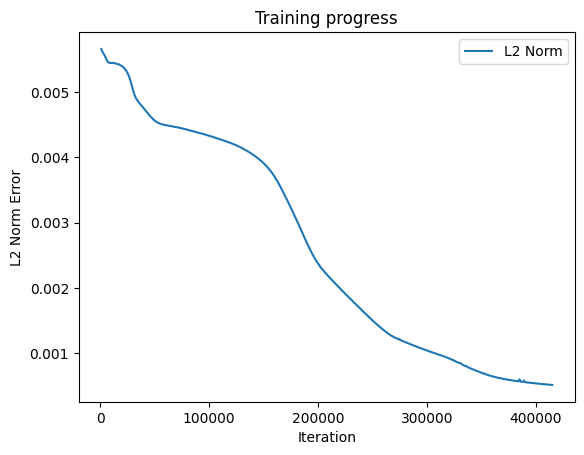

Predicted a: 1.8214287757873535
Predicted b: 2.9961109161376953
Predicted c: 2.987893581390381


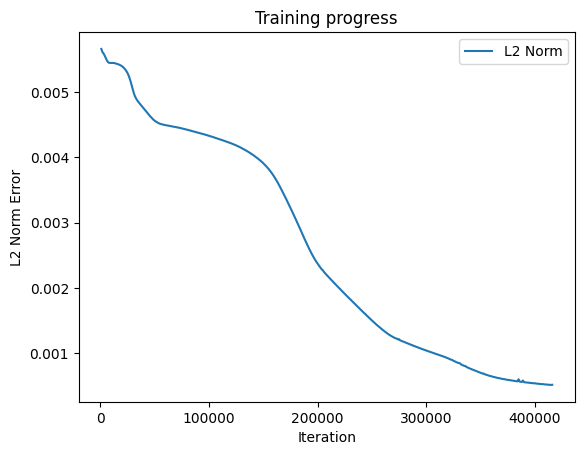

Predicted a: 1.8220429420471191
Predicted b: 2.996199607849121
Predicted c: 2.9879403114318848


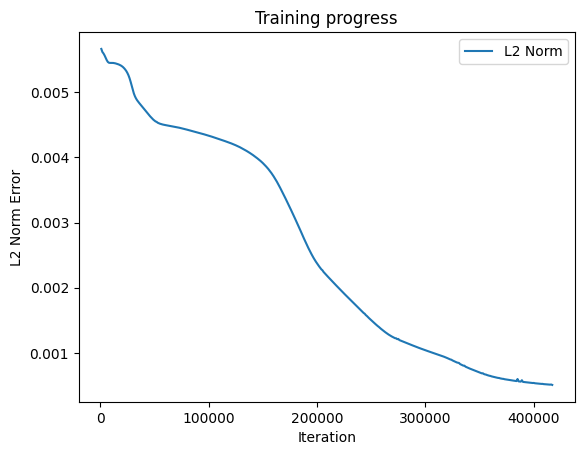

Predicted a: 1.822637677192688
Predicted b: 2.9962854385375977
Predicted c: 2.9879863262176514


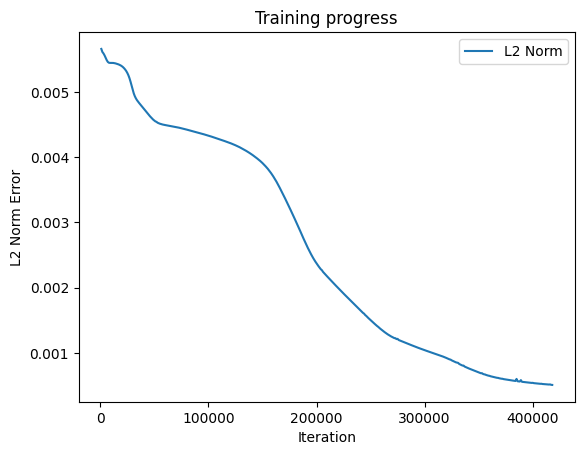

Predicted a: 1.8232321739196777
Predicted b: 2.9963667392730713
Predicted c: 2.988032579421997


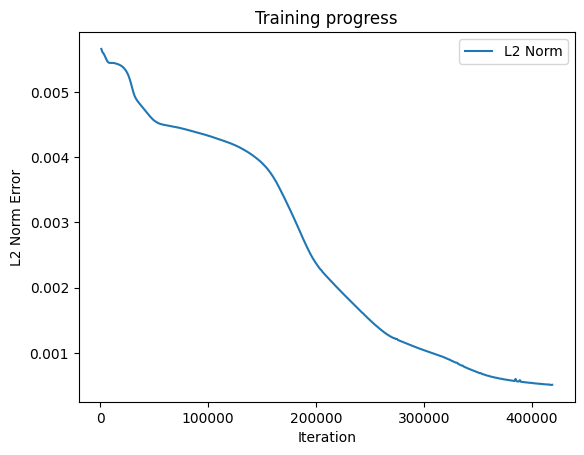

Predicted a: 1.8238279819488525
Predicted b: 2.9964470863342285
Predicted c: 2.9880831241607666


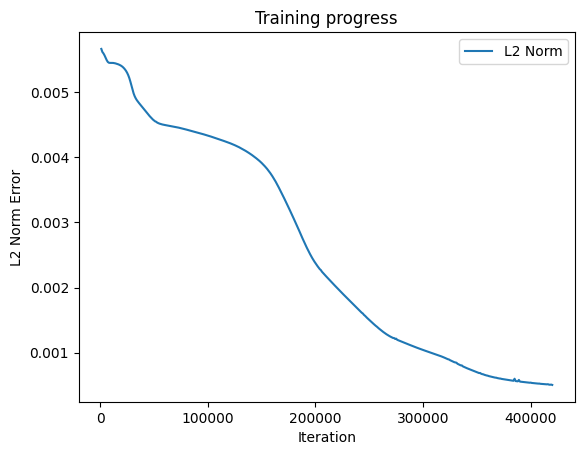

Predicted a: 1.8244038820266724
Predicted b: 2.996523380279541
Predicted c: 2.9881317615509033


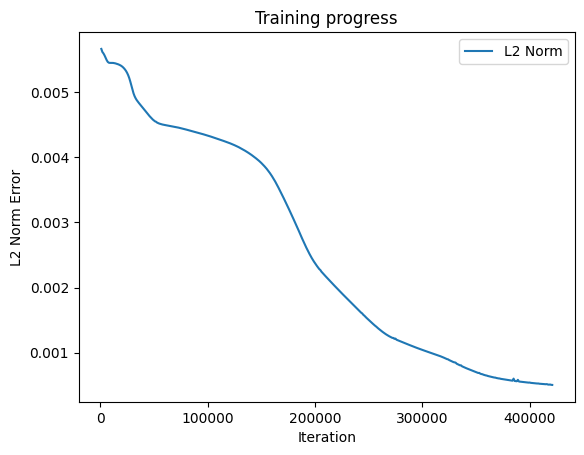

Predicted a: 1.8249717950820923
Predicted b: 2.996594190597534
Predicted c: 2.988179922103882


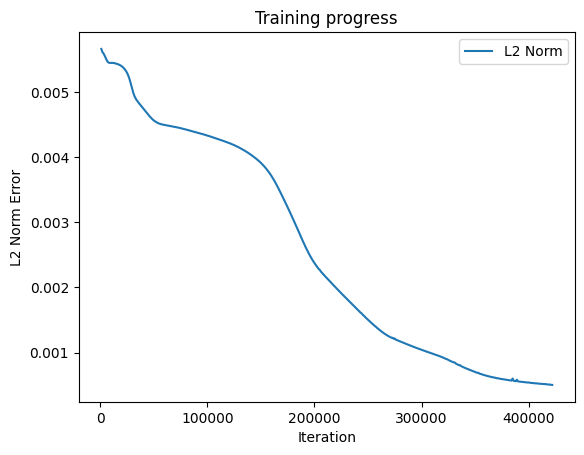

Predicted a: 1.8255633115768433
Predicted b: 2.996669292449951
Predicted c: 2.9882359504699707


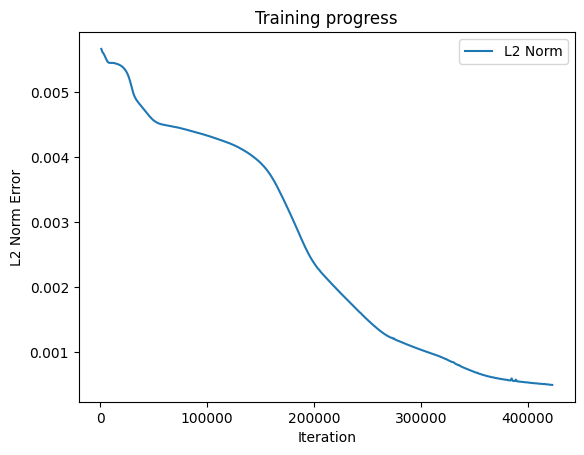

Predicted a: 1.8261523246765137
Predicted b: 2.99674129486084
Predicted c: 2.988290309906006


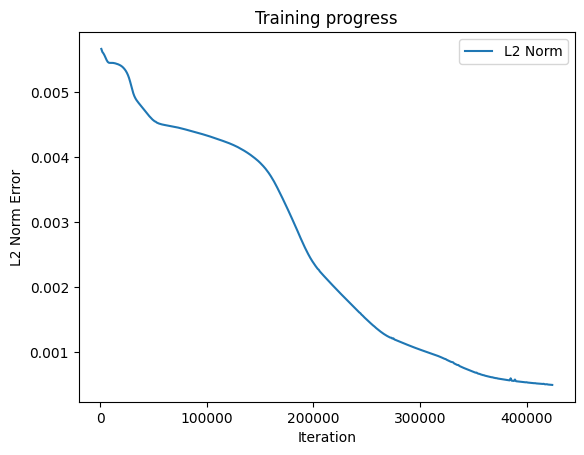

Predicted a: 1.8267594575881958
Predicted b: 2.9968132972717285
Predicted c: 2.9883487224578857


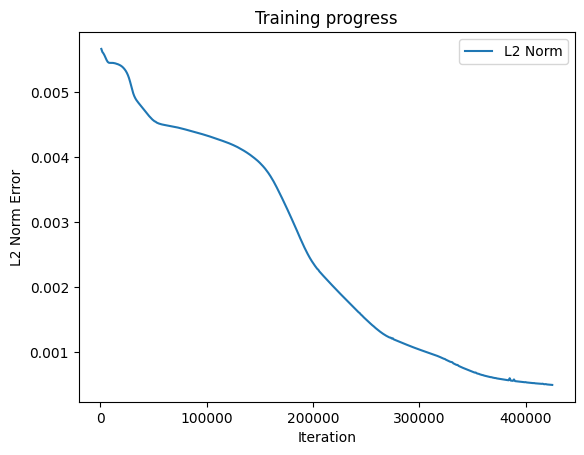

Predicted a: 1.8273680210113525
Predicted b: 2.9968855381011963
Predicted c: 2.9884085655212402


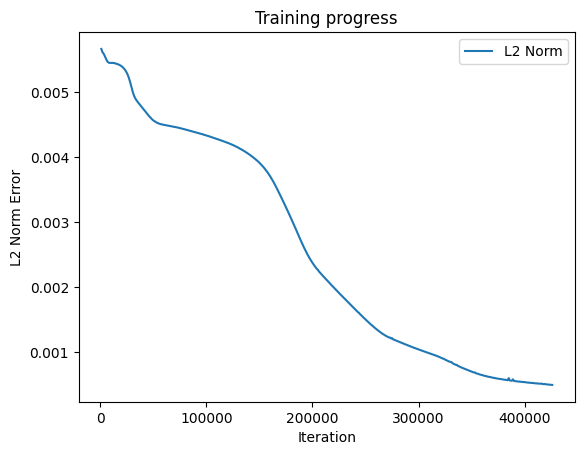

Predicted a: 1.8279738426208496
Predicted b: 2.9969544410705566
Predicted c: 2.988466739654541


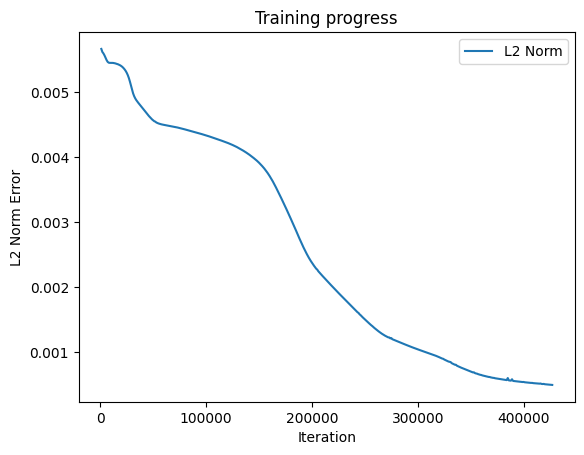

Predicted a: 1.8285800218582153
Predicted b: 2.9970219135284424
Predicted c: 2.988527536392212


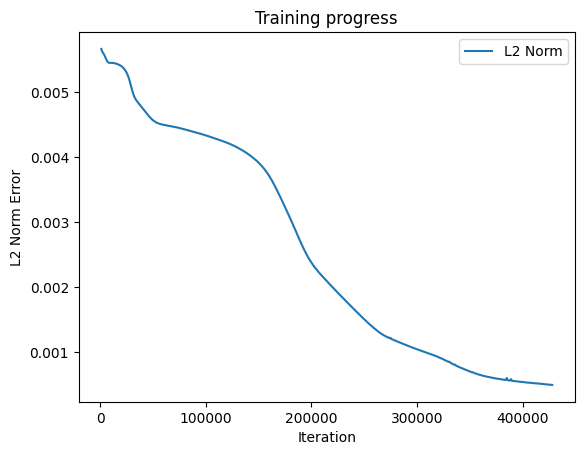

Predicted a: 1.8291852474212646
Predicted b: 2.9970862865448
Predicted c: 2.9885873794555664


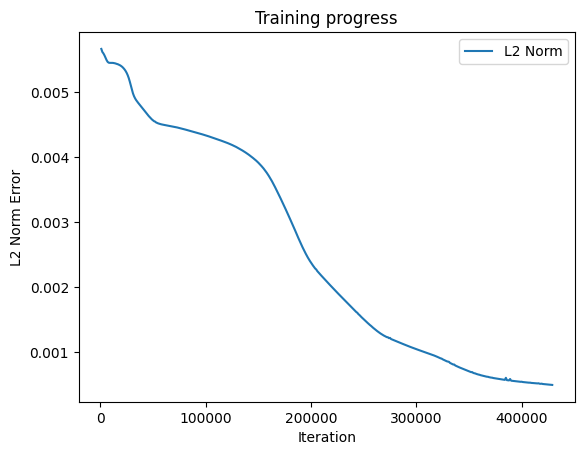

Predicted a: 1.8297921419143677
Predicted b: 2.997149705886841
Predicted c: 2.9886488914489746


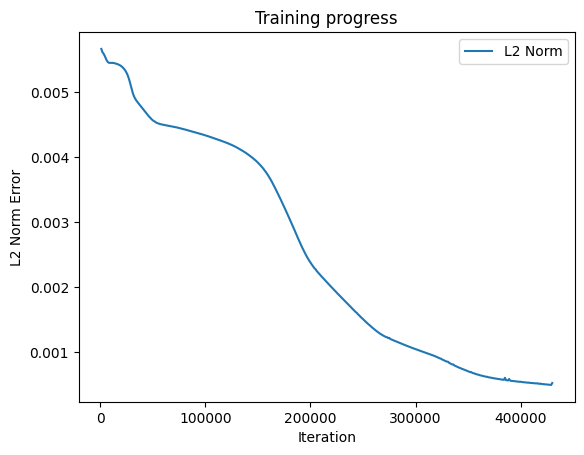

Predicted a: 1.8304020166397095
Predicted b: 2.9972121715545654
Predicted c: 2.9887120723724365


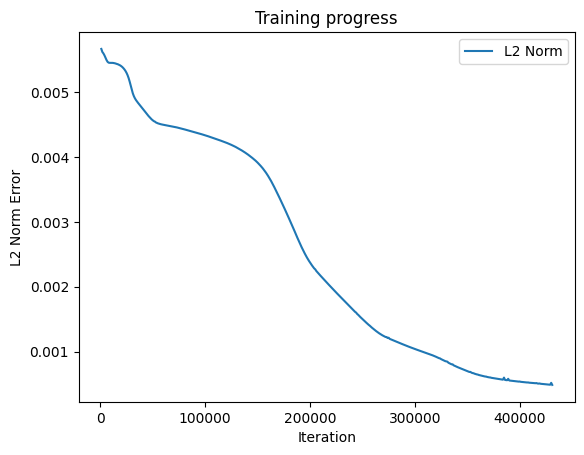

Predicted a: 1.8310081958770752
Predicted b: 2.997271776199341
Predicted c: 2.988773822784424


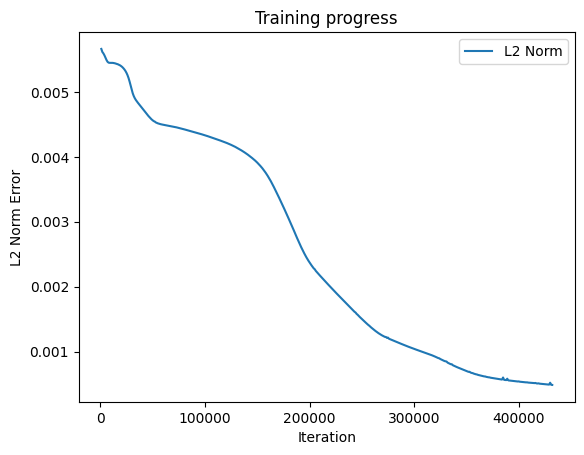

Predicted a: 1.8316208124160767
Predicted b: 2.9973292350769043
Predicted c: 2.9888365268707275


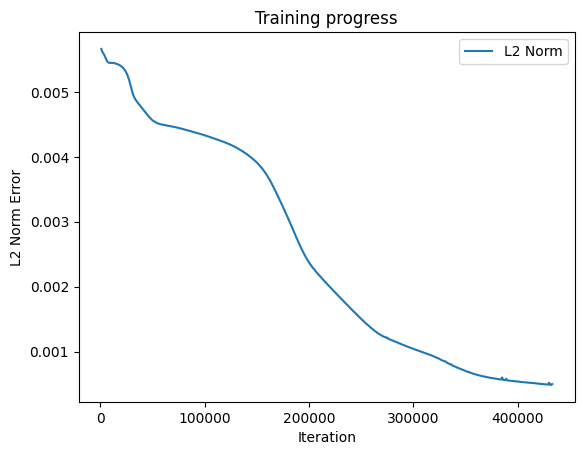

Predicted a: 1.8322376012802124
Predicted b: 2.9973855018615723
Predicted c: 2.9888999462127686


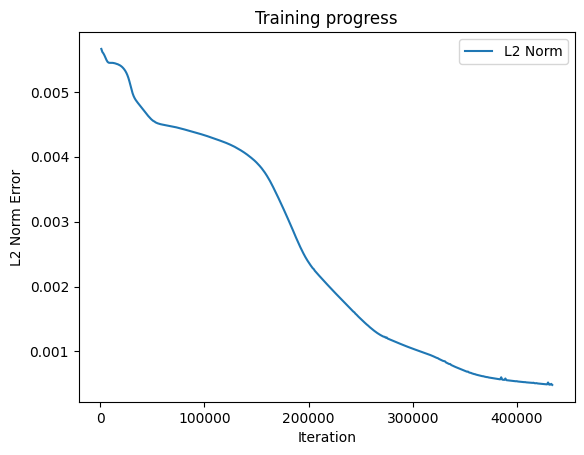

Predicted a: 1.8328547477722168
Predicted b: 2.9974379539489746
Predicted c: 2.988961935043335


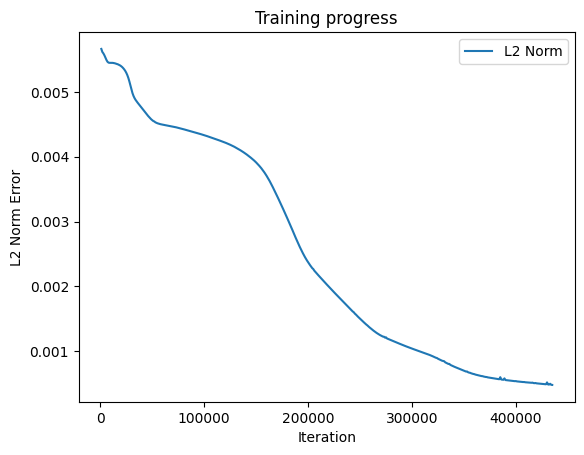

Predicted a: 1.8334746360778809
Predicted b: 2.9974892139434814
Predicted c: 2.9890241622924805


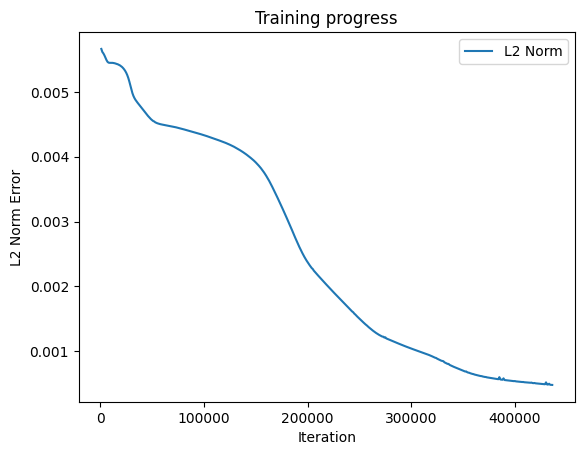

Predicted a: 1.8340970277786255
Predicted b: 2.997539758682251
Predicted c: 2.989086151123047


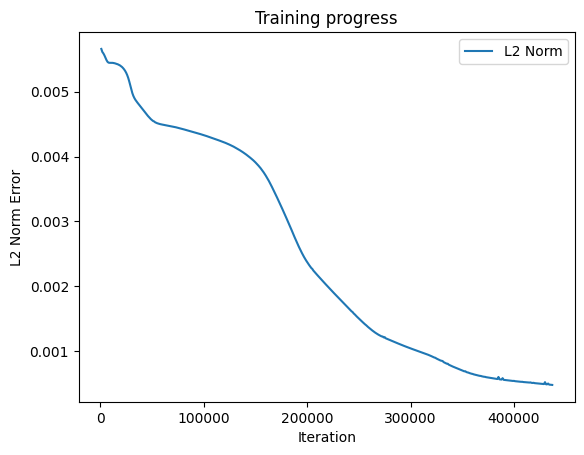

Predicted a: 1.834721326828003
Predicted b: 2.9975876808166504
Predicted c: 2.989149332046509


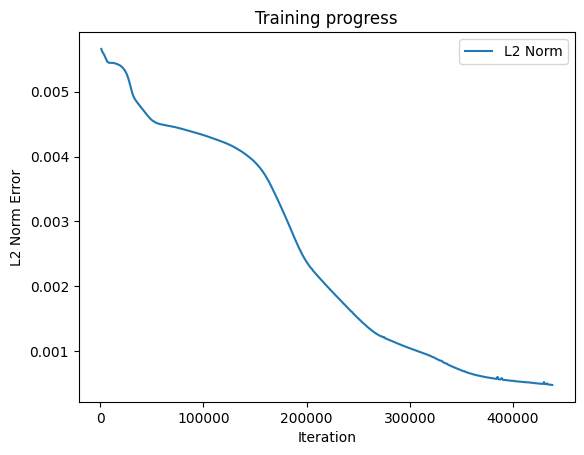

Predicted a: 1.835348129272461
Predicted b: 2.9976348876953125
Predicted c: 2.98921275138855


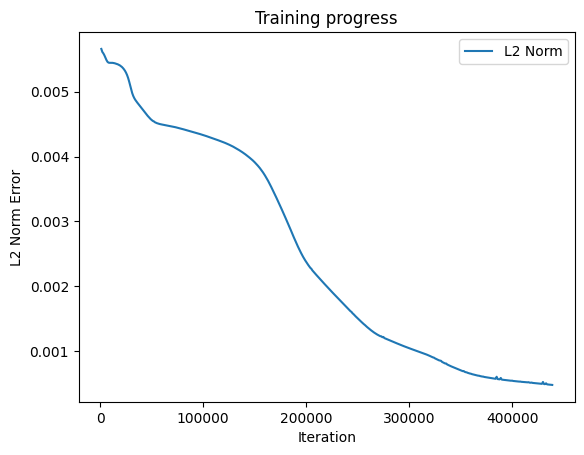

Predicted a: 1.8359776735305786
Predicted b: 2.9976797103881836
Predicted c: 2.989278554916382


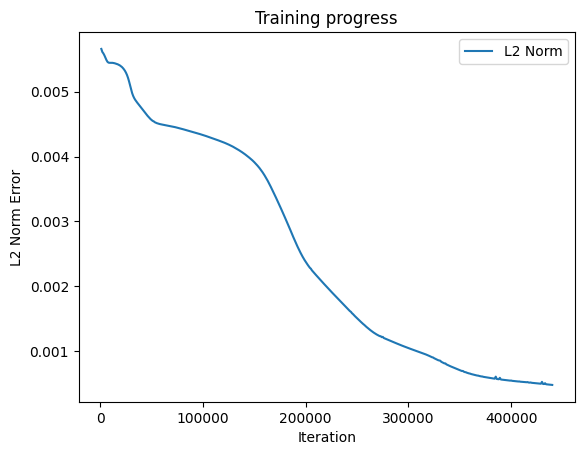

Predicted a: 1.8366096019744873
Predicted b: 2.9977245330810547
Predicted c: 2.989344358444214


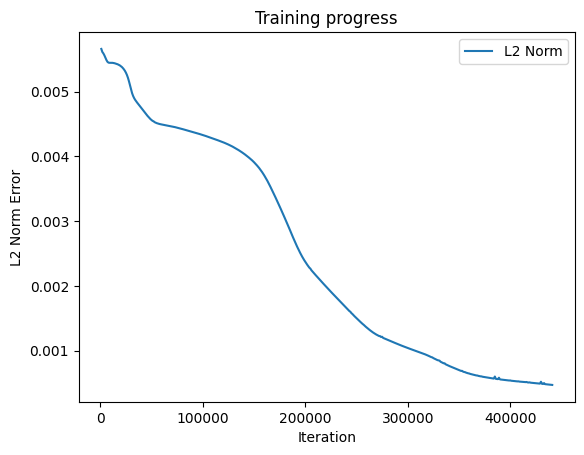

Predicted a: 1.8372458219528198
Predicted b: 2.997767210006714
Predicted c: 2.989410638809204


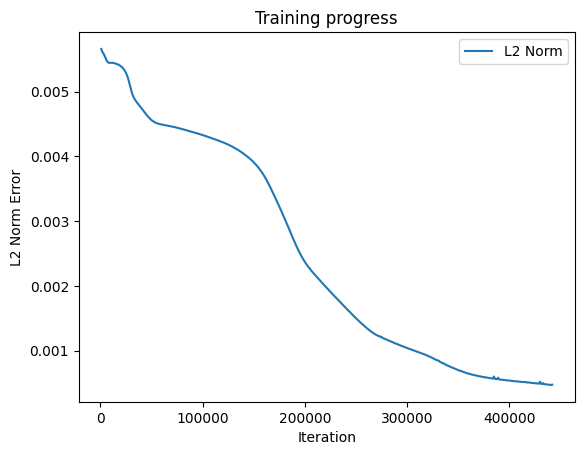

Predicted a: 1.8378868103027344
Predicted b: 2.9978079795837402
Predicted c: 2.9894793033599854


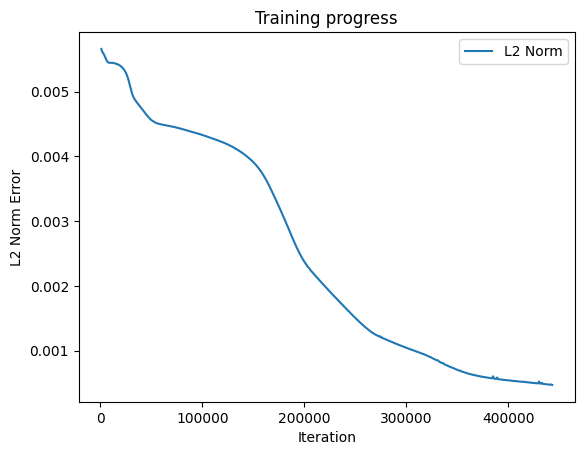

Predicted a: 1.8385306596755981
Predicted b: 2.997847080230713
Predicted c: 2.989548683166504


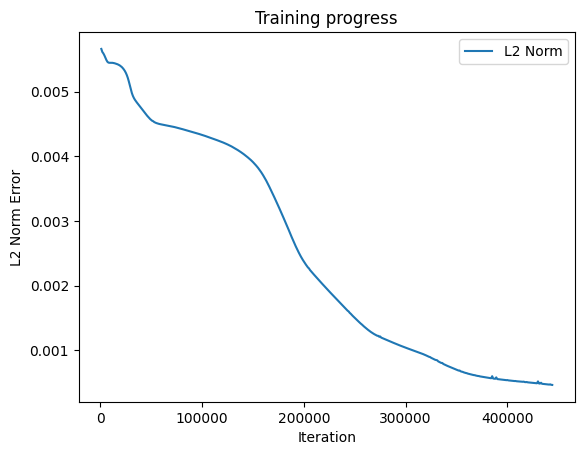

Predicted a: 1.8391799926757812
Predicted b: 2.9978840351104736
Predicted c: 2.9896183013916016


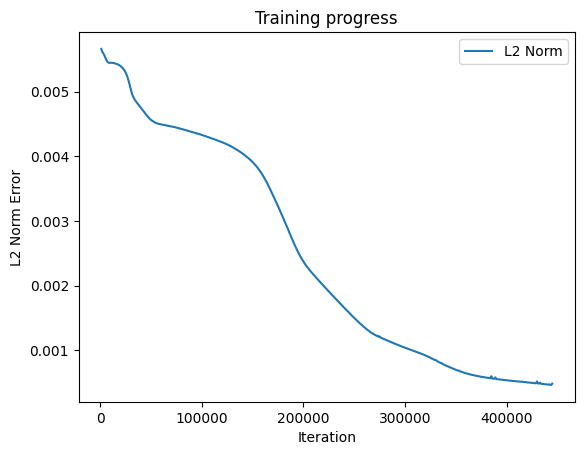

Predicted a: 1.839833378791809
Predicted b: 2.997918128967285
Predicted c: 2.9896903038024902


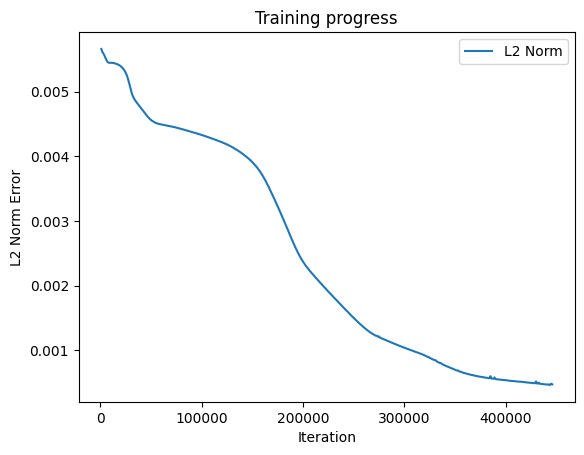

Predicted a: 1.8404943943023682
Predicted b: 2.9979517459869385
Predicted c: 2.989763021469116


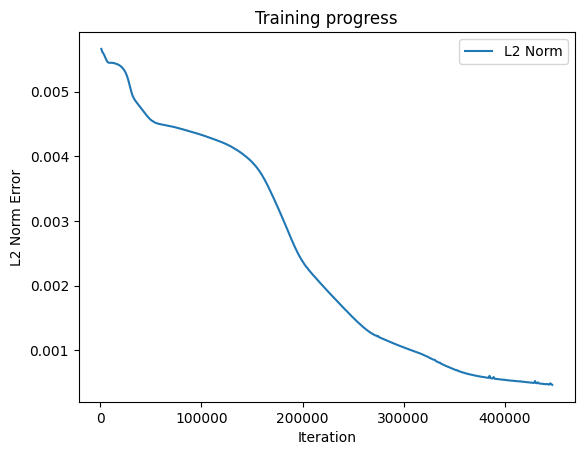

Predicted a: 1.8411600589752197
Predicted b: 2.997980833053589
Predicted c: 2.989837408065796


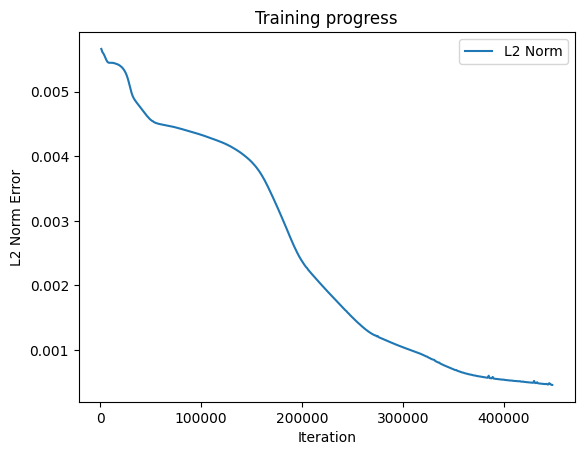

Predicted a: 1.841834306716919
Predicted b: 2.9980101585388184
Predicted c: 2.9899117946624756


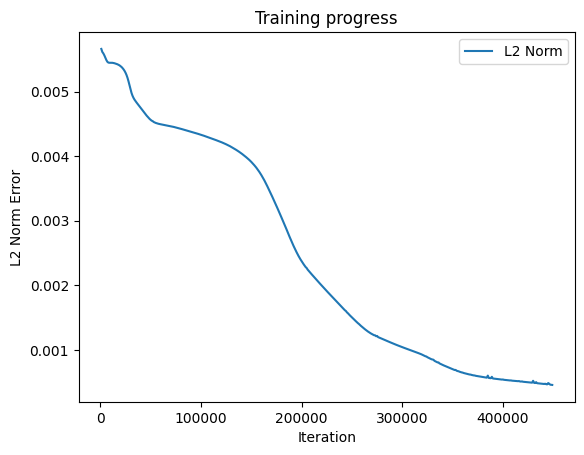

Predicted a: 1.8425153493881226
Predicted b: 2.998037099838257
Predicted c: 2.9899871349334717


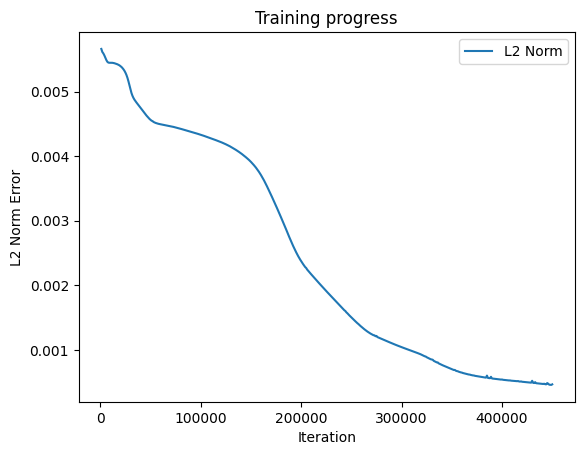

Predicted a: 1.8432068824768066
Predicted b: 2.9980597496032715
Predicted c: 2.9900636672973633


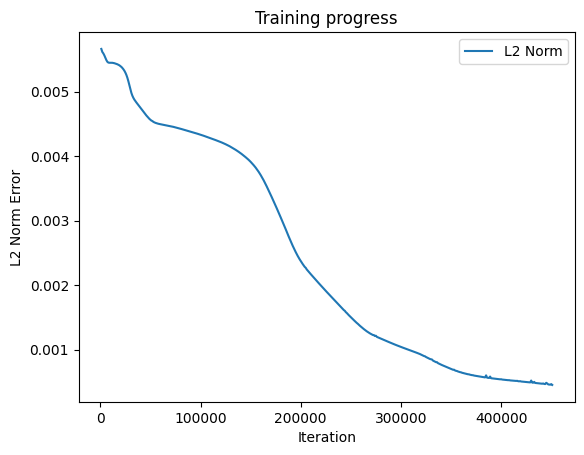

Predicted a: 1.8439013957977295
Predicted b: 2.9980826377868652
Predicted c: 2.990140438079834


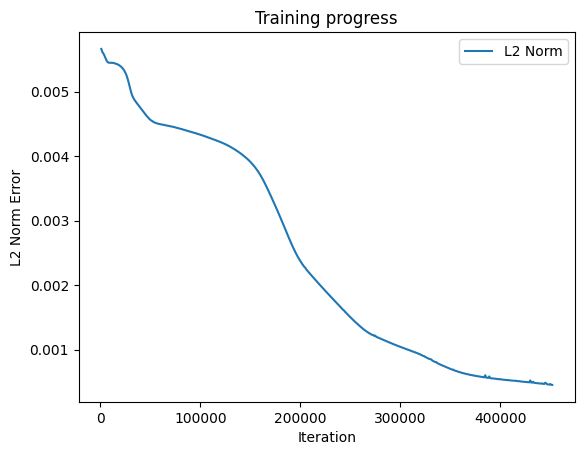

Predicted a: 1.8445981740951538
Predicted b: 2.998102903366089
Predicted c: 2.990220069885254


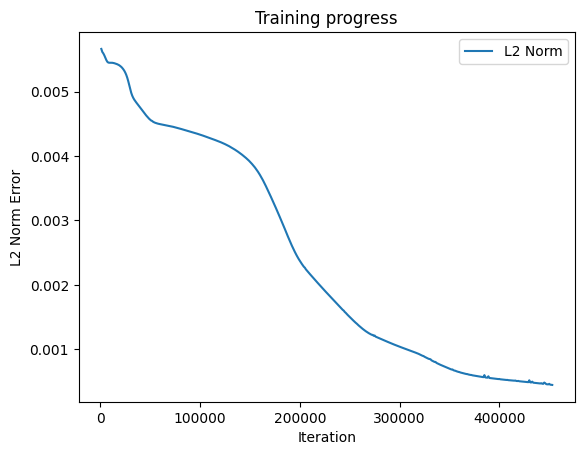

Predicted a: 1.8452792167663574
Predicted b: 2.9981207847595215
Predicted c: 2.990297317504883


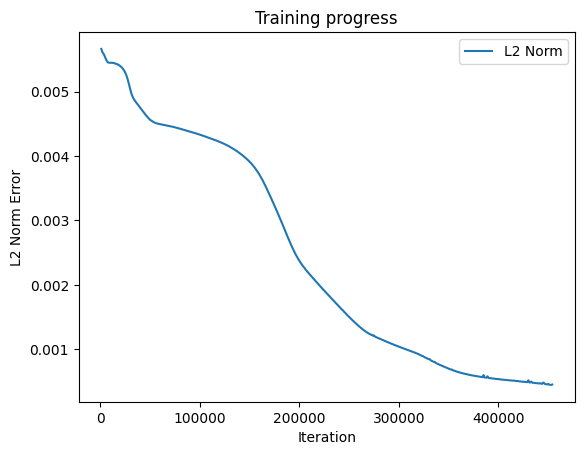

Predicted a: 1.8459405899047852
Predicted b: 2.998141288757324
Predicted c: 2.9903764724731445


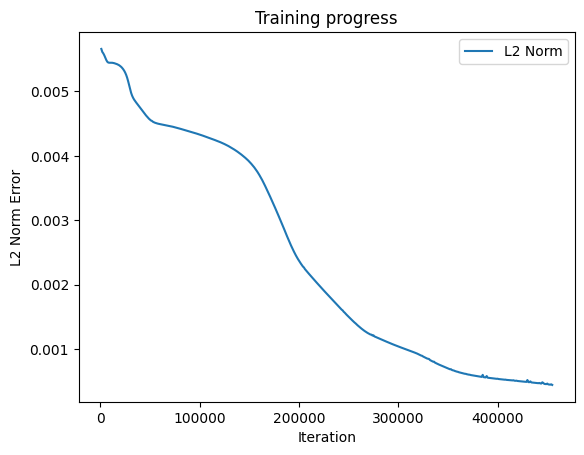

Predicted a: 1.8465867042541504
Predicted b: 2.9981601238250732
Predicted c: 2.9904568195343018


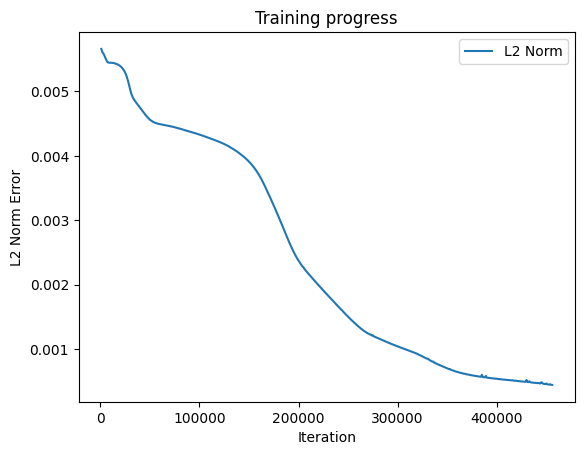

Predicted a: 1.8472340106964111
Predicted b: 2.9981789588928223
Predicted c: 2.990539073944092


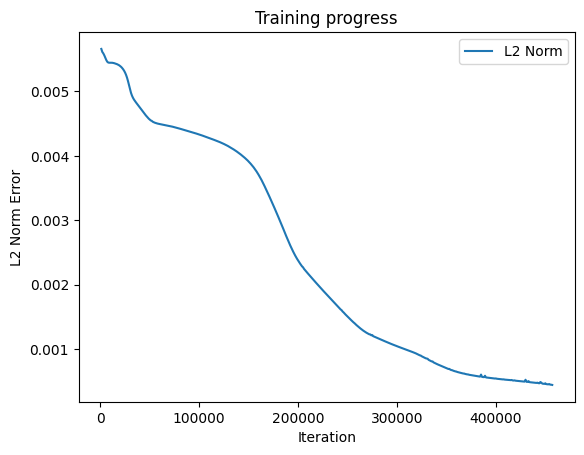

Predicted a: 1.8478893041610718
Predicted b: 2.9981977939605713
Predicted c: 2.9906227588653564


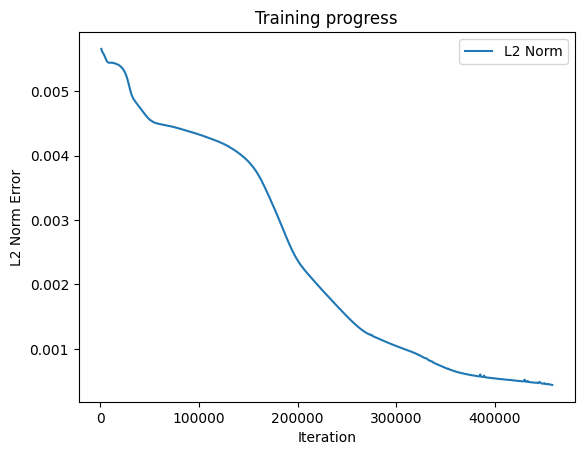

Predicted a: 1.8485506772994995
Predicted b: 2.9982149600982666
Predicted c: 2.9907069206237793


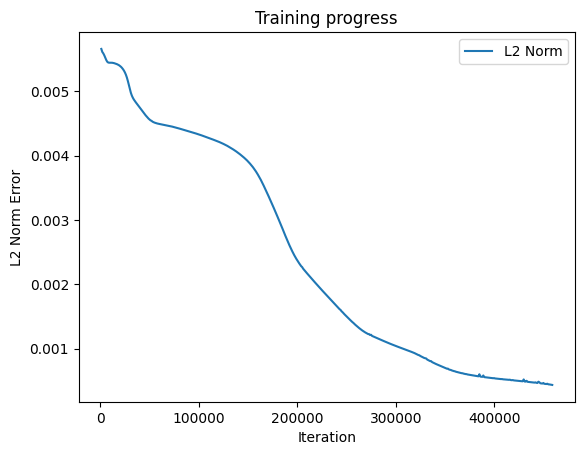

Predicted a: 1.8492202758789062
Predicted b: 2.998231887817383
Predicted c: 2.9907946586608887


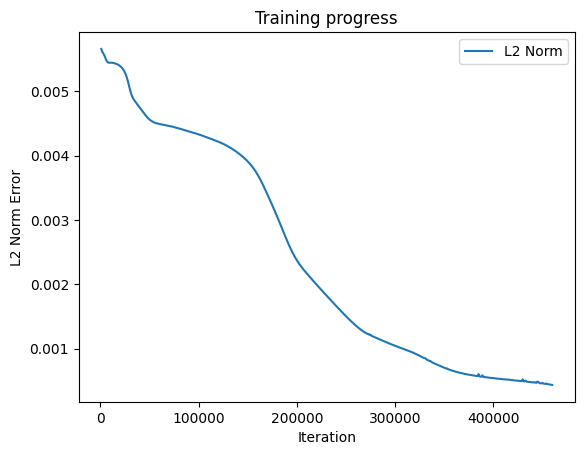

Predicted a: 1.8499034643173218
Predicted b: 2.9982452392578125
Predicted c: 2.9908838272094727


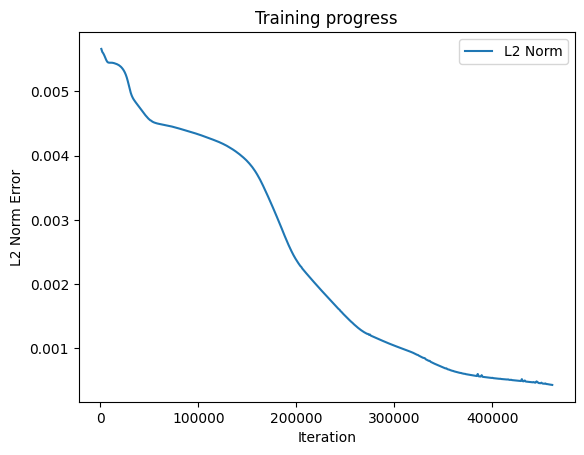

Predicted a: 1.85060453414917
Predicted b: 2.998255729675293
Predicted c: 2.990980863571167


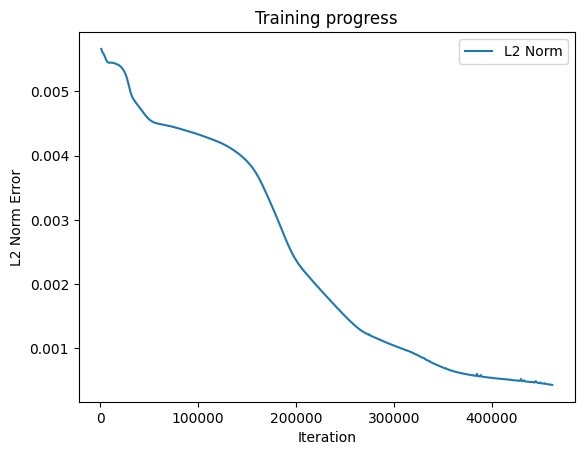

Predicted a: 1.8513299226760864
Predicted b: 2.9982635974884033
Predicted c: 2.9910802841186523


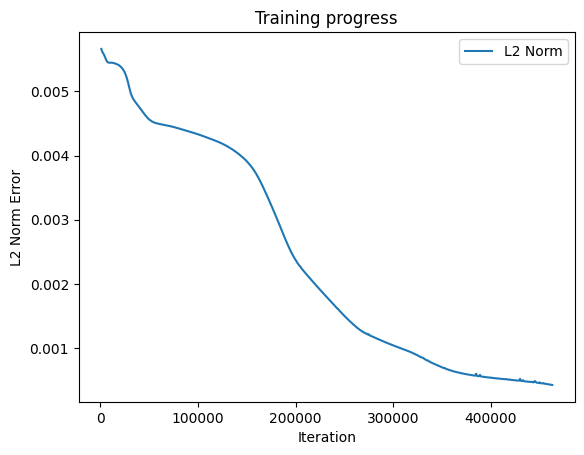

Predicted a: 1.8520854711532593
Predicted b: 2.9982776641845703
Predicted c: 2.9911787509918213


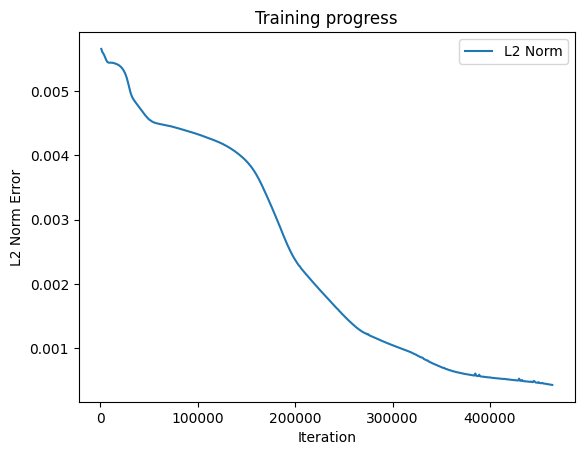

Predicted a: 1.8528627157211304
Predicted b: 2.9982964992523193
Predicted c: 2.9912757873535156


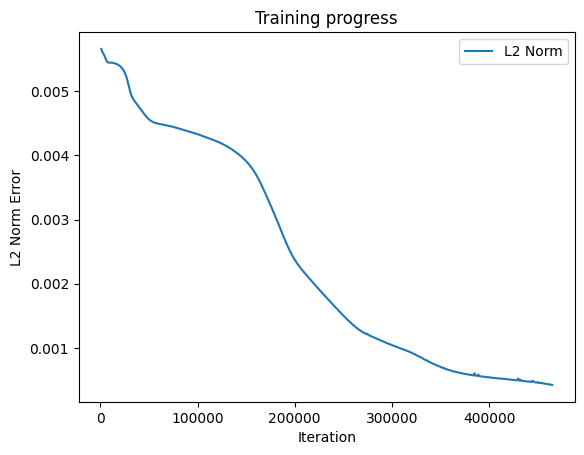

Predicted a: 1.8536430597305298
Predicted b: 2.998316526412964
Predicted c: 2.9913673400878906


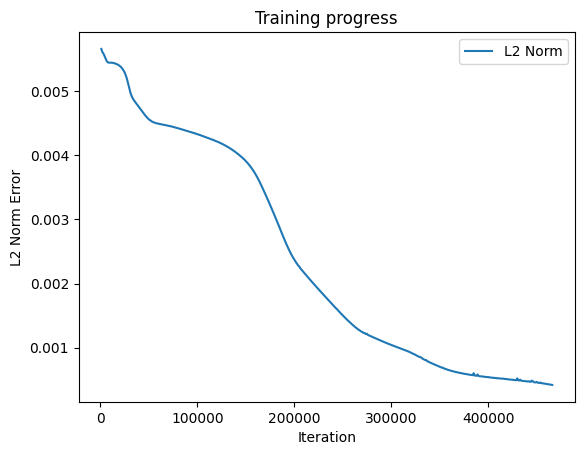

Predicted a: 1.8544358015060425
Predicted b: 2.9983408451080322
Predicted c: 2.991456985473633


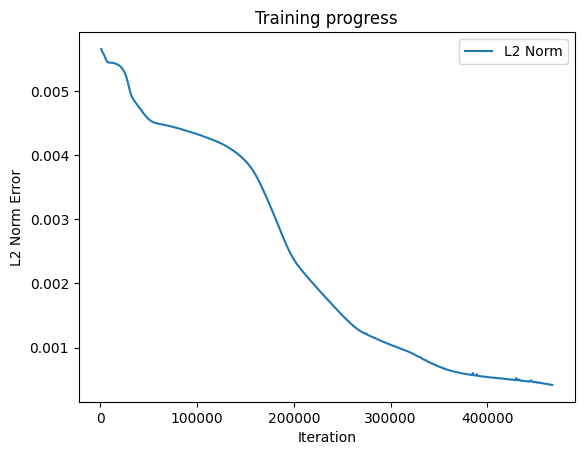

Predicted a: 1.8552387952804565
Predicted b: 2.9983654022216797
Predicted c: 2.9915478229522705


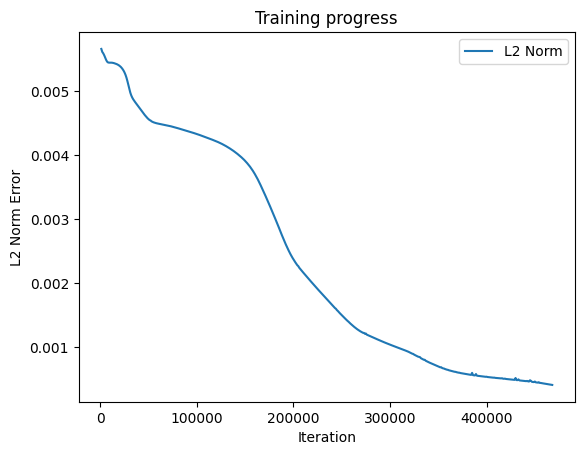

Predicted a: 1.8560441732406616
Predicted b: 2.9983901977539062
Predicted c: 2.9916374683380127


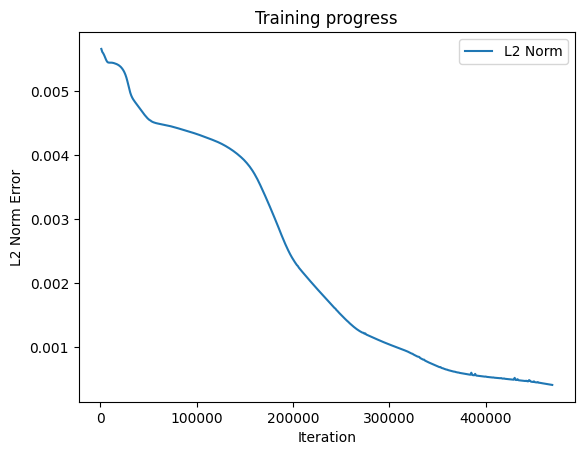

Predicted a: 1.85686194896698
Predicted b: 2.9984219074249268
Predicted c: 2.991727828979492


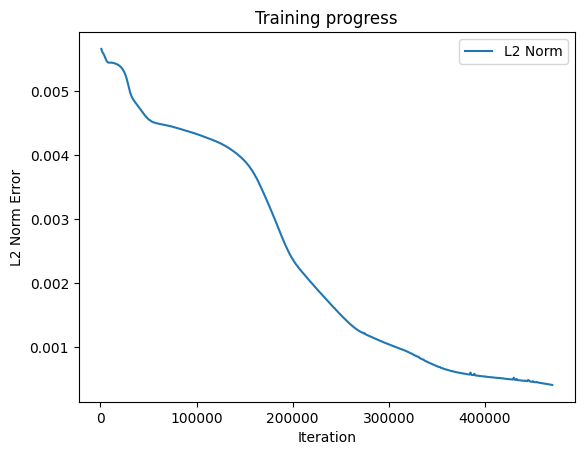

Predicted a: 1.8576939105987549
Predicted b: 2.9984540939331055
Predicted c: 2.991818428039551


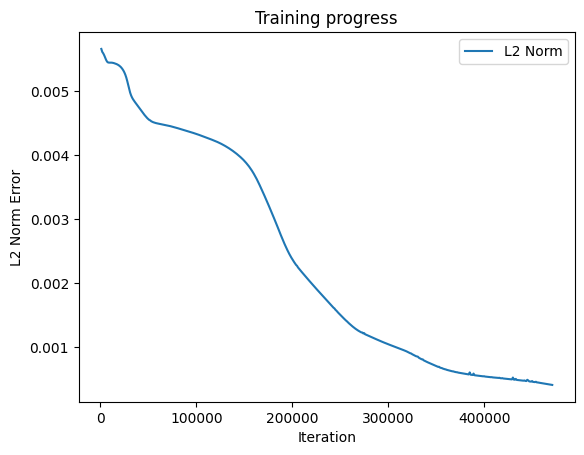

Predicted a: 1.858536720275879
Predicted b: 2.9984869956970215
Predicted c: 2.9919064044952393


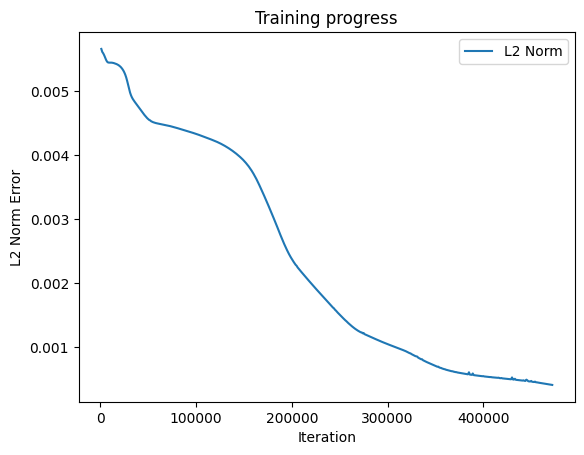

Predicted a: 1.8593955039978027
Predicted b: 2.998521566390991
Predicted c: 2.9919934272766113


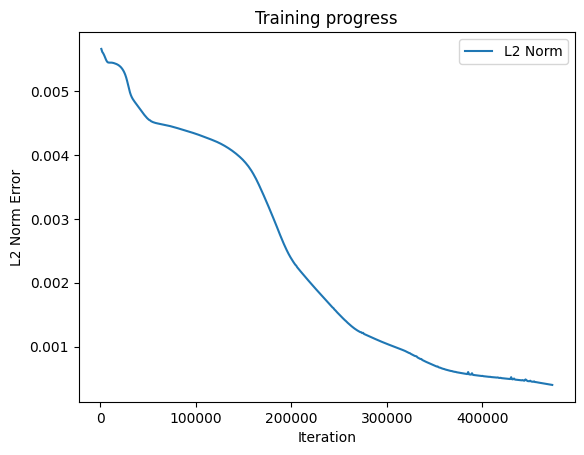

Predicted a: 1.860261082649231
Predicted b: 2.9985568523406982
Predicted c: 2.9920806884765625


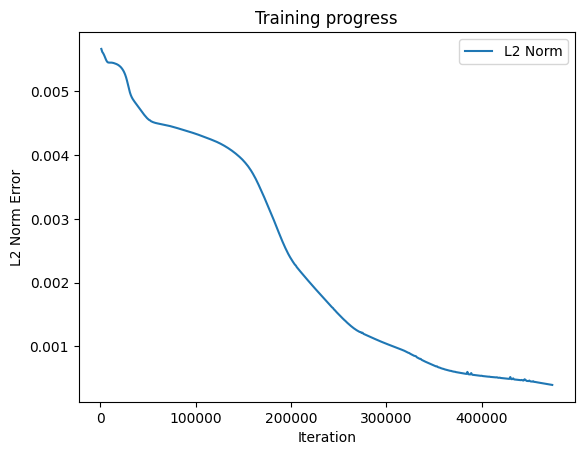

Predicted a: 1.8611397743225098
Predicted b: 2.9985897541046143
Predicted c: 2.9921646118164062


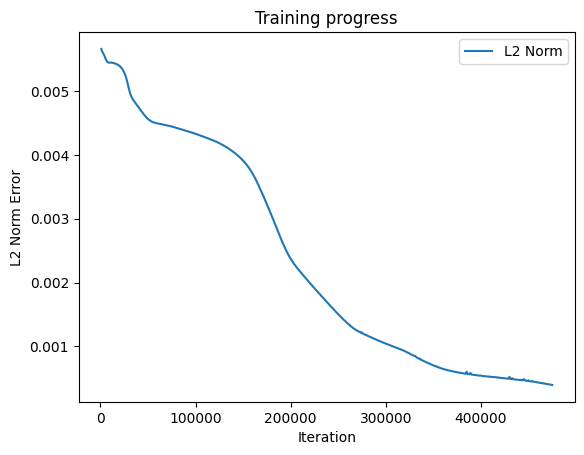

Predicted a: 1.862039566040039
Predicted b: 2.9986329078674316
Predicted c: 2.9922494888305664


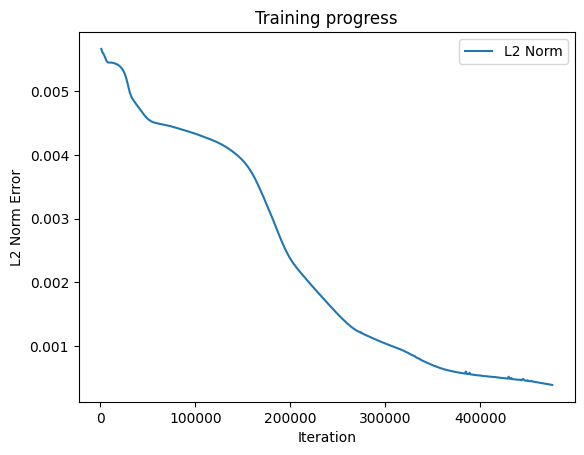

Predicted a: 1.8629553318023682
Predicted b: 2.998678684234619
Predicted c: 2.9923336505889893


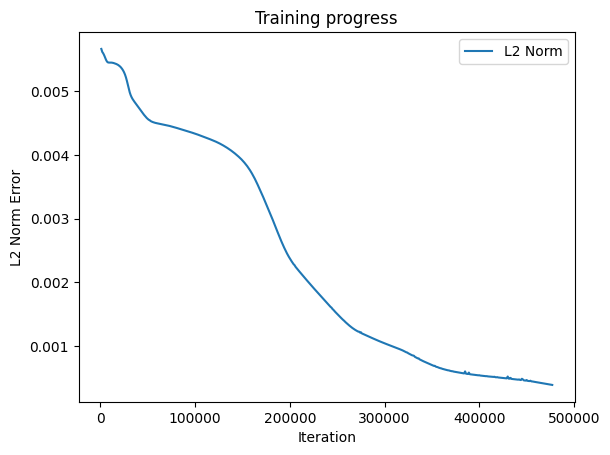

Predicted a: 1.8638794422149658
Predicted b: 2.998723030090332
Predicted c: 2.9924156665802


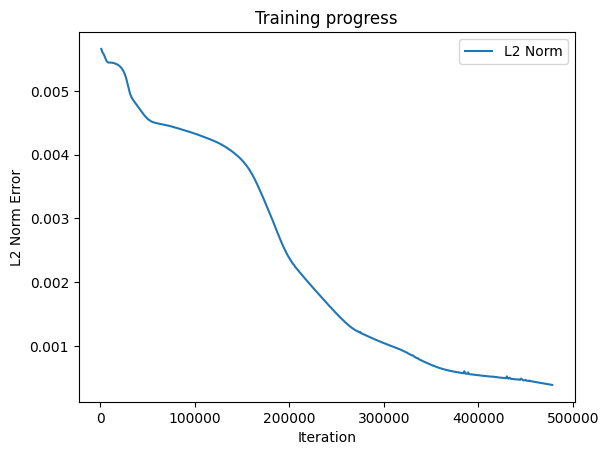

Predicted a: 1.8648146390914917
Predicted b: 2.9987714290618896
Predicted c: 2.992496967315674


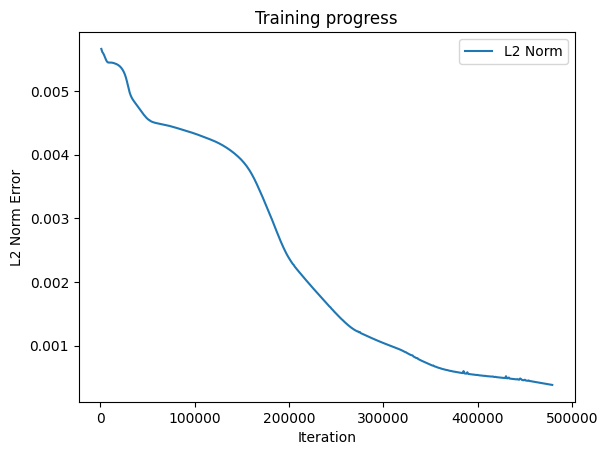

Predicted a: 1.8657704591751099
Predicted b: 2.9988226890563965
Predicted c: 2.9925777912139893


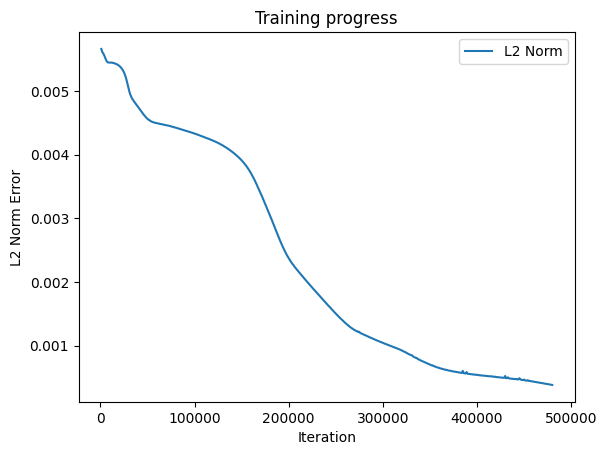

Predicted a: 1.866736650466919
Predicted b: 2.998875856399536
Predicted c: 2.992656946182251


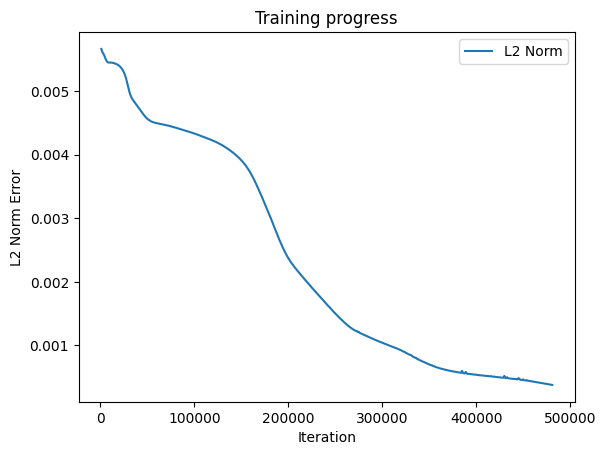

Predicted a: 1.867707371711731
Predicted b: 2.9989285469055176
Predicted c: 2.9927358627319336


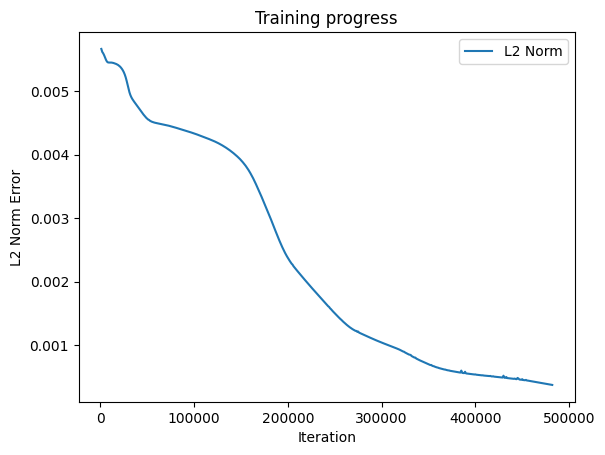

Predicted a: 1.8686832189559937
Predicted b: 2.9989826679229736
Predicted c: 2.9928131103515625


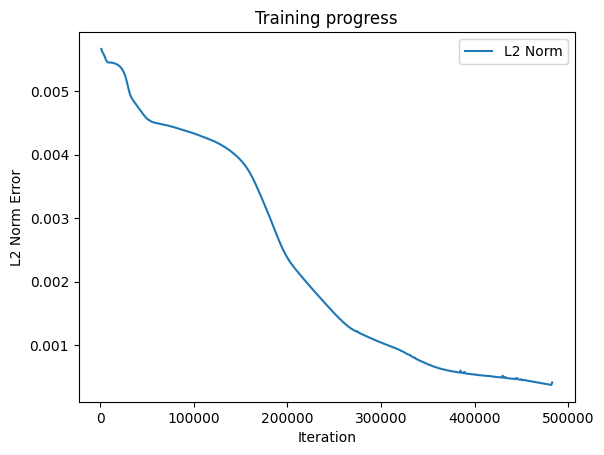

Predicted a: 1.8696774244308472
Predicted b: 2.999040126800537
Predicted c: 2.992887258529663


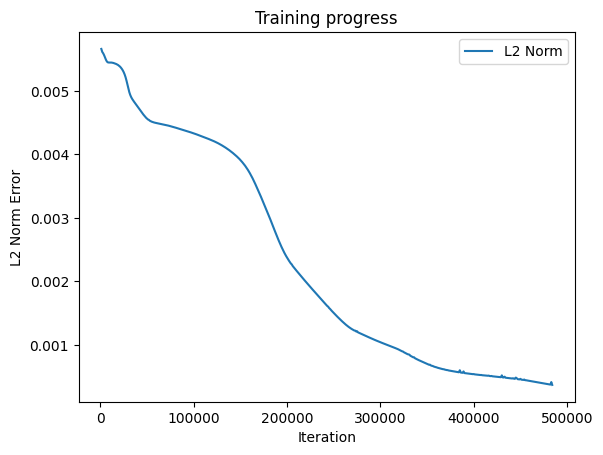

Predicted a: 1.8706659078598022
Predicted b: 2.9990952014923096
Predicted c: 2.9929628372192383


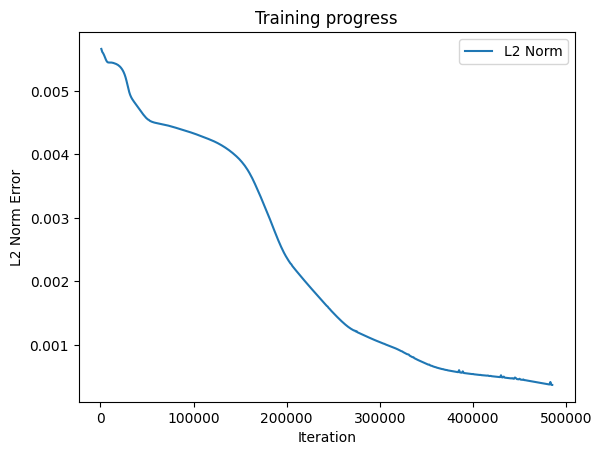

Predicted a: 1.8716682195663452
Predicted b: 2.9991605281829834
Predicted c: 2.993034839630127


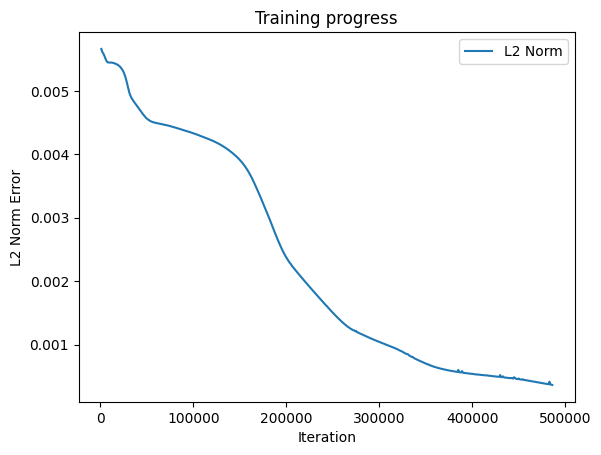

Predicted a: 1.8726716041564941
Predicted b: 2.9992218017578125
Predicted c: 2.9931037425994873


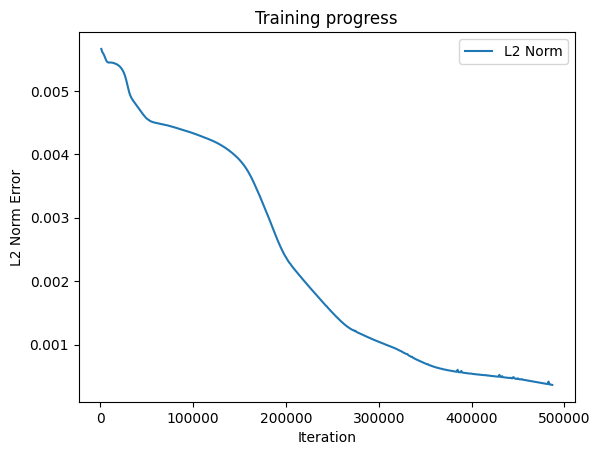

Predicted a: 1.8736658096313477
Predicted b: 2.9992809295654297
Predicted c: 2.9931747913360596


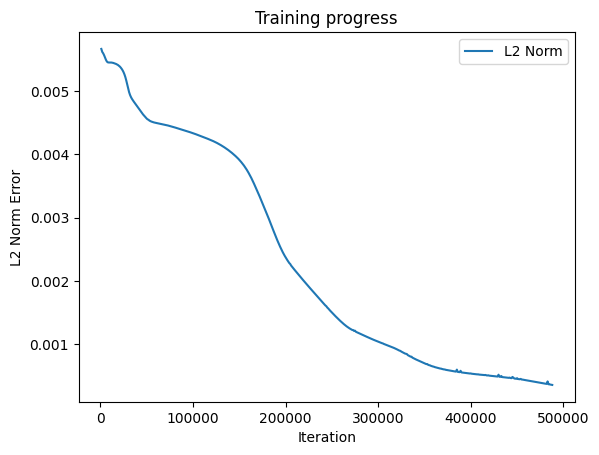

Predicted a: 1.8746541738510132
Predicted b: 2.9993391036987305
Predicted c: 2.993241310119629


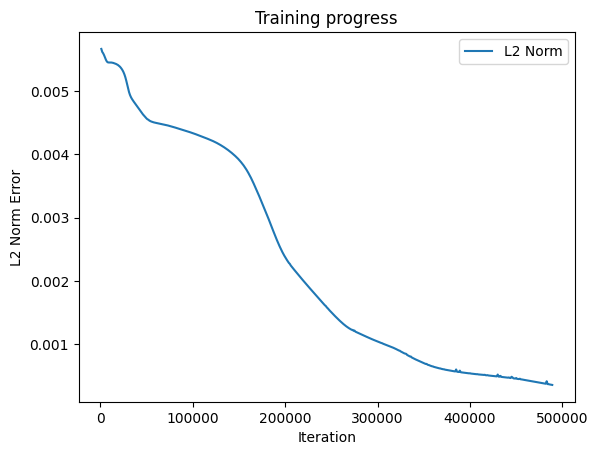

Predicted a: 1.8756579160690308
Predicted b: 2.99940824508667
Predicted c: 2.993304967880249


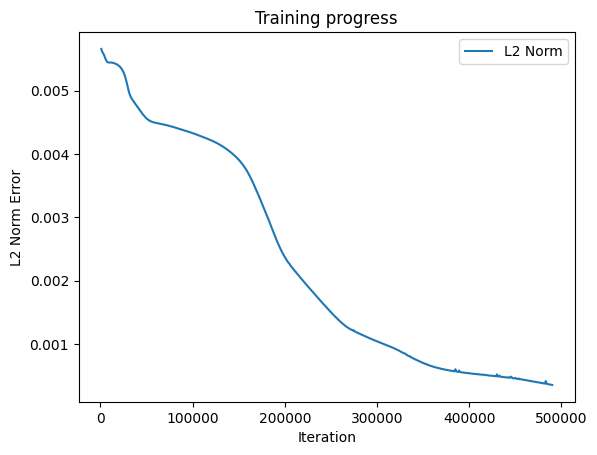

Predicted a: 1.8766692876815796
Predicted b: 2.999476194381714
Predicted c: 2.9933693408966064


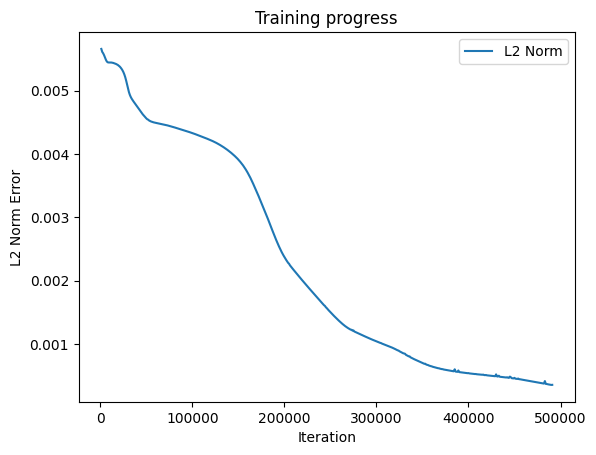

Predicted a: 1.8776655197143555
Predicted b: 2.9995434284210205
Predicted c: 2.9934298992156982


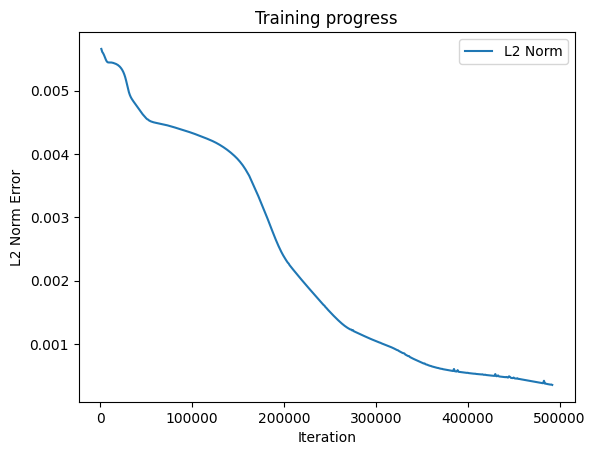

Predicted a: 1.8786574602127075
Predicted b: 2.9996097087860107
Predicted c: 2.9934897422790527


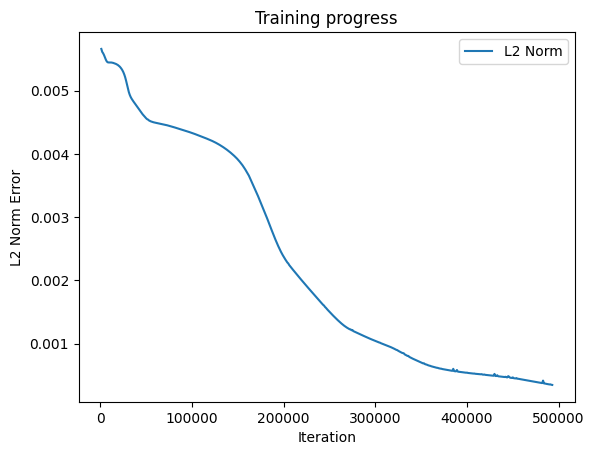

Predicted a: 1.8796521425247192
Predicted b: 2.9996767044067383
Predicted c: 2.9935479164123535


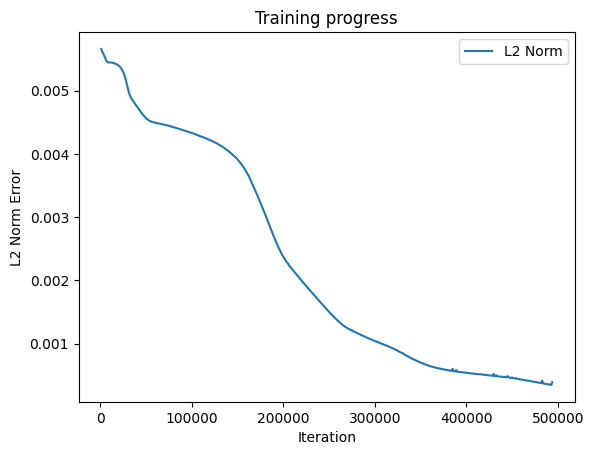

Predicted a: 1.8806588649749756
Predicted b: 2.999746084213257
Predicted c: 2.993603229522705


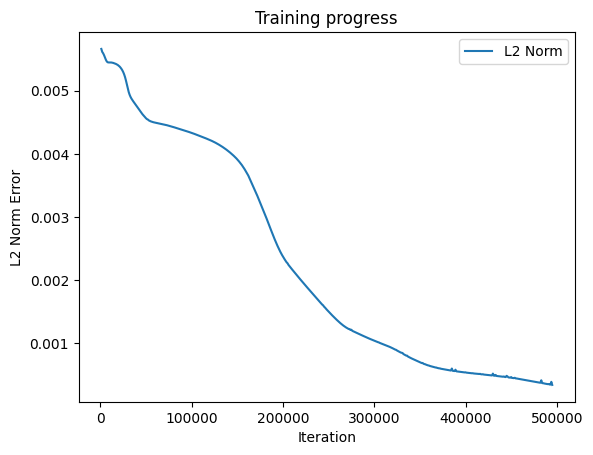

Predicted a: 1.8816639184951782
Predicted b: 2.999814748764038
Predicted c: 2.993651866912842


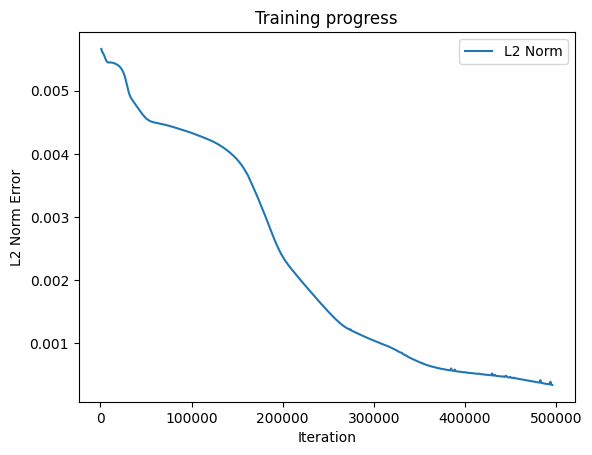

Predicted a: 1.8826736211776733
Predicted b: 2.999884605407715
Predicted c: 2.99369478225708


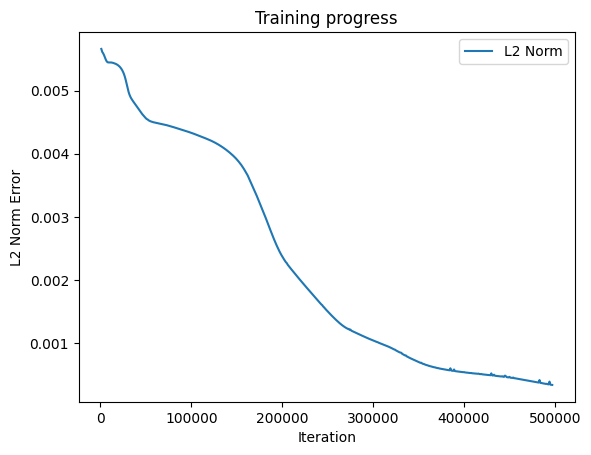

Predicted a: 1.8836833238601685
Predicted b: 2.9999561309814453
Predicted c: 2.9937355518341064


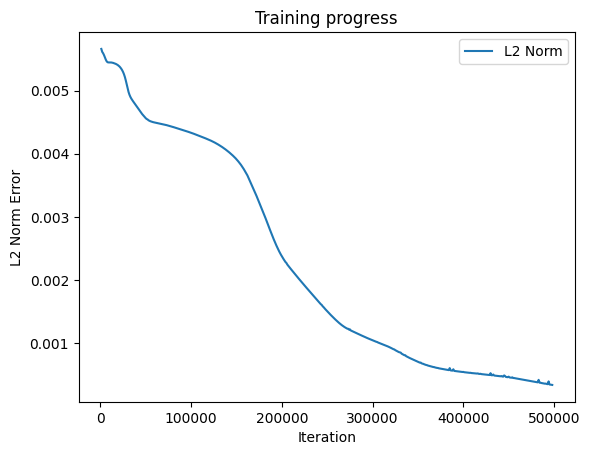

Predicted a: 1.8846731185913086
Predicted b: 3.0000271797180176
Predicted c: 2.993771553039551


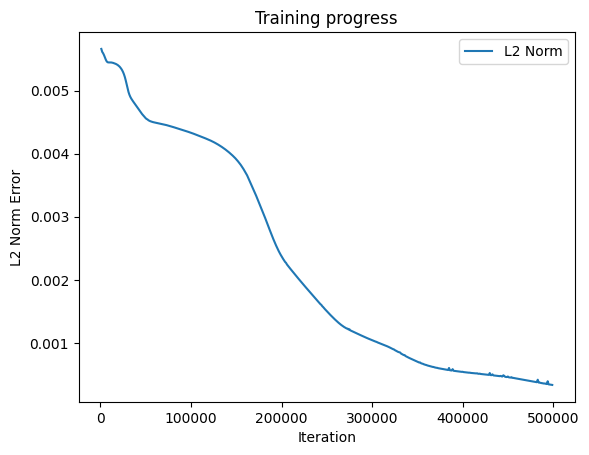

Predicted a: 1.8856581449508667
Predicted b: 3.0000972747802734
Predicted c: 2.9938056468963623


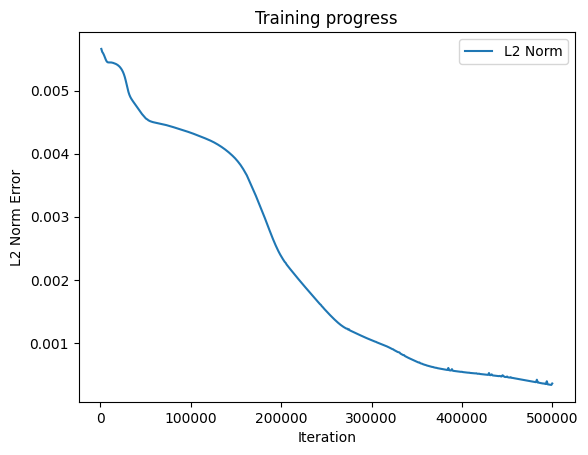

Predicted a: 1.8866080045700073
Predicted b: 3.0001707077026367
Predicted c: 2.9938366413116455


In [ ]:
"""PINN
Finally, we add the underlying differential equation ("physics loss") to the loss function.

The physics loss aims to ensure that the learned solution is consistent with the underlying differential equation. This is done by penalising the residual of the differential equation over a set of locations sampled from the domain.

Here we evaluate the physics loss at 30 points uniformly spaced over the problem domain
. We can calculate the derivatives of the network solution with respect to its input variable at these points using pytorch's autodifferentiation features, and can then easily compute the residual of the differential equation using these quantities.
"""
# train PINN to fit training data
x_physics = torch.rand(500,2).requires_grad_(True)# sample locations over the problem domain
#print("x_physics=\n", x_physics)
x_b = torch.rand(100,2)
x_b1 = torch.clone(x_b)
x_b1[:,0]=0
x_b1.requires_grad_(True)
x_b2 = torch.clone(x_b)
x_b2[:,1]=1
x_b2.requires_grad_(True)
x_b3 = torch.clone(x_b)
x_b3[:,0]=1
x_b3.requires_grad_(True)
x_b4 = torch.clone(x_b)
x_b4[:,1]=0
x_b4.requires_grad_(True)

torch.manual_seed(123)
model = FCN(2,1,32,3)
#b_pred = model.b.item()
#c_pred = model.c.item()

#print(f'Predicted a: {a_pred}')
#print(f'Predicted b: {b_pred}')
#print(f'Predicted c: {c_pred}')
#optimizer = torch.optim.Adam(model.parameters(),lr=1e-4)
optimizer = torch.optim.Adam(model.parameters(),lr=1e-5)
def closure():
    optimizer.zero_grad() #Resets the gradients of all optimized torch.Tensors.

    # compute the "data loss"
    uh = model(X_data)
    loss1 = torch.mean((uh-u_data)**2)# use mean squared error

    # compute the "physics loss"
    uhp = model(x_physics)

    # compute the approximate solution on the Boundary points
    uhb1 = model(x_b1)
    uhb2 = model(x_b2)
    uhb3 = model(x_b3)
    uhb4 = model(x_b4)
    # Compute the first-order gradients with respect to x and y
    grad_u = torch.autograd.grad(outputs=uhp, inputs=x_physics, grad_outputs=torch.ones_like(uhp), create_graph=True)[0]
    d_uhb1 = torch.autograd.grad(outputs=uhb1, inputs=x_b1, grad_outputs=torch.ones_like(uhb1), create_graph=True)[0]
    d_uhb4 = torch.autograd.grad(outputs=uhb4, inputs=x_b4, grad_outputs=torch.ones_like(uhb4), create_graph=True)[0]
    # Extract the gradients
    grad_u_x = grad_u[:, 0].requires_grad_(True)
    grad_u_y = grad_u[:, 1].requires_grad_(True)

# Compute the second-order gradients (second derivatives)
    laplace_u_x = torch.autograd.grad(outputs=grad_u_x, inputs=x_physics, grad_outputs=torch.ones_like(grad_u_x), create_graph=True)[0][:, 0]

    laplace_u_y = torch.autograd.grad(outputs=grad_u_y, inputs=x_physics, grad_outputs=torch.ones_like(grad_u_y), create_graph=True)[0][:, 1]

# Sum the second-order derivatives to get the Laplacian
    laplace_u = laplace_u_x + laplace_u_y
    physics = laplace_u-model.a*torch.sin(model.b*pi*x_physics[:,0])*torch.sin(model.c*pi*x_physics[:,1])#
    loss2 = torch.mean(physics**2)
    loss3 = torch.mean(uhb1**2*+uhb2**2*+uhb3**2*+uhb4**2)
    #loss4 = torch.mean((-(1/((model.b**2+model.c**2)*(pi**2)))*torch.sin(model.b*pi*x_b2)*torch.sin(model.c*pi)-uhb2)**2)
    #loss5 = torch.mean((-(1/((model.b**2+model.c**2)*(pi**2)))*torch.sin(model.b*pi)*torch.sin(model.c*pi*x_b3)-uhb3)**2)
    #loss6 = torch.mean((-(model.b/((model.b**2+model.c**2)*(pi)))*torch.sin(model.c*pi*x_b1[:,1])-d_uhb1[:,1])**2)
    #loss7 = torch.mean((-(model.c/((model.b**2+model.c**2)*(pi)))*torch.sin(model.b*pi*x_b4[:,0])-d_uhb4[:,0])**2)

    # backpropagate joint loss
    loss = loss1 + 10e-5*(loss2) + 10e-5*(loss3 )#+ 10e-4*(loss4 +loss5)  +10e-4*(loss6 + loss7)  # add all loss terms together
    loss.backward()
    return loss

j=[]
L2_Error=[]
files = []
for i in range(500000):

    optimizer.step(closure)
    #mse_loss = nn.MSELoss()
    #print(yh.shape)
    #print("loss=\n", loss)
    # plot the result as training progresses
    if (i+1) % 1000 == 0 and i>600:
        j.append(i)
        tensorj = torch.tensor(j)
        uh = model(X).detach()
        #print('uh=\n',uh)
        xp = x_physics.detach()
        # Compute the squared differences
        squared_diff = (uh- u)**2

        # Perform the weighted sum of the squared differences
        # For simplicity, assuming uniform weights (each point has the same weight)
        weighted_squared_diff = squared_diff * weights
        l2_error = torch.sqrt(torch.sum(weighted_squared_diff))
        L2_Error.append(l2_error)
        tensor_l2_Error = torch.tensor(L2_Error)

        #print("l2_norm dim=\n",l2_norm.size())
        #print(tensorj)
        plt.plot(tensorj, tensor_l2_Error, label="L2 Norm")
        #plt.plot(tensor, l1_norm, label="L1 Norm")

        #plt.plot(tensorj, tensor_l2_Error, label="L2 Norm")
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("L2 Norm Error")
        plt.title("Training progress")
        #print("l2=\n", l2_norm)
        #plot_result(x,y,x_data,y_data,yh,xp)

        file = "plots/pinn_%.8i.png"%(i+1)
        #plt.savefig(file, bbox_inches='tight', pad_inches=0.1, dpi=100, facecolor="white")
        files.append(file)

        if (i+1) % 1000 == 0: plt.show()
        else: plt.close("all")
        a_pred = model.a.item()
        b_pred = model.b.item()
        c_pred = model.c.item()

        print(f'Predicted a: {a_pred}')
        print(f'Predicted b: {b_pred}')
        print(f'Predicted c: {c_pred}')

#save_gif_PIL("pinn.gif", files, fps=20, loop=0)

In [ ]:
plt.figure()
#plt.plot(x[:,0], x[:,1], label="Exact solution")
#fig, ax = plt.subplots()
#im = ax.imshow(u, interpolation='bilinear', cmap=cm.RdYlGn,
#               origin='lower', extent=[0, 1, 0, 1],
#               vmax=abs(u).max(), vmin=-abs(u).max())
plt.scatter(X[:, 0], X[:, 1], c=uh, cmap='viridis')
plt.colorbar(label='Color Value (uh)')

plt.scatter(x_data, y_data, color="tab:orange", label="Training data")
plt.legend()
plt.xlabel("x")
plt.ylabel("y")
plt.show()

NameError: name 'plt' is not defined

In [ ]:
# Accessing specific parameters
for name, param in model.named_parameters():
    if param.requires_grad:
                print(f"{name}: {param.size()}")
    if 'weight' in name:
        #print(f'Parameter: {name}, Value: {param.data}')
        print(f'Parameter: {name}, max: {param.data.max()}')
        print(f'Parameter: {name}, min: {param.data.min()}')
# Modifying parameters
#with torch.no_grad():  # Ensure no gradients are computed
#    for param in model.parameters():
#        param.add_(0.1)  # Example operation

a: torch.Size([])
b: torch.Size([])
c: torch.Size([])
fcs.0.weight: torch.Size([32, 2])
Parameter: fcs.0.weight, max: 0.7717593908309937
Parameter: fcs.0.weight, min: -0.7242740988731384
fcs.0.bias: torch.Size([32])
fch.0.0.weight: torch.Size([32, 32])
Parameter: fch.0.0.weight, max: 1.1358166933059692
Parameter: fch.0.0.weight, min: -1.3378362655639648
fch.0.0.bias: torch.Size([32])
fch.1.0.weight: torch.Size([32, 32])
Parameter: fch.1.0.weight, max: 0.751672625541687
Parameter: fch.1.0.weight, min: -0.2836591601371765
fch.1.0.bias: torch.Size([32])
fce.weight: torch.Size([1, 32])
Parameter: fce.weight, max: 0.29230719804763794
Parameter: fce.weight, min: -0.16695068776607513
fce.bias: torch.Size([1])


In [ ]:
"""Normal neural network
Next, we train a standard neural network (fully connected network) to fit these training points.

We find that the network is able to fit the solution very closely in the vicinity of the training points, but does not learn an accurate solution outside of them.
"""
def plot_result(x,y,u,x_data,y_data,u_data,uh,tensorj,tensor_l2_Error,xp=None):
    "Pretty plot training results"
    plt.figure(figsize=(8,4))
    #plt.plot(x,u, color="grey", linewidth=2, alpha=0.8, label="Exact solution")
    plt.scatter(x,uh, color="tab:blue", linewidth=4, alpha=0.8, label="Neural network prediction")
    plt.scatter(x_data, u_data, s=60, color="tab:orange", alpha=0.4, label='Training data')
    #if xp is not None:
    #    plt.scatter(xp, -0*torch.ones_like(xp), s=60, color="tab:green", alpha=0.4,
    #                label='Physics loss training locations')
    l = plt.legend(loc=(1.01,0.34), frameon=False, fontsize="large")
    plt.setp(l.get_texts(), color="k")
    plt.xlim(-0.05, 1.05)
    plt.ylim(-1.1, 1.1)
    plt.text(1.065,0.7,"Training step: %i"%(i+1),fontsize="xx-large",color="k")
    plt.axis("off")



# train standard neural network to fit training data
torch.manual_seed(123)
# Instantiate the model
model = FCN(2,1,32,3)

# Print model parameters
#for name, param in model.named_parameters():
#    print(name, param.size())

# Set up the optimizer
#optimizer = torch.optim.Adam(model.parameters(),lr=1e-3)
optimizer = torch.optim.LBFGS(model.parameters(),lr=1e-2)
def closure():
    optimizer.zero_grad()
  # Get the model output through Forward pass
    uh = model(X_data)
    # Bakward propagation is performed to get the optimazed parameters using loss function
    loss = torch.mean((uh-u_data)**2)# use mean squared error
    #print("loss=\n", loss)
    #print("loss.requires_grad=\n",loss.requires_grad)
    loss.backward() #Backward pass is performed to compute gradients.
    return loss

files = []
j=[]
L2_Error=[]
# Training loop
for i in range(100000):

    #print("loss.grad=\n",loss.grad)
    optimizer.step(closure) #The model parameters are updated here """


    # plot the result as training progresses
    if (i+1) % 100 == 0: #and i>6000:
        j.append(i)
        tensorj = torch.tensor(j)
        uh = model(X).detach()
        # Compute the squared differences
        squared_diff = (uh- u)**2

        # Perform the weighted sum of the squared differences
        # For simplicity, assuming uniform weights (each point has the same weight)
        weighted_squared_diff = squared_diff * weights
        l2_error = torch.sqrt(torch.sum(weighted_squared_diff))
        #plot_result(x,y,u,x_data,y_data,u_data,uh)
        #l2_norm = torch.sqrt(mse_loss(uh,u))
        #l1_norm = torch.sqrt(torch.norm(uh-u, p=1))

        L2_Error.append(l2_error)
        tensor_l2_Error = torch.tensor(L2_Error)
        #print("L2 Norm =\n", l2_norm)
        #print("L1 Norm =\n", l1_norm)
        #print("l2_norm dim=\n",l2_norm.size())
        #print(tensorj)
        plt.plot(tensorj, tensor_l2_Error, label="L2 Norm")
        #plt.plot(tensor, l1_norm, label="L1 Norm")

        #plt.plot(tensorj, tensor_l2_Error, label="L2 Norm")
        plt.legend()
        plt.xlabel("Iteration")
        plt.ylabel("L2 Norm Error")
        plt.title("Training progress")
        file = "plots/nn_%.8i.png"%(i+1)
        #plt.savefig(file, bbox_inches='tight', pad_inches=0.1, dpi=100, facecolor="white")
        files.append(file)

        if (i+1) % 100 == 0: plt.show()
        else: plt.close("all")
        b_pred = model.b.item()
        c_pred = model.c.item()

        #print(f'Predicted a: {a_pred}')
        print(f'Predicted b: {b_pred}')
        print(f'Predicted c: {c_pred}')

#save_gif_PIL("nn.gif", files, fps=20, loop=0)


KeyboardInterrupt: 